`Notebook: 02_eda.ipynb`
- Purpose:

   - Analyze dataset statistics.
   - Visualize example images and their masks.
   - Tackle the challenge question 

**Exploratory Data Analysis (EDA)**

`Participants must analyze the dataset to understand key market trends, correlations, and feature importance for forecasting electricity prices.`

1. Market Trends & Price Fluctuations
- How do electricity prices fluctuate hourly, daily, and weekly across different countries?
- How do electricity consumption patterns change in the same timeframes, and how does this impact pricing?
- How does electricity generation (actual vs. forecast) align with price trends?
- What patterns emerge from scheduled commercial exchanges and cross-border physical flows?

## Packages Import

In [1]:
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, Normalize
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests, ccf
import numpy as np
import plotly.express as px
from datetime import datetime
import geopandas as gpd
import warnings
from pathlib import Path
import yaml
from tqdm import tqdm
import pickle
import holidays

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)


# sys.path.append("../scripts")

import plotly.io as pio
pio.renderers.default = 'vscode'  # or 'notebook'

sys.path.append(os.path.abspath("../scripts"))  # Adjust the path
os.chdir(os.path.dirname(os.path.abspath("__file__")))  # Set working directory

from utils import *


## Dataset Loading

In [2]:
with open("../datasets/processed/cleaned_dfs.pkl", "rb") as f:
    cleaned_dfs = pickle.load(f)

print("Powercast datasets dictionary loaded successfully!")

cleaned_dfs.keys()

Powercast datasets dictionary loaded successfully!


dict_keys(['Actual_consumption_202301010000_202503050000_Quarterhour.csv', 'Actual_generation_202301010000_202503050000_Quarterhour.csv', 'Automatic_Frequency_Restoration_Reserve_202301010000_202503050000_Quarterhour.csv', 'Balancing_energy_202301010000_202503050000_Quarterhour_Month.csv', 'Costs_of_TSOs__without_costs_of_DSOs__202301010000_202503050000_Month.csv', 'Cross-border_physical_flows_202301010000_202503050000_Quarterhour.csv', 'Day-ahead_prices_202301010000_202503050000_Hour.csv', 'Exported_balancing_services_202301010000_202503050000_Quarterhour.csv', 'Forecasted_consumption_202301010000_202503050000_Quarterhour.csv', 'Forecasted_generation_Day-Ahead_202301010000_202503050000_Hour_Quarterhour.csv', 'Frequency_Containment_Reserve_202301010000_202503050000_Quarterhour.csv', 'Generation_Forecast_Intraday_202301010000_202503050000_Quarterhour.csv', 'Imported_balancing_services_202301010000_202503050000_Quarterhour.csv', 'Installed_generation_capacity_202301010000_202503050000_Ye

In [3]:
with open("../datasets/processed/processed_dfs.pkl", "rb") as f:
    processed_dfs = pickle.load(f)

print("Powercast processed datasets dictionary loaded successfully!")

processed_dfs.keys()

Powercast processed datasets dictionary loaded successfully!


dict_keys(['df_actual_consum_quarterhourly', 'df_actual_gen_quarterhourly', 'df_auto_freq_restore_quarterhourly', 'df_balancing_energy_monthly', 'df_tso_costs_monthly', 'df_cross_border_quarterhourly', 'df_day_ahead_price_hourly', 'df_exported_balancing_quarterhourly', 'df_forecasted_consum_quarterhourly', 'df_forecasted_gen_quarterhourly', 'df_freq_containm_quarterhourly', 'df_gen_forecast_quarterhourly', 'df_imported_balancing_quarterhourly', 'df_installed_gen_yearly', 'df_manual_freq_quarterhourly', 'df_scheduled_exchanges_quarterhourly'])

## 1. Market Trends & Price Fluctuations

Participants must analyze the dataset to understand key market trends, correlations, and feature importance for forecasting electricity prices.dataset before targeting the evaluation criteria questions

### 1.1 How do electricity prices fluctuate hourly, daily, and weekly across different countries?

- First we need to look at the dataset(s) that can address this question effectively and confirm the countries present

Required Datasets

- Dataset: Day-ahead_prices_202301010000_202503050000_Hour.csv

Key Columns:

  - datetime (timestamp)
  - Country-wise electricity prices (germany_price_€/mwh, france_price_€/mwh, etc.)

- Analysis Steps:

  - Resample to daily & weekly averages.
  - Visualize hourly trends and compare across countries.
  - Identify seasonal patterns and anomalies.

In [4]:

# Extract each processed DataFrame from the dictionary
df_actual_consum_quarterhourly = processed_dfs['df_actual_consum_quarterhourly']
df_actual_gen_quarterhourly = processed_dfs['df_actual_gen_quarterhourly']
df_auto_freq_restore_quarterhourly = processed_dfs['df_auto_freq_restore_quarterhourly']
df_balancing_energy_monthly = processed_dfs['df_balancing_energy_monthly']
df_tso_costs_monthly = processed_dfs['df_tso_costs_monthly']
df_cross_border_quarterhourly = processed_dfs['df_cross_border_quarterhourly']
df_day_ahead_price_hourly = processed_dfs['df_day_ahead_price_hourly']
df_exported_balancing_quarterhourly = processed_dfs['df_exported_balancing_quarterhourly']
df_forecasted_consum_quarterhourly = processed_dfs['df_forecasted_consum_quarterhourly']
df_forecasted_gen_quarterhourly = processed_dfs['df_forecasted_gen_quarterhourly']
df_freq_containm_quarterhourly = processed_dfs['df_freq_containm_quarterhourly']
df_gen_forecast_quarterhourly = processed_dfs['df_gen_forecast_quarterhourly']
df_imported_balancing_quarterhourly = processed_dfs['df_imported_balancing_quarterhourly']
df_installed_gen_yearly = processed_dfs['df_installed_gen_yearly']
df_manual_freq_quarterhourly = processed_dfs['df_manual_freq_quarterhourly']
df_scheduled_exchanges_quarterhourly = processed_dfs['df_scheduled_exchanges_quarterhourly']

print("All processed DataFrames assigned successfully! ✅")


All processed DataFrames assigned successfully! ✅


In [5]:
df_tso_costs_monthly.columns

Index(['start_date', 'end_date', 'category', 'value'], dtype='object')

In [6]:
df_actual_consum_quarterhourly.head(2)

,start_date,end_date,consumption_type,consumption_mwh
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load,9673.0
1,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load,9593.5


In [7]:
# Keywords related to price
price_keywords = ["price", "cost", "tariff", "€"]

# Dictionary to store results
price_columns = {}

# Scan each dataframe for price-related columns or values inside 'category'
for name, df in processed_dfs.items():
    price_cols = [col for col in df.columns if any(keyword in col.lower() for keyword in price_keywords)]
    
    # Check if 'category' column exists and contains price-related terms
    if 'category' in df.columns:
        cat_values = df['category'].dropna().unique()  # Get unique values in category column
        price_cats = [cat for cat in cat_values if any(keyword in cat.lower() for keyword in price_keywords)]
        
        if price_cats:
            price_cols.append(f"category ({', '.join(price_cats)})")  # Indicate found values

    if price_cols:
        price_columns[name] = price_cols

# Display dataframes that contain price-related columns or categories
for df_name, cols in price_columns.items():
    print(f"{df_name}: {cols}")


df_auto_freq_restore_quarterhourly: ['category (activated_price_up_€/mwh, activated_price_down_€/mwh, procured_price_up_€/mwh, procured_price_down_€/mwh)']
df_balancing_energy_monthly: ['category (bal_price_€/mwh)']
df_tso_costs_monthly: ['category (balancing_services_€, network_security_of_the_tsos_€, countertrading_€)']
df_day_ahead_price_hourly: ['price (€/MWh)']
df_freq_containm_quarterhourly: ['category (procurement_price_€/mw)']
df_manual_freq_quarterhourly: ['category (activation_price_up_€/mwh, activation_price_down_€/mwh, procurement_price_up_€/mwh, procurement_price_down_€/mwh)']


we'll use the `df_day_ahead_price_hourly`

In [8]:
df_day_ahead_price_hourly.info()
df_day_ahead_price_hourly.head()


<class 'pandas.core.frame.DataFrame'>
Index: 304896 entries, 0 to 323951
Data columns (total 5 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   start_date     304896 non-null  datetime64[ns]
 1   end_date       304896 non-null  datetime64[ns]
 2   region_type    285840 non-null  object        
 3   region_name    304896 non-null  object        
 4   price (€/MWh)  303384 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(2)
memory usage: 14.0+ MB


,start_date,end_date,region_type,region_name,price (€/MWh)
0,2023-01-01 00:00:00,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,-5.17
1,2023-01-01 01:00:00,2023-01-01 02:00:00,bidding_zone,germany/luxembourg,-1.07
2,2023-01-01 02:00:00,2023-01-01 03:00:00,bidding_zone,germany/luxembourg,-1.47
3,2023-01-01 03:00:00,2023-01-01 04:00:00,bidding_zone,germany/luxembourg,-5.08
4,2023-01-01 04:00:00,2023-01-01 05:00:00,bidding_zone,germany/luxembourg,-4.49


Step 2: Compute Price Averages (Hourly, Daily, Weekly)

We'll aggregate price data at different time intervals.

Hourly Price Trends

In [9]:
df_day_ahead_price_hourly.head(2)

,start_date,end_date,region_type,region_name,price (€/MWh)
0,2023-01-01 00:00:00,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,-5.17
1,2023-01-01 01:00:00,2023-01-01 02:00:00,bidding_zone,germany/luxembourg,-1.07


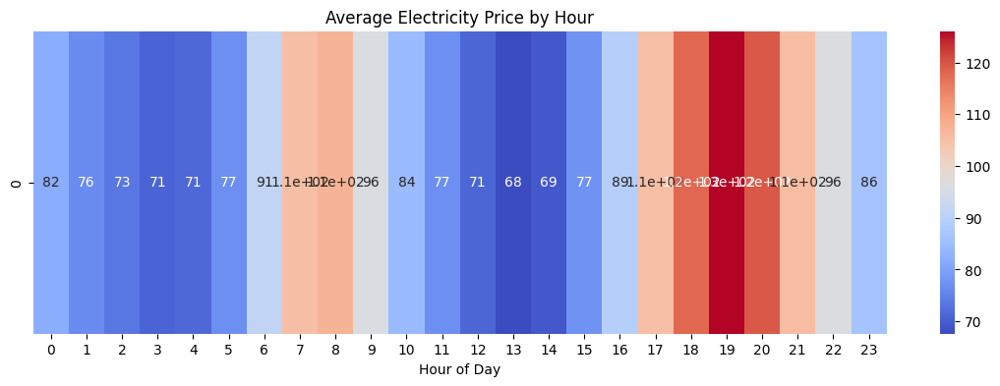

In [10]:
df_hourly_avg = df_day_ahead_price_hourly.groupby(df_day_ahead_price_hourly['start_date'].dt.hour)['price (€/MWh)'].mean()
df_daily_avg = df_day_ahead_price_hourly.groupby(df_day_ahead_price_hourly['start_date'].dt.date)['price (€/MWh)'].mean()
df_weekly_avg = df_day_ahead_price_hourly.groupby(df_day_ahead_price_hourly['start_date'].dt.to_period("W"))['price (€/MWh)'].mean()

df_volatility = df_day_ahead_price_hourly.groupby('region_name')['price (€/MWh)'].std().reset_index()
df_volatility = df_volatility.sort_values(by='price (€/MWh)', ascending=False)

plt.figure(figsize=(14,4))
sns.heatmap(df_hourly_avg.values.reshape(1, -1), cmap='coolwarm', annot=True, xticklabels=range(24))
plt.title("Average Electricity Price by Hour")
plt.xlabel("Hour of Day")
plt.show()


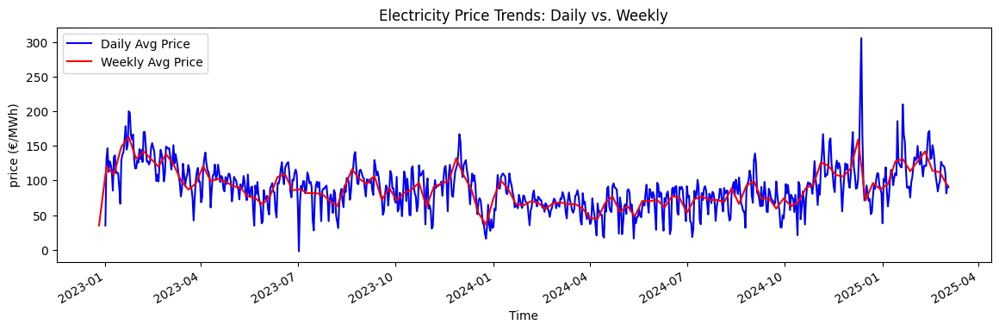

In [11]:
plt.figure(figsize=(14,4))
df_daily_avg.plot(label='Daily Avg Price', color='blue')
df_weekly_avg.plot(label='Weekly Avg Price', color='red')
plt.legend()
plt.title("Electricity Price Trends: Daily vs. Weekly")
plt.xlabel("Time")
plt.ylabel("price (€/MWh)")
plt.show()


- the weekly trend for all time seems to match the daily trend, though smoother

- Features creation to help in the analysis

In [12]:
df_day_ahead_price_hourly.rename(columns={"price (€/MWh)": "price_eur_mwh"}, inplace=True)


In [13]:
# Define season classification
def get_season(month):
    if month in [12, 1, 2]:
        return 'winter'
    elif month in [3, 4, 5]:
        return 'spring'
    elif month in [6, 7, 8]:
        return 'summer'
    elif month in [9, 10, 11]:
        return 'autumn'
    else:
        return 'unknown'

# Define time of day classification
def get_time_of_day(hour):
    if 5 <= hour < 12:
        return 'morning'
    elif 12 <= hour <= 15:
        return 'afternoon'
    elif 15 < hour <= 19:
        return 'evening'
    else:
        return 'night'

# Define weekday vs weekend classification
def get_day_type(day_of_week):
    return 'weekday' if day_of_week < 5 else 'weekend'

# Define lagged features
def add_lagged_features(df, lag_period, component='price_eur_mwh'):
    df[f'lag_{lag_period}_hours'] = df[component].shift(lag_period)
    df['lag_diff'] = df[component] - df[f'lag_{lag_period}_hours']
    df['lag_percent_change'] = ((df[component] - df[f'lag_{lag_period}_hours']) * 100) / df[f'lag_{lag_period}_hours']

    df['hourly_lag'] = df[component].shift(1)
    df['hourly_lag_diff'] = df[component] - df['hourly_lag']
    
    df['daily_lag'] = df[component].shift(24)
    df['daily_lag_diff'] = df[component] - df['daily_lag']
    
    df['monthly_lag'] = df[component].shift(24 * 30)
    df['monthly_lag_diff'] = df[component] - df['monthly_lag']
    
    return df

# Define moving average
def add_moving_average(df, window_size, component='price_eur_mwh'):
    df[f'moving_avg_{window_size}_hours'] = df[component].rolling(window=window_size, min_periods=1).mean()
    return df

# Define moving median
def add_moving_median(df, window_size, component='price_eur_mwh'):
    df[f'moving_median_{window_size}_hours'] = df[component].rolling(window=window_size, min_periods=1).median()
    return df

# Define exponential smoothing
def add_exponential_smoothing(df, alpha, component='price_eur_mwh'):
    df['smoothed_price'] = df[component].ewm(alpha=alpha).mean()
    return df

# Define percentile calculation
def calculate_percentiles(row, percentiles):
    return pd.Series(np.percentile(row, percentiles), index=[f'percentile_{p}' for p in percentiles])

# Extract time-based features
def extract_time_features(df, lag_window_size, alpha, component="price_eur_mwh"):
    df = df.copy()

    # Convert start_date to datetime
    df['start_date'] = pd.to_datetime(df['start_date'])
    
    # Extract time-based elements
    df['month'] = df['start_date'].dt.month
    df['day_of_week'] = df['start_date'].dt.dayofweek  # 0 = Monday
    df['day'] = df['start_date'].dt.day
    df['week_of_month'] = (df['day'] + 6) // 7
    df['week_of_year'] = df['start_date'].dt.isocalendar().week
    df['hour_of_day'] = df['start_date'].dt.hour
    df['season'] = df['month'].apply(get_season)
    df['time_of_day'] = df['hour_of_day'].apply(get_time_of_day)
    df['day_type'] = df['day_of_week'].apply(get_day_type)

    # Add holiday feature
    eu_holidays = holidays.EuropeanCentralBank()
    df['is_holiday'] = df['start_date'].apply(lambda x: 1 if x in eu_holidays else 0)

    # Add lagged, rolling, and smoothed features
    df = add_lagged_features(df, lag_window_size, component)
    df = add_moving_average(df, lag_window_size, component)
    df = add_moving_median(df, lag_window_size, component)
    df = add_exponential_smoothing(df, alpha, component)

    # Compute daily max price
    max_prices = df.groupby(['month', 'day'], as_index=False)[component].max()
    df = df.merge(max_prices, on=['month', 'day'], suffixes=('', '_max_daily'))

    # Compute weekly skewness and kurtosis
    skew_values = df.groupby(['month', 'week_of_month'], as_index=False)[component].skew()
    df = df.merge(skew_values, on=['month', 'week_of_month'], suffixes=('', '_skew_weekly'))

    kurto_values = df.groupby(['month', 'week_of_month'], as_index=False)[component].apply(pd.Series.kurtosis)
    df = df.merge(kurto_values, on=['month', 'week_of_month'], suffixes=('', '_kurtosis_weekly'))

    return df


In [14]:
# # Define season classification
# def get_season(month):
#     if month in [12, 1, 2]:
#         return 'winter'
#     elif month in [3, 4, 5]:
#         return 'spring'
#     elif month in [6, 7, 8]:
#         return 'summer'
#     elif month in [9, 10, 11]:
#         return 'autumn'
#     else:
#         return 'unknown'

# # Define time of day classification
# def get_time_of_day(hour):
#     if 5 <= hour < 12:
#         return 'morning'
#     elif 12 <= hour <= 15:
#         return 'afternoon'
#     elif 15 < hour <= 19:
#         return 'evening'
#     else:
#         return 'night'

# # Define weekday vs weekend classification
# def get_day_type(day_of_week):
#     return 'weekday' if day_of_week < 5 else 'weekend'

# # Define lagged features
# def add_lagged_features(df, lag_period):
#     df[f'lag_{lag_period}_hours'] = df['price_eur_mwh'].shift(lag_period)
#     df['lag_diff'] = df['price_eur_mwh'] - df[f'lag_{lag_period}_hours']
#     df['lag_percent_change'] = ((df['price_eur_mwh'] - df[f'lag_{lag_period}_hours']) * 100) / df[f'lag_{lag_period}_hours']

#     df['hourly_lag'] = df['price_eur_mwh'].shift(1)
#     df['hourly_lag_diff'] = df['price_eur_mwh'] - df['hourly_lag']
    
#     df['daily_lag'] = df['price_eur_mwh'].shift(24)
#     df['daily_lag_diff'] = df['price_eur_mwh'] - df['daily_lag']
    
#     df['monthly_lag'] = df['price_eur_mwh'].shift(24 * 30)
#     df['monthly_lag_diff'] = df['price_eur_mwh'] - df['monthly_lag']
    
#     return df

# # Define moving average
# def add_moving_average(df, window_size):
#     df[f'moving_avg_{window_size}_hours'] = df['price_eur_mwh'].rolling(window=window_size, min_periods=1).mean()
#     return df

# # Define moving median
# def add_moving_median(df, window_size):
#     df[f'moving_median_{window_size}_hours'] = df['price_eur_mwh'].rolling(window=window_size, min_periods=1).median()
#     return df

# # Define exponential smoothing
# def add_exponential_smoothing(df, alpha):
#     df['smoothed_price'] = df['price_eur_mwh'].ewm(alpha=alpha).mean()
#     return df

# # Define percentile calculation
# def calculate_percentiles(row, percentiles):
#     return pd.Series(np.percentile(row, percentiles), index=[f'percentile_{p}' for p in percentiles])

# # Extract time-based features
# def extract_time_features(df, lag_window_size, alpha):
#     df = df.copy()

#     # Convert start_date to datetime
#     df['start_date'] = pd.to_datetime(df['start_date'])
    
#     # Extract time-based elements
#     df['month'] = df['start_date'].dt.month
#     df['day_of_week'] = df['start_date'].dt.dayofweek  # 0 = Monday
#     df['day'] = df['start_date'].dt.day
#     df['week_of_month'] = (df['day'] + 6) // 7
#     df['week_of_year'] = df['start_date'].dt.isocalendar().week
#     df['hour_of_day'] = df['start_date'].dt.hour
#     df['season'] = df['month'].apply(get_season)
#     df['time_of_day'] = df['hour_of_day'].apply(get_time_of_day)
#     df['day_type'] = df['day_of_week'].apply(get_day_type)

#     # Add holiday feature
#     eu_holidays = holidays.EuropeanCentralBank()
#     df['is_holiday'] = df['start_date'].apply(lambda x: 1 if x in eu_holidays else 0)

#     # Rename price column to match snake_case convention
#     df.rename(columns={'price (€/MWh)': 'price_eur_mwh'}, inplace=True)

#     # Add lagged, rolling, and smoothed features
#     df = add_lagged_features(df, lag_window_size)
#     df = add_moving_average(df, lag_window_size)
#     df = add_moving_median(df, lag_window_size)
#     df = add_exponential_smoothing(df, alpha)

#     # Compute daily max price
#     max_prices = df.groupby(['month', 'day'], as_index=False)['price_eur_mwh'].max()
#     df = df.merge(max_prices, on=['month', 'day'], suffixes=('', '_max_daily'))

#     # Compute weekly skewness and kurtosis
#     skew_values = df.groupby(['month', 'week_of_month'], as_index=False)['price_eur_mwh'].skew()
#     df = df.merge(skew_values, on=['month', 'week_of_month'], suffixes=('', '_skew_weekly'))

#     kurto_values = df.groupby(['month', 'week_of_month'], as_index=False)['price_eur_mwh'].apply(pd.Series.kurtosis)
#     df = df.merge(kurto_values, on=['month', 'week_of_month'], suffixes=('', '_kurtosis_weekly'))

#     return df


In [15]:
df_day_ahead_price_hourly.columns

Index(['start_date', 'end_date', 'region_type', 'region_name',
       'price_eur_mwh'],
      dtype='object')

In [16]:
df_price_hourly = extract_time_features(df_day_ahead_price_hourly, lag_window_size=24, alpha=0.2, component='price_eur_mwh')
df_price_hourly.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304896 entries, 0 to 304895
Data columns (total 30 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   start_date                     304896 non-null  datetime64[ns]
 1   end_date                       304896 non-null  datetime64[ns]
 2   region_type                    285840 non-null  object        
 3   region_name                    304896 non-null  object        
 4   price_eur_mwh                  303384 non-null  float64       
 5   month                          304896 non-null  int32         
 6   day_of_week                    304896 non-null  int32         
 7   day                            304896 non-null  int32         
 8   week_of_month                  304896 non-null  int32         
 9   week_of_year                   304896 non-null  UInt32        
 10  hour_of_day                    304896 non-null  int32         
 11  

In [17]:
from scipy.stats import entropy, trim_mean, kurtosis

# def generate_price_summary(df, region_type):
#     df_filtered = df[df['region_type'] == region_type]

def generate_price_summary(df, region_type, component='price_eur_mwh'):
    # If region_type is provided, filter the dataframe; otherwise, use the full dataframe
    df_filtered = df if region_type is None else df[df['region_type'] == region_type]
    
    # Define percentiles for analysis
    percentiles = [10, 25, 50, 75, 90, 95, 100]

    summary_df = df_filtered.groupby('region_name').apply(lambda x: pd.Series({

        # ========== WEEKLY ANALYSIS ==========
        'weekly_avg_price': x.groupby(x['start_date'].dt.isocalendar().week)[component].mean().mean(),
        'weekly_median_price': x.groupby(x['start_date'].dt.isocalendar().week)[component].median().median(),
        'weekly_peak_price': x.groupby(x['start_date'].dt.isocalendar().week)[component].max().max(),
        'weekly_low_price': x.groupby(x['start_date'].dt.isocalendar().week)[component].min().min(),
        'weekly_range': x.groupby(x['start_date'].dt.isocalendar().week)[component].sum().max() - 
                        x.groupby(x['start_date'].dt.isocalendar().week)[component].sum().min(),

        # ========== DAILY ANALYSIS ==========
        'total_avg_price': x[component].mean(),
        'median_price': x[component].median(),
        'weekday_avg_price': x[x['day_type'] == 'weekday'][component].mean(),
        'weekend_avg_price': x[x['day_type'] == 'weekend'][component].mean(),
        'holiday_avg_price': x[x['is_holiday'] == 1][component].mean() if 'is_holiday' in x.columns else None,
        'non_holiday_avg_price': x[x['is_holiday'] == 0][component].mean() if 'is_holiday' in x.columns else None,
        'peak_day_of_week': x.groupby('day_of_week')[component].mean().idxmax(),
        'peak_day_of_week_price': x.groupby('day_of_week')[component].mean().max(),
        'peak_day': x.groupby(x['start_date'].dt.date)[component].mean().idxmax(),
        'peak_day_price': x.groupby(x['start_date'].dt.date)[component].mean().max(),
        'daily_range': x.groupby(x['start_date'].dt.date)[component].sum().max() - 
                       x.groupby(x['start_date'].dt.date)[component].sum().min(),
        'daily_price_percentiles': np.round(np.percentile(x.groupby(x['start_date'].dt.date)[component].mean(), percentiles), 2).tolist(),

        # ========== HOURLY ANALYSIS ==========
        'peak_hour': x.groupby('hour_of_day')[component].mean().idxmax(),
        'peak_hour_price': x.groupby('hour_of_day')[component].mean().max(),
        'peak_time_of_day': x.groupby('time_of_day')[component].mean().idxmax(),
        'peak_time_of_day_price': x.groupby('time_of_day')[component].mean().max(),
        'working_hours_peak': x[(x['hour_of_day'] >= 9) & (x['hour_of_day'] <= 17)][component].max(),
        'working_hours_min': x[(x['hour_of_day'] >= 9) & (x['hour_of_day'] <= 17)][component].min(),
        'hourly_range': x.groupby('hour_of_day')[component].sum().max() - 
                        x.groupby('hour_of_day')[component].sum().min(),

        # ========== DISTRIBUTION METRICS ==========
        'std_dev': x[component].std(),
        'kurtosis': kurtosis(x[component], nan_policy='omit'),
        'skewness': x[component].skew(),

        # ========== ADDITIONAL STATISTICAL FEATURES ==========
        'trimmed_mean': trim_mean(x[component], proportiontocut=0.1),
        'mean_abs_dev': np.mean(np.abs(x[component] - x[component].mean())),
        'median_abs_dev': np.median(np.abs(x[component] - x[component].median())),
        'mean_peak': x[component].mean() / x[component].max(),
        'entropy': entropy(np.histogram(x[component].dropna(), bins=20, density=True)[0])

    })).reset_index()

    return summary_df

# Generate summaries dynamically for different region types
country_summary = generate_price_summary(df_price_hourly, region_type='country',component='price_eur_mwh')

bidding_zone_summary = generate_price_summary(df_price_hourly, region_type='bidding_zone',component='price_eur_mwh')


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_3040/2071647578.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_3040/2071647578.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [18]:

# from scipy.stats import entropy, trim_mean, kurtosis

# # Function to generate price summary for a specific region type
# def generate_price_summary(df, region_type):
#     df_filtered = df[df['region_type'] == region_type]
    
#     # Define percentiles for analysis
#     percentiles = [10, 25, 50, 75, 90, 95, 100]

#     summary_df = df_filtered.groupby('region_name').apply(lambda x: pd.Series({

#         # ========== WEEKLY ANALYSIS ==========
#         'weekly_avg_price': x.groupby(x['start_date'].dt.isocalendar().week)['price_eur_mwh'].mean().mean(),
#         'weekly_median_price': x.groupby(x['start_date'].dt.isocalendar().week)['price_eur_mwh'].median().median(),
#         'weekly_peak_price': x.groupby(x['start_date'].dt.isocalendar().week)['price_eur_mwh'].max().max(),
#         'weekly_low_price': x.groupby(x['start_date'].dt.isocalendar().week)['price_eur_mwh'].min().min(),
#         'weekly_range': x.groupby(x['start_date'].dt.isocalendar().week)['price_eur_mwh'].sum().max() - 
#                         x.groupby(x['start_date'].dt.isocalendar().week)['price_eur_mwh'].sum().min(),

#         # ========== DAILY ANALYSIS ==========
#         'total_avg_price': x['price_eur_mwh'].mean(),
#         'median_price': x['price_eur_mwh'].median(),
#         'weekday_avg_price': x[x['day_type'] == 'weekday']['price_eur_mwh'].mean(),
#         'weekend_avg_price': x[x['day_type'] == 'weekend']['price_eur_mwh'].mean(),
#         'holiday_avg_price': x[x['is_holiday'] == 1]['price_eur_mwh'].mean() if 'is_holiday' in x.columns else None,
#         'non_holiday_avg_price': x[x['is_holiday'] == 0]['price_eur_mwh'].mean() if 'is_holiday' in x.columns else None,
#         'peak_day_of_week': x.groupby('day_of_week')['price_eur_mwh'].mean().idxmax(),
#         'peak_day_of_week_price': x.groupby('day_of_week')['price_eur_mwh'].mean().max(),
#         'peak_day': x.groupby(x['start_date'].dt.date)['price_eur_mwh'].mean().idxmax(),
#         'peak_day_price': x.groupby(x['start_date'].dt.date)['price_eur_mwh'].mean().max(),
#         'daily_range': x.groupby(x['start_date'].dt.date)['price_eur_mwh'].sum().max() - 
#                        x.groupby(x['start_date'].dt.date)['price_eur_mwh'].sum().min(),
#         'daily_price_percentiles': np.round(np.percentile(x.groupby(x['start_date'].dt.date)['price_eur_mwh'].mean(), percentiles), 2).tolist(),

#         # ========== HOURLY ANALYSIS ==========
#         'peak_hour': x.groupby('hour_of_day')['price_eur_mwh'].mean().idxmax(),
#         'peak_hour_price': x.groupby('hour_of_day')['price_eur_mwh'].mean().max(),
#         'peak_time_of_day': x.groupby('time_of_day')['price_eur_mwh'].mean().idxmax(),
#         'peak_time_of_day_price': x.groupby('time_of_day')['price_eur_mwh'].mean().max(),
#         'working_hours_peak': x[(x['hour_of_day'] >= 9) & (x['hour_of_day'] <= 17)]['price_eur_mwh'].max(),
#         'working_hours_min': x[(x['hour_of_day'] >= 9) & (x['hour_of_day'] <= 17)]['price_eur_mwh'].min(),
#         'hourly_range': x.groupby('hour_of_day')['price_eur_mwh'].sum().max() - 
#                         x.groupby('hour_of_day')['price_eur_mwh'].sum().min(),

#         # ========== DISTRIBUTION METRICS ==========
#         'std_dev': x['price_eur_mwh'].std(),
#         'kurtosis': kurtosis(x['price_eur_mwh'], nan_policy='omit'),
#         'skewness': x['price_eur_mwh'].skew(),

#         # ========== ADDITIONAL STATISTICAL FEATURES ==========
#         'trimmed_mean': trim_mean(x['price_eur_mwh'], proportiontocut=0.1),
#         'mean_abs_dev': np.mean(np.abs(x['price_eur_mwh'] - x['price_eur_mwh'].mean())),
#         'median_abs_dev': np.median(np.abs(x['price_eur_mwh'] - x['price_eur_mwh'].median())),
#         'mean_peak': x['price_eur_mwh'].mean() / x['price_eur_mwh'].max(),
#         'entropy': entropy(np.histogram(x['price_eur_mwh'].dropna(), bins=20, density=True)[0])



#     })).reset_index()

#     return summary_df

# country_summary = generate_price_summary(df_day_ahead_price_hourly, region_type='country')

# bidding_zone_summary = generate_price_summary(df_day_ahead_price_hourly, region_type='bidding_zone')


In [19]:
bidding_zone_summary.T

,0,1,2,3,4,5
region_name,denmark_1,denmark_2,germany/luxembourg,northern_italy,sweden_4,∅_de/lu_neighbours
weekly_avg_price,79.376046,77.285525,88.210437,117.507886,57.044532,82.984105
weekly_median_price,82.2975,78.3625,89.43,112.74,51.7375,84.0525
weekly_peak_price,936.28,936.31,936.28,295.0,699.09,664.26
weekly_low_price,-440.1,-60.04,-500.0,0.1,-60.04,-152.18
weekly_range,45094.76,44892.41,47841.48,23256.5,38754.13,41148.12
total_avg_price,80.655024,78.413454,89.471532,117.580087,58.648837,84.648631
median_price,82.355,78.795,90.6,112.86,48.08,83.23
weekday_avg_price,86.607277,84.752781,97.159938,121.583246,65.800102,91.303884
weekend_avg_price,65.787504,62.579099,70.26745,107.581766,40.786426,68.025156


In [20]:
df_price_hourly['day_type']

0         weekend
1         weekend
2         weekend
3         weekend
4         weekend
           ...   
304891    weekday
304892    weekday
304893    weekday
304894    weekday
304895    weekday
Name: day_type, Length: 304896, dtype: object

In [21]:

# Extract time components
df_day_ahead_price_hourly['hour_of_day'] = df_day_ahead_price_hourly['start_date'].dt.hour
df_day_ahead_price_hourly['date'] = df_day_ahead_price_hourly['start_date'].dt.date
df_day_ahead_price_hourly['week_of_year'] = df_day_ahead_price_hourly['start_date'].dt.isocalendar().week

# df_day_ahead_price_hourly.info()

In [22]:
# Check missing values in price
missing_prices = df_day_ahead_price_hourly['price_eur_mwh'].isnull().mean() * 100
print(f"Missing values in price column: {missing_prices}")

# Check missing values by region
missing_by_region = df_day_ahead_price_hourly.groupby('region_name')['price_eur_mwh'].apply(lambda x: x.isnull().mean() * 100)
# print(missing_by_region)


Missing values in price column: 0.4959068010075567


In [23]:
df_day_ahead_price_hourly['region_type'].dropna().unique()

array(['bidding_zone', 'country'], dtype=object)

**Summary Statistics Visualizations**

- `Daily`

In [24]:
# country_summary.head(2).T

In [25]:
print(country_summary[['weekday_avg_price', 'weekend_avg_price']].mean().round(2))
country_summary[['weekday_avg_price', 'weekend_avg_price']]
 

weekday_avg_price    102.77
weekend_avg_price     76.13
dtype: float64


,weekday_avg_price,weekend_avg_price
0,103.248323,75.538387
1,93.501330,69.291830
2,103.799222,75.804224
3,86.683766,63.690413
4,116.972476,83.265059
5,96.201294,71.694376
6,112.456814,87.715228
7,110.059839,78.667149
8,102.031543,79.477851


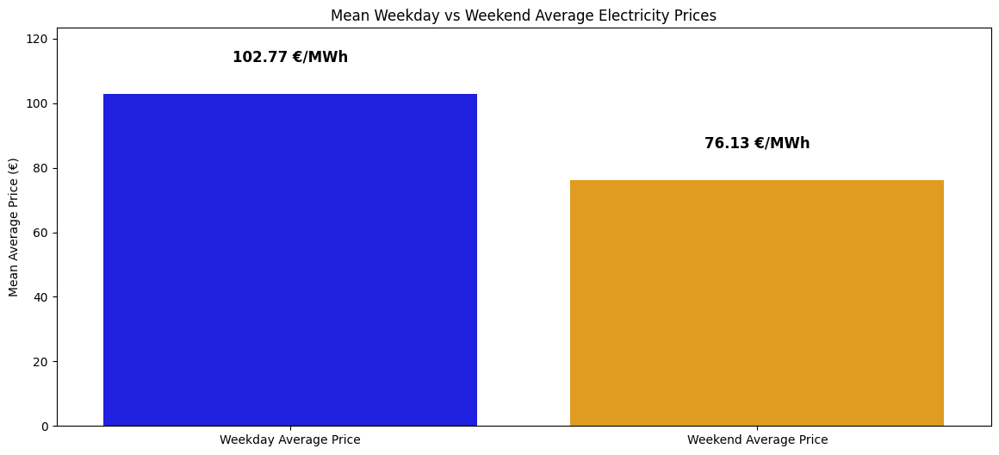

In [26]:

label_mapping = {
    "weekday_avg_price": "Weekday Average Price",
    "weekend_avg_price": "Weekend Average Price"
}

# Calculate the total averages
mean_avg = country_summary[['weekday_avg_price', 'weekend_avg_price']].mean().round(2)

# Create the bar plot
plt.figure(figsize=(14, 6))
ax = sns.barplot(x=[label_mapping[key] for key in mean_avg.index], y=mean_avg.values, palette=["blue", "orange"])

# Add annotations on top of each bar
for i, value in enumerate(mean_avg.values):
    ax.text(i, value + 10, f"{value:.2f} €/MWh", ha='center', fontsize=12, fontweight='bold')

# Labels & Title
plt.ylabel("Mean Average Price (€)")
plt.title("Mean Weekday vs Weekend Average Electricity Prices")
plt.ylim(0, max(mean_avg.values) * 1.2)  # Adjust limit for better visibility

# Show plot
plt.show()


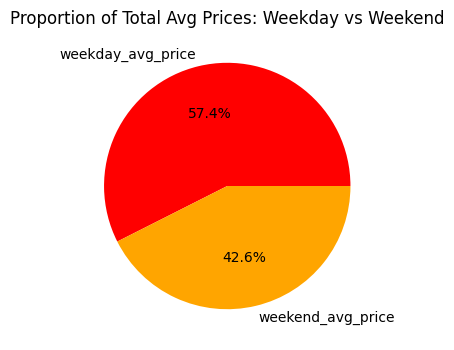

In [27]:
plt.figure(figsize=(14, 4))
plt.pie(mean_avg.values, labels=mean_avg.keys(), autopct="%1.1f%%", colors=["red", "orange"])
plt.title("Proportion of Total Avg Prices: Weekday vs Weekend")
plt.show()


In [28]:
# country_summary.T

In [29]:
country_summary_sorted = country_summary.sort_values(by="weekday_avg_price", ascending=False)
# country_summary_sorted.T

In [30]:
# country_summary_sorted = country_summary.sort_values(by="weekday_avg_price", ascending=False)

# country_label_mapping = {
#     "austria": "Austria",
#     "belgium": "Belgium",
#     "czech_republic": "Czech Republic",
#     "france": "France",
#     "hungary": "Hungary",
#     "netherlands": "Netherlands",
#     "poland": "Poland",
#     "slovenia": "Slovenia",
#     "switzerland": "Switzerland"
# }

# x_labels = [country_label_mapping[country] for country in country_summary_sorted["region_name"]]

# plt.figure(figsize=(14, 4))
# ax = sns.barplot(
#     x=x_labels,  # Use mapped labels here
#     y=country_summary_sorted["weekday_avg_price"],
#     color="blue",
#     label="Weekday Avg Price"
# )

# sns.barplot(
#     x=x_labels,  # Use mapped labels here
#     y=country_summary_sorted["weekend_avg_price"],
#     color="yellow",
#     label="Weekend Avg Price"
# )

# # Add annotations on top of each bar
# for i, (weekday, weekend) in enumerate(
#     zip(country_summary_sorted["weekday_avg_price"], country_summary_sorted["weekend_avg_price"])
# ):
#     ax.text(i, weekday + 2, f"{weekday:.2f} €/MWh", ha='center', fontsize=10, fontweight='bold', color="blue")
#     ax.text(i, weekend + 2, f"{weekend:.2f} €/MWh", ha='center', fontsize=10, fontweight='bold', color="yellow")

# # Rotate x-axis labels for better readability
# plt.xticks(rotation=45, ha="right", fontsize=10)

# # Labels & Title
# plt.ylabel("Average Electricity Price (€/MWh)")
# plt.xlabel("Region (Country)")
# plt.title("Weekday vs Weekend Electricity Prices Across Regions")
# plt.legend()

# # Adjust y-axis limits for better visibility
# plt.ylim(0, max(country_summary_sorted["weekday_avg_price"]) * 1.2)

# # Show plot
# plt.show()


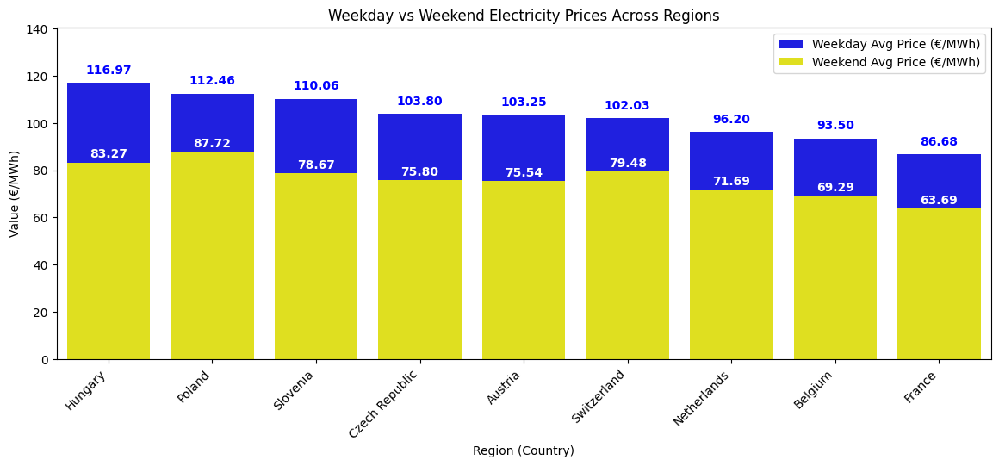

In [31]:

# def plot_country_comparison(df, metric1, metric2, metric1_label, metric2_label, 
#                             title, bar1_color="blue", bar2_color="yellow",label1_color='blue',label2_color='blue'
#                             ):
#     """
#     Generalized function to compare two electricity-related metrics across regions.
    
#     Parameters:
#     - df: DataFrame containing the relevant metrics.
#     - metric1: Column name for the first metric (e.g., 'weekday_avg_price').
#     - metric2: Column name for the second metric (e.g., 'weekend_avg_price').
#     - metric1_label: Label for the first metric (e.g., "Weekday Avg Price").
#     - metric2_label: Label for the second metric (e.g., "Weekend Avg Price").
#     - title: Plot title.
#     - color1: Color for the first metric (default: blue).
#     - color2: Color for the second metric (default: yellow).
#     """

#     # Sort by the first metric (descending)
#     df_sorted = df.sort_values(by=metric1, ascending=False)

#     # Country name mapping
#     country_label_mapping = {
#         "austria": "Austria",
#         "belgium": "Belgium",
#         "czech_republic": "Czech Republic",
#         "france": "France",
#         "hungary": "Hungary",
#         "netherlands": "Netherlands",
#         "poland": "Poland",
#         "slovenia": "Slovenia",
#         "switzerland": "Switzerland"
#     }

#     # Extract country names for x-axis labels
#     x_labels = [country_label_mapping[country] for country in df_sorted["region_name"]]

#     # Create figure
#     plt.figure(figsize=(14, 5))

#     # Bar plots
#     ax = sns.barplot(
#         x=x_labels,
#         y=df_sorted[metric1],
#         color=bar1_color,
#         label=metric1_label
#     )

#     sns.barplot(
#         x=x_labels,
#         y=df_sorted[metric2],
#         color=bar2_color,
#         label=metric2_label
#     )
    

#     # Add annotations on top of each bar
#     for i, (val1, val2) in enumerate(zip(df_sorted[metric1], df_sorted[metric2])):
#        ax.text(i, val1 + 2, f"{val1:.2f}", ha='center', fontsize=10, fontweight='bold', color=label1_color)
#        ax.text(i, -abs(val2) - 2, f"{val2:.2f}", ha='center', fontsize=10, fontweight='bold', color=label2_color)


#     # Rotate x-axis labels for better readability
#     plt.xticks(rotation=45, ha="right", fontsize=10)

#     # Labels & Title
#     plt.ylabel("Value")
#     plt.xlabel("Region (Country)")
#     plt.title(title)
#     plt.legend()

#     # Adjust y-axis limits for better visibility
#     plt.ylim(0, max(df_sorted[metric1].max(), df_sorted[metric2].max()) * 1.2)

#     # Show plot
#     plt.show()


def plot_country_comparison(df, metric1=None, metric2=None, metric1_label=None, metric2_label=None, 
                            title=None, bar1_color="blue", bar2_color="yellow",
                            label1_color="blue", label2_color="red"):
    """
    Generalized function to compare one or two electricity-related metrics across regions, 
    handling both positive and negative values dynamically.

    Parameters:
    - df: DataFrame containing the relevant metrics.
    - metric1: Column name for the first metric (e.g., 'weekday_avg_price').
    - metric2: Column name for the second metric (optional, e.g., 'weekend_avg_price').
    - metric1_label: Label for the first metric.
    - metric2_label: Label for the second metric.
    - title: Plot title.
    - bar1_color: Color for the first metric's bars.
    - bar2_color: Color for the second metric's bars (ignored if metric2 is None).
    - label1_color: Color for the first metric's annotations.
    - label2_color: Color for the second metric's annotations (ignored if metric2 is None).
    """

    if metric1 is None:
        raise ValueError("At least one metric (metric1) must be provided.")

    # Sort by the first metric (descending)
    df_sorted = df.sort_values(by=metric1, ascending=False)

    # Country name mapping
    country_label_mapping = {
        "austria": "Austria",
        "belgium": "Belgium",
        "czech_republic": "Czech Republic",
        "france": "France",
        "hungary": "Hungary",
        "netherlands": "Netherlands",
        "poland": "Poland",
        "slovenia": "Slovenia",
        "switzerland": "Switzerland"
    }

    # Extract country names for x-axis labels
    x_labels = [country_label_mapping.get(country, country) for country in df_sorted["region_name"]]

    # Create figure
    plt.figure(figsize=(14, 5))

    # Bar plot for metric1
    ax = sns.barplot(
        x=x_labels,
        y=df_sorted[metric1],
        color=bar1_color,
        label=metric1_label
    )

    # Add annotations for metric1
    for i, val1 in enumerate(df_sorted[metric1]):  
        ax.text(i, val1 + 4, f"{val1:.2f}", ha='center', fontsize=10, fontweight='bold', color=label1_color)

    # If metric2 is provided, plot it
    if metric2 is not None:
        sns.barplot(
            x=x_labels,
            y=df_sorted[metric2],  
            color=bar2_color,
            label=metric2_label
        )

        # Add annotations for metric2
        for i, val2 in enumerate(df_sorted[metric2]):  
            if val2 < 0:
                ax.text(i, val2 - 4, f"{val2:.2f}", ha='center', fontsize=10, fontweight='bold', color=label2_color)
            else:
                ax.text(i, val2 + 2, f"{val2:.2f}", ha='center', fontsize=10, fontweight='bold', color=label2_color)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha="right", fontsize=10)

    # Labels & Title
    plt.ylabel("Value (€/MWh)")
    plt.xlabel("Region (Country)")
    plt.title(title)

    # Ensure legend only appears if metric2 exists
    if metric2 is not None:
        ax.legend()

    # Adjust y-axis limits for better visibility
    y_max = df_sorted[metric1].max() * 1.2
    y_min = min(df_sorted[metric1].min(), 0) * 1.2
    if metric2 is not None:
        y_max = max(y_max, df_sorted[metric2].max() * 1.2)
        y_min = min(y_min, df_sorted[metric2].min() * 1.2)

    plt.ylim(y_min, y_max)

    # Show plot
    plt.show()


plot_country_comparison(
    country_summary, 
    "weekday_avg_price", "weekend_avg_price", 
    "Weekday Avg Price (€/MWh)", "Weekend Avg Price (€/MWh)", 
    "Weekday vs Weekend Electricity Prices Across Regions",
    bar1_color="blue", bar2_color="yellow",
    label1_color='blue',label2_color='white'

    
)


/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_3040/4260994531.py:3: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



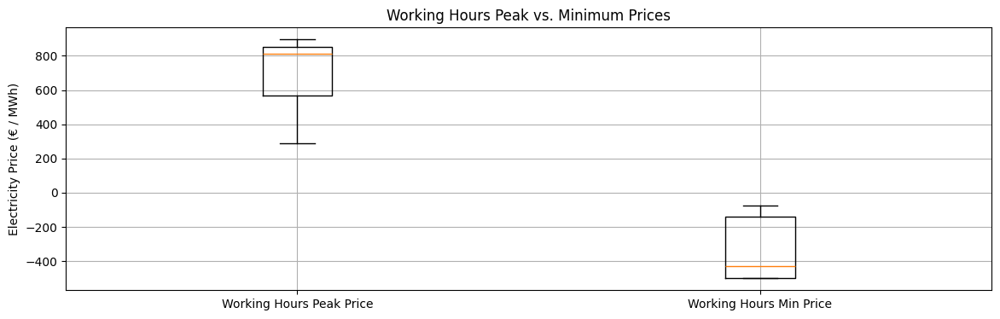

In [32]:
plt.figure(figsize=(14, 4))
data = [country_summary.T.loc['working_hours_peak'], country_summary.T.loc['working_hours_min']]
plt.boxplot(data, labels=["Working Hours Peak Price", "Working Hours Min Price"])
plt.ylabel("Electricity Price (€ / MWh)")
plt.title("Working Hours Peak vs. Minimum Prices")
plt.grid(True)
plt.show()


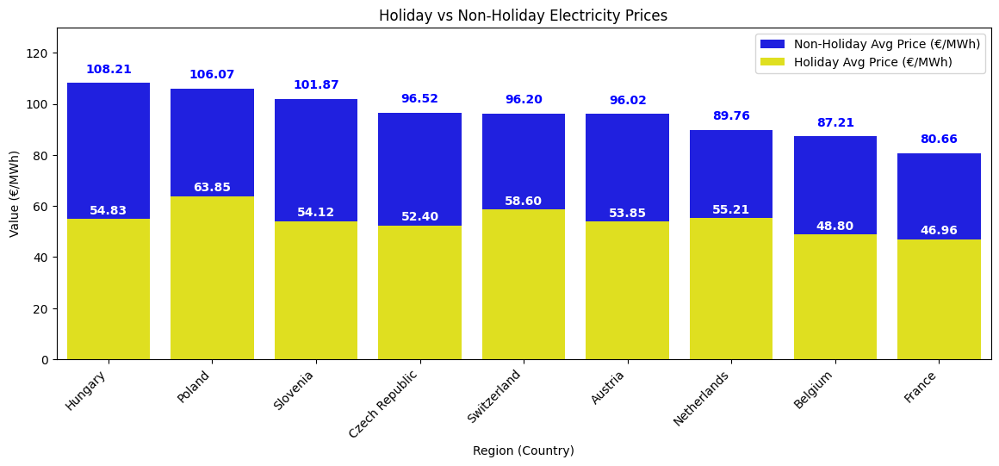

In [33]:
plot_country_comparison(
    country_summary, 
    "non_holiday_avg_price", "holiday_avg_price", 
    "Non-Holiday Avg Price (€/MWh)", "Holiday Avg Price (€/MWh)", 
    "Holiday vs Non-Holiday Electricity Prices",
    bar1_color="blue", bar2_color="yellow",
    label1_color='blue',label2_color='white'
)

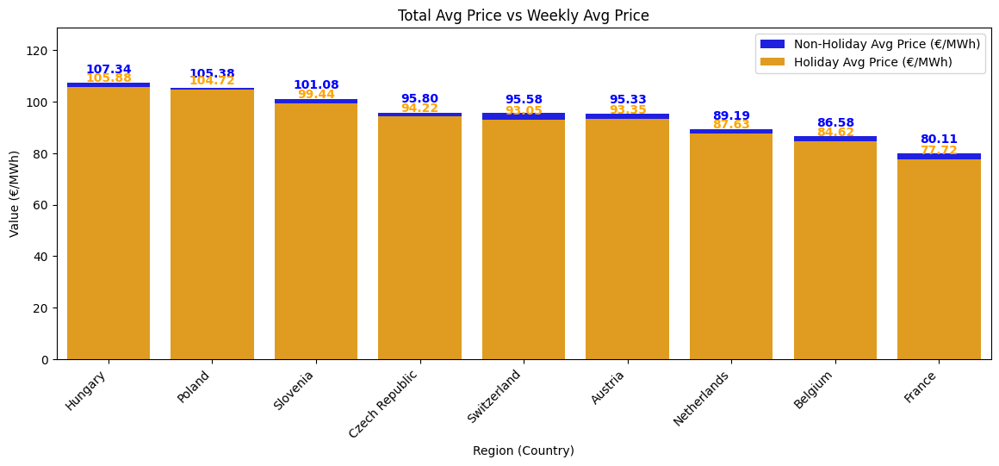

In [34]:
plot_country_comparison(
    country_summary, 
    "total_avg_price", "weekly_avg_price", 
    "Non-Holiday Avg Price (€/MWh)", "Holiday Avg Price (€/MWh)", 
    "Total Avg Price vs Weekly Avg Price",
    bar1_color="blue", bar2_color="orange",
    label1_color='blue',label2_color='orange'
)

In [35]:
country_summary[["total_avg_price", "weekly_avg_price"]]

,total_avg_price,weekly_avg_price
0,95.326213,93.346767
1,86.579974,84.617523
2,95.795614,94.221599
3,80.110100,77.720365
4,107.335721,105.882957
5,89.194908,87.629124
6,105.383338,104.721683
7,101.084851,99.436232
8,95.583573,93.050866


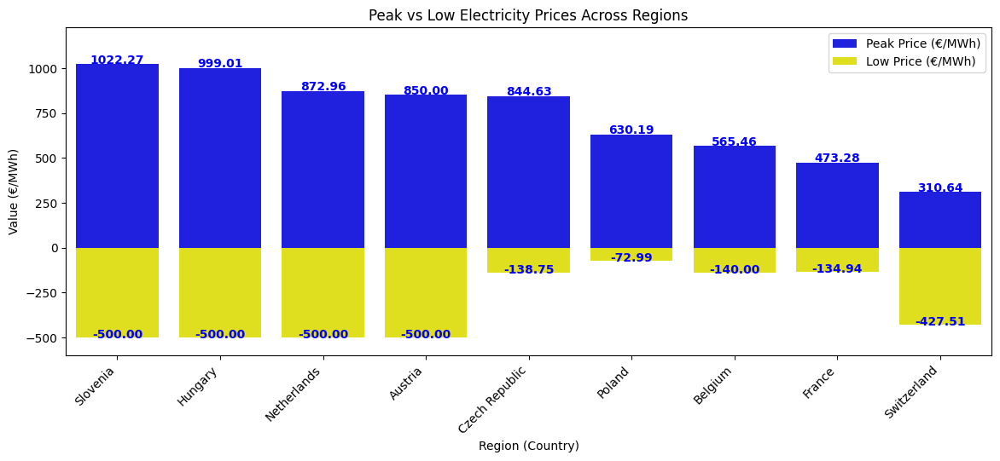

In [36]:
plot_country_comparison(
    country_summary, 
    "weekly_peak_price", "weekly_low_price", 
    "Peak Price (€/MWh)", "Low Price (€/MWh)", 
    "Peak vs Low Electricity Prices Across Regions",
    bar1_color="blue", bar2_color="yellow",
    label1_color='blue',label2_color='blue'
)

In [37]:
country_summary[["weekly_peak_price", "weekly_low_price"]]

,weekly_peak_price,weekly_low_price
0,850.00,-500.00
1,565.46,-140.00
2,844.63,-138.75
3,473.28,-134.94
4,999.01,-500.00
5,872.96,-500.00
6,630.19,-72.99
7,1022.27,-500.00
8,310.64,-427.51


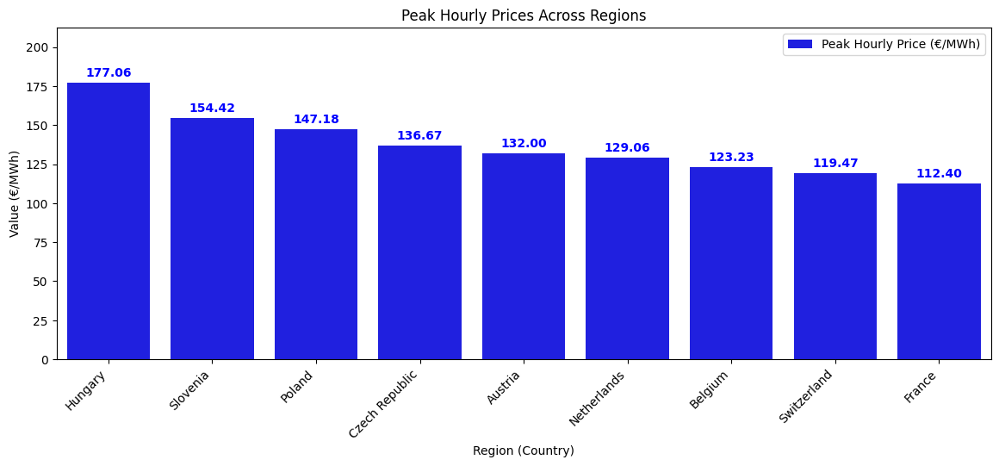

In [38]:
plot_country_comparison(
    country_summary, 
    "peak_hour_price", None, 
    "Peak Hourly Price (€/MWh)", None, 
    "Peak Hourly Prices Across Regions",
    bar1_color="blue", bar2_color=None,
    label1_color='blue',label2_color=None
)

In [39]:
country_summary.columns


Index(['region_name', 'weekly_avg_price', 'weekly_median_price',
       'weekly_peak_price', 'weekly_low_price', 'weekly_range',
       'total_avg_price', 'median_price', 'weekday_avg_price',
       'weekend_avg_price', 'holiday_avg_price', 'non_holiday_avg_price',
       'peak_day_of_week', 'peak_day_of_week_price', 'peak_day',
       'peak_day_price', 'daily_range', 'daily_price_percentiles', 'peak_hour',
       'peak_hour_price', 'peak_time_of_day', 'peak_time_of_day_price',
       'working_hours_peak', 'working_hours_min', 'hourly_range', 'std_dev',
       'kurtosis', 'skewness', 'trimmed_mean', 'mean_abs_dev',
       'median_abs_dev', 'mean_peak', 'entropy'],
      dtype='object')

`Daily Price Range by Region`

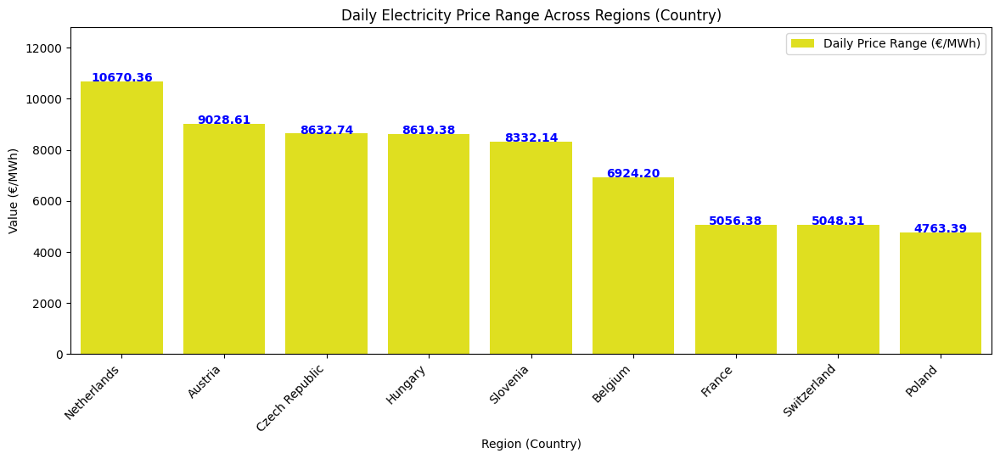

In [40]:
plot_country_comparison(
    country_summary, 
    "daily_range", None, 
    "Daily Price Range (€/MWh)", None, 
    "Daily Electricity Price Range Across Regions (Country)",
    bar1_color="yellow", bar2_color=None,
    label1_color='blue',label2_color=None
)

`Weekly Price Range by Region`

Indicates how much prices fluctuate within a week per region.

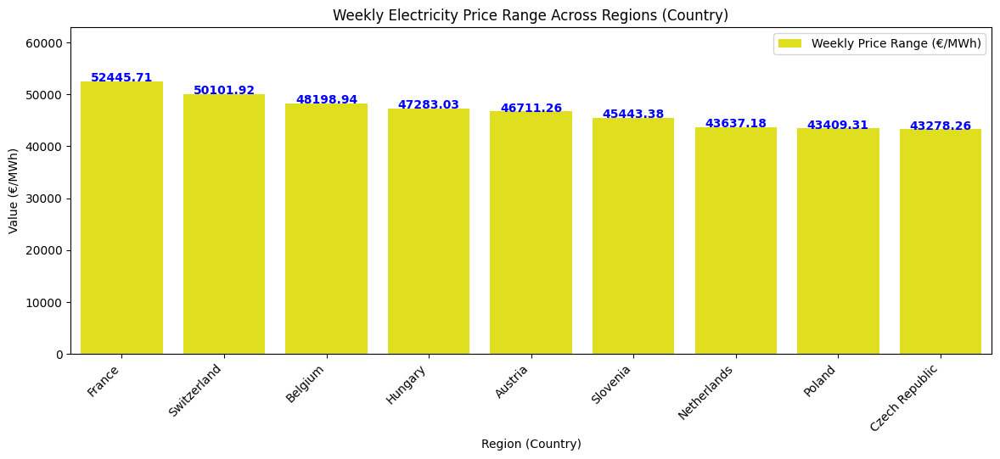

In [41]:
plot_country_comparison(
    country_summary, 
    "weekly_range", None, 
    "Weekly Price Range (€/MWh)", None, 
    "Weekly Electricity Price Range Across Regions (Country)",
    bar1_color="yellow", bar2_color=None,
    label1_color='blue',label2_color=None
)

`Peak Price by Time of Day`

Helps visualize when the highest prices occur on average

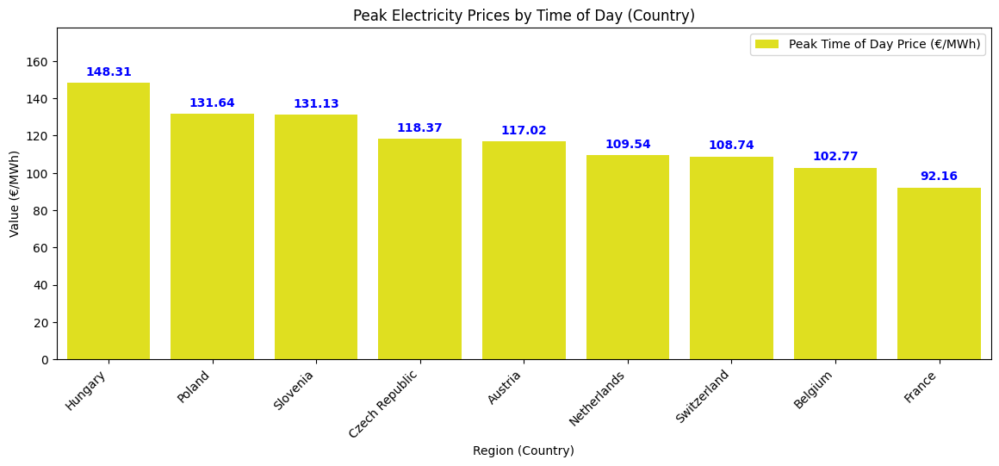

In [42]:
plot_country_comparison(
    country_summary, 
    "peak_time_of_day_price", None, 
    "Peak Time of Day Price (€/MWh)", None, 
    "Peak Electricity Prices by Time of Day (Country)",
    bar1_color="yellow", bar2_color=None,
    label1_color='blue',label2_color=None
)

`Electricity Price Volatility (Standard Deviation) by Region`

Shows how much electricity prices fluctuate in each region

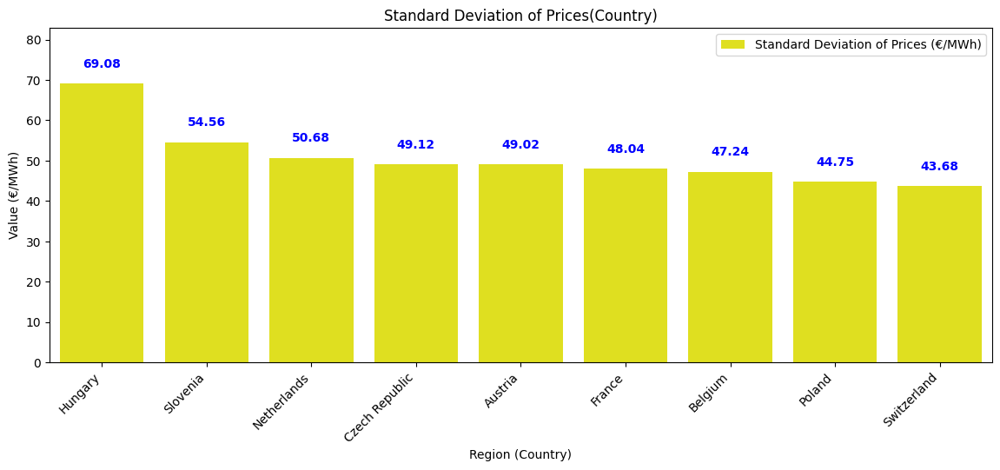

In [43]:
plot_country_comparison(
    country_summary, 
    "std_dev", None, 
    "Standard Deviation of Prices (€/MWh)", None, 
    "Standard Deviation of Prices(Country)",
    bar1_color="yellow", bar2_color=None,
    label1_color='blue',label2_color=None
)

`Skewness of Electricity Prices by Region`

Indicates whether price distributions are skewed towards high or low prices

In [44]:
# plot_country_comparison(
#     country_summary, 
#     "skewness", None, 
#     "Skewness(€/MWh)", None, 
#     "Skewness of Electricity Prices by Region (Country)",
#     bar1_color="yellow", bar2_color=None,
#     label1_color='blue',label2_color=None
# )

In [45]:
# country_summary_sorted = country_summary.sort_values(by="skewness", ascending=False)
# x_labels = [country_label_mapping[country] for country in country_summary_sorted["region_name"]]

# plt.figure(figsize=(14, 4))
# ax = sns.barplot(
#     x=x_labels,
#     y=country_summary_sorted["skewness"],
#     color="green",
#     label="Skewness"
# )

# # Add annotations
# for i, skewness in enumerate(country_summary_sorted["skewness"]):
#     ax.text(i, skewness + 0.1, f"{skewness:.2f}", ha='center', fontsize=10, fontweight='bold', color="green")

# # Formatting
# plt.xticks(rotation=45, ha="right", fontsize=10)
# plt.ylabel("Skewness")
# plt.xlabel("Region (Country)")
# plt.title("Skewness of Electricity Prices by Region")
# plt.legend()
# plt.ylim(min(country_summary_sorted["skewness"]) * 1.2, max(country_summary_sorted["skewness"]) * 1.2)

# plt.show()


`Kurtosis of Electricity Prices by Region`

Shows whether price distributions have heavy tails—important for extreme price swings

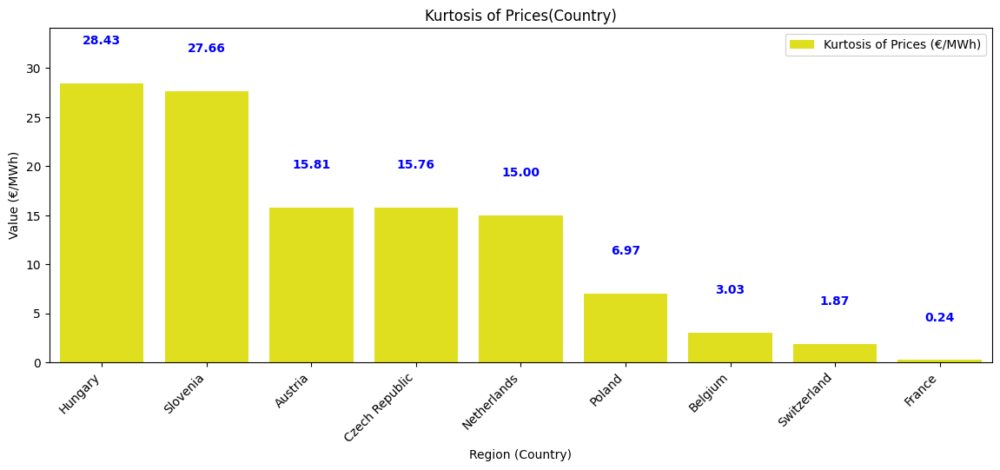

In [46]:
plot_country_comparison(
    country_summary, 
    "kurtosis", None, 
    "Kurtosis of Prices (€/MWh)", None, 
    "Kurtosis of Prices(Country)",
    bar1_color="yellow", bar2_color=None,
    label1_color='blue',label2_color=None
)

`Mean vs Median Electricity Prices`

Helps determine if extreme price spikes are influencing the mean

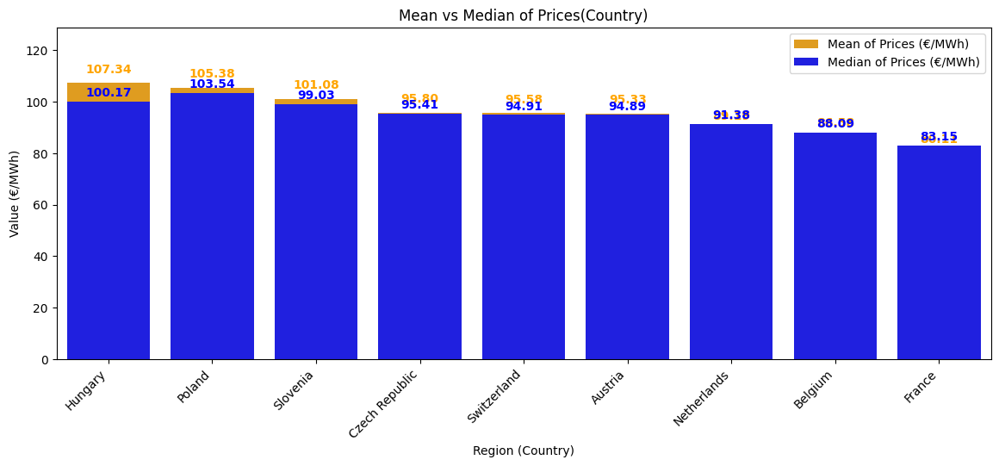

In [47]:
plot_country_comparison(
    country_summary, 
    "total_avg_price", "median_price", 
    "Mean of Prices (€/MWh)", "Median of Prices (€/MWh)", 
    "Mean vs Median of Prices(Country)",
    bar1_color="orange", bar2_color="blue",
    label1_color='orange',label2_color="blue"
)

In [48]:
df_day_ahead_price_hourly.columns

Index(['start_date', 'end_date', 'region_type', 'region_name', 'price_eur_mwh',
       'hour_of_day', 'date', 'week_of_year'],
      dtype='object')

In [49]:
# plt.figure(figsize=(14,4))
# sns.barplot(data=df_day_ahead_price_hourly, x='start_date', y='lag_24_hours', hue='is_holiday', palette='viridis')
# plt.title('Returns for BTC/USDT and ETH/USDT')
# plt.xlabel('Date')
# plt.ylabel('Return')
# plt.grid(True)
# plt.show()

# filtered_correlation.index = filtered_correlation.index.str.replace(' ', '\n')

# # Plot the filtered correlation
# plt.figure(figsize=(8, 4))
# sns.barplot(x=filtered_correlation.index, y=filtered_correlation.values,
#             hue=filtered_correlation.index, palette='coolwarm')
# plt.xlabel('Weather Event Types')
# plt.ylabel('Correlation with Customers Out')
# plt.title('Correlation between Weather Events and Power Outages in Texas [2019-2021] \n (Correlation > 0.1)')
# plt.xticks(rotation=45)
# plt.show()

# sns.swarmplot(x='day', y='tip', data=tips, size=4, hue='sex')
# plt.ylabel('tip ($)')
# plt.show()

**Hourly, Daily & Weekly Price Trends for Countries**

<!-- **Expanding the Country List**
We need to manually add the missing country-level regions that are currently under "bidding_zone."

Step 1: Identify Countries from Bidding Zones

From the hourly_avg_price_region['region_name'].unique() output, the following should be classified as countries:

- Denmark → (denmark_1, denmark_2)
- Norway → (norway_2)
- Sweden → (sweden_4)
- Italy → (northern_italy) -->

In [50]:
# Filter for bidding zones
df_prices_bzones = df_day_ahead_price_hourly[df_day_ahead_price_hourly['region_type'] == 'bidding_zone']

# Compute hourly, daily, and weekly averages
hourly_avg_price_bzones = df_prices_bzones.groupby(['hour_of_day', 'region_name'])['price_eur_mwh'].mean().reset_index()
daily_avg_price_bzones = df_prices_bzones.groupby(['date', 'region_name'])['price_eur_mwh'].mean().reset_index()
weekly_avg_price_bzones = df_prices_bzones.groupby(['week_of_year', 'region_name'])['price_eur_mwh'].mean().reset_index()


In [51]:
# Filter for countries
df_prices_countries = df_day_ahead_price_hourly[df_day_ahead_price_hourly['region_type'] == 'country']
# df_day_ahead_price_hourly['week_of_month']
# Compute hourly, daily, and weekly averages
hourly_avg_price_country = df_prices_countries.groupby(['hour_of_day', 'region_name'])['price_eur_mwh'].mean().reset_index()
daily_avg_price_country = df_prices_countries.groupby(['date', 'region_name'])['price_eur_mwh'].mean().reset_index()
weekly_avg_price_country = df_prices_countries.groupby(['week_of_year', 'region_name'])['price_eur_mwh'].mean().reset_index()


In [52]:
# df_prices_countries.groupby(["region_name","region_type", "hour_of_day"])["price_eur_mwh"].describe()

# pd.options.display.max_rows = None  # Show all rows
# pd.options.display.max_columns = None  # Show all columns

from scipy.stats import skew, kurtosis


# df_stats = df_prices_countries.groupby(["region_name", "region_type", "hour_of_day"])["price_eur_mwh"].agg(['mean', 'std', 'min', 'max', skew, kurtosis])


df_country_stats = df_prices_countries.groupby(["region_name", "region_type", "hour_of_day"])["price_eur_mwh"].describe(percentiles=[0.01, 0.05, 0.95, 0.99]).reset_index()

# df_prices_countries.groupby(["region_name", "region_type", "hour_of_day"])["price_eur_mwh"].describe(percentiles=[0.01, 0.05, 0.95, 0.99])

df_country_stats[df_country_stats["region_name"] == "austria"]



,region_name,region_type,hour_of_day,count,mean,std,min,1%,5%,50%,95%,99%,max
0,austria,country,0,794.0,87.508652,30.387206,-9.52,2.3118,25.6480,91.560,133.1040,149.0049,164.85
1,austria,country,1,794.0,81.294924,30.914854,-7.59,0.0893,12.3580,85.490,127.3015,144.5371,160.00
2,austria,country,2,794.0,78.316310,31.202163,-18.59,0.0386,8.7820,83.000,123.7000,140.2545,155.32
3,austria,country,3,794.0,75.759660,31.560798,-10.07,0.0000,5.7125,80.005,123.4050,138.8740,149.32
4,austria,country,4,794.0,77.308186,31.277631,-12.50,-0.0007,9.5665,81.805,123.2780,140.2043,153.55
5,austria,country,5,794.0,84.986499,31.251652,-6.58,-0.0007,19.4285,88.045,134.2635,149.0315,164.09
6,austria,country,6,794.0,101.094257,36.426687,-6.91,0.0000,25.9030,102.965,159.9735,174.9070,194.47
7,austria,country,7,794.0,115.237154,47.778158,-4.88,0.0993,35.7290,114.970,186.5300,237.7080,535.76
8,austria,country,8,794.0,113.957531,53.706198,-1.75,-0.0014,26.8535,112.470,190.7385,258.1059,655.60
9,austria,country,9,794.0,100.305592,49.679198,-6.42,-0.3634,8.6880,98.565,175.1190,246.0914,428.52


In [53]:
# df_country_stats[df_country_stats["region_name"] == "switzerland"]
# # df_country_stats["region_name"].unique()

In [54]:
df_outliers = df_prices_countries.groupby(["region_name", "region_type", "hour_of_day"])["price_eur_mwh"].apply(lambda x: ((x < (x.quantile(0.25) - 1.5 * (x.quantile(0.75) - x.quantile(0.25)))) | 
(x > (x.quantile(0.75) + 1.5 * (x.quantile(0.75) - x.quantile(0.25))))).sum()).rename("outlier_count")

df_outliers

region_name  region_type  hour_of_day
austria      country      0              36
                          1              31
                          2              33
                          3              35
                          4              48
                                         ..
switzerland  country      19              8
                          20              4
                          21              1
                          22              2
                          23              4
Name: outlier_count, Length: 216, dtype: int64

In [55]:
df_prices_countries.groupby("region_name")["price_eur_mwh"].describe()


,count,mean,std,min,25%,50%,75%,max
region_name,,,,,,,,
austria,19056.0,95.326213,49.015047,-500.00,70.7000,94.890,121.2900,850.00
belgium,19056.0,86.579974,47.241271,-140.00,60.0000,88.085,114.6900,565.46
czech_republic,19056.0,95.795614,49.116856,-138.75,71.1200,95.415,121.5425,844.63
france,19056.0,80.110100,48.041646,-134.94,45.9675,83.150,111.0400,473.28
hungary,19056.0,107.335721,69.083384,-500.00,75.2200,100.170,130.9225,999.01
netherlands,19056.0,89.194908,50.675948,-500.00,66.1975,91.375,115.8375,872.96
poland,19056.0,105.383338,44.754403,-72.99,82.8000,103.540,127.6125,630.19
slovenia,19056.0,101.084851,54.558546,-500.00,73.9775,99.030,126.4900,1022.27
switzerland,19056.0,95.583573,43.682002,-427.51,70.0875,94.910,123.7600,310.64


In [56]:
df_country_stats = df_prices_countries.groupby(["region_name", "region_type", "week_of_year"])["price_eur_mwh"].describe(percentiles=[0.01, 0.05, 0.95, 0.99]).reset_index()

df_country_stats[df_country_stats["region_name"] == "netherlands"]


,region_name,region_type,week_of_year,count,mean,std,min,1%,5%,50%,95%,99%,max
260,netherlands,country,1,504.0,90.514702,46.372395,-1.95,-0.3798,0.8290,92.785,165.2395,179.9700,222.10
261,netherlands,country,2,504.0,98.055357,38.926783,-0.33,1.5869,9.0125,99.375,155.9400,179.9148,222.00
262,netherlands,country,3,504.0,123.852361,46.146530,42.17,51.0522,61.8785,121.030,199.9595,298.4304,350.48
263,netherlands,country,4,504.0,120.872897,64.210879,-5.00,4.8545,44.1040,113.460,229.4470,290.9202,523.47
264,netherlands,country,5,504.0,102.952063,43.846642,0.00,4.4201,31.7610,103.110,171.4040,183.9736,200.00
265,netherlands,country,6,504.0,116.811270,44.399265,0.08,1.6938,47.7835,121.475,189.9680,216.1291,245.60
266,netherlands,country,7,504.0,113.603472,43.144627,40.45,48.4802,57.6110,116.550,188.4765,219.4201,275.77
267,netherlands,country,8,504.0,95.983671,41.415477,0.10,9.6046,39.8155,90.865,168.4995,193.5840,262.37
268,netherlands,country,9,504.0,104.492063,38.090732,-3.86,10.0567,53.3240,108.085,168.7620,190.2293,215.80
269,netherlands,country,10,384.0,94.066302,41.816672,-39.79,-27.3000,25.3825,97.770,159.6785,180.8915,217.09


**Hourly, Daily & Weekly Price Trends for Bidding Zones**

In [57]:
# Filter for bidding zones
df_prices_bzones = df_day_ahead_price_hourly[df_day_ahead_price_hourly['region_type'] == 'bidding_zone']

# Compute hourly, daily, and weekly averages
hourly_avg_price_bzones = df_prices_bzones.groupby(['hour_of_day', 'region_name'])['price_eur_mwh'].mean().reset_index()
daily_avg_price_bzones = df_prices_bzones.groupby(['date', 'region_name'])['price_eur_mwh'].mean().reset_index()
weekly_avg_price_bzones = df_prices_bzones.groupby(['week_of_year', 'region_name'])['price_eur_mwh'].mean().reset_index()


**Hourly, Daily & Weekly Price Trends for Regions**

In [58]:
hourly_avg_price_region = df_day_ahead_price_hourly.groupby(['hour_of_day', 'region_name'])['price_eur_mwh'].mean().reset_index()
daily_avg_price_regions = df_day_ahead_price_hourly.groupby(['date', 'region_name'])['price_eur_mwh'].mean().reset_index()
weekly_avg_price_regions = df_day_ahead_price_hourly.groupby(['week_of_year', 'region_name'])['price_eur_mwh'].mean().reset_index()
hourly_avg_price_all = df_day_ahead_price_hourly.groupby('hour_of_day')['price_eur_mwh'].mean().reset_index()

# hourly_avg_price_all
# hourly_avg_price
# df_hourly_avg

**Hourly Price Analysis**


1. Average price per hour (all regions combined)
2. Price variation across different regions
3. Extreme hourly price fluctuations

In [59]:
df_day_ahead_price_hourly.head(2)

,start_date,end_date,region_type,region_name,price_eur_mwh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,-5.17,0,2023-01-01,52
1,2023-01-01 01:00:00,2023-01-01 02:00:00,bidding_zone,germany/luxembourg,-1.07,1,2023-01-01,52


In [60]:
hourly_avg_price_country

,hour_of_day,region_name,price_eur_mwh
0,0,austria,87.508652
1,0,belgium,83.517040
2,0,czech_republic,86.781826
3,0,france,78.587846
4,0,hungary,93.075844
...,...,...,...
211,23,hungary,99.616952
212,23,netherlands,90.381914
213,23,poland,96.819559
214,23,slovenia,95.574207


In [61]:


# # Plot hourly price trends
# plt.figure(figsize=(14, 4))
# sns.lineplot(data=hourly_avg_price_country, x='hour_of_day', y='price_eur_mwh',  marker='o', hue='region_name', alpha=0.7)

# plt.axvspan(3, 5, color='grey', alpha=0.2, label='Morning Troughs (Lows)')
# plt.axvspan(6, 9, color='red', alpha=0.2, label='Morning Peak')
# plt.axvspan(12, 14, color='grey', alpha=0.2, label='Evening Trough')
# plt.axvspan(17, 20, color='red', alpha=0.2, label='Evening Peak (Lows)')

# plt.title('Hourly Price Variability Across Regions')
# plt.xlabel('Hour of Day')
# plt.ylabel('Average price_eur_mwh')
# plt.legend(title='Countries - Region', bbox_to_anchor=(1.05, 1), loc='upper left')

# plt.grid(True)
# plt.show()




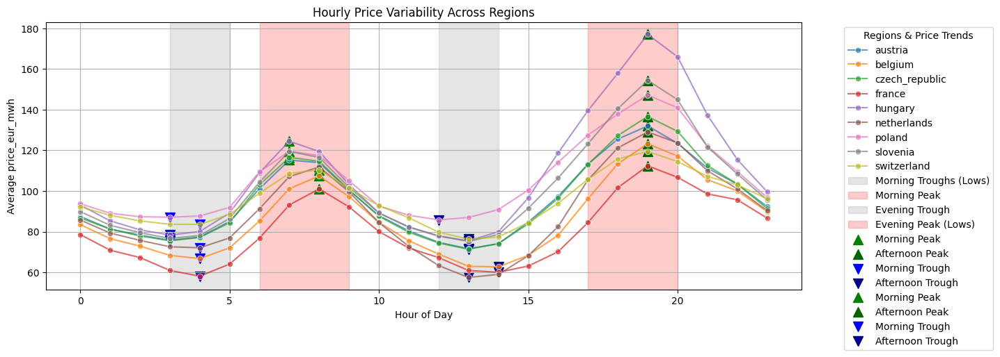

In [62]:

def plot_price_trends(hourly_avg_price_country):
    """
    Detects and visualizes morning & afternoon peaks and troughs in electricity prices.
    
    Parameters:
    - hourly_avg_price_country: DataFrame with 'hour_of_day', 'region_name', and 'price_eur_mwh' columns.
    """
    # Define morning (00:00-11:59) and afternoon (12:00-23:59) masks
    morning_mask = (hourly_avg_price_country['hour_of_day'] >= 0) & (hourly_avg_price_country['hour_of_day'] < 12)
    afternoon_mask = (hourly_avg_price_country['hour_of_day'] >= 12) & (hourly_avg_price_country['hour_of_day'] < 24)

    # Find peaks and troughs dynamically
    morning_peaks = hourly_avg_price_country.loc[
        hourly_avg_price_country[morning_mask].groupby('region_name')['price_eur_mwh'].idxmax()
    ]
    afternoon_peaks = hourly_avg_price_country.loc[
        hourly_avg_price_country[afternoon_mask].groupby('region_name')['price_eur_mwh'].idxmax()
    ]
    morning_troughs = hourly_avg_price_country.loc[
        hourly_avg_price_country[morning_mask].groupby('region_name')['price_eur_mwh'].idxmin()
    ]
    afternoon_troughs = hourly_avg_price_country.loc[
        hourly_avg_price_country[afternoon_mask].groupby('region_name')['price_eur_mwh'].idxmin()
    ]

    # Plot hourly price trends
    plt.figure(figsize=(14, 5))
    sns.lineplot(data=hourly_avg_price_country, x='hour_of_day', y='price_eur_mwh', marker='o', hue='region_name', alpha=0.7)

    # Highlight peak time windows
    plt.axvspan(3, 5, color='grey', alpha=0.2, label='Morning Troughs (Lows)')
    plt.axvspan(6, 9, color='red', alpha=0.2, label='Morning Peak')
    plt.axvspan(12, 14, color='grey', alpha=0.2, label='Evening Trough')
    plt.axvspan(17, 20, color='red', alpha=0.2, label='Evening Peak (Lows)')

    # Mark detected peaks & troughs with scatter points
    plt.scatter(morning_peaks['hour_of_day'], morning_peaks['price_eur_mwh'], color='green', label='Morning Peak', marker='^', s=100)
    plt.scatter(afternoon_peaks['hour_of_day'], afternoon_peaks['price_eur_mwh'], color='darkgreen', label='Afternoon Peak', marker='^', s=100)
    plt.scatter(morning_troughs['hour_of_day'], morning_troughs['price_eur_mwh'], color='blue', label='Morning Trough', marker='v', s=100)
    plt.scatter(afternoon_troughs['hour_of_day'], afternoon_troughs['price_eur_mwh'], color='darkblue', label='Afternoon Trough', marker='v', s=100)

    # Separate legend for peaks & troughs
    handles, labels = plt.gca().get_legend_handles_labels()
    peak_trough_legend = [
        plt.Line2D([0], [0], color='green', marker='^', linestyle='None', markersize=10, label='Morning Peak'),
        plt.Line2D([0], [0], color='darkgreen', marker='^', linestyle='None', markersize=10, label='Afternoon Peak'),
        plt.Line2D([0], [0], color='blue', marker='v', linestyle='None', markersize=10, label='Morning Trough'),
        plt.Line2D([0], [0], color='darkblue', marker='v', linestyle='None', markersize=10, label='Afternoon Trough')
    ]
    
    plt.legend(handles=handles + peak_trough_legend, title='Regions & Price Trends', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title('Hourly Price Variability Across Regions')
    plt.xlabel('Hour of Day')
    plt.ylabel('Average price_eur_mwh')
    plt.grid(True)
    plt.show()

    return morning_peaks,  afternoon_peaks, morning_troughs,afternoon_troughs

morning_peaks,  afternoon_peaks, morning_troughs,afternoon_troughs = \
plot_price_trends(hourly_avg_price_country)


<!-- array(['netherlands', 'switzerland', 'denmark', 'czech_republic',
       'luxembourg', 'sweden', 'austria', 'france', 'poland', 'norway',
       'belgium'], dtype=object) -->

In [63]:
afternoon_peaks



,hour_of_day,region_name,price_eur_mwh
171,19,austria,132.000239
172,19,belgium,123.228841
173,19,czech_republic,136.671650
174,19,france,112.395982
175,19,hungary,177.061675
176,19,netherlands,129.057544
177,19,poland,147.183451
178,19,slovenia,154.424912
179,19,switzerland,119.473287


/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning:

Glyph 8419 (\N{COMBINING ENCLOSING KEYCAP}) missing from font(s) DejaVu Sans.

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8419 (\N{COMBINING ENCLOSING KEYCAP}) missing from font(s) DejaVu Sans.



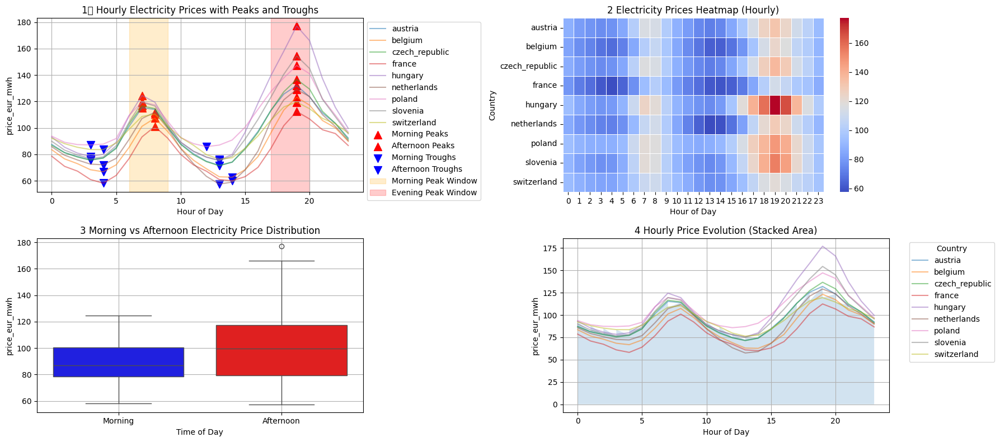

In [64]:
def visualize_price_trends(hourly_avg_price_country, morning_peaks, afternoon_peaks, morning_troughs, afternoon_troughs):
    """
    Generates four intelligent visualizations for electricity price trends:
    1. Dual Line & Scatter Plot (Hourly Prices with Peaks & Troughs)
    2. Heatmap (Hourly Price Intensity Across Countries)
    3. Boxplot (Morning vs. Afternoon Price Distribution)
    4. Stacked Area Plot (Total Price Trends Throughout the Day)
    
    Parameters:
    - hourly_avg_price_country (DataFrame): Hourly electricity price data.
    - morning_peaks (DataFrame): Morning peak price data.
    - afternoon_peaks (DataFrame): Afternoon peak price data.
    - morning_troughs (DataFrame): Morning low price data.
    - afternoon_troughs (DataFrame): Afternoon low price data.
    """

    fig, axes = plt.subplots(2, 2, figsize=(18, 8))  # Create a 2x2 grid of plots
    peak_color = 'red'
    trough_color = 'blue'

    ## 1️⃣ **Dual Line & Scatter Plot: Peaks & Troughs Overlay**
    ax1 = axes[0, 0]
    sns.lineplot(data=hourly_avg_price_country, x='hour_of_day', y='price_eur_mwh', hue='region_name', alpha=0.5, ax=ax1)

    ax1.scatter(morning_peaks['hour_of_day'], morning_peaks['price_eur_mwh'], color=peak_color, label='Morning Peaks', marker='^', s=100)
    ax1.scatter(afternoon_peaks['hour_of_day'], afternoon_peaks['price_eur_mwh'], color=peak_color, label='Afternoon Peaks', marker='^', s=100)

    ax1.scatter(morning_troughs['hour_of_day'], morning_troughs['price_eur_mwh'], color=trough_color, label='Morning Troughs', marker='v', s=100)
    ax1.scatter(afternoon_troughs['hour_of_day'], afternoon_troughs['price_eur_mwh'], color=trough_color, label='Afternoon Troughs', marker='v', s=100)

    ax1.axvspan(6, 9, color='orange', alpha=0.2, label='Morning Peak Window')
    ax1.axvspan(17, 20, color='red', alpha=0.2, label='Evening Peak Window')

    ax1.set_title('1️⃣ Hourly Electricity Prices with Peaks and Troughs')
    ax1.set_xlabel('Hour of Day')
    ax1.set_ylabel('price_eur_mwh')
    ax1.legend(loc='upper left', bbox_to_anchor=(1, 1))
    ax1.grid(True)

    ## 2️ **Heatmap: Hourly Price Intensity**
    ax2 = axes[0, 1]
    heatmap_data = hourly_avg_price_country.pivot(index='region_name', columns='hour_of_day', values='price_eur_mwh')
    sns.heatmap(heatmap_data, cmap='coolwarm', annot=False, linewidths=0.5, ax=ax2)

    ax2.set_title('2️ Electricity Prices Heatmap (Hourly)')
    ax2.set_xlabel('Hour of Day')
    ax2.set_ylabel('Country')

    ## 3️ **Boxplot: Morning vs. Afternoon Price Distribution**
    ax3 = axes[1, 0]
    hourly_avg_price_country['time_of_day'] = np.where(hourly_avg_price_country['hour_of_day'] < 12, 'Morning', 'Afternoon')
    sns.boxplot(x='time_of_day', y='price_eur_mwh', data=hourly_avg_price_country, palette=['blue', 'red'], ax=ax3)

    ax3.set_title('3️ Morning vs Afternoon Electricity Price Distribution')
    ax3.set_xlabel('Time of Day')
    ax3.set_ylabel('price_eur_mwh')
    ax3.grid(True)

    ## 4️ **Stacked Area Plot: Total Price Trends**
    ax4 = axes[1, 1]
    sns.lineplot(data=hourly_avg_price_country, x='hour_of_day', y='price_eur_mwh', hue='region_name', alpha=0.5, ax=ax4)
    ax4.fill_between(hourly_avg_price_country['hour_of_day'], hourly_avg_price_country['price_eur_mwh'], alpha=0.2)

    ax4.set_title('4️ Hourly Price Evolution (Stacked Area)')
    ax4.set_xlabel('Hour of Day')
    ax4.set_ylabel('price_eur_mwh')
    ax4.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax4.grid(True)

    ## **Show all subplots**
    plt.tight_layout()
    plt.show()

visualize_price_trends(hourly_avg_price_country, morning_peaks, afternoon_peaks, morning_troughs, afternoon_troughs)


In [65]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

def prepare_cluster_data(df):
    """
    Converts hourly price trends into a format suitable for clustering.
    Groups by region_name and hour_of_day to capture daily patterns.
    """
    # Pivot table to get regions as rows, hours as columns
    df_pivot = df.pivot(index='region_name', columns='hour_of_day', values='price_eur_mwh')

    # Normalize data to remove scale differences
    scaler = StandardScaler()
    df_scaled = pd.DataFrame(scaler.fit_transform(df_pivot), index=df_pivot.index, columns=df_pivot.columns)

    return df_scaled

def perform_kmeans_clustering(df_scaled, n_clusters=3):
    """
    Performs K-Means clustering on the hourly price trends.
    """
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    df_scaled['cluster'] = kmeans.fit_predict(df_scaled)
    return df_scaled, kmeans

def visualize_clusters(df_scaled, kmeans):
    """
    Plots cluster centroids to show representative daily price trends.
    """
    plt.figure(figsize=(14, 4))
    
    for cluster in range(kmeans.n_clusters):
        cluster_centroid = kmeans.cluster_centers_[cluster]
        plt.plot(range(24), cluster_centroid, label=f'Cluster {cluster}', linewidth=2)

    plt.title('Clustered Electricity Price Patterns by Country')
    plt.xlabel('Hour of Day')
    plt.ylabel('Standardized Price')
    plt.legend()
    plt.grid(True)
    plt.show()

df_scaled = prepare_cluster_data(hourly_avg_price_country)
df_clustered, kmeans_model = perform_kmeans_clustering(df_scaled, n_clusters=3)
# visualize_clusters(df_clustered, kmeans_model)


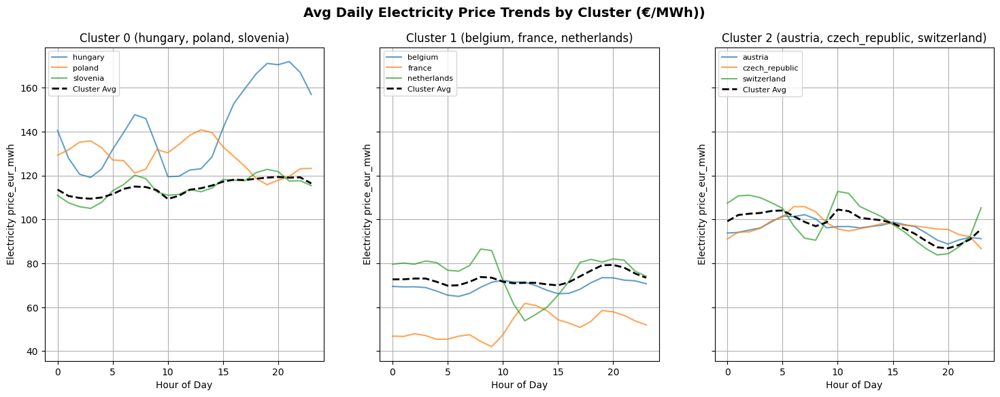

In [66]:

def plot_cluster_patterns_pivoted(df_clustered, original_means, original_stds):
    """
    Plots the average hourly price trend for each cluster in separate horizontal subplots.
    Each cluster plot includes the price trends of its respective countries.
    """
    # Extract cluster labels
    cluster_labels = df_clustered["cluster"]
    unique_clusters = np.unique(cluster_labels)
    num_clusters = len(unique_clusters)

    # Transpose the dataframe to get hour_of_day as an index
    df_transposed = df_clustered.drop(columns=['cluster']).T  

    fig, axes = plt.subplots(1, num_clusters, figsize=(6 * num_clusters, 6), sharey=True)

    if num_clusters == 1:
        axes = [axes]  # Ensure axes is iterable if only one cluster exists

    for ax, cluster in zip(axes, unique_clusters):
        # Select countries belonging to the current cluster
        cluster_countries = cluster_labels[cluster_labels == cluster].index
        cluster_data = df_transposed[cluster_countries]  # Select only relevant countries

        # Compute the average price per hour for this cluster (still standardized)
        cluster_avg_price_standardized = cluster_data.mean(axis=1)

        # Reverse the standardization using per-country values
        cluster_avg_price_real = (
            cluster_avg_price_standardized * original_stds.mean()
        ) + original_means.mean()

        # Plot individual country trends
        for country in cluster_countries:
            country_price_real = (
                df_transposed[country] * original_stds[country]
            ) + original_means[country]
            ax.plot(country_price_real.index, country_price_real.values, label=country, alpha=0.7)

        # Plot cluster-wide average
        ax.plot(cluster_avg_price_real.index, cluster_avg_price_real.values, color='black', linewidth=2, linestyle='--', label="Cluster Avg")

        # Add markers for key price events
        # ax.axvline(7, linestyle="--", color="gray", alpha=0.6, label="Morning Peak (7:00)")
        # ax.axvline(13, linestyle="--", color="gray", alpha=0.6, label="Afternoon Trough (13:00)")
        # ax.axvline(19, linestyle="--", color="red", alpha=0.6, label="Evening Peak (19:00)")

        # Format the title with country names
        country_list = ", ".join(cluster_countries)
        ax.set_title(f'Cluster {cluster} ({country_list})', fontsize=12)

        ax.set_xlabel('Hour of Day')
        ax.set_ylabel('Electricity price_eur_mwh')
        ax.grid(True)
        ax.legend(fontsize=8, loc="upper left")

    plt.suptitle('Avg Daily Electricity Price Trends by Cluster (€/MWh))', fontsize=14, fontweight='bold')
    plt.show()

# Compute means and stds from original data before standardization
original_means = hourly_avg_price_country.groupby("region_name")["price_eur_mwh"].mean()
original_stds = hourly_avg_price_country.groupby("region_name")["price_eur_mwh"].std()

# Run visualization
plot_cluster_patterns_pivoted(df_clustered, original_means, original_stds)


In [67]:
df_clustered.T

region_name,austria,belgium,czech_republic,france,hungary,netherlands,poland,slovenia,switzerland
hour_of_day,,,,,,,,,
0,-0.083186,-0.939739,-0.239154,-1.997487,1.111469,-0.459853,1.254400,0.425357,0.928193
1,-0.067577,-0.951404,-0.079119,-2.004683,0.687797,-0.434983,1.382741,0.278298,1.188929
2,-0.007780,-0.949359,-0.074706,-1.930369,0.443287,-0.460029,1.566513,0.202653,1.209789
3,0.044838,-0.967802,0.012817,-1.980546,0.395162,-0.389957,1.595605,0.169259,1.120625
4,0.195392,-1.055980,0.180174,-2.082154,0.524649,-0.424892,1.433319,0.288492,0.941000
5,0.338938,-1.158128,0.269255,-2.079722,0.822438,-0.591915,1.140470,0.514084,0.744580
6,0.326390,-1.190068,0.512386,-1.997233,1.081306,-0.613699,1.122185,0.636994,0.121739
7,0.373096,-1.112907,0.512391,-1.958479,1.350988,-0.488592,0.828210,0.818423,-0.323131
8,0.269113,-0.961009,0.393398,-2.143147,1.292674,-0.128097,0.921070,0.751169,-0.395172


In [68]:
kmeans_model

KMeans(n_clusters=3, n_init=10, random_state=42)

In [69]:
hourly_avg_price_country

,hour_of_day,region_name,price_eur_mwh,time_of_day
0,0,austria,87.508652,Morning
1,0,belgium,83.517040,Morning
2,0,czech_republic,86.781826,Morning
3,0,france,78.587846,Morning
4,0,hungary,93.075844,Morning
...,...,...,...,...
211,23,hungary,99.616952,Afternoon
212,23,netherlands,90.381914,Afternoon
213,23,poland,96.819559,Afternoon
214,23,slovenia,95.574207,Afternoon


In [70]:
# hourly_avg_price_all
# hourly_avg_price_all.describe()

**Insights from Hourly Trends**

1. Morning Peak (6 AM - 9 AM):

- Prices tend to rise as demand increases.
- Driven by household and business activity starting.

2. Evening Peak (5 PM - 8 PM):

- Prices spike as people return home and businesses still operate.
- Renewable supply may not match demand, leading to higher costs.

3. Midnight to Early Morning (12 AM - 5 AM):

- Prices drop significantly due to low demand.
- Often negative prices in regions with excess wind generation.


---

Regional Hourly Price Variability

We compare hourly fluctuations across different countries.

In [71]:
# Extract unique country names
unique_countries = df_day_ahead_price_hourly[df_day_ahead_price_hourly['region_type'] == 'country']['region_name'].unique()

# Display the unique countries
unique_countries


array(['belgium', 'france', 'netherlands', 'austria', 'poland',
       'switzerland', 'czech_republic', 'slovenia', 'hungary'],
      dtype=object)

In [72]:
df_day_ahead_price_countries = df_day_ahead_price_hourly[df_day_ahead_price_hourly['region_type'] == 'country']
df_day_ahead_price_countries['region_name'].unique()

array(['belgium', 'france', 'netherlands', 'austria', 'poland',
       'switzerland', 'czech_republic', 'slovenia', 'hungary'],
      dtype=object)

In [73]:
hourly_avg_price_region['region_name'].unique()

array(['austria', 'belgium', 'czech_republic', 'denmark_1', 'denmark_2',
       'france', 'germany/luxembourg', 'hungary', 'netherlands',
       'northern_italy', 'norway_2', 'poland', 'slovenia', 'sweden_4',
       'switzerland', '∅_de/lu_neighbours'], dtype=object)

In [74]:
hourly_avg_price_bzones['region_name'].unique()

array(['denmark_1', 'denmark_2', 'germany/luxembourg', 'northern_italy',
       'sweden_4', '∅_de/lu_neighbours'], dtype=object)

In [75]:
hourly_avg_price_country['region_name'].unique()

array(['austria', 'belgium', 'czech_republic', 'france', 'hungary',
       'netherlands', 'poland', 'slovenia', 'switzerland'], dtype=object)

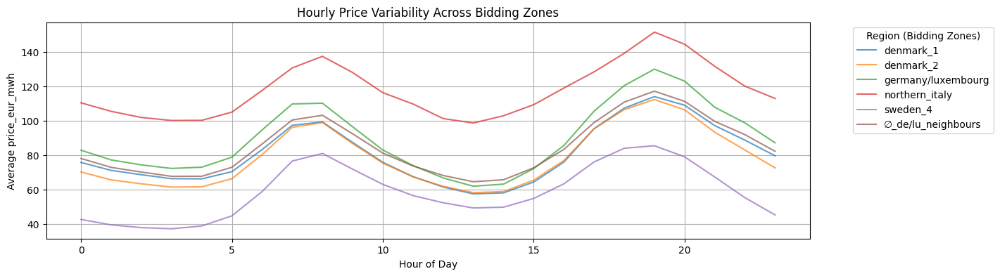

In [76]:
plt.figure(figsize=(14, 4))
sns.lineplot(data=hourly_avg_price_bzones, x='hour_of_day', y='price_eur_mwh', hue='region_name', alpha=0.7)

plt.title('Hourly Price Variability Across Bidding Zones')
plt.xlabel('Hour of Day')
plt.ylabel('Average price_eur_mwh')
plt.legend(title='Region (Bidding Zones)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

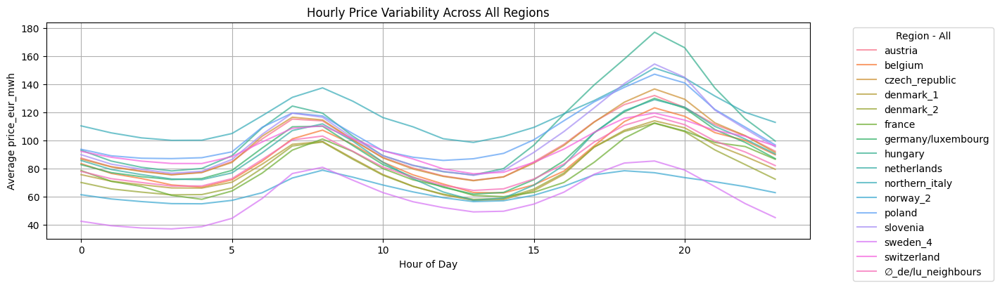

In [77]:
plt.figure(figsize=(14, 4))
sns.lineplot(data=hourly_avg_price_region, x='hour_of_day', y='price_eur_mwh', hue='region_name', alpha=0.7)

plt.title('Hourly Price Variability Across All Regions')
plt.xlabel('Hour of Day')
plt.ylabel('Average price_eur_mwh')
plt.legend(title='Region - All', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()



---

**Price Fluctuations Across Countries (Top & Bottom) Stats**

- Hourly Stats

In [78]:
hourly_avg_price_country

,hour_of_day,region_name,price_eur_mwh,time_of_day
0,0,austria,87.508652,Morning
1,0,belgium,83.517040,Morning
2,0,czech_republic,86.781826,Morning
3,0,france,78.587846,Morning
4,0,hungary,93.075844,Morning
...,...,...,...,...
211,23,hungary,99.616952,Afternoon
212,23,netherlands,90.381914,Afternoon
213,23,poland,96.819559,Afternoon
214,23,slovenia,95.574207,Afternoon


In [79]:
top5_highest_prices = hourly_avg_price_country.nlargest(5, 'price_eur_mwh')
top5_lowest_prices = hourly_avg_price_country.nsmallest(5, 'price_eur_mwh')

print("Top5 Hourly Price Across Countries:")
top5_highest_prices.T


Top5 Hourly Price Across Countries:


,175,184,166,178,177
hour_of_day,19,20,18,19,19
region_name,hungary,hungary,hungary,slovenia,poland
price_eur_mwh,177.061675,166.032292,157.953098,154.424912,147.183451
time_of_day,Afternoon,Afternoon,Afternoon,Afternoon,Afternoon


In [80]:
print("\nTop5 Lowest Price Hours:")
top5_lowest_prices


Top5 Lowest Price Hours:


,hour_of_day,region_name,price_eur_mwh,time_of_day
122,13,netherlands,57.476776,Afternoon
39,4,france,58.123589,Morning
131,14,netherlands,58.998652,Afternoon
129,14,france,60.022846,Afternoon
120,13,france,60.920970,Afternoon



---

**Observations from the Top 5 Lowest and Highest Price Hours**  

**Top 5 Lowest Price Hours**
- **Extreme negative prices (-500 €/MWh) occurred on July 2, 2023**, during the afternoon hours (13:00 - 15:00).
- **Regions affected:**  
  - **Germany/Luxembourg (Bidding Zone)**  
  - **Netherlands (Country)**  
  - **Austria (Country)**  
- **Possible reasons for extreme negative prices:**  
  - **High renewable generation (e.g., solar and wind) exceeding demand.**  
  - **Insufficient flexibility in power consumption or exports.**  
  - **Market regulations incentivizing generators to pay for excess electricity removal.**  

**Top 5 Highest Price Hours**
- **Prices peaked above 990 €/MWh between July and September 2024.**
- **Regions affected:**  
  - **Slovenia (1022 €/MWh on August 29, 2024, at 19:00).**  
  - **Hungary (999 €/MWh on multiple occasions).**  
- **Possible reasons for extreme high prices:**  
  - **High demand vs. limited supply during peak evening hours (19:00 - 21:00).**  
  - **Generation shortfalls or network congestion.**  
  - **Reliance on expensive imports or balancing energy.**  

---

In [81]:
# # Check for duplicates in highest prices
# dup_high = top5_highest_prices.duplicated(subset=['start_date', 'region_name'], keep=False)

# # Check for duplicates in lowest prices
# dup_low = top5_lowest_prices.duplicated(subset=['start_date', 'region_name'], keep=False)

# # Print results
# print("Duplicate highest prices:", top5_highest_prices[dup_high])
# print("Duplicate lowest prices:", top5_lowest_prices[dup_low])


- So each occurence was distinct

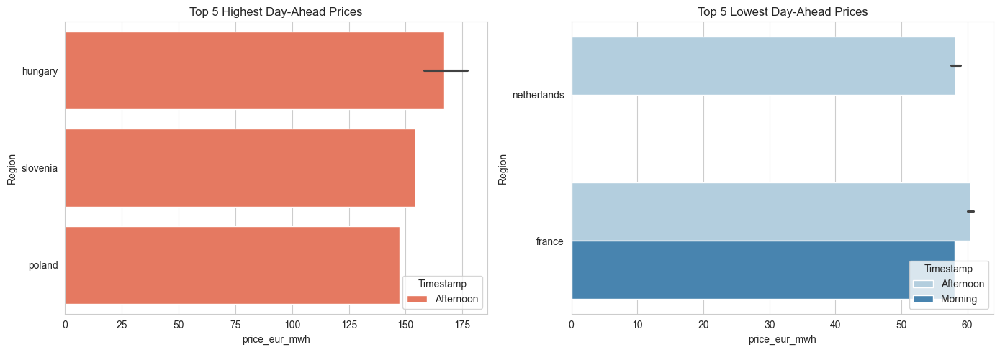

In [82]:
# Set plot style
sns.set_style("whitegrid")

# Create figure and axes
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot Top 5 Highest Prices
sns.barplot(
    data=top5_highest_prices, 
    x="price_eur_mwh", 
    y="region_name", 
    hue="time_of_day",
    palette="Reds_r",
    ax=axes[0]
)
axes[0].set_title("Top 5 Highest Day-Ahead Prices")
axes[0].set_xlabel("price_eur_mwh")
axes[0].set_ylabel("Region")
axes[0].legend(title="Timestamp", loc="lower right")

# Plot Top 5 Lowest Prices
sns.barplot(
    data=top5_lowest_prices, 
    x="price_eur_mwh", 
    y="region_name", 
    hue="time_of_day",
    palette="Blues",
    ax=axes[1]
)
axes[1].set_title("Top 5 Lowest Day-Ahead Prices")
axes[1].set_xlabel("price_eur_mwh")
axes[1].set_ylabel("Region")
axes[1].legend(title="Timestamp", loc="lower right")

# Adjust layout
plt.tight_layout()
plt.show()


In [83]:
df_day_ahead_price_hourly['region_name'].unique()

array(['germany/luxembourg', '∅_de/lu_neighbours', 'belgium', 'denmark_1',
       'denmark_2', 'france', 'netherlands', 'norway_2', 'austria',
       'poland', 'sweden_4', 'switzerland', 'czech_republic',
       'northern_italy', 'slovenia', 'hungary'], dtype=object)

In [84]:
hourly_avg_price_country['region_name'].unique()

array(['austria', 'belgium', 'czech_republic', 'france', 'hungary',
       'netherlands', 'poland', 'slovenia', 'switzerland'], dtype=object)

In [85]:
hourly_avg_price_bzones['region_name'].unique()

array(['denmark_1', 'denmark_2', 'germany/luxembourg', 'northern_italy',
       'sweden_4', '∅_de/lu_neighbours'], dtype=object)

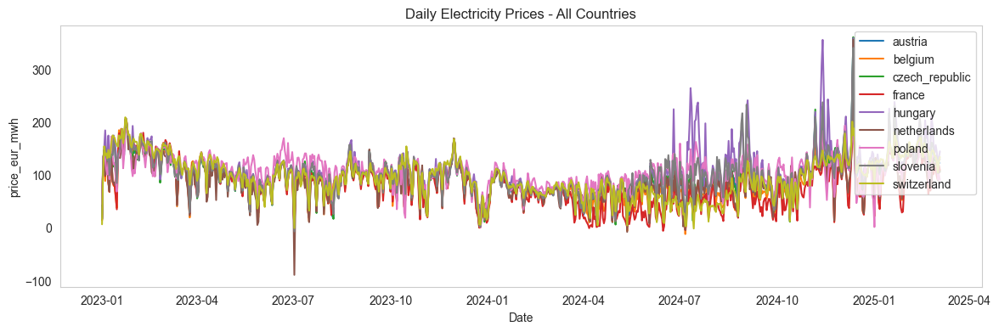

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



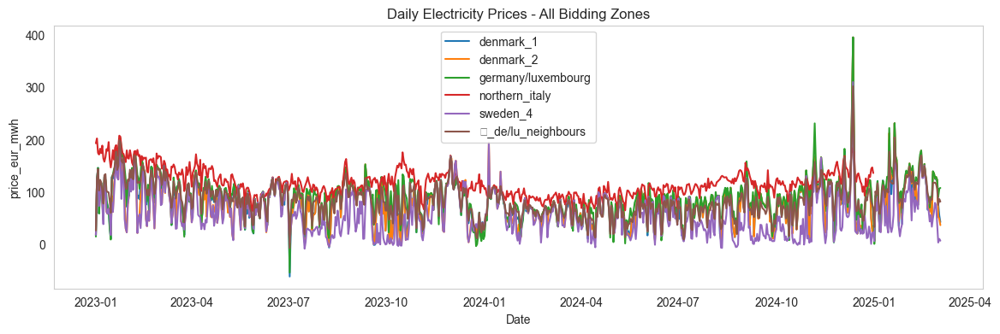

In [86]:
# Plot Daily Prices for Selected Countries
plt.figure(figsize=(14, 4))
# for country in all_countries:
for country in hourly_avg_price_country['region_name'].unique():
    subset = daily_avg_price_country[daily_avg_price_country['region_name'] == country]
    sns.lineplot(data=subset, x='date', y='price_eur_mwh', label=country)

plt.title('Daily Electricity Prices - All Countries')
plt.xlabel('Date')
plt.ylabel('price_eur_mwh')
plt.legend()
plt.grid()
plt.show()

# Plot Daily Prices for Selected Bidding Zones
plt.figure(figsize=(14, 4))
# for bzone in all_bzones:
for bzone in hourly_avg_price_bzones['region_name'].unique():
    subset = daily_avg_price_bzones[daily_avg_price_bzones['region_name'] == bzone]
    sns.lineplot(data=subset, x='date', y='price_eur_mwh', label=bzone)

plt.title('Daily Electricity Prices - All Bidding Zones')
plt.xlabel('Date')
plt.ylabel('price_eur_mwh')
plt.legend()
plt.grid()
plt.show()


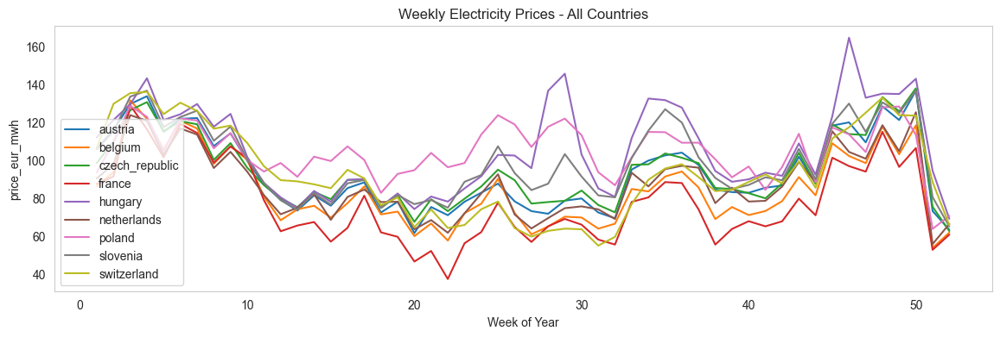

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



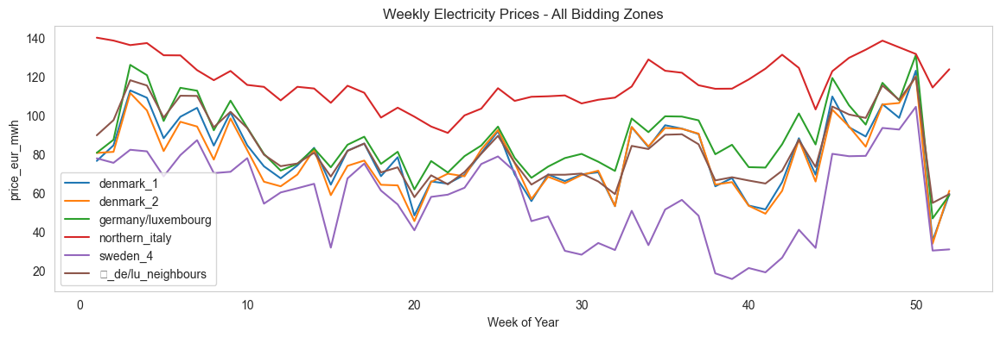

In [87]:
# Plot Weekly Prices for Selected Countries
plt.figure(figsize=(14, 4))
for country in hourly_avg_price_country['region_name'].unique():
    subset = weekly_avg_price_country[weekly_avg_price_country['region_name'] == country]
    sns.lineplot(data=subset, x='week_of_year', y='price_eur_mwh', label=country)

plt.title('Weekly Electricity Prices - All Countries')
plt.xlabel('Week of Year')
plt.ylabel('price_eur_mwh')
plt.legend()
plt.grid()
plt.show()

# Plot Weekly Prices for Selected Bidding Zones
plt.figure(figsize=(14, 4))
for bzone in hourly_avg_price_bzones['region_name'].unique():
    subset = weekly_avg_price_bzones[weekly_avg_price_bzones['region_name'] == bzone]
    sns.lineplot(data=subset, x='week_of_year', y='price_eur_mwh', label=bzone)

plt.title('Weekly Electricity Prices - All Bidding Zones')
plt.xlabel('Week of Year')
plt.ylabel('price_eur_mwh')
plt.legend()
plt.grid()
plt.show()


In [88]:
weekly_price_summary = df_day_ahead_price_hourly.describe()
print("\nWeekly Summary Statistics of Electricity Prices (All Countries) (€/MWh):")
weekly_price_summary.T


Weekly Summary Statistics of Electricity Prices (All Countries) (€/MWh):


,count,mean,min,25%,50%,75%,max,std
start_date,304896,2024-02-02 00:02:16.020150784,2023-01-01 00:00:00,2023-07-18 12:45:00,2024-02-01 23:30:00,2024-08-18 12:15:00,2025-03-04 23:00:00,NaN
end_date,304896,2024-02-02 01:02:06.952141824,2023-01-01 01:00:00,2023-07-18 13:45:00,2024-02-02 00:30:00,2024-08-18 13:15:00,2025-03-05 00:00:00,NaN
price_eur_mwh,303384.0,89.31331,-500.0,59.73,90.02,117.04,1022.27,51.360193
hour_of_day,304896.0,11.5,0.0,5.75,11.5,17.25,23.0,6.922198
week_of_year,304896.0,24.787836,1.0,10.0,24.0,38.0,52.0,15.56646


In [89]:
# Summary statistics for the entire dataset
summary_stats_overall = df_day_ahead_price_hourly['price_eur_mwh'].describe()

# Summary statistics by region type (country vs. bidding zone)
summary_stats_by_region = df_day_ahead_price_hourly.groupby('region_type')['price_eur_mwh'].describe()

# Summary statistics by individual country/bidding zone
summary_stats_by_region_name = df_day_ahead_price_hourly.groupby('region_name')['price_eur_mwh'].describe()

# Checking skewness (for detecting asymmetric distributions)
skewness = df_day_ahead_price_hourly['price_eur_mwh'].skew()

# Checking for outliers using interquartile range (IQR)
Q1 = df_day_ahead_price_hourly['price_eur_mwh'].quantile(0.25)
Q3 = df_day_ahead_price_hourly['price_eur_mwh'].quantile(0.75)
IQR = Q3 - Q1
outliers = df_day_ahead_price_hourly[
    (df_day_ahead_price_hourly['price_eur_mwh'] < (Q1 - 1.5 * IQR)) | 
    (df_day_ahead_price_hourly['price_eur_mwh'] > (Q3 + 1.5 * IQR))
]

# Display results
summary_stats_overall, summary_stats_by_region, summary_stats_by_region_name, skewness, outliers.shape


(count    303384.000000
 mean         89.313310
 std          51.360193
 min        -500.000000
 25%          59.730000
 50%          90.020000
 75%         117.040000
 max        1022.270000
 Name: price_eur_mwh, dtype: float64,
                  count       mean        std    min      25%    50%     75%  \
 region_type                                                                   
 bidding_zone  112824.0  84.465008  50.742978 -500.0  51.5175  86.88  113.73   
 country       171504.0  95.154921  51.860962 -500.0  69.2100  94.90  121.65   
 
                   max  
 region_type            
 bidding_zone   936.31  
 country       1022.27  ,
                       count        mean        std     min      25%      50%  \
 region_name                                                                    
 austria             19056.0   95.326213  49.015047 -500.00  70.7000   94.890   
 belgium             19056.0   86.579974  47.241271 -140.00  60.0000   88.085   
 czech_republic      19

---
---
---

**Insights from Summary Statistics of Electricity Prices**   

**1. General Price Levels and Trends**  
- **Lowest Average Prices**:  
  - Sweden (`58.65 €/MWh`)  
  - Norway (`65.44 €/MWh`)  
  - France (`80.11 €/MWh`)  
- **Highest Average Prices**:  
  - Northern Italy (`117.58 €/MWh`)  
  - Hungary (`107.34 €/MWh`)  
  - Poland (`105.38 €/MWh`)  
  - Slovenia (`101.08 €/MWh`)  

**2. Price Volatility (Standard Deviation)**
- **Most Volatile Markets** (High Std Dev → More Price Fluctuations):  
  - **Hungary** (`69.08`)  
  - **Slovenia** (`54.56`)  
  - **Denmark (both zones)** (`~51-52`)  
  - **Sweden** (`51.53`)  
  - **Germany/Luxembourg** (`51.63`)  

- **Least Volatile Markets** (Low Std Dev → More Stable Prices):  
  - **Northern Italy** (`33.89`)  
  - **Norway** (`39.11`)  
  - **Switzerland** (`43.68`)  

**3. Extreme Prices (Min & Max)**
- **Lowest Recorded Prices** (Occasional negative prices):  
  - `Germany/Luxembourg`: `-500 €/MWh`  
  - `Netherlands`: `-500 €/MWh`  
  - `Austria`: `-500 €/MWh`  
  - `Slovenia`: `-500 €/MWh`  
  - `Hungary`: `-500 €/MWh`  
  - **Likely due to high renewable generation during low demand periods.**  

- **Highest Recorded Prices**:  
  - **Slovenia** (`1022.27 €/MWh`)  
  - **Hungary** (`999.01 €/MWh`)  
  - **Germany/Luxembourg** (`936.28 €/MWh`)  

**4. Germany vs. Neighbors**  
- **Germany/Luxembourg Avg Price**: `89.47 €/MWh`  
- **Average Neighboring Price (∅_de/lu_neighbours)**: `84.65 €/MWh`  
- **Austria Avg Price**: `95.33 €/MWh`  
- **Czech Republic Avg Price**: `95.79 €/MWh`  

Germany tends to have slightly lower prices than its neighbors, likely due to high renewable penetration.

---

In [90]:
# # Compute summary statistics
# price_summary = day_ahead_price_hourly_df[all_countries].describe()
# print("\nSummary Statistics of Electricity Prices (€/MWh):")
# price_summary.T

In [91]:
hourly_avg_price_country['region_name'].unique()


array(['austria', 'belgium', 'czech_republic', 'france', 'hungary',
       'netherlands', 'poland', 'slovenia', 'switzerland'], dtype=object)

In [92]:
import pandas as pd
import plotly.express as px

# Aggregate prices by country
df_avg_price = hourly_avg_price_country.groupby("region_name")["price_eur_mwh"].mean().reset_index()

# Standardizing country names for Plotly compatibility
country_name_mapping = {
    "czech_republic": "Czech Republic",
    "netherlands": "Netherlands",
    "switzerland": "Switzerland",
    "slovenia": "Slovenia",
    "poland": "Poland",
    "hungary": "Hungary",
    "france": "France",
    "belgium": "Belgium",
    "austria": "Austria"
}

df_avg_price["region_name"] = df_avg_price["region_name"].replace(country_name_mapping)

# Get min and max price for color normalization
price_min = df_avg_price["price_eur_mwh"].min()
price_max = df_avg_price["price_eur_mwh"].max()

# Create the Choropleth Map
fig = px.choropleth(
    df_avg_price,
    locations="region_name",
    locationmode="country names",
    color="price_eur_mwh",
    color_continuous_scale="YlOrRd",
    title="Average Electricity Prices Across Selected European Countries (€/MWh)",
    projection="natural earth",
    scope="europe",
    range_color=[price_min, price_max]
)

# Increase Figure Size and Adjust Layout
#  Adjust layout and move legend
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width=1000,
    height=500,
    coloraxis_colorbar=dict(
        title="price_eur_mwh",
        x=-0.98,  # Moves the legend slightly to the left
        y=0.5,   # Centers it vertically
        len=0.75  # Adjusts the height of the color bar
    )
)


# Show the map
fig.show()



 **Cluster 0: Low Price Volatility (10 Regions)**
austria, belgium, czech_republic, denmark_1, denmark_2, france, germany/luxembourg, netherlands, switzerland, ∅_de/lu_neighbours

 **Cluster 1: Moderate Price Variability (2 Regions)**
norway_2, sweden_4

 **Cluster 2: High Price Spikes (3 Regions)**
hungary, poland, slovenia


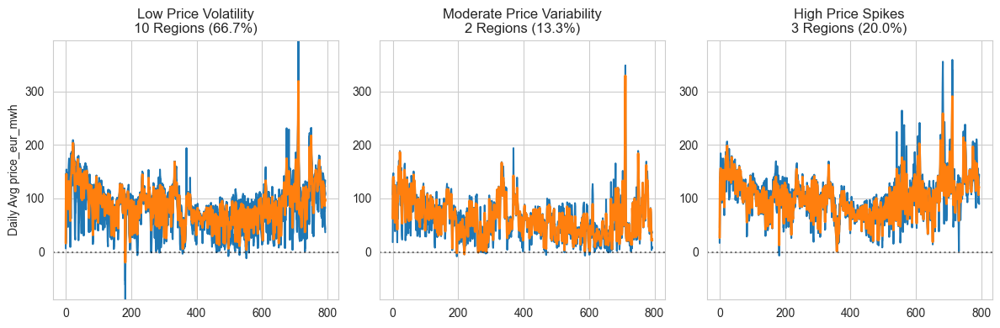

In [93]:
from sklearn.cluster import KMeans

# Pivot to create a matrix: Rows = Regions, Columns = Days, Values = Daily Avg Price
daily_avg_price = df_day_ahead_price_hourly.groupby(['date', 'region_name'])['price_eur_mwh'].mean().reset_index()
# pivot_df = daily_avg_price_country.pivot(index="region_name", columns="date", values="day_ahead_price_€/MWh")
pivot_df = daily_avg_price.pivot(index="region_name", columns="date", values="price_eur_mwh")

pivot_df = pivot_df.dropna()

price_trends = pivot_df.values  

n_clusters = 3  # Adjust as needed
kmeans = KMeans(n_clusters=n_clusters, n_init="auto", random_state=0)
price_cluster_labels = kmeans.fit_predict(price_trends)

# Assign cluster labels to regions
pivot_df['Cluster'] = price_cluster_labels  


def plot_price_cluster_distribution(pivot_df, price_trends, price_cluster_labels, n_clusters=3):
    """
    Plots clustered daily electricity price patterns per region and prints region names for each cluster.

    Parameters
    ----------
    pivot_df : DataFrame
        DataFrame containing daily average prices per region.
    price_trends : ndarray
        2D array where rows represent regions and columns represent daily price trends.
    price_cluster_labels : ndarray
        Array of cluster labels assigned by K-Means.
    n_clusters : int, optional
        Number of clusters.

    Returns
    -------
    None
        Displays clusters of electricity price patterns and prints region names per cluster.
    """    
    plt.figure(figsize=(12, 4))
    
    cluster_names = ["Low Price Volatility", "Moderate Price Variability", "High Price Spikes"]

    for cluster_num in range(n_clusters):
        membership = price_cluster_labels == cluster_num
        cluster_regions = pivot_df.index[membership].tolist()  # Get region names in this cluster
        
        # Print region names under each cluster
        print(f"\n **Cluster {cluster_num}: {cluster_names[cluster_num]} ({np.sum(membership)} Regions)**")
        print(", ".join(cluster_regions))  # Print region names comma-separated

        plt.subplot(1, n_clusters, cluster_num + 1)

        # Plot individual daily price trends per region
        for region_profile in price_trends[membership]:
            plt.plot(region_profile, "C0", alpha=min(1, 20 / max(1, np.sum(membership))))  # Fix: Ensure alpha is within [0,1]
        
        # Plot cluster-average trend
        plt.plot(price_trends[membership].mean(0), "C1", linewidth=2)    

        # Title with statistics
        plt.title("{0}\n{1} Regions ({2:0.1f}%)".format(
            cluster_names[cluster_num],
            np.sum(membership),
            100 * np.mean(membership)
        ))

        # X-axis formatting (dates)
        # plt.xticks(np.linspace(0, price_trends.shape[1] - 1, 6), rotation=45)
        plt.axhline(0, linestyle=":", color="k", alpha=0.5)

        # Y-axis label only for the first subplot
        if cluster_num == 0:
            plt.ylabel("Daily Avg price_eur_mwh")
        plt.ylim(pivot_df.values.min(), pivot_df.values.max())

    plt.tight_layout()
    plt.show()


# Call the function to plot clusters
plot_price_cluster_distribution(pivot_df, price_trends, price_cluster_labels)


In [94]:
hourly_avg_price_country

,hour_of_day,region_name,price_eur_mwh,time_of_day
0,0,austria,87.508652,Morning
1,0,belgium,83.517040,Morning
2,0,czech_republic,86.781826,Morning
3,0,france,78.587846,Morning
4,0,hungary,93.075844,Morning
...,...,...,...,...
211,23,hungary,99.616952,Afternoon
212,23,netherlands,90.381914,Afternoon
213,23,poland,96.819559,Afternoon
214,23,slovenia,95.574207,Afternoon



 **Cluster 0: Midday Peak (10 Regions)**
austria, belgium, czech_republic, denmark_1, denmark_2, france, germany/luxembourg, netherlands, switzerland, ∅_de/lu_neighbours

 **Cluster 1: Midday Trough (2 Regions)**
norway_2, sweden_4

 **Cluster 2: Evening Peak (4 Regions)**
hungary, northern_italy, poland, slovenia


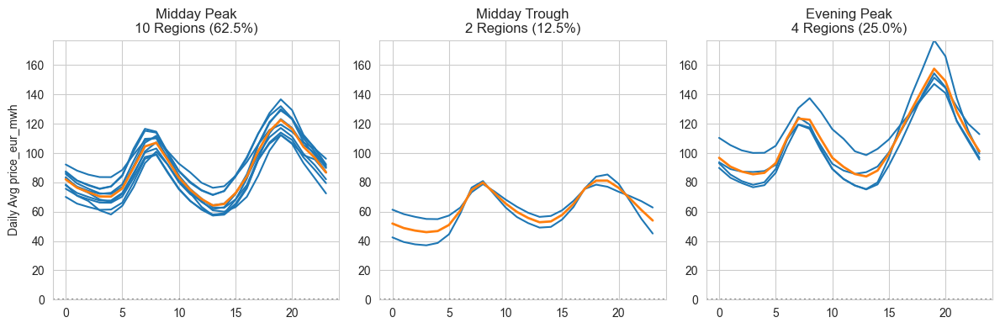

In [95]:
from sklearn.cluster import KMeans

# Pivot to create a matrix: Rows = Regions, Columns = Days, Values = Daily Avg Price
hourly_avg_price = df_day_ahead_price_hourly.groupby(['hour_of_day', 'region_name'])['price_eur_mwh'].mean().reset_index()
pivot_df = hourly_avg_price.pivot(index="region_name", columns="hour_of_day", values="price_eur_mwh")
# pivot_df = hourly_avg_price_country.pivot(index="region_name", columns="date", values="day_ahead_price_€/MWh")

pivot_df = pivot_df.dropna()

price_trends = pivot_df.values  

n_clusters = 3  # Adjust as needed
kmeans = KMeans(n_clusters=n_clusters, n_init="auto", random_state=0)
price_cluster_labels = kmeans.fit_predict(price_trends)

# Assign cluster labels to regions
pivot_df['Cluster'] = price_cluster_labels  


def plot_price_cluster_distribution(pivot_df, price_trends, price_cluster_labels, n_clusters=3):
    """
    Plots clustered daily electricity price patterns per region and prints region names for each cluster.

    Parameters
    ----------
    pivot_df : DataFrame
        DataFrame containing daily average prices per region.
    price_trends : ndarray
        2D array where rows represent regions and columns represent daily price trends.
    price_cluster_labels : ndarray
        Array of cluster labels assigned by K-Means.
    n_clusters : int, optional
        Number of clusters.

    Returns
    -------
    None
        Displays clusters of electricity price patterns and prints region names per cluster.
    """    
    plt.figure(figsize=(12, 4))
    
    cluster_names = ["Midday Peak", "Midday Trough", "Evening Peak"]

    for cluster_num in range(n_clusters):
        membership = price_cluster_labels == cluster_num
        cluster_regions = pivot_df.index[membership].tolist()  # Get region names in this cluster
        
        # Print region names under each cluster
        print(f"\n **Cluster {cluster_num}: {cluster_names[cluster_num]} ({np.sum(membership)} Regions)**")
        print(", ".join(cluster_regions))  # Print region names comma-separated

        plt.subplot(1, n_clusters, cluster_num + 1)

        # Plot individual daily price trends per region
        for region_profile in price_trends[membership]:
            plt.plot(region_profile, "C0", alpha=min(1, 20 / max(1, np.sum(membership))))  # Fix: Ensure alpha is within [0,1]
        
        # Plot cluster-average trend
        plt.plot(price_trends[membership].mean(0), "C1", linewidth=2)    

        # Title with statistics
        plt.title("{0}\n{1} Regions ({2:0.1f}%)".format(
            cluster_names[cluster_num],
            np.sum(membership),
            100 * np.mean(membership)
        ))

        # X-axis formatting (dates)
        # plt.xticks(np.linspace(0, price_trends.shape[1] - 1, 6), rotation=45)
        plt.axhline(0, linestyle=":", color="k", alpha=0.5)

        # Y-axis label only for the first subplot
        if cluster_num == 0:
            plt.ylabel("Daily Avg price_eur_mwh")
        plt.ylim(pivot_df.values.min(), pivot_df.values.max())

    plt.tight_layout()
    plt.show()


# Call the function to plot clusters
plot_price_cluster_distribution(pivot_df, price_trends, price_cluster_labels)


In [96]:
# df_day_ahead_price_hourly_copy = df_day_ahead_price_hourly.dropna()

def get_daily_price_features(df_day_ahead_price_hourly):
    """
    Computes raw and normalized daily average electricity prices for each region.

    Parameters
    ----------
    df_day_ahead_price_hourly : DataFrame
        DataFrame containing hourly day-ahead electricity prices for multiple regions.

    Returns
    -------
    raw_daily_features : ndarray
        An array containing raw daily electricity price profiles for each region.
    daily_features : ndarray
        An array containing normalized daily electricity price profiles for each region.
    region_names : list
        List of region names corresponding to the rows of the output arrays.
    """
    raw_daily_features = []
    daily_features = []
    region_names = []

    for region, df_region in df_day_ahead_price_hourly.groupby("region_name"):
        # Compute daily average price
        # daily_profile = df_region.groupby("date")["day_ahead_price_€/MWh"].mean().values
        daily_profile = df_region.groupby("date")["price_eur_mwh"].mean().values
        raw_daily_features.append(daily_profile)

        # Normalize data (Z-score normalization)
        mu, sigma = daily_profile.mean(), daily_profile.std()
        normalized_profile = (daily_profile - mu) / sigma
        daily_features.append(normalized_profile)

        # Store region name
        region_names.append(region)

    return np.array(raw_daily_features), np.array(daily_features), region_names

raw_prices, norm_prices, regions = get_daily_price_features(daily_avg_price)
print("Shape of raw price matrix:", raw_prices.shape)  # (num_regions, num_days)
print("First region:", regions[0])
print("First region's raw prices:", raw_prices[0][:5])  # First 5 daily prices
print("First region's normalized prices:", norm_prices[0][:5])  # First 5 normalized prices


Shape of raw price matrix: (16, 794)
First region: austria
First region's raw prices: [ 16.6875     126.36458333 147.28333333 142.74666667 132.32583333]
First region's normalized prices: [-2.07816514  0.82029572  1.37312022  1.25322871  0.97783501]


In [97]:
from sklearn.cluster import KMeans

# def plot_tod_n_clusters(daily_features, region_names):
#     """
#     Plots cluster profiles for daily electricity prices, using K-means clustering.

#     Parameters
#     ----------
#     daily_features : ndarray
#         Array of daily electricity price patterns for multiple regions (shape: n_regions, n_days).
#     region_names : list
#         List of region names corresponding to daily_features.

#     Returns
#     -------
#     None
#         Displays cluster profiles for 2, 3, and 4 clusters, including region names in each cluster.
#     """    
#     # Handle NaN values by filling with the mean price of each region (row-wise)
#     nan_mask = np.isnan(daily_features)
#     row_means = np.nanmean(daily_features, axis=1)  # Compute mean price per region
#     daily_features[nan_mask] = np.take(row_means, np.where(nan_mask)[0])  # Fill NaNs with row means

#     plt.figure(figsize=(10, 2.5))
    
#     for plot_num, n_clusters in enumerate([2, 3, 4]):
#         plt.subplot(1, 3, plot_num+1)    

#         # Fit K-Means model
#         cluster_model = KMeans(n_clusters=n_clusters, n_init="auto", random_state=0)
#         cluster_labels = cluster_model.fit_predict(daily_features)

#         # Plot mean profiles for each cluster
#         for cluster_num in range(n_clusters):        
#             plt.plot(daily_features[cluster_labels == cluster_num].mean(axis=0), label=f"Cluster {cluster_num}")

#         plt.title(f"n_clusters={n_clusters}")
#         plt.xticks(np.arange(0, daily_features.shape[1], 6), ["12am", "6am", "12pm", "6pm", "12am"])
#         if plot_num == 0:
#             plt.ylabel("Normalized Price")

#         # Print region names in each cluster
#         print(f"\n🔹 **Regions in {n_clusters} Clusters:**")
#         for cluster_num in range(n_clusters):
#             regions_in_cluster = np.array(region_names)[cluster_labels == cluster_num]
#             print(f"  - Cluster {cluster_num}: {', '.join(regions_in_cluster)}")

#     plt.tight_layout()
#     plt.legend()
#     plt.show()


# # Assume pivot_df (regions × daily prices) is already created
# daily_features = pivot_df.iloc[:, :-1].values  # Exclude "Cluster" column
# region_names = pivot_df.index.tolist()  # Extract region names

# plot_tod_n_clusters(daily_features, region_names)


In [98]:
# Define a function to plot different types of time-series

def plot_series(df=None, column=None, series=pd.Series([]), 
                label=None, ylabel=None, title=None, start=0, end=None):
    """
    Plots a certain time-series which has either been loaded in a dataframe
    and which constitutes one of its columns or it a custom pandas series 
    created by the user. The user can define either the 'df' and the 'column' 
    or the 'series' and additionally, can also define the 'label', the 
    'ylabel', the 'title', the 'start' and the 'end' of the plot.
    """
    sns.set()
    fig, ax = plt.subplots(figsize=(30, 12))
    ax.set_xlabel('Time', fontsize=16)
    if column:
        ax.plot(df[column][start:end], label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if series.any():
        ax.plot(series, label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if label:
        ax.legend(fontsize=16)
    if title:
        ax.set_title(title, fontsize=24)
    ax.grid(True)
    return ax


# Zoom into the plot of the hourly (actual) total load


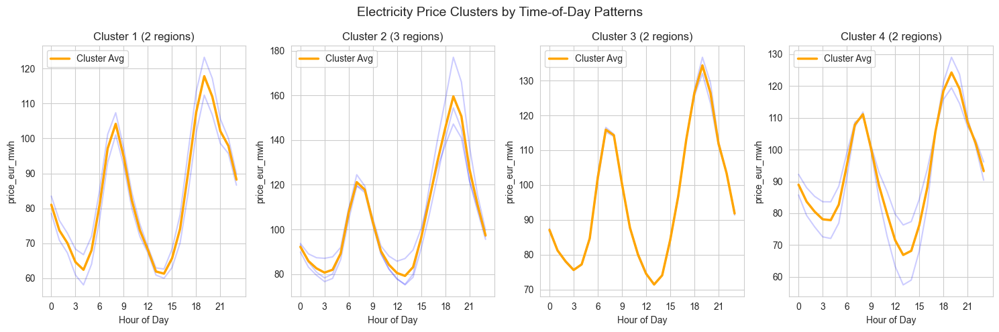

In [99]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

def plot_time_of_day_clusters(df, n_clusters=3):
    """
    Plots electricity price clusters based on time-of-day patterns.

    Parameters:
    -----------
    df : DataFrame
        Must contain ['hour_of_day', 'region_name', 'price_eur_mwh'].
    n_clusters : int
        Number of clusters to use for K-Means.
    
    Returns:
    --------
    None
        Displays the clustered electricity price profiles.
    """
    # Pivot to get time-series structure: rows = hours, columns = regions
    pivot_df = df.pivot(index='hour_of_day', columns='region_name', values='price_eur_mwh')
    
    # Normalize prices per region (optional, improves clustering stability)
    normalized_data = (pivot_df - pivot_df.mean()) / pivot_df.std()

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, n_init="auto", random_state=42)
    cluster_labels = kmeans.fit_predict(normalized_data.T)  # Transpose to cluster regions

    # Assign each region to a cluster
    cluster_map = {region: cluster for region, cluster in zip(pivot_df.columns, cluster_labels)}

    # Plot each cluster
    plt.figure(figsize=(15, 5))
    for cluster in range(n_clusters):
        plt.subplot(1, n_clusters, cluster + 1)
        cluster_regions = [r for r in pivot_df.columns if cluster_map[r] == cluster]
        
        if not cluster_regions:  # Skip empty clusters
            continue

        # Plot individual region trends (faint lines)
        for region in cluster_regions:
            plt.plot(pivot_df.index, pivot_df[region], color='blue', alpha=0.2)

        # Plot cluster average trend (bold line)
        cluster_avg = pivot_df[cluster_regions].mean(axis=1)
        plt.plot(pivot_df.index, cluster_avg, color='orange', linewidth=2.5, label="Cluster Avg")

        plt.title(f"Cluster {cluster+1} ({len(cluster_regions)} regions)")
        plt.xlabel("Hour of Day")
        plt.ylabel("price_eur_mwh")
        plt.xticks(np.arange(0, 24, 3))
        plt.legend()
        plt.grid(True)

    plt.suptitle("Electricity Price Clusters by Time-of-Day Patterns", fontsize=14)
    plt.tight_layout()
    plt.show()

plot_time_of_day_clusters(hourly_avg_price_country, n_clusters=4)


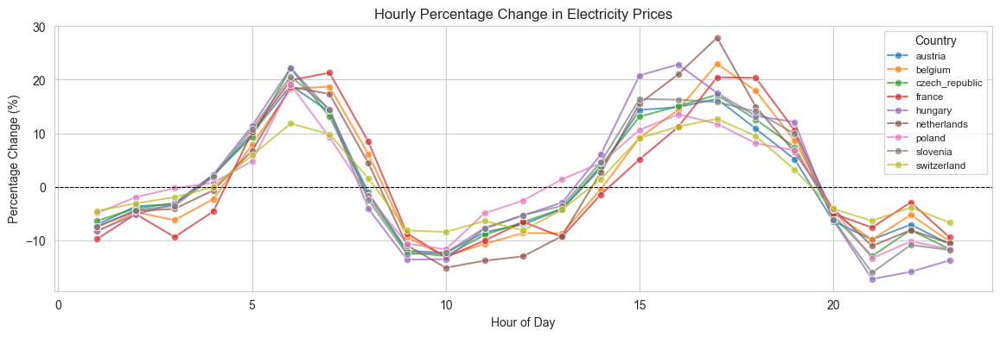

In [100]:
# Compute hourly percentage change
hourly_avg_price_country['price_pct_change'] = hourly_avg_price_country.groupby('region_name')['price_eur_mwh'].pct_change() * 100

# Plot
plt.figure(figsize=(14, 4))
sns.lineplot(data=hourly_avg_price_country, x='hour_of_day', y='price_pct_change', hue='region_name', marker="o", alpha=0.7)

# Formatting
plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
plt.title("Hourly Percentage Change in Electricity Prices")
plt.xlabel("Hour of Day")
plt.ylabel("Percentage Change (%)")
plt.legend(loc='upper right', fontsize='small', title="Country")
plt.grid(True)
plt.show()


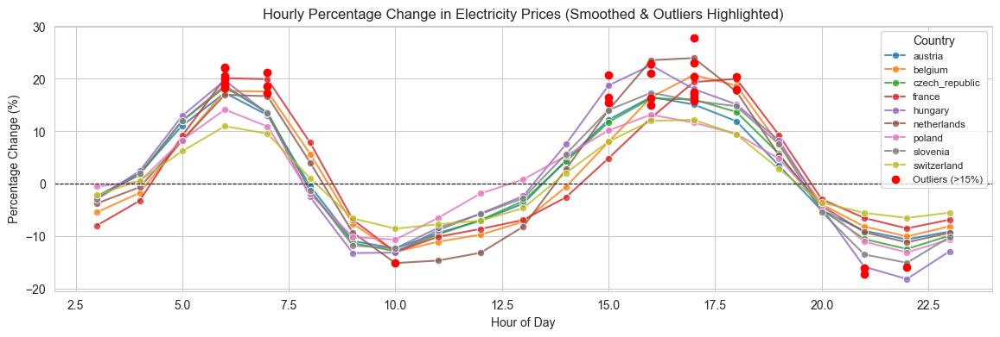

In [101]:
from scipy.signal import savgol_filter

# Step 1: Compute percentage change
hourly_avg_price_country['price_pct_change'] = hourly_avg_price_country.groupby('region_name')['price_eur_mwh'].pct_change() * 100

# Step 2: Smooth the percentage change (Savitzky-Golay filter)
hourly_avg_price_country['smoothed_pct_change'] = hourly_avg_price_country.groupby('region_name')['price_pct_change'].transform(
    lambda x: savgol_filter(x, window_length=5, polyorder=2) if len(x) >= 5 else x
)

# Step 3: Identify extreme fluctuations (> 15%)
hourly_avg_price_country['is_outlier'] = np.abs(hourly_avg_price_country['price_pct_change']) > 15

# Step 4: Plot the smoothed trend
plt.figure(figsize=(14,4))
sns.lineplot(
    data=hourly_avg_price_country, 
    x='hour_of_day', 
    y='smoothed_pct_change', 
    hue='region_name', 
    alpha=0.8, 
    marker="o"
)

# Step 5: Highlight outliers
outlier_data = hourly_avg_price_country[hourly_avg_price_country['is_outlier']]
plt.scatter(
    outlier_data['hour_of_day'], 
    outlier_data['price_pct_change'], 
    color='red', 
    label='Outliers (>15%)', 
    zorder=3
)

# Formatting
plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
plt.title("Hourly Percentage Change in Electricity Prices (Smoothed & Outliers Highlighted)")
plt.xlabel("Hour of Day")
plt.ylabel("Percentage Change (%)")
plt.legend(loc='upper right', fontsize='small', title="Country")
plt.grid(True)
plt.show()


In [102]:
outlier_data

,hour_of_day,region_name,price_eur_mwh,time_of_day,price_pct_change,smoothed_pct_change,is_outlier
54,6,austria,101.094257,Morning,18.953314,17.327667,True
55,6,belgium,85.230239,Morning,18.336624,17.684084,True
56,6,czech_republic,103.040000,Morning,22.109725,18.391017,True
57,6,france,76.786310,Morning,19.897020,20.130333,True
58,6,hungary,108.991599,Morning,22.224771,19.722920,True
59,6,netherlands,91.259773,Morning,18.632681,16.971626,True
60,6,poland,109.419244,Morning,19.028551,14.142671,True
61,6,slovenia,104.343552,Morning,20.624098,18.726387,True
64,7,belgium,101.153992,Morning,18.683220,17.599088,True
66,7,france,93.140327,Morning,21.298090,19.943426,True


Countries with Outlier Price Changes (>15%):
['austria' 'belgium' 'czech_republic' 'france' 'hungary' 'netherlands'
 'poland' 'slovenia']


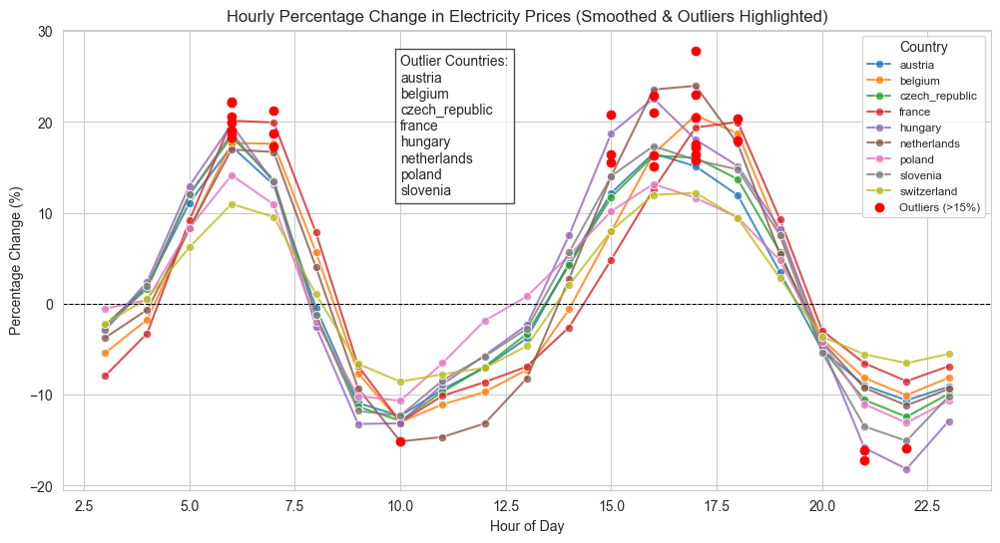

In [103]:

from scipy.signal import savgol_filter

# Step 1: Compute percentage change
hourly_avg_price_country['price_pct_change'] = hourly_avg_price_country.groupby('region_name')['price_eur_mwh'].pct_change() * 100

# Step 2: Smooth the percentage change (Savitzky-Golay filter)
hourly_avg_price_country['smoothed_pct_change'] = hourly_avg_price_country.groupby('region_name')['price_pct_change'].transform(
    lambda x: savgol_filter(x, window_length=5, polyorder=2) if len(x) >= 5 else x
)

# Step 3: Identify extreme fluctuations (> 15%)
hourly_avg_price_country['is_outlier'] = np.abs(hourly_avg_price_country['price_pct_change']) > 15

# Step 4: Extract and print unique countries with outliers
outlier_countries = hourly_avg_price_country.loc[hourly_avg_price_country['is_outlier'], 'region_name'].unique()
print("Countries with Outlier Price Changes (>15%):")
print(outlier_countries)

# Step 5: Plot the smoothed trend
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=hourly_avg_price_country, 
    x='hour_of_day', 
    y='smoothed_pct_change', 
    hue='region_name', 
    alpha=0.8, 
    marker="o"
)

# Step 6: Highlight outliers
outlier_data = hourly_avg_price_country[hourly_avg_price_country['is_outlier']]
plt.scatter(
    outlier_data['hour_of_day'], 
    outlier_data['price_pct_change'], 
    color='red', 
    label='Outliers (>15%)', 
    zorder=3
)

# Step 7: Add an annotation box in the center of the plot
outlier_text = "\n".join(outlier_countries)
plt.annotate(
    f"Outlier Countries:\n{outlier_text}", 
    xy=(10, 12),  # Adjusted for central positioning
    xycoords='data',
    fontsize=10, 
    bbox=dict(facecolor='white', edgecolor='black', alpha=0.7)
)

# Formatting
plt.axhline(0, color='black', linestyle='--', linewidth=0.8)
plt.title("Hourly Percentage Change in Electricity Prices (Smoothed & Outliers Highlighted)")
plt.xlabel("Hour of Day")
plt.ylabel("Percentage Change (%)")
plt.legend(loc='upper right', fontsize='small', title="Country")
plt.grid(True)
plt.show()


In [104]:
hourly_avg_price_bzones['region_name'].unique()

array(['denmark_1', 'denmark_2', 'germany/luxembourg', 'northern_italy',
       'sweden_4', '∅_de/lu_neighbours'], dtype=object)

In [105]:
# how does prices fluctuate throughout the day in the countries.
hourly_avg_price_country.groupby("region_name")["price_eur_mwh"].describe()


,count,mean,std,min,25%,50%,75%,max
region_name,,,,,,,,
austria,24.0,95.326213,18.294416,71.609320,79.889336,90.115756,111.781760,132.000239
belgium,24.0,86.579974,18.182330,62.667191,71.268366,84.046234,100.320264,123.228841
czech_republic,24.0,95.795614,19.555909,71.369068,79.254342,89.480712,112.674099,136.671650
france,24.0,80.110100,16.655557,58.123589,66.440812,77.687078,93.783838,112.395982
hungary,24.0,107.335721,29.881547,75.468350,81.874310,98.125668,120.711036,177.061675
netherlands,24.0,89.194908,20.813829,57.476776,72.746209,85.120246,105.841436,129.057544
poland,24.0,105.383338,19.035468,85.795982,88.831064,98.640548,117.977859,147.183451
slovenia,24.0,101.084851,23.289801,75.196889,81.651322,93.537733,117.271338,154.424912
switzerland,24.0,95.583573,12.757607,76.313955,85.085050,93.343237,106.151502,119.473287


### 1.2  How do electricity consumption patterns change in the same timeframes (hourly, daily, weekly), and how does this impact pricing

In [106]:
print("df_actual_consum_quarterhourly:",df_actual_consum_quarterhourly.info(),"\n")
print("df_forecasted_consum_quarterhourly:",df_forecasted_consum_quarterhourly.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228672 entries, 0 to 228671
Data columns (total 4 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   start_date        228672 non-null  datetime64[ns]
 1   end_date          228672 non-null  datetime64[ns]
 2   consumption_type  228672 non-null  object        
 3   consumption_mwh   228621 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(1)
memory usage: 7.0+ MB
df_actual_consum_quarterhourly: None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 152448 entries, 0 to 152447
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   start_date  152448 non-null  datetime64[ns]
 1   end_date    152448 non-null  datetime64[ns]
 2   category    152448 non-null  object        
 3   value       152352 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(

In [107]:
df_forecasted_consum_quarterhourly['category'].unique()

array(['total_grid_load_mwh', 'residual_load_mwh'], dtype=object)

In [108]:
# Step 1: Rename 'value' to 'forecasted_consum_mwh' for consistency
df_forecasted_consum_quarterhourly.rename(columns={'value': 'forecasted_consum_mwh'}, inplace=True)
df_forecasted_consum_quarterhourly.head(2)

,start_date,end_date,category,forecasted_consum_mwh
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load_mwh,10652.25
1,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load_mwh,10538.00


In [109]:
df_forecasted_consum_quarterhourly.sample(6)

,start_date,end_date,category,forecasted_consum_mwh
69899,2024-12-29 02:45:00,2024-12-29 03:00:00,total_grid_load_mwh,9522.25
106991,2023-11-17 11:45:00,2023-11-17 12:00:00,residual_load_mwh,11513.00
83189,2023-03-14 13:15:00,2023-03-14 13:30:00,residual_load_mwh,4035.50
111686,2024-01-05 09:30:00,2024-01-05 09:45:00,residual_load_mwh,8488.25
125796,2024-05-31 10:00:00,2024-05-31 10:15:00,residual_load_mwh,9584.50
83811,2023-03-21 00:45:00,2023-03-21 01:00:00,residual_load_mwh,9941.75


In [110]:
# Step 2: Check category mapping
consum_actual_types = df_actual_consum_quarterhourly['consumption_type'].unique()
gen_forecasted_categories = df_forecasted_consum_quarterhourly['category'].unique()
print("Unique consumption types in actual dataset:", consum_actual_types)
print("Unique categories in forecasted dataset:", gen_forecasted_categories)

Unique consumption types in actual dataset: ['total_grid_load' 'residual_load' 'hydro_pumped_storage']
Unique categories in forecasted dataset: ['total_grid_load_mwh' 'residual_load_mwh']


In [111]:
# Step 3: Aggregate data to hourly, daily, and weekly levels
# Add hour, date, and week columns
df_actual_consum_quarterhourly['hour_of_day'] = df_actual_consum_quarterhourly['start_date'].dt.hour
df_actual_consum_quarterhourly['date'] = df_actual_consum_quarterhourly['start_date'].dt.date
df_actual_consum_quarterhourly['week_of_year'] = df_actual_consum_quarterhourly['start_date'].dt.isocalendar().week

df_forecasted_consum_quarterhourly['hour_of_day'] = df_forecasted_consum_quarterhourly['start_date'].dt.hour
df_forecasted_consum_quarterhourly['date'] = df_forecasted_consum_quarterhourly['start_date'].dt.date
df_forecasted_consum_quarterhourly['week_of_year'] = df_forecasted_consum_quarterhourly['start_date'].dt.isocalendar().week

# Aggregation
consum_hourly_actual = df_actual_consum_quarterhourly.groupby('hour_of_day')['consumption_mwh'].mean().reset_index()
consum_daily_actual = df_actual_consum_quarterhourly.groupby('date')['consumption_mwh'].sum().reset_index()
consum_weekly_actual = df_actual_consum_quarterhourly.groupby('week_of_year')['consumption_mwh'].sum().reset_index()

consum_hourly_forecasted = df_forecasted_consum_quarterhourly.groupby('hour_of_day')['forecasted_consum_mwh'].mean().reset_index()
consum_daily_forecasted = df_forecasted_consum_quarterhourly.groupby('date')['forecasted_consum_mwh'].sum().reset_index()
consum_weekly_forecasted = df_forecasted_consum_quarterhourly.groupby('week_of_year')['forecasted_consum_mwh'].sum().reset_index()

# Output previews
print("Hourly Actual Consumption:\n", consum_hourly_actual.head())
print("Daily Actual Consumption:\n",  consum_daily_actual.head())
print("Weekly Actual Consumption:\n", consum_weekly_actual.head())

print("Hourly Forecasted Consumption:\n", consum_hourly_forecasted.head())
print("Daily Forecasted Consumption:\n",  consum_daily_forecasted.head())
print("Weekly Forecasted Consumption:\n", consum_weekly_forecasted.head())


Hourly Actual Consumption:
    hour_of_day  consumption_mwh
0            0      6188.700829
1            1      5981.632294
2            2      5903.061792
3            3      5942.599496
4            4      6065.359939
Daily Actual Consumption:
          date  consumption_mwh
0  2023-01-01       1306695.50
1  2023-01-02       1821569.75
2  2023-01-03       2145138.75
3  2023-01-04       1760733.25
4  2023-01-05       1994359.00
Weekly Actual Consumption:
    week_of_year  consumption_mwh
0             1      39081704.25
1             2      46757692.75
2             3      52716358.50
3             4      48815258.75
4             5      45311164.75
Hourly Forecasted Consumption:
    hour_of_day  forecasted_consum_mwh
0            0            8979.479757
1            1            8602.909696
2            2            8410.064233
3            3            8461.980821
4            4            8747.063563
Daily Forecasted Consumption:
          date  forecasted_consum_mwh
0  2023-01-01

In [112]:
# Rename forecasted value column for clarity
# df_forecasted_consum_quarterhourly = df_forecasted_consum_quarterhourly.rename(columns={'value': 'forecasted_mwh'})

df_forecasted_consum_quarterhourly.head(2)

,start_date,end_date,category,forecasted_consum_mwh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load_mwh,10652.25,0,2023-01-01,52
1,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load_mwh,10538.00,0,2023-01-01,52


In [113]:

# Merge actual and forecasted consumption on time
df_consumption_comparison = df_actual_consum_quarterhourly.merge(
    df_forecasted_consum_quarterhourly[['start_date', 'forecasted_consum_mwh']], 
    on='start_date', 
    how='inner'
)
df_consumption_comparison.head(2)

,start_date,end_date,consumption_type,consumption_mwh,hour_of_day,date,week_of_year,forecasted_consum_mwh
0,2023-01-01,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52,10652.25
1,2023-01-01,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52,1091.25


In [114]:

# Calculate error metrics
df_consumption_comparison['error'] = df_consumption_comparison['consumption_mwh'] - df_consumption_comparison['forecasted_consum_mwh']
df_consumption_comparison['absolute_error'] = df_consumption_comparison['error'].abs()
df_consumption_comparison['squared_error'] = df_consumption_comparison['error'] ** 2
df_consumption_comparison['percentage_error'] = (df_consumption_comparison['absolute_error'] / df_consumption_comparison['consumption_mwh']) * 100

# Display first few rows
df_consumption_comparison.head()


,start_date,end_date,consumption_type,consumption_mwh,hour_of_day,date,week_of_year,forecasted_consum_mwh,error,absolute_error,squared_error,percentage_error
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52,10652.25,-979.25,979.25,9.589306e+05,10.123540
1,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52,1091.25,8581.75,8581.75,7.364643e+07,88.718598
2,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load,9593.5,0,2023-01-01,52,10538.00,-944.50,944.50,8.920802e+05,9.845208
3,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load,9593.5,0,2023-01-01,52,703.50,8890.00,8890.00,7.903210e+07,92.666910
4,2023-01-01 00:30:00,2023-01-01 00:45:00,total_grid_load,9562.0,0,2023-01-01,52,10380.00,-818.00,818.00,6.691240e+05,8.554696


In [115]:
df_consumption_comparison['percentage_error'].describe()

count    4.570500e+05
mean              inf
std               NaN
min     -1.239900e+06
25%      7.084597e+00
50%      4.882770e+01
75%      1.396515e+03
max               inf
Name: percentage_error, dtype: float64

In [116]:
# Compute error metrics
mae = df_consumption_comparison['absolute_error'].mean()
rmse = np.sqrt(df_consumption_comparison['squared_error'].mean())
mape = df_consumption_comparison['percentage_error'].mean()

# Print results
print(f"Mean Absolute Error (MAE): {mae:.2f} MWh")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f} MWh")
# print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f} %")


Mean Absolute Error (MAE): 5434.02 MWh
Root Mean Squared Error (RMSE): 7363.39 MWh


In [117]:
# Extract date and time features
df_consumption_comparison['hour_of_day'] = df_consumption_comparison['start_date'].dt.hour
df_consumption_comparison['date'] = df_consumption_comparison['start_date'].dt.date
df_consumption_comparison['week_of_year'] = df_consumption_comparison['start_date'].dt.isocalendar().week

# Hourly Aggregation
hourly_error = df_consumption_comparison.groupby('hour_of_day')[['error', 'absolute_error']].mean().reset_index()

# Daily Aggregation
daily_error = df_consumption_comparison.groupby('date')[['error', 'absolute_error']].mean().reset_index()

# Weekly Aggregation
weekly_error = df_consumption_comparison.groupby('week_of_year')[['error', 'absolute_error']].mean().reset_index()

# Display summaries
print("Hourly Forecast Error:\n", hourly_error.head())
print("Daily Forecast Error:\n", daily_error.head())
print("Weekly Forecast Error:\n", weekly_error.head())


Hourly Forecast Error:
    hour_of_day        error  absolute_error
0            0 -2791.850163     4455.196650
1            1 -2622.429584     4268.995615
2            2 -2506.370899     4154.828396
3            3 -2520.600609     4140.098561
4            4 -2682.914369     4237.211760
Daily Forecast Error:
          date        error  absolute_error
0  2023-01-01 -1841.401910     4862.653646
1  2023-01-02 -4279.185764     6196.657118
2  2023-01-03 -4679.861979     5915.581597
3  2023-01-04 -3186.499132     6775.682292
4  2023-01-05 -4351.467882     6511.657118
Weekly Forecast Error:
    week_of_year        error  absolute_error
0             1 -3251.069630     5817.884983
1             2 -3089.674500     6158.080130
2             3 -3838.574405     5925.212550
3             4 -3918.114377     5896.359458
4             5 -3624.116278     6149.492518


In [118]:
# # Hourly Error Plot
# plt.figure(figsize=(14, 5))
# plt.plot(hourly_error['hour_of_day'], hourly_error['error'], marker='o', label='Mean Error')
# plt.xlabel("Hour of Day")
# plt.ylabel("Forecast Error (MWh)")
# plt.title("Hourly Forecast Error")
# plt.legend()
# plt.grid()
# plt.show()

# # Daily Error Plot
# plt.figure(figsize=(14, 5))
# plt.plot(daily_error['date'], daily_error['error'], marker='o', linestyle='-', label='Mean Error')
# plt.xlabel("Date")
# plt.ylabel("Forecast Error (MWh)")
# plt.title("Daily Forecast Error")
# plt.legend()
# plt.grid()
# plt.show()

# # Weekly Error Plot
# plt.figure(figsize=(14, 4))
# plt.plot(weekly_error['week_of_year'], weekly_error['error'], marker='o', label='Mean Error')
# plt.xlabel("Week of Year")
# plt.ylabel("Forecast Error (MWh)")
# plt.title("Weekly Forecast Error")
# plt.legend()
# plt.grid()
# plt.show()


Step 1: Compare Hourly, Daily, and Weekly Trends for Consumption & Prices


- Hourly, Daily, and Weekly trends in electricity consumption (actual vs. forecasted).
- How these trends correlate with electricity prices.

In [119]:
df_day_ahead_price_hourly.head(2)

,start_date,end_date,region_type,region_name,price_eur_mwh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,-5.17,0,2023-01-01,52
1,2023-01-01 01:00:00,2023-01-01 02:00:00,bidding_zone,germany/luxembourg,-1.07,1,2023-01-01,52


In [120]:
df_actual_consum_quarterhourly.head(2)

,start_date,end_date,consumption_type,consumption_mwh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52
1,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load,9593.5,0,2023-01-01,52


In [121]:
# Merge actual consumption with electricity prices
df_consum_price = df_actual_consum_quarterhourly.merge(
    df_day_ahead_price_hourly[['start_date', 'price_eur_mwh']], 
    on='start_date', 
    how='left'
)
df_consum_price.head(2)

,start_date,end_date,consumption_type,consumption_mwh,hour_of_day,date,week_of_year,price_eur_mwh
0,2023-01-01,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52,-5.17
1,2023-01-01,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52,13.85


In [122]:


# # Extract features for aggregation
df_consum_price['hour_of_day'] = df_consum_price['start_date'].dt.hour
df_consum_price['date'] = df_consum_price['start_date'].dt.date
df_consum_price['week_of_year'] = df_consum_price['start_date'].dt.isocalendar().week

df_consum_price['date'] = pd.to_datetime(df_consum_price['date'])

# # Display first rows
# df_consum_price.head(2)

hourly_trends = df_consum_price.groupby('hour_of_day')[['consumption_mwh', 'price_eur_mwh']].mean().reset_index()
daily_trends = df_consum_price.groupby('date')[['consumption_mwh', 'price_eur_mwh']].mean().reset_index()
weekly_trends = df_consum_price.groupby('week_of_year')[['consumption_mwh', 'price_eur_mwh']].mean().reset_index()

weekly_trends



,week_of_year,consumption_mwh,price_eur_mwh
0,1,6464.693609,94.047535
1,2,7736.711188,101.309058
2,3,8721.038612,121.177904
3,4,8077.679920,119.871147
4,5,7495.516822,102.770650
5,6,8071.527491,113.038984
6,7,8093.191338,113.104436
7,8,7491.192660,97.392644
8,9,8067.443122,105.611903
9,10,7623.556621,95.676681


In [123]:
df_consum_price['consumption_type'].unique()

array(['total_grid_load', 'residual_load', 'hydro_pumped_storage'],
      dtype=object)

In [124]:
# correlation_hourly = hourly_trends.corr().loc['consumption_mwh', 'price_eur_mwh']
# correlation_daily = daily_trends.corr().loc['consumption_mwh', 'price_eur_mwh']
# correlation_weekly = weekly_trends.corr().loc['consumption_mwh', 'price_eur_mwh']

# print(f"Hourly Correlation: {correlation_hourly:.2f}")
# print(f"Daily Correlation: {correlation_daily:.2f}")
# print(f"Weekly Correlation: {correlation_weekly:.2f}")


<Figure size 1000x500 with 0 Axes>

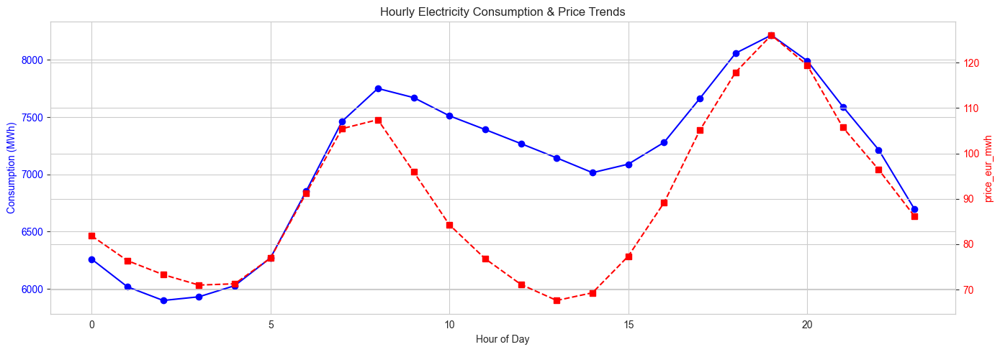

In [125]:
plt.figure(figsize=(10, 5))
fig, ax1 = plt.subplots(figsize=(14, 5))

# Primary axis for Consumption (MWh)
ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Consumption (MWh)", color="blue")
ax1.plot(hourly_trends['hour_of_day'], hourly_trends['consumption_mwh'], marker='o', color="blue", label="Consumption (MWh)")
ax1.tick_params(axis="y", labelcolor="blue")

# Secondary axis for price_eur_mwh
ax2 = ax1.twinx()
ax2.set_ylabel("price_eur_mwh", color="red")
ax2.plot(hourly_trends['hour_of_day'], hourly_trends['price_eur_mwh'], marker='s', linestyle="--", color="red", label="price_eur_mwh")
ax2.tick_params(axis="y", labelcolor="red")

plt.title("Hourly Electricity Consumption & Price Trends")
fig.tight_layout()  
plt.show()


In [126]:
daily_trends

,date,consumption_mwh,price_eur_mwh
0,2023-01-01,4526.683480,35.046927
1,2023-01-02,6306.227887,130.154323
2,2023-01-03,7457.763158,146.664115
3,2023-01-04,6120.482091,112.626797
4,2023-01-05,6912.538560,127.849375
...,...,...,...
789,2025-02-28,9235.219298,120.292306
790,2025-03-01,7769.032529,111.169417
791,2025-03-02,6400.286184,81.563361
792,2025-03-03,7591.015168,93.611556


<Figure size 1400x500 with 0 Axes>

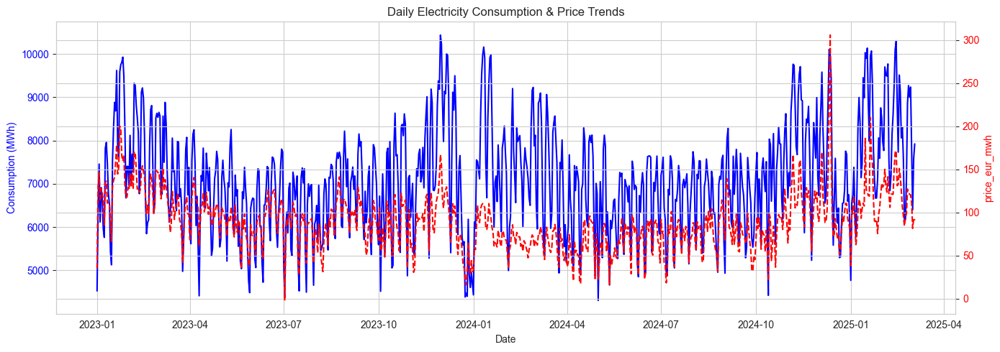

In [127]:
plt.figure(figsize=(14, 5))
fig, ax1 = plt.subplots(figsize=(14, 5))

ax1.set_xlabel("Date")
ax1.set_ylabel("Consumption (MWh)", color="blue")
ax1.plot(daily_trends['date'], daily_trends['consumption_mwh'], color="blue", label="Consumption (MWh)")
ax1.tick_params(axis="y", labelcolor="blue")

ax2 = ax1.twinx()
ax2.set_ylabel("price_eur_mwh", color="red")
ax2.plot(daily_trends['date'], daily_trends['price_eur_mwh'], linestyle="--", color="red", label="price_eur_mwh")
ax2.tick_params(axis="y", labelcolor="red")

plt.title("Daily Electricity Consumption & Price Trends")
fig.tight_layout()
plt.show()


<Figure size 1400x500 with 0 Axes>

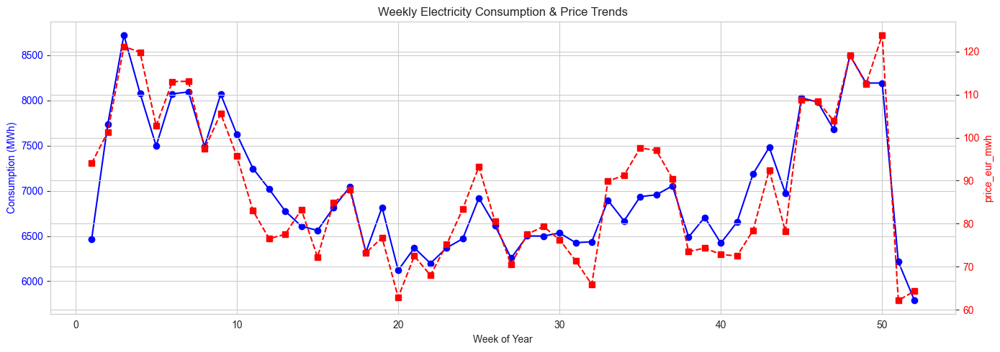

In [128]:
plt.figure(figsize=(14, 5))
fig, ax1 = plt.subplots(figsize=(14, 5))

ax1.set_xlabel("Week of Year")
ax1.set_ylabel("Consumption (MWh)", color="blue")
ax1.plot(weekly_trends['week_of_year'], weekly_trends['consumption_mwh'], marker='o', color="blue", label="Consumption (MWh)")
ax1.tick_params(axis="y", labelcolor="blue")

ax2 = ax1.twinx()
ax2.set_ylabel("price_eur_mwh", color="red")
ax2.plot(weekly_trends['week_of_year'], weekly_trends['price_eur_mwh'], marker='s', linestyle="--", color="red", label="price_eur_mwh")
ax2.tick_params(axis="y", labelcolor="red")

plt.title("Weekly Electricity Consumption & Price Trends")
fig.tight_layout()
plt.show()


In [129]:
# print(df_actual_consum_quarterhourly.info(), "\n")
# print(df_forecasted_consum_quarterhourly.info())

In [130]:
df_actual_consum_quarterhourly['date'] = pd.to_datetime(df_actual_consum_quarterhourly['date'])
df_forecasted_consum_quarterhourly['date'] = pd.to_datetime(df_forecasted_consum_quarterhourly['date'])
df_forecasted_consum_quarterhourly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 152448 entries, 0 to 152447
Data columns (total 7 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   start_date             152448 non-null  datetime64[ns]
 1   end_date               152448 non-null  datetime64[ns]
 2   category               152448 non-null  object        
 3   forecasted_consum_mwh  152352 non-null  float64       
 4   hour_of_day            152448 non-null  int32         
 5   date                   152448 non-null  datetime64[ns]
 6   week_of_year           152448 non-null  UInt32        
dtypes: UInt32(1), datetime64[ns](3), float64(1), int32(1), object(1)
memory usage: 7.1+ MB


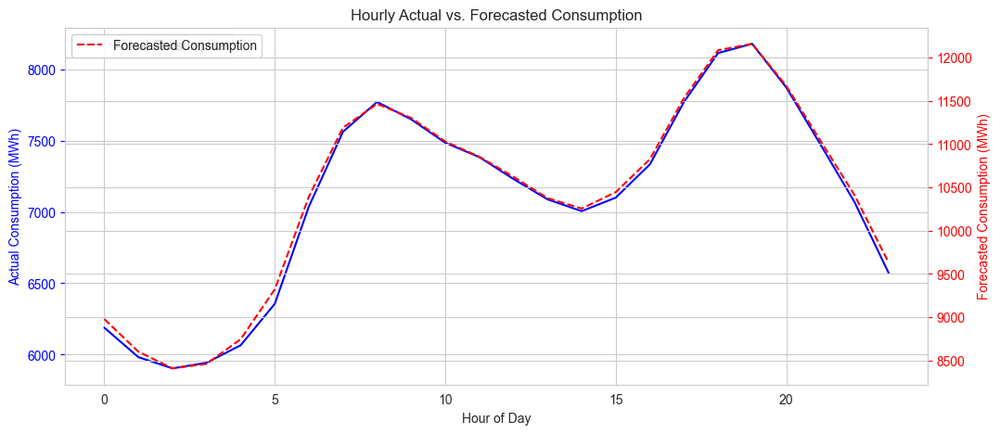

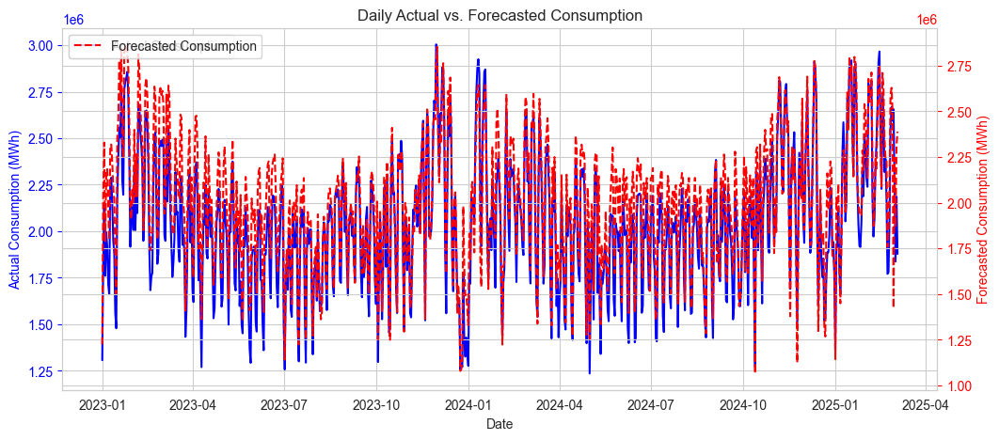

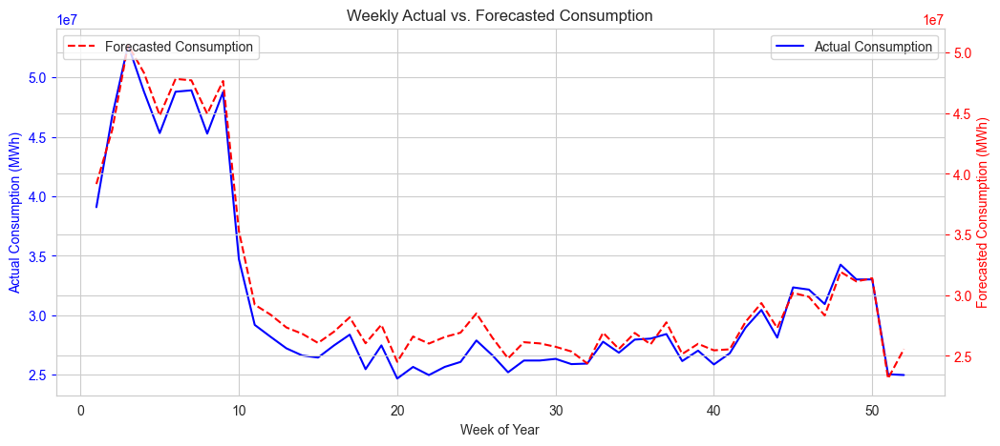

In [131]:

### Aggregate Hourly Consumption
consum_actual_hourly = df_actual_consum_quarterhourly.groupby("hour_of_day")["consumption_mwh"].mean().reset_index()
consum_forecasted_hourly = df_forecasted_consum_quarterhourly.groupby("hour_of_day")["forecasted_consum_mwh"].mean().reset_index()

### Aggregate Daily Consumption
consum_actual_daily = df_actual_consum_quarterhourly.groupby(df_actual_consum_quarterhourly["date"].dt.date)["consumption_mwh"].sum().reset_index()
consum_forecasted_daily = df_forecasted_consum_quarterhourly.groupby(df_forecasted_consum_quarterhourly["date"].dt.date)["forecasted_consum_mwh"].sum().reset_index()

### Aggregate Weekly Consumption
consum_actual_weekly = df_actual_consum_quarterhourly.groupby("week_of_year")["consumption_mwh"].sum().reset_index()
consum_forecasted_weekly = df_forecasted_consum_quarterhourly.groupby("week_of_year")["forecasted_consum_mwh"].sum().reset_index()

### PLOTTING FUNCTION ###
def plot_dual_axis(x, actual_y, forecasted_y, xlabel, title):
    fig, ax1 = plt.subplots(figsize=(12, 5))

    ax2 = ax1.twinx()  # Create twin axis

    sns.lineplot(x=x, y=actual_y, ax=ax1, color='blue', label='Actual Consumption')
    sns.lineplot(x=x, y=forecasted_y, ax=ax2, color='red', label='Forecasted Consumption', linestyle="dashed")

    ax1.set_xlabel(xlabel)
    ax1.set_ylabel("Actual Consumption (MWh)", color='blue')
    ax2.set_ylabel("Forecasted Consumption (MWh)", color='red')

    ax1.tick_params(axis='y', colors='blue')
    ax2.tick_params(axis='y', colors='red')

    plt.title(title)
    plt.legend(loc='upper left')
    plt.show()


### PLOTTING ###
plot_dual_axis(consum_actual_hourly["hour_of_day"], consum_actual_hourly["consumption_mwh"], consum_forecasted_hourly["forecasted_consum_mwh"], 
               "Hour of Day", "Hourly Actual vs. Forecasted Consumption")

plot_dual_axis(consum_actual_daily["date"], consum_actual_daily["consumption_mwh"], consum_forecasted_daily["forecasted_consum_mwh"], 
               "Date", "Daily Actual vs. Forecasted Consumption")

plot_dual_axis(consum_actual_weekly["week_of_year"], consum_actual_weekly["consumption_mwh"], consum_forecasted_weekly["forecasted_consum_mwh"], 
               "Week of Year", "Weekly Actual vs. Forecasted Consumption")


In [132]:
# df_consum_price

In [133]:
from scipy.stats import entropy, trim_mean, kurtosis

def generate_summary(df, type='date'):
    percentiles = [10, 25, 50, 75, 90, 95, 100]
    
    summary_df = df.groupby(type).apply(lambda x: pd.Series({
        # ====== DAILY ANALYSIS ======
        "daily_avg_consumption": x["consumption_mwh"].mean(),
        "daily_median_consumption": x["consumption_mwh"].median(),
        "daily_peak_consumption": x["consumption_mwh"].max(),
        "daily_low_consumption": x["consumption_mwh"].min(),
        "daily_range_consumption": x["consumption_mwh"].max() - x["consumption_mwh"].min(),
        "daily_avg_price": x["price_eur_mwh"].mean(),
        "daily_median_price": x["price_eur_mwh"].median(),
        "daily_peak_price": x["price_eur_mwh"].max(),
        "daily_low_price": x["price_eur_mwh"].min(),
        "daily_range_price": x["price_eur_mwh"].max() - x["price_eur_mwh"].min(),
        "daily_price_percentiles": np.round(np.percentile(x["price_eur_mwh"].dropna(), percentiles), 2).tolist(),

        # ====== WEEKLY ANALYSIS ======
        "weekly_avg_consumption": x.groupby("week_of_year")["consumption_mwh"].mean().mean(),
        "weekly_median_consumption": x.groupby("week_of_year")["consumption_mwh"].median().median(),
        "weekly_peak_consumption": x.groupby("week_of_year")["consumption_mwh"].max().max(),
        "weekly_low_consumption": x.groupby("week_of_year")["consumption_mwh"].min().min(),
        "weekly_range_consumption": x.groupby("week_of_year")["consumption_mwh"].max().max() - 
                                    x.groupby("week_of_year")["consumption_mwh"].min().min(),
        "weekly_avg_price": x.groupby("week_of_year")["price_eur_mwh"].mean().mean(),
        "weekly_median_price": x.groupby("week_of_year")["price_eur_mwh"].median().median(),
        "weekly_peak_price": x.groupby("week_of_year")["price_eur_mwh"].max().max(),
        "weekly_low_price": x.groupby("week_of_year")["price_eur_mwh"].min().min(),
        "weekly_range_price": x.groupby("week_of_year")["price_eur_mwh"].max().max() - 
                              x.groupby("week_of_year")["price_eur_mwh"].min().min(),
        "weekly_price_percentiles": np.round(np.percentile(x["price_eur_mwh"].dropna(), percentiles), 2).tolist(),

        # ====== WEEKDAY & WEEKEND ANALYSIS ======
        "weekday_avg_consumption": x[x["date"].dt.weekday < 5]["consumption_mwh"].mean(),
        "weekend_avg_consumption": x[x["date"].dt.weekday >= 5]["consumption_mwh"].mean(),
        "weekday_avg_price": x[x["date"].dt.weekday < 5]["price_eur_mwh"].mean(),
        "weekend_avg_price": x[x["date"].dt.weekday >= 5]["price_eur_mwh"].mean(),

        # ====== HOURLY ANALYSIS ======
        "peak_hour_consumption": x.groupby("hour_of_day")["consumption_mwh"].mean().idxmax(),
        "peak_hour_consumption_value": x.groupby("hour_of_day")["consumption_mwh"].mean().max(),
        "hourly_range_consumption": x.groupby("hour_of_day")["consumption_mwh"].sum().max() - 
                                    x.groupby("hour_of_day")["consumption_mwh"].sum().min(),
        "peak_hour_price": x.groupby("hour_of_day")["price_eur_mwh"].mean().idxmax(),
        "peak_hour_price_value": x.groupby("hour_of_day")["price_eur_mwh"].mean().max(),
        "hourly_range_price": x.groupby("hour_of_day")["price_eur_mwh"].sum().max() - 
                              x.groupby("hour_of_day")["price_eur_mwh"].sum().min(),

        # ====== DISTRIBUTION METRICS ======
        "std_dev_price": x["price_eur_mwh"].std(),
        "kurtosis_price": kurtosis(x["price_eur_mwh"], nan_policy="omit"),
        "skewness_price": x["price_eur_mwh"].skew(),
        "entropy_price": entropy(np.histogram(x["price_eur_mwh"].dropna(), bins=20, density=True)[0])
    })).reset_index()

    return summary_df

# Generate the summary
df_consum_summary = generate_summary(df_consum_price, type='date')

df_consum_summary.T

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_3040/2864061200.py:6: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0,1,2,3,4,5,6,7,8,9,...,784,785,786,787,788,789,790,791,792,793
date,2023-01-01 00:00:00,2023-01-02 00:00:00,2023-01-03 00:00:00,2023-01-04 00:00:00,2023-01-05 00:00:00,2023-01-06 00:00:00,2023-01-07 00:00:00,2023-01-08 00:00:00,2023-01-09 00:00:00,2023-01-10 00:00:00,...,2025-02-23 00:00:00,2025-02-24 00:00:00,2025-02-25 00:00:00,2025-02-26 00:00:00,2025-02-27 00:00:00,2025-02-28 00:00:00,2025-03-01 00:00:00,2025-03-02 00:00:00,2025-03-03 00:00:00,2025-03-04 00:00:00
daily_avg_consumption,4526.68348,6306.227887,7457.763158,6120.482091,6912.53856,6666.418494,5964.771016,5763.023026,7826.101243,7956.850146,...,6173.467105,7144.423428,8859.234832,9269.388523,9001.07913,9235.219298,7769.032529,6400.286184,7591.015168,7923.431398
daily_median_consumption,2249.125,5884.25,9849.25,3428.625,6646.25,5907.25,5687.0,5444.625,9431.0,9071.75,...,6252.75,6221.0,11311.5,11855.0,11683.125,12199.5,10287.5,7782.5,7808.75,9106.0
daily_peak_consumption,12323.5,15431.75,15586.5,16832.75,16097.25,15386.0,14094.0,13929.5,16762.5,17122.25,...,13561.75,17206.5,16934.5,17335.75,17374.5,17101.0,14469.25,13568.25,16531.0,17196.75
daily_low_consumption,20.75,2.5,1.0,24.5,1.25,1.0,3.5,3.5,0.5,0.25,...,1.0,3.0,0.0,0.5,0.0,1.25,0.5,0.25,0.0,0.0
daily_range_consumption,12302.75,15429.25,15585.5,16808.25,16096.0,15385.0,14090.5,13926.0,16762.0,17122.0,...,13560.75,17203.5,16934.5,17335.25,17374.5,17099.75,14468.75,13568.0,16531.0,17196.75
daily_avg_price,35.046927,130.154323,146.664115,112.626797,127.849375,123.094271,113.747292,85.506901,134.501354,136.370391,...,94.226639,98.913222,127.151389,123.256694,121.12225,120.292306,111.169417,81.563361,93.611556,90.80325
daily_median_price,9.22,143.76,159.92,111.17,142.13,121.3,100.94,99.0,150.0,141.92,...,87.145,95.46,127.695,121.67,118.24,118.755,118.465,92.67,103.605,100.33
daily_peak_price,243.42,262.0,201.09,346.54,249.99,249.0,362.99,185.48,196.53,230.0,...,276.2,427.64,374.12,240.94,192.37,256.81,254.5,184.97,299.12,318.47
daily_low_price,-15.15,14.17,71.44,0.0,0.0,71.74,35.9,-1.45,30.0,42.96,...,22.18,1.49,0.45,36.2,45.61,44.91,3.72,-6.97,-1.76,-16.8


In [134]:
df_consum_summary.head(2)

,date,daily_avg_consumption,daily_median_consumption,daily_peak_consumption,daily_low_consumption,daily_range_consumption,daily_avg_price,daily_median_price,daily_peak_price,daily_low_price,...,peak_hour_consumption,peak_hour_consumption_value,hourly_range_consumption,peak_hour_price,peak_hour_price_value,hourly_range_price,std_dev_price,kurtosis_price,skewness_price,entropy_price
0,2023-01-01,4526.683480,2249.125,12323.50,20.75,12302.75,35.046927,9.22,243.42,-15.15,...,18,6073.662281,136782.25,19,73.460000,2835.78,52.303302,3.204796,1.902652,1.996849
1,2023-01-02,6306.227887,5884.250,15431.75,2.50,15429.25,130.154323,143.76,262.00,14.17,...,17,7822.232456,197142.50,18,176.350625,5627.61,43.519422,0.007549,-0.623313,2.279392


In [135]:
df_consum_summary.describe().T

,count,mean,min,25%,50%,75%,max,std
date,794,2024-02-01 12:00:00,2023-01-01 00:00:00,2023-07-18 06:00:00,2024-02-01 12:00:00,2024-08-17 18:00:00,2025-03-04 00:00:00,NaN
daily_avg_consumption,794.0,7095.028957,4306.524488,6247.203947,7082.831871,7826.327531,10436.544591,1241.598031
daily_median_consumption,794.0,7692.541247,922.25,5988.78125,7698.5,9465.96875,13654.125,2634.038047
daily_peak_consumption,794.0,15327.254723,10684.5,14357.5625,15457.75,16603.3125,19145.5,1805.444609
daily_low_consumption,794.0,-31.049433,-2183.75,0.25,0.5,1.5,176.75,189.55959
daily_range_consumption,794.0,15358.304156,10677.75,14405.5625,15480.875,16621.375,19145.25,1766.893531
daily_avg_price,794.0,89.448229,-2.137344,68.066081,88.110924,108.482982,305.86,32.641944
daily_median_price,794.0,88.548048,0.0,69.69375,88.635,106.4,213.28,32.540131
daily_peak_price,794.0,222.883413,90.84,152.85,188.16,234.8,1022.27,135.163751
daily_low_price,794.0,10.908652,-500.0,-1.635,4.995,31.69,111.47,46.895514


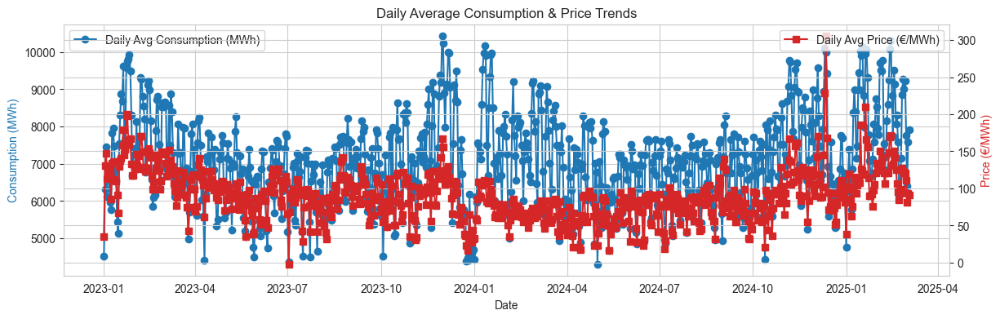

In [136]:
# Set style
sns.set_style("whitegrid")

# Convert date column to datetime
df_consum_summary["date"] = pd.to_datetime(df_consum_summary["date"])

# ======= 1. Daily Consumption and Price Trends (Dual Axis) =======
fig, ax1 = plt.subplots(figsize=(14, 4))

ax2 = ax1.twinx()
ax1.plot(df_consum_summary["date"], df_consum_summary["daily_avg_consumption"], color="tab:blue", marker="o", label="Daily Avg Consumption (MWh)")
ax2.plot(df_consum_summary["date"], df_consum_summary["daily_avg_price"], color="tab:red", marker="s", label="Daily Avg Price (€/MWh)")

ax1.set_xlabel("Date")
ax1.set_ylabel("Consumption (MWh)", color="tab:blue")
ax2.set_ylabel("Price (€/MWh)", color="tab:red")
ax1.set_title("Daily Average Consumption & Price Trends")

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()

Insights:

Consumption appears to follow a relatively stable trend, but price fluctuates more sharply.
There are periods where price spikes do not align with consumption peaks, suggesting that external factors (e.g., market conditions, supply shocks) influence pricing more than just demand.
Sharp price increases without corresponding consumption spikes could indicate volatility due to energy shortages, weather events, or policy changes.

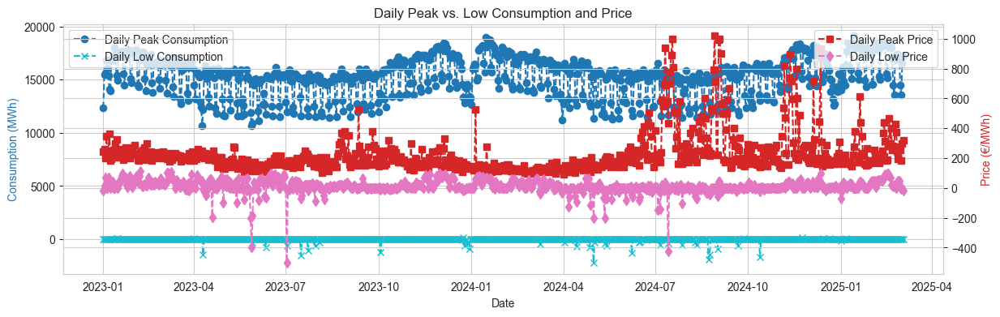

In [137]:
# ======= 2. Daily Peak vs. Low Consumption and Price (Dual Axis) =======
fig, ax1 = plt.subplots(figsize=(14, 4))

ax2 = ax1.twinx()
ax1.plot(df_consum_summary["date"], df_consum_summary["daily_peak_consumption"], color="tab:blue", linestyle="--", marker="o", label="Daily Peak Consumption")
ax1.plot(df_consum_summary["date"], df_consum_summary["daily_low_consumption"], color="tab:cyan", linestyle="--", marker="x", label="Daily Low Consumption")

ax2.plot(df_consum_summary["date"], df_consum_summary["daily_peak_price"], color="tab:red", linestyle="--", marker="s", label="Daily Peak Price")
ax2.plot(df_consum_summary["date"], df_consum_summary["daily_low_price"], color="tab:pink", linestyle="--", marker="d", label="Daily Low Price")

ax1.set_xlabel("Date")
ax1.set_ylabel("Consumption (MWh)", color="tab:blue")
ax2.set_ylabel("Price (€/MWh)", color="tab:red")
ax1.set_title("Daily Peak vs. Low Consumption and Price")

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()

Peak consumption is relatively stable, with occasional spikes, whereas low consumption is erratic, sometimes approaching negative values (potential data anomalies or energy rebalancing).
Peak price movements are highly volatile, with significant differences between peak and low values.
The spread between peak and low prices widens during high volatility periods, indicating potential market stress or supply-demand imbalances.
In some cases, low prices drop significantly (even negative), likely due to overproduction, high renewable energy input, or regulatory factors.

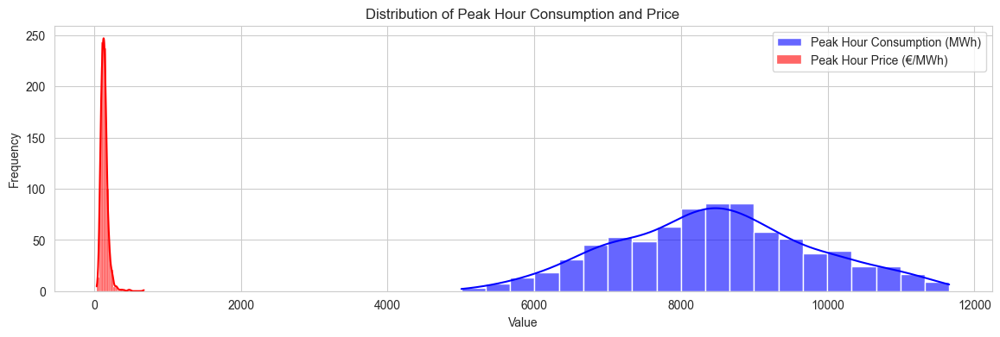

In [138]:
# ======= 3. Hourly Peak Consumption and Price Distribution =======
plt.figure(figsize=(14, 4))
sns.histplot(df_consum_summary["peak_hour_consumption_value"], bins=20, kde=True, color="blue", label="Peak Hour Consumption (MWh)", alpha=0.6)
sns.histplot(df_consum_summary["peak_hour_price_value"], bins=20, kde=True, color="red", label="Peak Hour Price (€/MWh)", alpha=0.6)

plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Distribution of Peak Hour Consumption and Price")
plt.legend()
plt.show()

Peak consumption distribution is more concentrated, meaning the highest hourly demand tends to occur within a predictable range.
Peak price distribution is more spread out, indicating that prices during peak hours vary significantly—this suggests that peak demand does not always dictate price.
The presence of a longer tail in the peak price distribution suggests that extreme price surges occur sporadically, likely due to unexpected shortages or market inefficiencies.

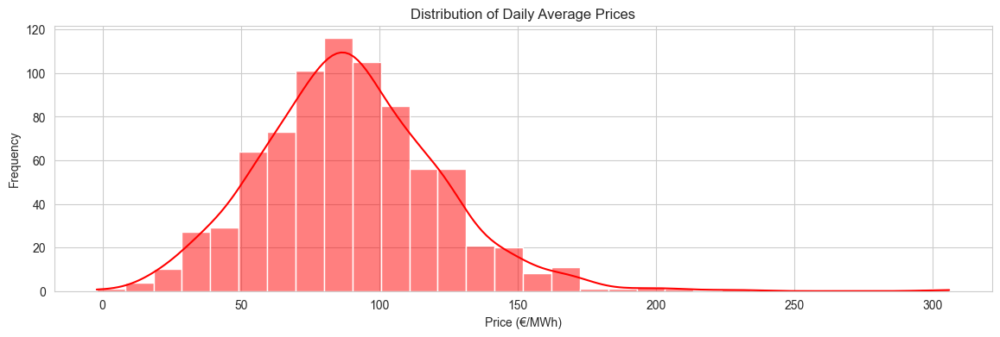

In [139]:

# ======= 4. Histogram of Prices (Distribution) =======
plt.figure(figsize=(14, 4))
sns.histplot(df_consum_summary["daily_avg_price"], bins=30, kde=True, color="red")
plt.xlabel("Price (€/MWh)")
plt.ylabel("Frequency")
plt.title("Distribution of Daily Average Prices")
plt.show()

The distribution of daily average prices is right-skewed, meaning that while most days have moderate prices, there are occasional extreme spikes.
The presence of multiple peaks (bimodal/trend shifts) could suggest distinct pricing regimes—for example, low prices during surplus renewable energy periods vs. high prices during high demand or fossil-fuel-dependent periods.
Price volatility is evident, reinforcing the idea that the electricity market is highly dynamic.

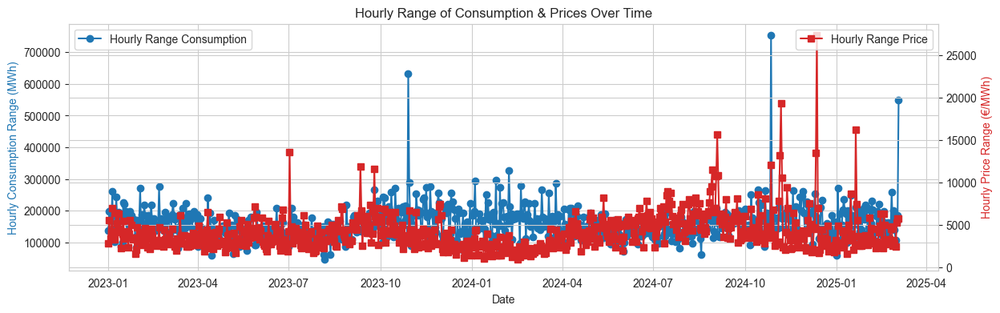

In [140]:
# ======= 7. Hourly Range of Consumption and Prices (Dual Axis) =======
fig, ax1 = plt.subplots(figsize=(14, 4))

ax2 = ax1.twinx()
ax1.plot(df_consum_summary["date"], df_consum_summary["hourly_range_consumption"], color="tab:blue", linestyle="-", marker="o", label="Hourly Range Consumption")
ax2.plot(df_consum_summary["date"], df_consum_summary["hourly_range_price"], color="tab:red", linestyle="-", marker="s", label="Hourly Range Price")

ax1.set_xlabel("Date")
ax1.set_ylabel("Hourly Consumption Range (MWh)", color="tab:blue")
ax2.set_ylabel("Hourly Price Range (€/MWh)", color="tab:red")
ax1.set_title("Hourly Range of Consumption & Prices Over Time")

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()


Insights:

Consumption range remains relatively stable, with some seasonal variations or outlier spikes.
Price range shows much higher variability, suggesting that price swings are not necessarily driven by consumption shifts alone.
Periods of high hourly price range likely correspond to market disruptions, supply shortages, or regulatory shifts.

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_3040/3593692721.py:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



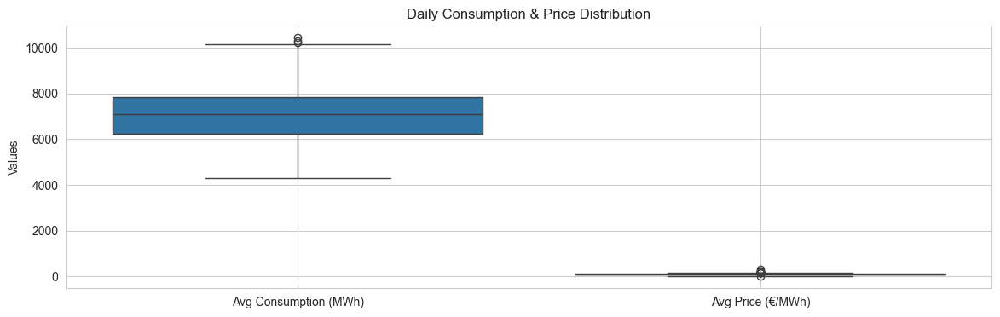

In [141]:
fig, ax1 = plt.subplots(figsize=(14, 4))

sns.boxplot(data=df_consum_summary[["daily_avg_consumption", "daily_avg_price"]], ax=ax1)
ax1.set_xticklabels(["Avg Consumption (MWh)", "Avg Price (€/MWh)"])
ax1.set_title("Daily Consumption & Price Distribution")
ax1.set_ylabel("Values")
plt.grid(True)
plt.show()


- Price has a wider spread and extreme outliers, while consumption is more stable.

---

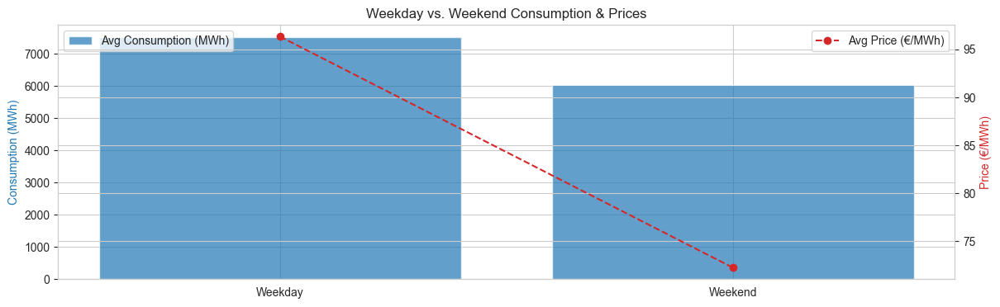

In [142]:
fig, ax1 = plt.subplots(figsize=(14, 4))

x_labels = ["Weekday", "Weekend"]
y1 = [df_consum_summary["weekday_avg_consumption"].mean(), df_consum_summary["weekend_avg_consumption"].mean()]
y2 = [df_consum_summary["weekday_avg_price"].mean(), df_consum_summary["weekend_avg_price"].mean()]

ax1.bar(x_labels, y1, color="tab:blue", label="Avg Consumption (MWh)", alpha=0.7)
ax2 = ax1.twinx()
ax2.plot(x_labels, y2, color="tab:red", marker="o", label="Avg Price (€/MWh)", linestyle="--")

ax1.set_ylabel("Consumption (MWh)", color="tab:blue")
ax2.set_ylabel("Price (€/MWh)", color="tab:red")
ax1.set_title("Weekday vs. Weekend Consumption & Prices")

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()


Insight:

- Weekday consumption is higher due to industrial demand.
- Weekend prices are significantly lower, supporting the idea of demand-driven pricing.

---

3. Price Volatility: Skewness & Kurtosis

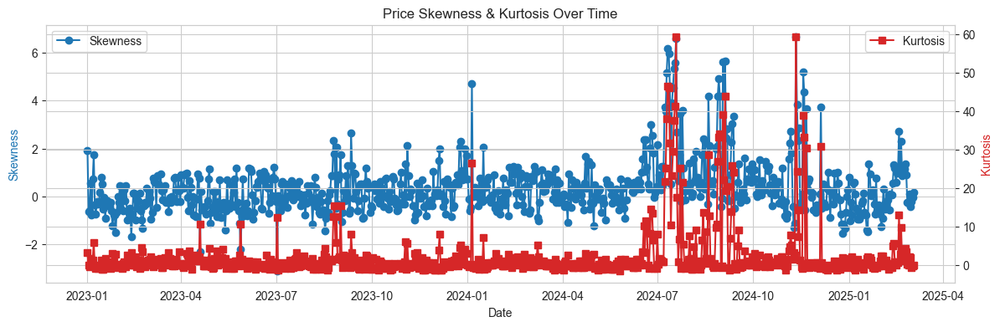

In [143]:
fig, ax1 = plt.subplots(figsize=(14, 4))
ax2 = ax1.twinx()

ax1.plot(df_consum_summary["date"], df_consum_summary["skewness_price"], color="tab:blue", marker="o", label="Skewness")
ax2.plot(df_consum_summary["date"], df_consum_summary["kurtosis_price"], color="tab:red", marker="s", label="Kurtosis")

ax1.set_xlabel("Date")
ax1.set_ylabel("Skewness", color="tab:blue")
ax2.set_ylabel("Kurtosis", color="tab:red")
ax1.set_title("Price Skewness & Kurtosis Over Time")

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.show()


Insight:

- Spikes in kurtosis indicate price shocks.
- Skewness shifts show whether price spikes are occurring more frequently.


---

4. Entropy of Prices Over Time

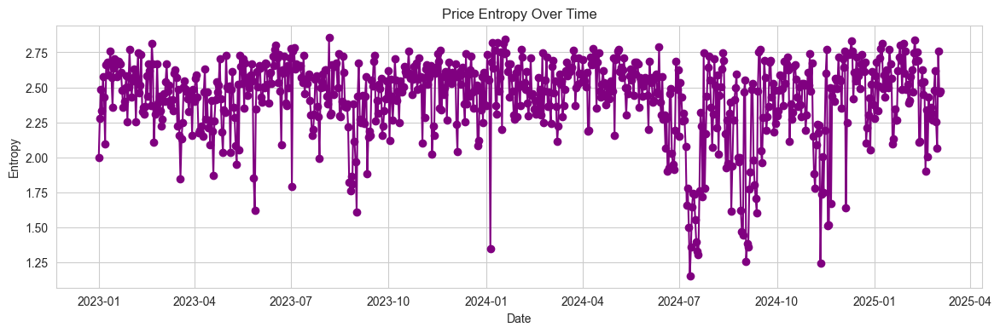

In [144]:
plt.figure(figsize=(14, 4))
plt.plot(df_consum_summary["date"], df_consum_summary["entropy_price"], color="purple", marker="o", linestyle="-")
plt.xlabel("Date")
plt.ylabel("Entropy")
plt.title("Price Entropy Over Time")
plt.grid(True)
plt.show()


Insight:

Higher entropy suggests periods of high uncertainty in pricing.

Principal Takeaways

- Electricity consumption is relatively stable, whereas pricing is highly volatile and influenced by external market forces.
- Price volatility is not always driven by consumption changes, indicating supply-side constraints, fuel price fluctuations, or policy shifts.
- The spread between peak and low prices suggests that energy market inefficiencies exist, leading to price spikes even in low-consumption periods.
- Negative prices and extreme price spikes indicate imbalances—possible overproduction from renewables or energy shortages at peak hours.


----

Summary stats grouped by consumption type

In [145]:
# Generate the summary
df_consum_type_summary = generate_summary(df_consum_price, type='consumption_type')

df_consum_type_summary.T

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_3040/2864061200.py:6: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0,1,2
consumption_type,hydro_pumped_storage,residual_load,total_grid_load
daily_avg_consumption,364.582011,7638.684767,13280.489414
daily_median_consumption,148.5,7641.75,13291.5
daily_peak_consumption,1843.25,17325.0,19145.5
daily_low_consumption,0.0,-2183.75,6983.25
daily_range_consumption,1843.25,19508.75,12162.25
daily_avg_price,89.304035,89.304035,89.304035
daily_median_price,90.01,90.01,90.01
daily_peak_price,1022.27,1022.27,1022.27
daily_low_price,-500.0,-500.0,-500.0


In [146]:
# df_consum_type_summary['daily_avg_consumption']

df_consum_type_summary

,consumption_type,daily_avg_consumption,daily_median_consumption,daily_peak_consumption,daily_low_consumption,daily_range_consumption,daily_avg_price,daily_median_price,daily_peak_price,daily_low_price,...,peak_hour_consumption,peak_hour_consumption_value,hourly_range_consumption,peak_hour_price,peak_hour_price_value,hourly_range_price,std_dev_price,kurtosis_price,skewness_price,entropy_price
0,hydro_pumped_storage,364.582011,148.50,1843.25,0.00,1843.25,89.304035,90.01,1022.27,-500.0,...,14,769.019787,11147724.5,19,126.056156,738748.55,51.361604,16.212398,1.466821,1.072785
1,residual_load,7638.684767,7641.75,17325.00,-2183.75,19508.75,89.304035,90.01,1022.27,-500.0,...,19,9996.700017,62410383.0,19,126.056156,738748.55,51.361604,16.212398,1.466821,1.072785
2,total_grid_load,13280.489414,13291.50,19145.50,6983.25,12162.25,89.304035,90.01,1022.27,-500.0,...,11,15076.357649,67573320.0,19,126.056156,738748.55,51.361604,16.212398,1.466821,1.072785



---

- Daily Consumption Trends Across Energy Types (Stacked Bar Chart)

<Figure size 1200x500 with 0 Axes>

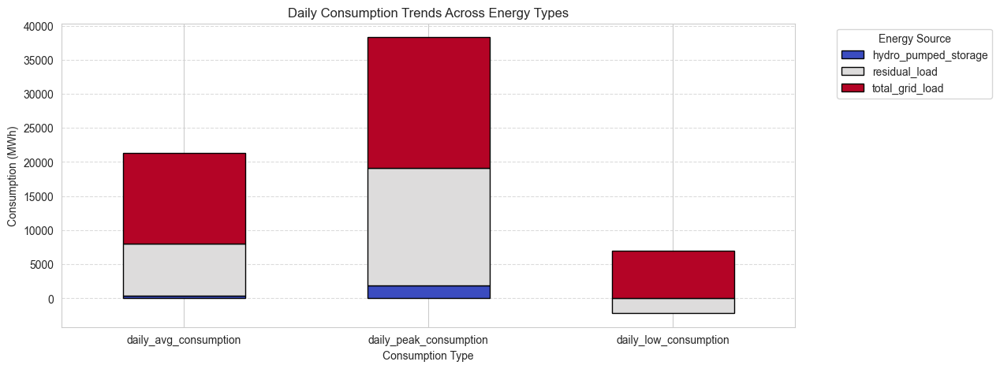

In [147]:
plt.figure(figsize=(12, 5))
df_consum_type_summary.set_index("consumption_type")[["daily_avg_consumption", "daily_peak_consumption", "daily_low_consumption"]].T.plot(
    kind="bar", stacked=True, figsize=(12, 5), colormap="coolwarm", edgecolor="black"
)
plt.xlabel("Consumption Type")
plt.ylabel("Consumption (MWh)")
plt.title("Daily Consumption Trends Across Energy Types")
plt.xticks(rotation=0)
plt.legend(title="Energy Source", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) Arial.



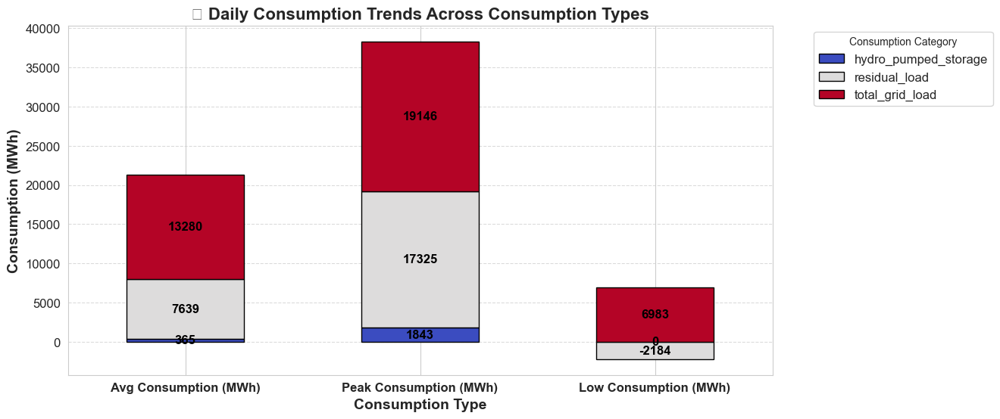

In [148]:

def plot_stacked_consumption(df, title="Daily Consumption Trends Across Consumption Types"):
    """
    Plots a stacked bar chart for daily consumption across different energy types.

    Parameters:
        df (DataFrame): The input DataFrame containing consumption data.
        title (str): Customizable title for the plot.
    """

    # Define better labels
    label_mapping = {
        "daily_avg_consumption": "Avg Consumption (MWh)",
        "daily_peak_consumption": "Peak Consumption (MWh)",
        "daily_low_consumption": "Low Consumption (MWh)",
    }

    # Transpose data and rename labels for readability
    df_plot = df.set_index("consumption_type")[
        ["daily_avg_consumption", "daily_peak_consumption", "daily_low_consumption"]
    ].T.rename(index=label_mapping)

    # Create figure
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot stacked bar chart
    df_plot.plot(kind="bar", stacked=True, colormap="coolwarm", edgecolor="black", ax=ax)

    # Increase font sizes
    ax.set_xlabel("Consumption Type", fontsize=14, fontweight="bold")
    ax.set_ylabel("Consumption (MWh)", fontsize=14, fontweight="bold")
    ax.set_title(f"🔹 {title}", fontsize=16, fontweight="bold")

    # Add annotations on bars
    for container in ax.containers:
        ax.bar_label(container, fmt="%.0f", label_type="center", fontsize=12, color="black", fontweight="bold")

    # Rotate x-ticks for better readability
    plt.xticks(rotation=0, fontsize=12, fontweight="bold")
    plt.yticks(fontsize=12)

    # Customize legend names and add units
    handles, labels = ax.get_legend_handles_labels()
    # custom_legend_labels = [label_mapping[label] for label in labels]
    custom_legend_labels = [label_mapping.get(label, label) for label in labels]
    ax.legend(handles, custom_legend_labels, title="Consumption Category", 
              bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=12)

    # Add grid lines for readability
    plt.grid(axis="y", linestyle="--", alpha=0.7)

    plt.show()


plot_stacked_consumption(df_consum_type_summary)


Insight

This will highlight the variability between base consumption, peak demand, and low points for each energy type.


---
Energy Source Contribution to Total Grid Load (Pie Chart)

Why? To understand how much each energy type contributes to the grid.

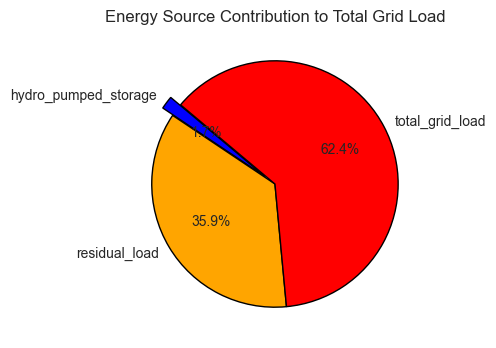

In [149]:
plt.figure(figsize=(14, 4))
plt.pie(
    df_consum_type_summary["daily_avg_consumption"],
    labels=df_consum_type_summary["consumption_type"],
    autopct="%1.1f%%",
    colors=["blue", "orange", "red"],
    startangle=140,
    explode=(0.1, 0, 0),
    wedgeprops={"edgecolor": "black"},
)
plt.title("Energy Source Contribution to Total Grid Load")
plt.show()


Insight

Shows how total grid load dominates daily consumption while hydro pumped storage has a minor role.


---

Price Volatility: Daily vs. Hourly Price Ranges 

Why? This reveals price fluctuations across different consumption types.

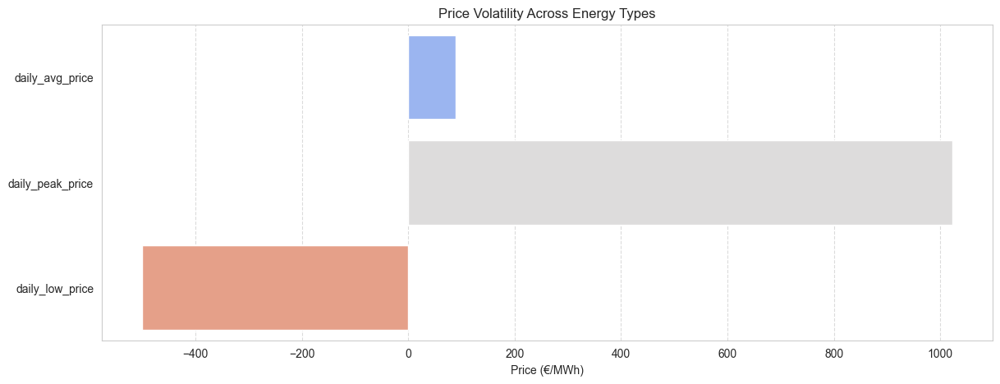

In [150]:
plt.figure(figsize=(14, 5))
sns.barplot(
    data=df_consum_type_summary[["daily_avg_price", "daily_peak_price", "daily_low_price"]],
    orient="h",
    palette="coolwarm",
)
plt.xlabel("Price (€/MWh)")
plt.title("Price Volatility Across Energy Types")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()


Insight

Highlights price spikes and extreme lows, showing how price volatility affects all energy sources.

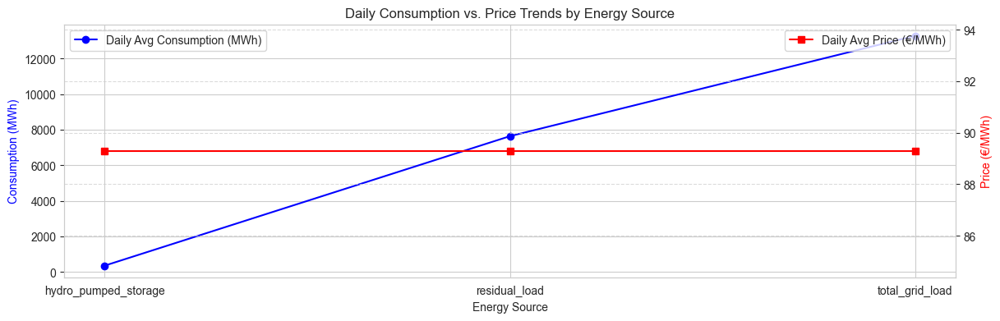

In [151]:
fig, ax1 = plt.subplots(figsize=(14, 4))

ax2 = ax1.twinx()
ax1.plot(df_consum_type_summary["consumption_type"], df_consum_type_summary["daily_avg_consumption"], color="blue", marker="o", label="Daily Avg Consumption (MWh)")
ax2.plot(df_consum_type_summary["consumption_type"], df_consum_type_summary["daily_avg_price"], color="red", marker="s", label="Daily Avg Price (€/MWh)")

ax1.set_xlabel("Energy Source")
ax1.set_ylabel("Consumption (MWh)", color="blue")
ax2.set_ylabel("Price (€/MWh)", color="red")
ax1.set_title("Daily Consumption vs. Price Trends by Energy Source")

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()



Insight: Helps determine if higher consumption is driving price increases or if other factors influence price volatility.

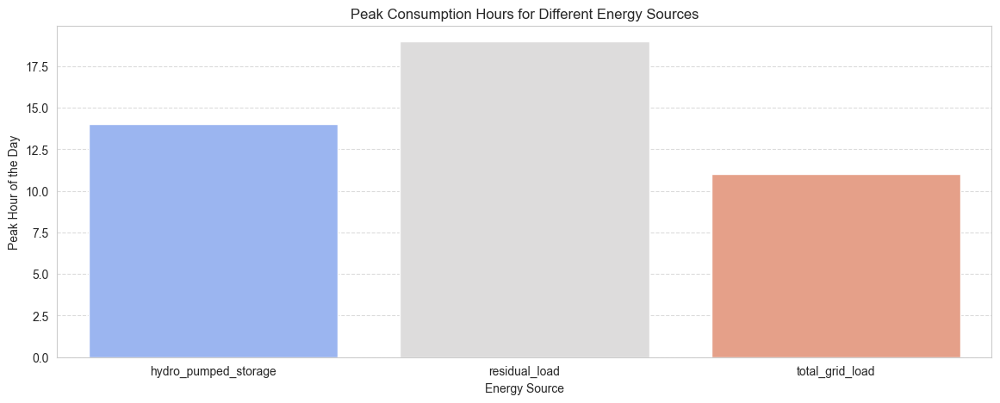

In [152]:
plt.figure(figsize=(14, 5))
sns.barplot(
    x=df_consum_type_summary["consumption_type"],
    y=df_consum_type_summary["peak_hour_consumption"],
    palette="coolwarm",
)
plt.xlabel("Energy Source")
plt.ylabel("Peak Hour of the Day")
plt.title("Peak Consumption Hours for Different Energy Sources")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


Insight

Shows that hydro pumped storage is peaking earlier than residual load but later than total grid load.

In [153]:
# df_consum_price_compare = extract_time_features(df_consum_price, lag_window_size=24, alpha=0.2,component='consumption_mwh')
# df_consum_price_compare = extract_time_features(df_consum_price, lag_window_size=24, alpha=0.2,component='price_eur_mwh')

In [154]:
df_consum_type_summary[["daily_avg_price", "daily_median_price"]]

,daily_avg_price,daily_median_price
0,89.304035,90.01
1,89.304035,90.01
2,89.304035,90.01


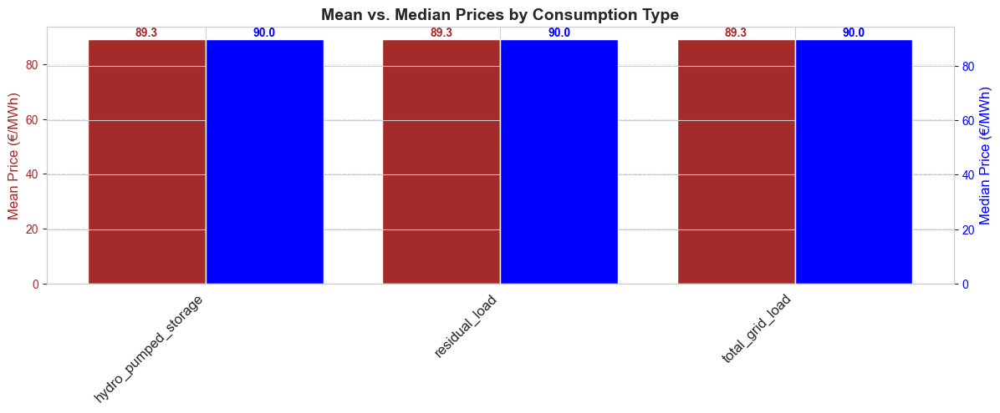

In [155]:
def plot_consumption_type_comparison(
    df, metric1, metric2, ylabel1, ylabel2, title,
    bar1_color="blue", bar2_color="orange", label1_color="black", label2_color="black"
):
    """
    Plots a bar chart comparing different consumption types based on selected metrics.

    Parameters:
    df (DataFrame): Summary dataframe with consumption types.
    metric1 (str): First metric column (required).
    metric2 (str): Second metric column (optional).
    ylabel1 (str): Label for first metric axis.
    ylabel2 (str or None): Label for second metric axis.
    title (str): Chart title.
    bar1_color (str): Color for first bar.
    bar2_color (str or None): Color for second bar (if used).
    label1_color (str): Color for first bar annotations.
    label2_color (str or None): Color for second bar annotations (if used).
    """

    fig, ax1 = plt.subplots(figsize=(14, 4))

    x_labels = df["consumption_type"]
    x = np.arange(len(x_labels))  # X-axis positions

    # First metric bars
    bars1 = ax1.bar(x, df[metric1], color=bar1_color, width=0.4, label=ylabel1)
    ax1.set_ylabel(ylabel1, color=bar1_color, fontsize=12)
    ax1.tick_params(axis="y", labelcolor=bar1_color)

    # Annotate first bars
    for bar in bars1:
        yval = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width() / 2, yval, f"{yval:.1f}", ha="center", va="bottom",fontweight='bold',fontsize=10, color=label1_color)

    if metric2:
        ax2 = ax1.twinx()
        bars2 = ax2.bar(x + 0.4, df[metric2], color=bar2_color, width=0.4, label=ylabel2)
        ax2.set_ylabel(ylabel2, color=bar2_color, fontsize=12)
        ax2.tick_params(axis="y", labelcolor=bar2_color)

        # Annotate second bars
        for bar in bars2:
            yval = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width() / 2, yval, f"{yval:.1f}", ha="center", va="bottom", fontweight='bold', fontsize=10, color=label2_color)


         # Add annotations on top of each bar
        # for i, (val1, val2) in enumerate(zip(df_sorted[metric1], df_sorted[metric2])):
        #     ax.text(i, val1 + 3, f"{val1:.2f}", ha='center', fontsize=10, fontweight='bold', color=color1)
        #     ax.text(i, val2 + 3, f"{val2:.2f}", ha='center', fontsize=10, fontweight='bold', color=color2)
        
    # Customize x-axis
    ax1.set_xticks(x + (0.2 if metric2 else 0))
    ax1.set_xticklabels(x_labels, rotation=45, ha="right", fontsize=12)

    # Title and grid
    plt.title(title, fontsize=14, fontweight="bold")
    ax1.grid(axis="y", linestyle="--", alpha=0.5)

    # Show plot
    plt.show()

plot_consumption_type_comparison(
    df_consum_type_summary, 
    "daily_avg_price", "daily_median_price", 
    "Mean Price (€/MWh)", "Median Price (€/MWh)", 
    "Mean vs. Median Prices by Consumption Type",
    bar1_color="brown", bar2_color="blue",
    label1_color="brown", label2_color="blue"
)


Hydro Pumped Storage has similar mean and median prices, indicating low price volatility.
Residual Load & Grid Load have larger gaps, suggesting higher price fluctuations.

---


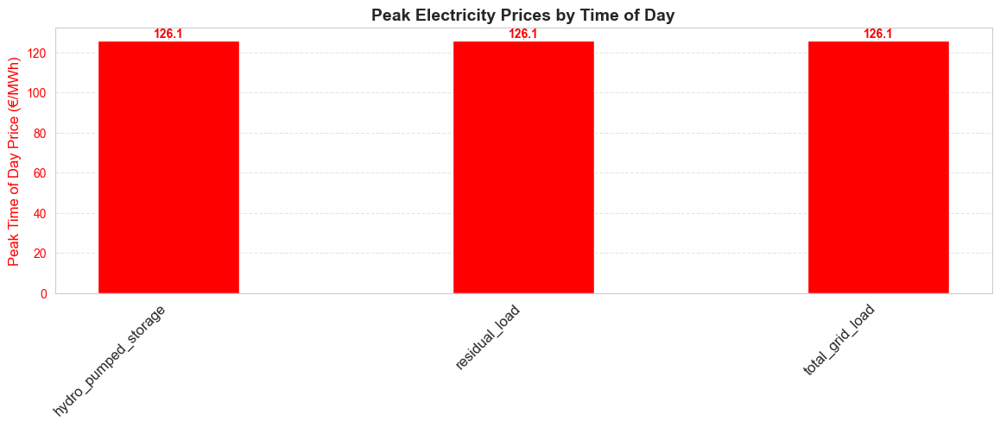

In [156]:
plot_consumption_type_comparison(
    df_consum_type_summary, 
    "peak_hour_price_value", None, 
    "Peak Time of Day Price (€/MWh)", None, 
    "Peak Electricity Prices by Time of Day",
    bar1_color="red", bar2_color=None,
    label1_color="red", label2_color=None
)


Peak prices occur around 19:00 for all categories.
Hydro Pumped Storage sees a relatively lower peak price compared to total grid load.

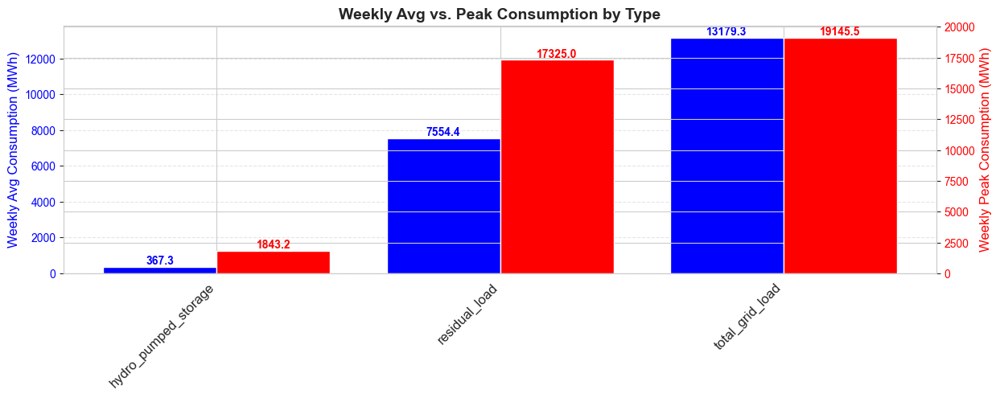

In [157]:
plot_consumption_type_comparison(
    df_consum_type_summary, 
    "weekly_avg_consumption", "weekly_peak_consumption", 
    "Weekly Avg Consumption (MWh)", "Weekly Peak Consumption (MWh)", 
    "Weekly Avg vs. Peak Consumption by Type",
    bar1_color="blue", bar2_color="red",
    label1_color="blue", label2_color="red"
)


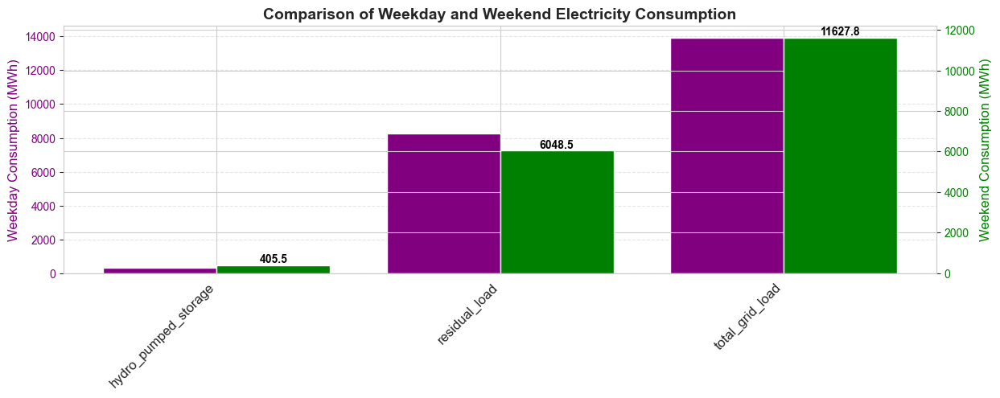

In [158]:
plot_consumption_type_comparison(
    df_consum_type_summary, 
    "weekday_avg_consumption", "weekend_avg_consumption", 
    "Weekday Consumption (MWh)", "Weekend Consumption (MWh)", 
    "Comparison of Weekday and Weekend Electricity Consumption",
    bar1_color="purple", bar2_color="green",
    label1_color='white', label2_color="black"
)


Weekday consumption is significantly higher for residual load and grid load, suggesting business activity impact.
Hydro pumped storage has a much higher weekend usage, likely due to renewable energy balancing strategies.

---



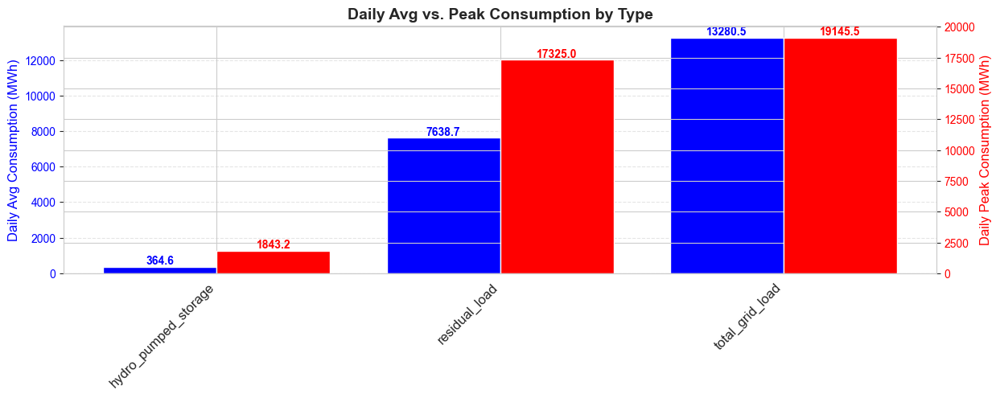

In [159]:
plot_consumption_type_comparison(
    df_consum_type_summary, 
    "daily_avg_consumption", "daily_peak_consumption", 
    "Daily Avg Consumption (MWh)", "Daily Peak Consumption (MWh)", 
    "Daily Avg vs. Peak Consumption by Type",
    bar1_color="blue", bar2_color="red",
    label1_color="blue", label2_color="red"
)


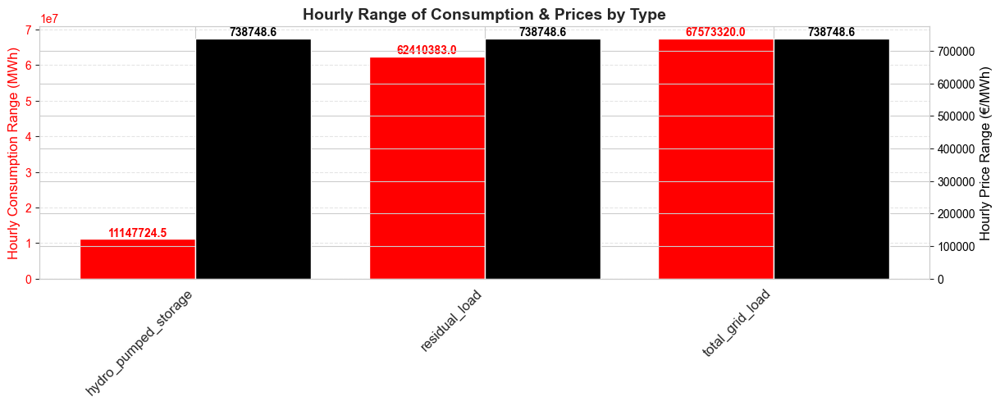

In [160]:
plot_consumption_type_comparison(
    df_consum_type_summary, 
    "hourly_range_consumption", "hourly_range_price", 
    "Hourly Consumption Range (MWh)", "Hourly Price Range (€/MWh)", 
    "Hourly Range of Consumption & Prices by Type",
    bar1_color="red", bar2_color="black",
    label1_color="red", label2_color="black"
)


Residual Load shows the highest variability, reflecting demand spikes & fluctuations.
Grid load follows a similar pattern, while hydro pumped storage is more stable.

In [161]:
# def plot_stacked_consumptionn(df, title="Daily Consumption by Type"):
#     fig, ax = plt.subplots(figsize=(12, 5))

#     consumption_types = ["hydro_pumped_storage", "residual_load", "total_grid_load"]
#     colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]
#     labels = ["Hydro Pumped Storage (MWh)", "Residual Load (MWh)", "Total Grid Load (MWh)"]

#     bottom = np.zeros(len(df))

#     for i, cons_type in enumerate(consumption_types):
#         values = df[cons_type]
#         ax.bar(df.index, values, label=labels[i], color=colors[i], bottom=bottom)
#         bottom += values

#     ax.set_ylabel("Consumption (MWh)", fontsize=12)
#     ax.set_xlabel("Time", fontsize=12)
#     ax.set_title(title, fontsize=14, fontweight="bold")
#     ax.legend(fontsize=11)
#     ax.grid(axis="y", linestyle="--", alpha=0.6)
    
#     plt.show()

# plot_stacked_consumptionn(df_consum_type_summary)



---
---
---

### 1.3  How does electricity generation (actual vs. forecast) align with price trends?

In [162]:
print(df_gen_forecast_quarterhourly.info(),'\n')
print(df_actual_gen_quarterhourly.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304896 entries, 0 to 304895
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   start_date  304896 non-null  datetime64[ns]
 1   end_date    304896 non-null  datetime64[ns]
 2   category    304896 non-null  object        
 3   value       304896 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(1)
memory usage: 9.3+ MB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914688 entries, 0 to 914687
Data columns (total 4 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   start_date             914688 non-null  datetime64[ns]
 1   end_date               914688 non-null  datetime64[ns]
 2   energy_source          914688 non-null  object        
 3   actual_generation_mwh  876152 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(1)

In [163]:
# Step 1: Rename 'value' to 'forecasted_mwh' for consistency
df_forecasted_gen_quarterhourly.rename(columns={'value': 'forecasted_generation_mwh'}, inplace=True)
df_forecasted_gen_quarterhourly.head(2)

,start_date,end_date,category,forecasted_generation_mwh
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_mwh,56012.0
1,2023-01-01 00:15:00,2023-01-01 00:30:00,total_mwh,NaN


In [164]:
# Step 2: Check category mapping
gen_actual_types = df_actual_gen_quarterhourly['energy_source'].unique()
gen_forecasted_categories = df_forecasted_gen_quarterhourly['category'].unique()
print("Unique gen energy source in actual dataset:", gen_actual_types)
print("Unique gen categories in forecasted dataset:", gen_forecasted_categories)

Unique gen energy source in actual dataset: ['biomass' 'hydropower' 'wind_offshore' 'wind_onshore' 'photovoltaics'
 'other_renewable' 'nuclear' 'lignite' 'hard_coal' 'fossil_gas'
 'hydro_pumped_storage' 'other_conventional']
Unique gen categories in forecasted dataset: ['total_mwh' 'photovoltaics_and_wind_mwh' 'wind_offshore_mwh'
 'wind_onshore_mwh' 'photovoltaics_mwh' 'other_mwh']


In [165]:
# df_actual_gen_quarterhourly['']

In [166]:
# Convert start_date to date-only for daily aggregation
df_actual_gen_quarterhourly['date'] = df_actual_gen_quarterhourly['start_date'].dt.date
df_forecasted_gen_quarterhourly['date'] = df_forecasted_gen_quarterhourly['start_date'].dt.date

df_forecasted_gen_quarterhourly['date'] = pd.to_datetime(df_forecasted_gen_quarterhourly['date'])
df_actual_gen_quarterhourly['date'] = pd.to_datetime(df_actual_gen_quarterhourly['date'])


df_actual_gen_quarterhourly['hour_of_day'] = df_actual_gen_quarterhourly['start_date'].dt.hour
df_actual_gen_quarterhourly['date'] = df_actual_gen_quarterhourly['start_date'].dt.date
df_actual_gen_quarterhourly['week_of_year'] = df_actual_gen_quarterhourly['start_date'].dt.isocalendar().week

df_forecasted_gen_quarterhourly['hour_of_day'] = df_forecasted_gen_quarterhourly['start_date'].dt.hour
df_forecasted_gen_quarterhourly['date'] = df_forecasted_gen_quarterhourly['start_date'].dt.date
df_forecasted_gen_quarterhourly['week_of_year'] = df_forecasted_gen_quarterhourly['start_date'].dt.isocalendar().week


# Aggregate data
gen_hourly_actual = df_actual_gen_quarterhourly.groupby('hour_of_day')['actual_generation_mwh'].mean().reset_index()
gen_daily_actual = df_actual_gen_quarterhourly.groupby('date')['actual_generation_mwh'].sum().reset_index()
gen_weekly_actual = df_actual_gen_quarterhourly.groupby('week_of_year')['actual_generation_mwh'].sum().reset_index()

gen_hourly_forecasted = df_forecasted_gen_quarterhourly.groupby('hour_of_day')['forecasted_generation_mwh'].mean().reset_index()
gen_daily_forecasted = df_forecasted_gen_quarterhourly.groupby('date')['forecasted_generation_mwh'].sum().reset_index()
gen_weekly_forecasted = df_forecasted_gen_quarterhourly.groupby('week_of_year')['forecasted_generation_mwh'].sum().reset_index()

# Output previews
print("Hourly Actual Generation:\n", gen_hourly_actual.head())
print("Daily Actual Generation:\n", gen_daily_actual.head())
print("Weekly Actual Generation:\n", gen_weekly_actual.head())

print("Hourly Forecasted Generation:\n", gen_hourly_forecasted.head())
print("Daily Forecasted Generation:\n", gen_daily_forecasted.head())
print("Weekly Forecasted Generation:\n", gen_weekly_forecasted.head())


Hourly Actual Generation:
    hour_of_day  actual_generation_mwh
0            0             929.664120
1            1             905.547780
2            2             892.645861
3            3             886.491641
4            4             891.741374
Daily Actual Generation:
          date  actual_generation_mwh
0  2023-01-01             1139363.75
1  2023-01-02             1342235.25
2  2023-01-03             1308393.25
3  2023-01-04             1651602.50
4  2023-01-05             1447074.75
Weekly Actual Generation:
    week_of_year  actual_generation_mwh
0             1            27543097.25
1             2            30947905.00
2             3            29895385.50
3             4            29185091.25
4             5            30001140.75
Hourly Forecasted Generation:
    hour_of_day  forecasted_generation_mwh
0            0                5581.276460
1            1                5421.999545
2            2                5340.308735
3            3                5303.94

In [167]:
df_day_ahead_price_hourly['date'] = pd.to_datetime(df_day_ahead_price_hourly['date'])
df_actual_gen_quarterhourly['date'] = pd.to_datetime(df_actual_gen_quarterhourly['date'])
df_forecasted_gen_quarterhourly['date'] = pd.to_datetime(df_forecasted_gen_quarterhourly['date'])
# df_day_ahead_price_hourly.info()

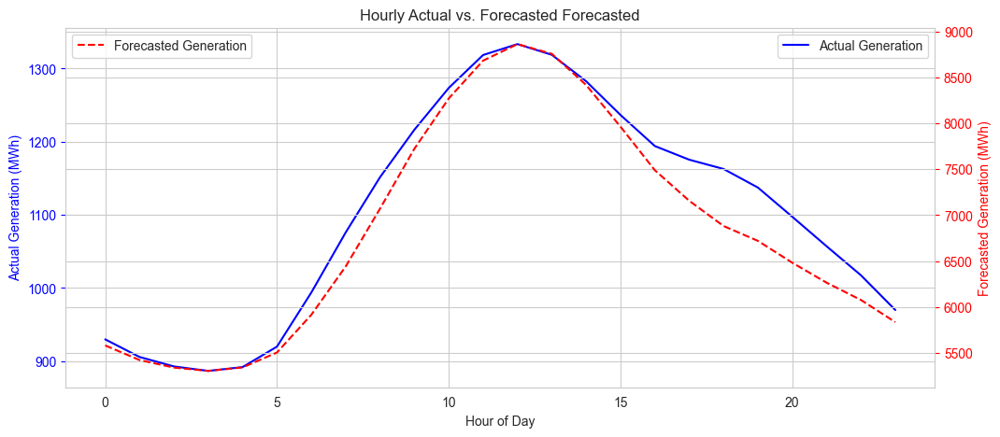

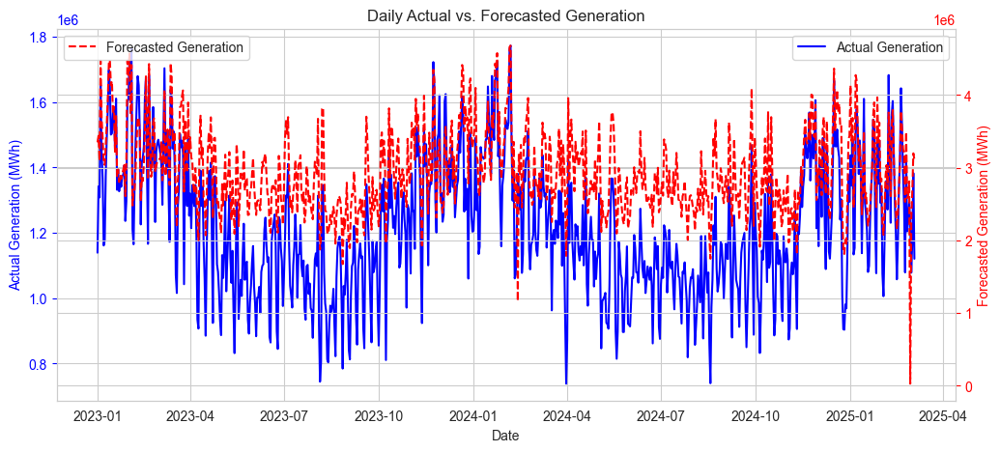

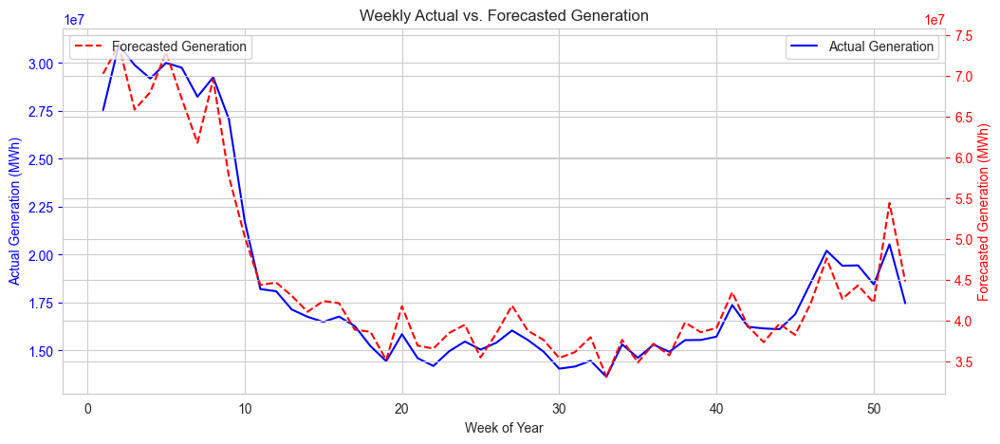

In [168]:

### Aggregate Hourly Gen
gen_actual_hourly = df_actual_gen_quarterhourly.groupby("hour_of_day")["actual_generation_mwh"].mean().reset_index()
gen_forecasted_hourly = df_forecasted_gen_quarterhourly.groupby("hour_of_day")["forecasted_generation_mwh"].mean().reset_index()

### Aggregate Daily Gen
gen_actual_daily = df_actual_gen_quarterhourly.groupby(df_actual_gen_quarterhourly["date"].dt.date)["actual_generation_mwh"].sum().reset_index()
gen_forecasted_daily = df_forecasted_gen_quarterhourly.groupby(df_forecasted_gen_quarterhourly["date"].dt.date)["forecasted_generation_mwh"].sum().reset_index()

### Aggregate Weekly Gen
gen_actual_weekly = df_actual_gen_quarterhourly.groupby("week_of_year")["actual_generation_mwh"].sum().reset_index()
gen_forecasted_weekly = df_forecasted_gen_quarterhourly.groupby("week_of_year")["forecasted_generation_mwh"].sum().reset_index()

### PLOTTING FUNCTION ###
def plot_dual_axis(x, actual_y, forecasted_y, xlabel, title):
    fig, ax1 = plt.subplots(figsize=(12, 5))

    ax2 = ax1.twinx()  # Create twin axis

    sns.lineplot(x=x, y=actual_y, ax=ax1, color='blue', label='Actual Generation')
    sns.lineplot(x=x, y=forecasted_y, ax=ax2, color='red', label='Forecasted Generation', linestyle="dashed")

    ax1.set_xlabel(xlabel)
    ax1.set_ylabel("Actual Generation (MWh)", color='blue')
    ax2.set_ylabel("Forecasted Generation (MWh)", color='red')

    ax1.tick_params(axis='y', colors='blue')
    ax2.tick_params(axis='y', colors='red')

    plt.title(title)
    plt.legend(loc='upper left')
    plt.show()


### PLOTTING ###
plot_dual_axis(gen_actual_hourly["hour_of_day"], gen_actual_hourly["actual_generation_mwh"], gen_forecasted_hourly["forecasted_generation_mwh"], 
               "Hour of Day", "Hourly Actual vs. Forecasted Forecasted")

plot_dual_axis(gen_actual_daily["date"], gen_actual_daily["actual_generation_mwh"], gen_forecasted_daily["forecasted_generation_mwh"], 
               "Date", "Daily Actual vs. Forecasted Generation")

plot_dual_axis(gen_actual_weekly["week_of_year"], gen_actual_weekly["actual_generation_mwh"], gen_forecasted_weekly["forecasted_generation_mwh"], 
               "Week of Year", "Weekly Actual vs. Forecasted Generation")


In [169]:
gen_daily_actual['date'] = pd.to_datetime(gen_daily_actual['date'])
gen_daily_forecasted['date'] = pd.to_datetime(gen_daily_forecasted['date'])
gen_daily_forecasted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 794 entries, 0 to 793
Data columns (total 2 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       794 non-null    datetime64[ns]
 1   forecasted_generation_mwh  794 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 12.5 KB


In [170]:

# df_price_gen = df_actual_gen_quarterhourly.merge(
#     df_forecasted_gen_quarterhourly, on='hour_of_day', how='inner'
# ).merge(df_day_ahead_price_hourly[['hour_of_day', 'price_eur_mwh']], on='hour_of_day', how='inner')

# df_price_gen

In [171]:
# Merge Hourly Data
gen_price_hourly = gen_hourly_actual.merge(
    gen_hourly_forecasted, on='hour_of_day', how='inner'
).merge(df_day_ahead_price_hourly[['hour_of_day', 'price_eur_mwh']], on='hour_of_day', how='inner')

# Merge Daily Data
gen_price_daily = gen_daily_actual.merge(
    gen_daily_forecasted, on='date', how='inner'
).merge(df_day_ahead_price_hourly[['date', 'price_eur_mwh']], on='date', how='inner')

# Merge Weekly Data
gen_price_weekly = gen_weekly_actual.merge(
    gen_weekly_forecasted, on='week_of_year', how='inner'
).merge(df_day_ahead_price_hourly[['week_of_year', 'price_eur_mwh']].drop_duplicates(), on='week_of_year', how='inner')


In [172]:
gen_price_hourly

,hour_of_day,actual_generation_mwh,forecasted_generation_mwh,price_eur_mwh
0,0,929.66412,5581.276460,-5.17
1,0,929.66412,5581.276460,57.91
2,0,929.66412,5581.276460,130.01
3,0,929.66412,5581.276460,80.89
4,0,929.66412,5581.276460,0.05
...,...,...,...,...
304891,23,969.77991,5834.886138,129.79
304892,23,969.77991,5834.886138,119.92
304893,23,969.77991,5834.886138,113.65
304894,23,969.77991,5834.886138,153.31


In [173]:
# df_day_ahead_price_hourly['price_eur_mwh']
# Merge actual consumption with electricity prices
# df_gen_price = df_actual_gen_quarterhourly.merge(
#     df_day_ahead_price_hourly[['start_date', 'price_eur_mwh']], 
#     on='start_date', 
#     how='inner'
# )
# df_gen_price.head(2)

In [174]:
# Compute percentage deviation
for df in [gen_price_hourly, gen_price_daily, gen_price_weekly]:
    df['generation_error (%)'] = ((df['actual_generation_mwh'] - df['forecasted_generation_mwh']) / df['forecasted_generation_mwh']) * 100


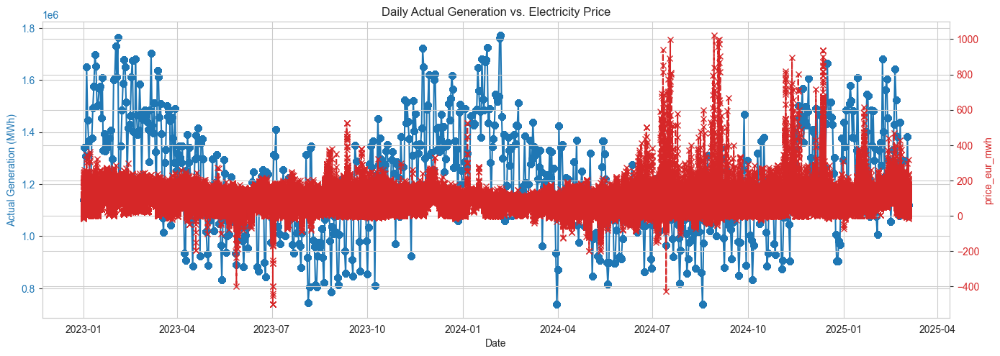

In [175]:
def plot_dual_axis(x, y1, y2, xlabel, y1_label, y2_label, title):
    fig, ax1 = plt.subplots(figsize=(14, 5))
    
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(y1_label, color='tab:blue')
    ax1.plot(x, y1, label=y1_label, color='tab:blue', marker='o')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    
    ax2 = ax1.twinx()
    ax2.set_ylabel(y2_label, color='tab:red')
    ax2.plot(x, y2, label=y2_label, color='tab:red', linestyle='dashed', marker='x')
    ax2.tick_params(axis='y', labelcolor='tab:red')

    fig.tight_layout()
    plt.title(title)
    plt.show()

# Plot for Daily Trends
plot_dual_axis(
    gen_price_daily['date'], 
    gen_price_daily['actual_generation_mwh'], 
    gen_price_daily['price_eur_mwh'], 
    "Date", "Actual Generation (MWh)", "price_eur_mwh", 
    "Daily Actual Generation vs. Electricity Price"
)


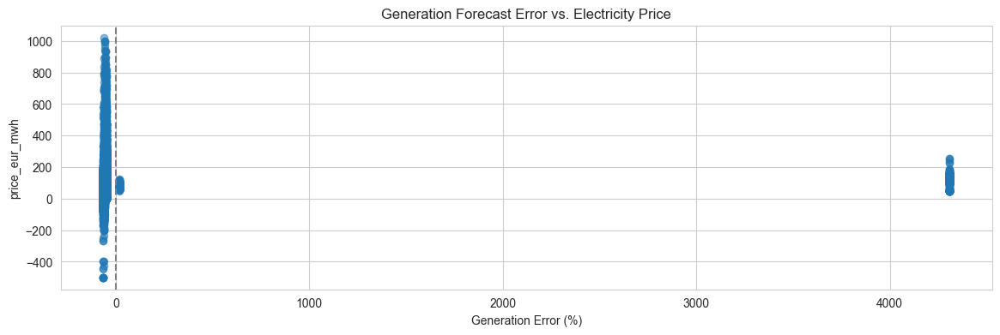

In [176]:
plt.figure(figsize=(14,4))
plt.scatter(gen_price_daily['generation_error (%)'], gen_price_daily['price_eur_mwh'], alpha=0.5)
plt.xlabel("Generation Error (%)")
plt.ylabel("price_eur_mwh")
plt.title("Generation Forecast Error vs. Electricity Price")
plt.axvline(x=0, color='grey', linestyle='--')  # Reference line at 0% error
plt.grid(True)
plt.show()


In [177]:
df_consum_summary.columns



Index(['date', 'daily_avg_consumption', 'daily_median_consumption',
       'daily_peak_consumption', 'daily_low_consumption',
       'daily_range_consumption', 'daily_avg_price', 'daily_median_price',
       'daily_peak_price', 'daily_low_price', 'daily_range_price',
       'daily_price_percentiles', 'weekly_avg_consumption',
       'weekly_median_consumption', 'weekly_peak_consumption',
       'weekly_low_consumption', 'weekly_range_consumption',
       'weekly_avg_price', 'weekly_median_price', 'weekly_peak_price',
       'weekly_low_price', 'weekly_range_price', 'weekly_price_percentiles',
       'weekday_avg_consumption', 'weekend_avg_consumption',
       'weekday_avg_price', 'weekend_avg_price', 'peak_hour_consumption',
       'peak_hour_consumption_value', 'hourly_range_consumption',
       'peak_hour_price', 'peak_hour_price_value', 'hourly_range_price',
       'std_dev_price', 'kurtosis_price', 'skewness_price', 'entropy_price'],
      dtype='object')

In [178]:
gen_price_hourly.isnull().mean() * 100

hour_of_day                  0.000000
actual_generation_mwh        0.000000
forecasted_generation_mwh    0.000000
price_eur_mwh                0.495907
generation_error (%)         0.000000
dtype: float64

In [179]:
# import numpy as np
# import pandas as pd
# from scipy.stats import kurtosis, skew, entropy


# def generate_hourly_stats(df):
#     """
#     Compute comprehensive hourly statistics for generation, price, and forecast error.
    
#     Parameters:
#     df (DataFrame): Data containing columns ['hour_of_day', 'actual_generation_mwh', 
#                                             'forecasted_generation_mwh', 'price_eur_mwh', 
#                                             'generation_error (%)']
                                            
#     Returns:
#     DataFrame: Consolidated summary statistics.
#     """
    
#     # Ensure data is clean
#     df = df.dropna(subset=["price_eur_mwh", "actual_generation_mwh", "forecasted_generation_mwh"])
    
#     # Define peak and low hours
#     peak_hours = list(range(8, 20))  # 8 AM - 7 PM
#     low_hours = list(range(0, 8)) + list(range(20, 24))  # 8 PM - 7 AM

#     # Weekday vs. Weekend Mask (Assuming dataset has weekday information)
#     df["is_weekend"] = df["hour_of_day"].apply(lambda x: 1 if x in [5, 6] else 0)  # 5=Saturday, 6=Sunday
    
#     # Group by hour of day
#     hourly_stats = df.groupby("hour_of_day").agg(
#         actual_generation_mean=("actual_generation_mwh", "mean"),
#         actual_generation_median=("actual_generation_mwh", "median"),
#         actual_generation_std=("actual_generation_mwh", "std"),
#         forecasted_generation_mean=("forecasted_generation_mwh", "mean"),
#         generation_error_mean=("generation_error (%)", "mean"),
#         price_mean=("price_eur_mwh", "mean"),
#         price_median=("price_eur_mwh", "median"),
#         price_std=("price_eur_mwh", "std"),
#         price_kurtosis=("price_eur_mwh", lambda x: kurtosis(x, nan_policy="omit") if len(x.dropna()) > 0 else np.nan),
#         price_skewness=("price_eur_mwh", lambda x: skew(x, nan_policy="omit") if len(x.dropna()) > 0 else np.nan),
#         price_entropy=("price_eur_mwh", lambda x: entropy(np.histogram(x.dropna(), bins=10)[0] + 1e-6) if len(x.dropna()) > 0 else np.nan),  
#     ).reset_index()
    
#     # Peak and Low Hour Statistics
#     peak_df = df[df["hour_of_day"].isin(peak_hours)]
#     low_df = df[df["hour_of_day"].isin(low_hours)]

#     peak_stats = {
#         "peak_actual_generation_mean": peak_df["actual_generation_mwh"].mean(),
#         "peak_price_mean": peak_df["price_eur_mwh"].mean(),
#         "peak_price_median": peak_df["price_eur_mwh"].median(),
#     }

#     low_stats = {
#         "low_actual_generation_mean": low_df["actual_generation_mwh"].mean(),
#         "low_price_mean": low_df["price_eur_mwh"].mean(),
#         "low_price_median": low_df["price_eur_mwh"].median(),
#     }
    
#     # Weekday vs. Weekend Statistics
#     weekday_df = df[df["is_weekend"] == 0]
#     weekend_df = df[df["is_weekend"] == 1]

#     weekday_stats = {
#         "weekday_price_mean": weekday_df["price_eur_mwh"].mean(),
#         "weekday_actual_generation_mean": weekday_df["actual_generation_mwh"].mean(),
#     }

#     weekend_stats = {
#         "weekend_price_mean": weekend_df["price_eur_mwh"].mean(),
#         "weekend_actual_generation_mean": weekend_df["actual_generation_mwh"].mean(),
#     }

#     # Convert additional stats to DataFrame and merge
#     additional_stats = pd.DataFrame([{**peak_stats, **low_stats, **weekday_stats, **weekend_stats}])
#     summary_stats = hourly_stats.merge(additional_stats, how="cross")  # Add same values to all rows
    
#     return summary_stats


# gen_price_hourly_summary = generate_hourly_stats(gen_price_hourly)


In [180]:
gen_price_weekly['week_of_year'].unique()

<IntegerArray>
[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
Length: 52, dtype: UInt32

In [181]:
# gen_price_daily

In [182]:
import pandas as pd
from scipy.stats import kurtosis, skew, entropy

# Function to Compute Statistical Summary
def compute_price_stats(df, group_cols):
    """
    Computes price statistics including mean, std, min, max, and percentiles.
    Retains the original price column.
    """
    stats = df.groupby(group_cols).agg(
        price_mean=("price_eur_mwh", "mean"),
        price_median=("price_eur_mwh", "median"),
        price_std=("price_eur_mwh", "std"),
        price_min=("price_eur_mwh", "min"),
        price_max=("price_eur_mwh", "max"),
        price_1pct=("price_eur_mwh", lambda x: x.quantile(0.01)),
        price_5pct=("price_eur_mwh", lambda x: x.quantile(0.05)),
        price_95pct=("price_eur_mwh", lambda x: x.quantile(0.95)),
        price_99pct=("price_eur_mwh", lambda x: x.quantile(0.99)),
        original_prices=("price_eur_mwh", list)  # Keep original prices for merging later
    ).reset_index()
    
    return stats

# Function to Compute Extra Stats (Kurtosis, Skewness, Entropy)
def compute_extra_stats(df, group_cols):
    """
    Computes additional statistics such as kurtosis, skewness, and entropy for price.
    """
    extra_stats = df.groupby(group_cols)["price_eur_mwh"].agg(
        kurtosis_price=lambda x: kurtosis(x, fisher=True, nan_policy="omit"),
        skewness_price=lambda x: skew(x, nan_policy="omit"),
        entropy_price=lambda x: entropy(pd.Series(x).dropna().value_counts(normalize=True), base=2)
    ).reset_index()

    return extra_stats

# Compute Hourly, Daily, Weekly Stats
gen_price_hourly_stats = compute_price_stats(gen_price_hourly, ["hour_of_day", "actual_generation_mwh", "forecasted_generation_mwh"])
gen_price_weekly_stats = compute_price_stats(gen_price_weekly, ["week_of_year", "actual_generation_mwh", "forecasted_generation_mwh"])
gen_price_daily_stats = compute_price_stats(gen_price_daily, ["date", "actual_generation_mwh", "forecasted_generation_mwh"])

# Compute Extra Stats
extra_stats_hourly = compute_extra_stats(gen_price_hourly, ["hour_of_day", "actual_generation_mwh", "forecasted_generation_mwh"])
extra_stats_weekly = compute_extra_stats(gen_price_weekly, ["week_of_year", "actual_generation_mwh", "forecasted_generation_mwh"])
extra_stats_daily = compute_extra_stats(gen_price_daily, ["date", "actual_generation_mwh", "forecasted_generation_mwh"])

# Merge Extra Stats with Original Stats
gen_price_hourly_stats_df = gen_price_hourly_stats.merge(extra_stats_hourly, on=["hour_of_day", "actual_generation_mwh", "forecasted_generation_mwh"])
gen_price_weekly_stats_df = gen_price_weekly_stats.merge(extra_stats_weekly, on=["week_of_year", "actual_generation_mwh", "forecasted_generation_mwh"])
gen_price_daily_stats_df = gen_price_daily_stats.merge(extra_stats_daily, on=["date", "actual_generation_mwh", "forecasted_generation_mwh"])

# Verify that "price_eur_mwh" is included
gen_price_hourly_stats_df["original_prices"] = gen_price_hourly_stats_df["original_prices"].apply(lambda x: x if isinstance(x, list) else [])
gen_price_weekly_stats_df["original_prices"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: x if isinstance(x, list) else [])
gen_price_daily_stats_df["original_prices"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: x if isinstance(x, list) else [])

# Display the final DataFrame
gen_price_hourly_stats_df


,hour_of_day,actual_generation_mwh,forecasted_generation_mwh,price_mean,price_median,price_std,price_min,price_max,price_1pct,price_5pct,price_95pct,price_99pct,original_prices,kurtosis_price,skewness_price,entropy_price
0,0,929.664120,5581.276460,81.850067,87.89,35.507120,-16.45,250.39,-0.020,10.51,133.67,154.928,"[-5.17, 57.91, 130.01, 80.89, 0.05, 107.21, 97...",-0.077862,-0.447023,12.056595
1,1,905.547780,5421.999545,76.387192,82.69,34.878837,-16.42,200.92,-0.184,5.82,127.37,148.926,"[-1.07, 51.67, 120.0, 70.67, 0.07, 101.1, 98.4...",-0.208681,-0.433024,12.109071
2,2,892.645861,5340.308735,73.446594,79.72,34.812415,-21.04,187.95,-0.800,4.00,124.00,145.716,"[-1.47, 52.93, 118.76, 40.0, 0.07, 96.73, 96.0...",-0.274544,-0.413524,12.082905
3,3,886.491641,5303.946694,71.005083,77.40,34.914211,-13.12,187.82,-1.076,2.63,122.32,142.290,"[-5.08, 44.09, 115.0, 8.68, 0.12, 82.34, 87.97...",-0.393697,-0.396177,12.148080
4,4,891.741374,5342.074321,71.286726,77.50,34.982426,-21.40,187.74,-1.138,3.16,123.02,142.434,"[-4.49, 50.08, 113.63, 0.85, 2.23, 81.93, 82.9...",-0.391297,-0.396017,12.240088
5,5,919.675334,5504.273729,76.951417,83.28,35.540761,-15.15,197.23,-0.352,5.87,129.69,149.720,"[-5.4, 69.72, 116.27, 11.02, 10.07, 84.03, 83....",-0.251954,-0.405282,12.264069
6,6,993.720095,5914.723207,91.285585,96.26,40.581880,-14.33,276.58,-0.030,11.73,154.63,176.010,"[-5.02, 105.08, 138.92, 61.02, 61.04, 97.25, 9...",-0.065477,-0.280000,12.366143
7,7,1075.836353,6440.708567,105.454779,106.93,49.863928,-12.17,600.03,0.004,18.65,185.00,221.976,"[-1.3, 140.64, 159.92, 79.2, 87.19, 106.51, 10...",5.570105,0.692625,12.365260
8,8,1151.441841,7070.426555,107.430581,106.21,53.798654,-21.44,655.64,0.000,19.77,193.08,252.508,"[-1.44, 145.98, 169.17, 84.2, 95.84, 120.7, 11...",7.970733,1.168005,12.247430
9,9,1216.356734,7722.608977,95.945875,94.99,50.553252,-50.26,646.79,-1.012,9.31,174.92,240.126,"[-1.09, 147.05, 171.18, 83.32, 125.55, 116.86,...",6.573422,1.010874,12.206163


In [183]:
# gen_price_daily_stats_df.describe()
# gen_price_hourly_stats_df
# extra_stats_daily
# gen_price_daily_stats

Visualizations

In [184]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# def plot_hourly_generation_price(df):
#     """
#     Plots a dual-axis line chart showing hourly generation vs. price.

#     Parameters:
#         df (DataFrame): Hourly generation and price statistics.
#     """
#     fig, ax1 = plt.subplots(figsize=(12, 6))

#     # First axis: Generation (MWh)
#     ax1.plot(df["hour_of_day"], df["actual_generation_mwh"], color="blue", label="Generation (MWh)")
#     ax1.set_ylabel("Generation (MWh)", color="blue", fontsize=12)
#     ax1.tick_params(axis="y", labelcolor="blue")

#     # Second axis: Price (€/MWh)
#     ax2 = ax1.twinx()
#     ax2.plot(df["hour_of_day"], df["price_eur_mwh"], color="red", linestyle="dashed", label="Price (€/MWh)")
#     ax2.set_ylabel("Price (€/MWh)", color="red", fontsize=12)
#     ax2.tick_params(axis="y", labelcolor="red")

#     # Formatting
#     ax1.set_xlabel("Hour of Day", fontsize=12)
#     ax1.set_title("Hourly Generation vs. Price Trends", fontsize=14, fontweight="bold")
#     ax1.grid(True, linestyle="--", alpha=0.5)
#     ax1.set_xticks(range(0, 24))

#     plt.show()

# plot_hourly_generation_price(gen_price_hourly_stats_df)



---

We can use "original_prices" to directly extract all recorded price values for a specific hour, day, or week.
Instead of relying on just mean/median, we can plot the full price distribution (boxplots, violin plots).

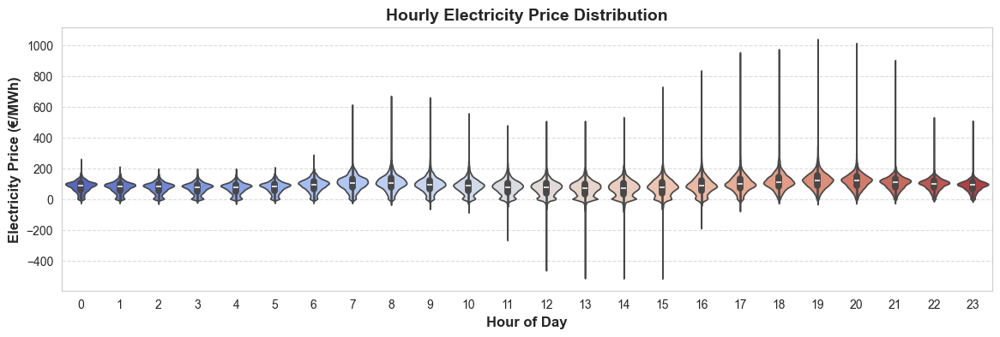

In [185]:
import ast

gen_price_hourly_stats_df["original_prices"] = gen_price_hourly_stats_df["original_prices"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
hourly_prices_expanded = gen_price_hourly_stats_df.explode("original_prices").reset_index(drop=True)
hourly_prices_expanded["original_prices"] = pd.to_numeric(hourly_prices_expanded["original_prices"], errors="coerce")


plt.figure(figsize=(14, 4))
sns.violinplot(x="hour_of_day", y="original_prices", data=hourly_prices_expanded, palette="coolwarm")

plt.xlabel("Hour of Day", fontsize=12, fontweight="bold")
plt.ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
plt.title("Hourly Electricity Price Distribution", fontsize=14, fontweight="bold")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


-Why Use original_prices?

Instead of just showing averages, we see the full spread of prices across hours.
Helps detect outliers and price volatility at specific times.

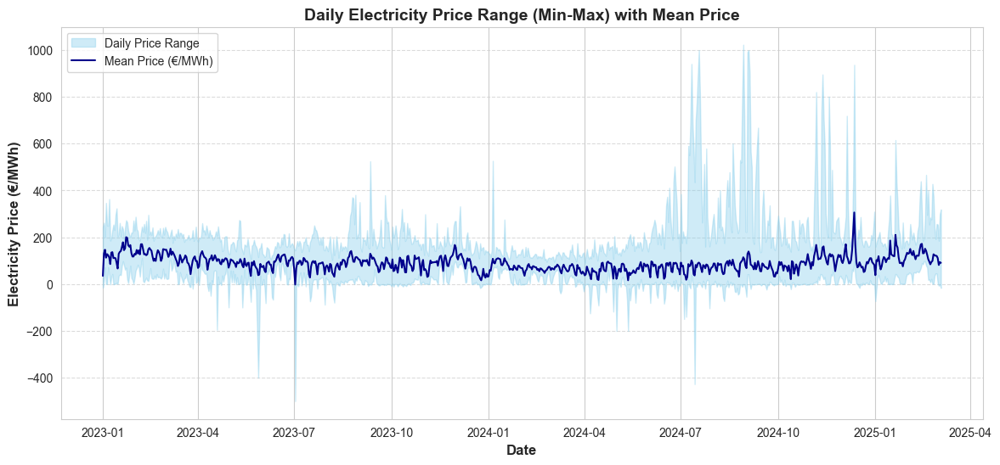

In [186]:
# Extract min and max prices per day
gen_price_daily_stats_df["price_min"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: min(x))
gen_price_daily_stats_df["price_max"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: max(x))

# Plot price range
plt.figure(figsize=(14, 6))
plt.fill_between(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_min"], gen_price_daily_stats_df["price_max"], color='skyblue', alpha=0.4, label="Daily Price Range")
plt.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_mean"], color='darkblue', label="Mean Price (€/MWh)")

plt.xlabel("Date", fontsize=12, fontweight="bold")
plt.ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
plt.title("Daily Electricity Price Range (Min-Max) with Mean Price", fontsize=14, fontweight="bold")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()



---


Weekly Trends: Outlier Detection & Percentile Calculations

Instead of just showing weekly averages, we can compute:

- 5th & 95th percentiles for price variability.
- Identify weeks with unusual price spikes.

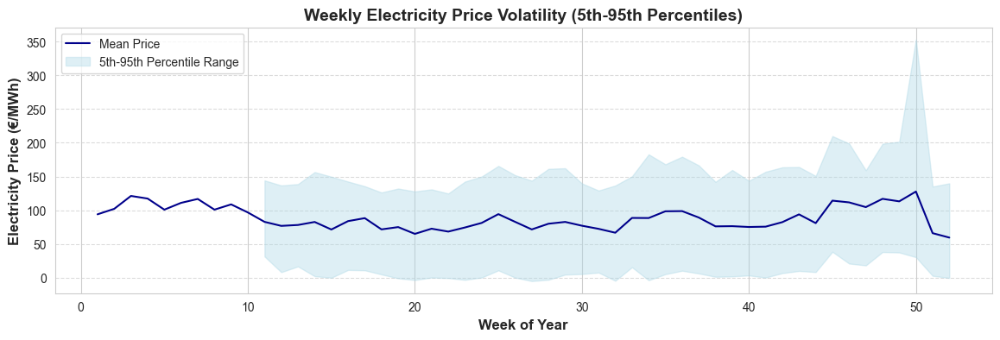

In [187]:
# Compute percentiles
gen_price_weekly_stats_df["price_5th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 5))
gen_price_weekly_stats_df["price_95th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 95))

# Plot weekly trend with percentile bands
plt.figure(figsize=(14, 4))
plt.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_mean"], label="Mean Price", color="darkblue")
plt.fill_between(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_5th"], gen_price_weekly_stats_df["price_95th"], color='lightblue', alpha=0.4, label="5th-95th Percentile Range")

plt.xlabel("Week of Year", fontsize=12, fontweight="bold")
plt.ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
plt.title("Weekly Electricity Price Volatility (5th-95th Percentiles)", fontsize=14, fontweight="bold")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


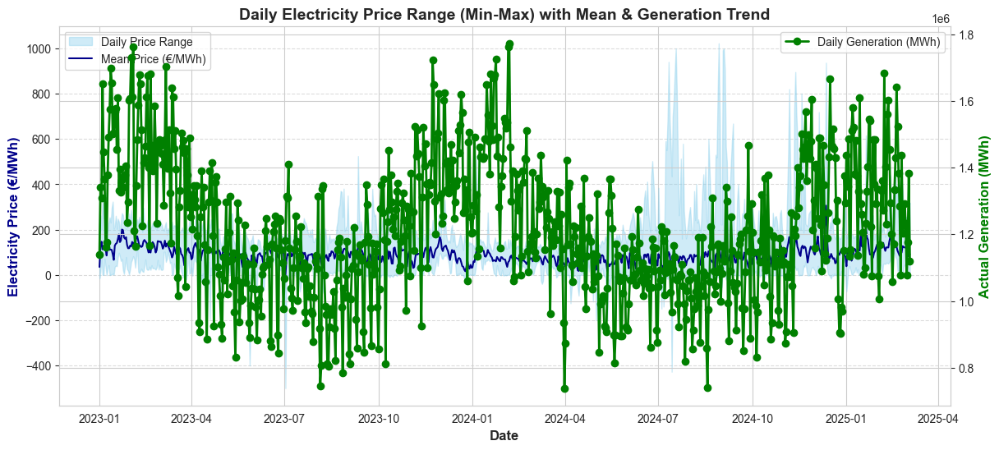

In [188]:
# Extract min and max prices per day
gen_price_daily_stats_df["price_min"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: min(x))
gen_price_daily_stats_df["price_max"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: max(x))

# Plot Price Range with Daily Generation Trend
fig, ax1 = plt.subplots(figsize=(14, 6))

# Price range (shaded)
ax1.fill_between(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_min"], gen_price_daily_stats_df["price_max"], 
                 color='skyblue', alpha=0.4, label="Daily Price Range")
ax1.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_mean"], color='darkblue', label="Mean Price (€/MWh)")
ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold", color="darkblue")

# Twin axis for daily generation
ax2 = ax1.twinx()
ax2.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["actual_generation_mwh"], 
         color="green", marker="o", linestyle="-", linewidth=2, label="Daily Generation (MWh)")

ax2.set_ylabel("Actual Generation (MWh)", fontsize=12, fontweight="bold", color="green")

# Labels & Grid
ax1.set_xlabel("Date", fontsize=12, fontweight="bold")
ax1.set_title("Daily Electricity Price Range (Min-Max) with Mean & Generation Trend", fontsize=14, fontweight="bold")
ax1.grid(axis="y", linestyle="--", alpha=0.7)
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

plt.show()


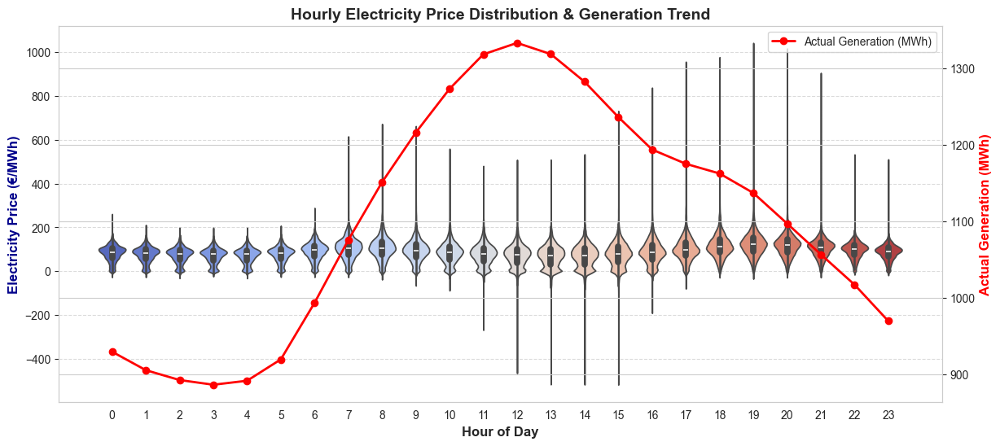

In [189]:
# Convert original prices from string to list
gen_price_hourly_stats_df["original_prices"] = gen_price_hourly_stats_df["original_prices"].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# Expand price values
hourly_prices_expanded = gen_price_hourly_stats_df.explode("original_prices").reset_index(drop=True)
hourly_prices_expanded["original_prices"] = pd.to_numeric(hourly_prices_expanded["original_prices"], errors="coerce")

# Plot Violin Plot with Consumption Trend
fig, ax1 = plt.subplots(figsize=(14, 6))

# Violin plot (electricity prices)
sns.violinplot(x="hour_of_day", y="original_prices", data=hourly_prices_expanded, palette="coolwarm", ax=ax1)
ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold", color="darkblue")

# Twin axis for consumption trend
ax2 = ax1.twinx()
ax2.plot(gen_price_hourly_stats_df["hour_of_day"], gen_price_hourly_stats_df["actual_generation_mwh"], 
         color="red", marker="o", linestyle="-", linewidth=2, label="Actual Generation (MWh)")

ax2.set_ylabel("Actual Generation (MWh)", fontsize=12, fontweight="bold", color="red")

# Labels & Grid
ax1.set_xlabel("Hour of Day", fontsize=12, fontweight="bold")
ax1.set_title("Hourly Electricity Price Distribution & Generation Trend", fontsize=14, fontweight="bold")
ax1.grid(axis="y", linestyle="--", alpha=0.7)
ax2.legend(loc="upper right")

plt.show()


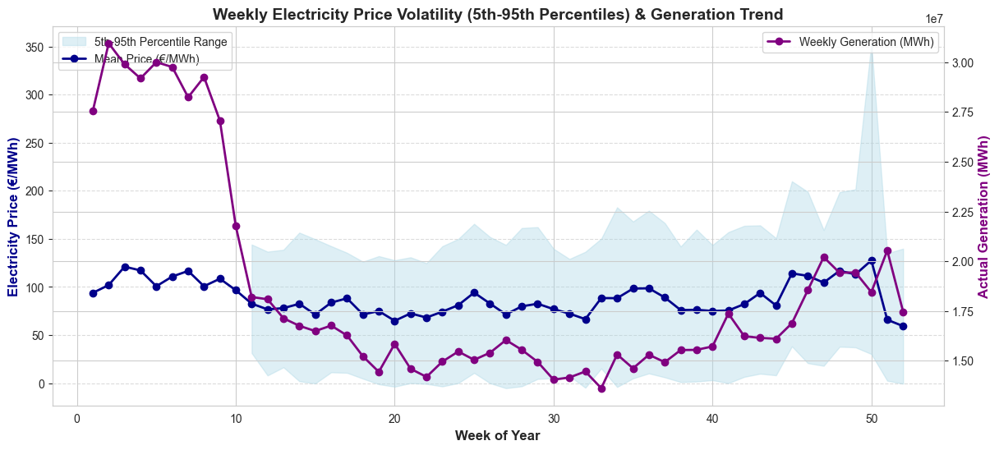

In [190]:
# Compute 5th and 95th percentiles
gen_price_weekly_stats_df["price_5th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 5))
gen_price_weekly_stats_df["price_95th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 95))

# Plot Weekly Price Volatility with Generation Trend
fig, ax1 = plt.subplots(figsize=(14, 6))

# Price percentile range (shaded)
ax1.fill_between(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_5th"], gen_price_weekly_stats_df["price_95th"], 
                 color='lightblue', alpha=0.4, label="5th-95th Percentile Range")
ax1.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_mean"], 
         color="darkblue", marker="o", linestyle="-", linewidth=2, label="Mean Price (€/MWh)")
ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold", color="darkblue")

# Twin axis for weekly generation trend
ax2 = ax1.twinx()
ax2.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["actual_generation_mwh"], 
         color="purple", marker="o", linestyle="-", linewidth=2, label="Weekly Generation (MWh)")

ax2.set_ylabel("Actual Generation (MWh)", fontsize=12, fontweight="bold", color="purple")

# Labels & Grid
ax1.set_xlabel("Week of Year", fontsize=12, fontweight="bold")
ax1.set_title("Weekly Electricity Price Volatility (5th-95th Percentiles) & Generation Trend", fontsize=14, fontweight="bold")
ax1.grid(axis="y", linestyle="--", alpha=0.7)
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

plt.show()


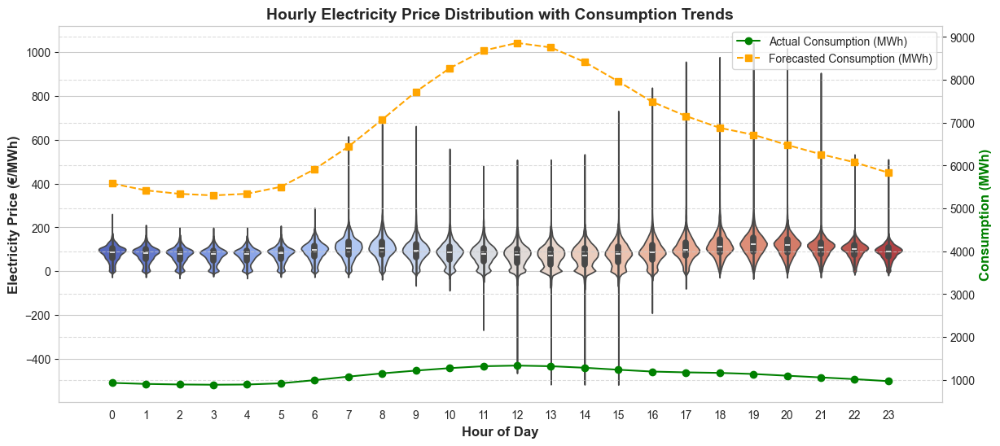

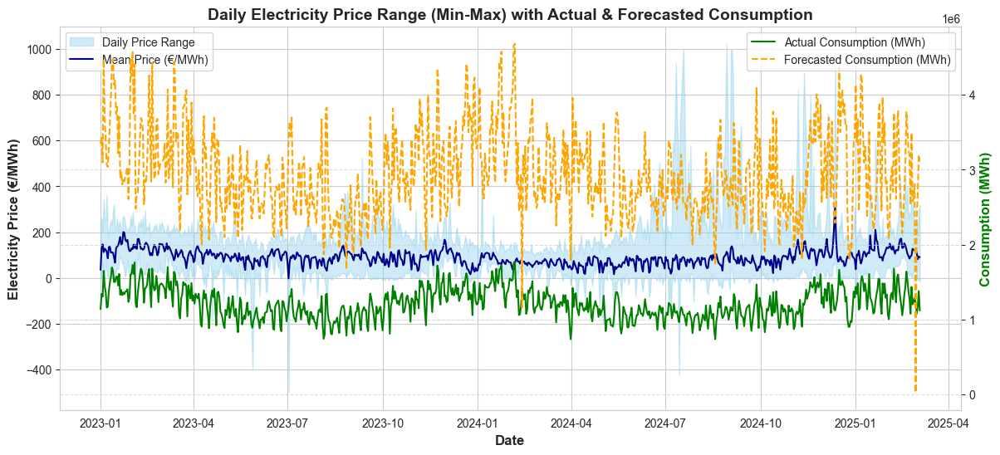

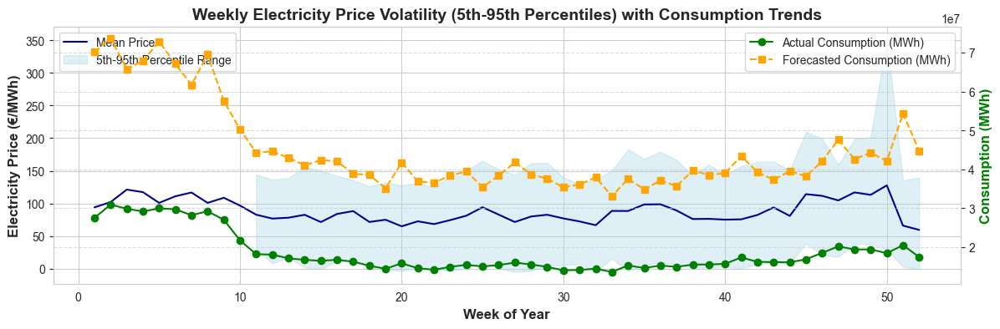

In [191]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import ast

# def plot_price_trends(gen_price_hourly_stats_df, gen_price_daily_stats_df, gen_price_weekly_stats_df):
#     """Generate insightful price and consumption visualizations with forecasted consumption integration."""

#     # Convert 'original_prices' from string representation to lists
#     for df in [gen_price_hourly_stats_df, gen_price_daily_stats_df, gen_price_weekly_stats_df]:
#         df["original_prices"] = df["original_prices"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

#     # ---------- 1. Violin Plot: Hourly Price Distribution with Forecasted Consumption ----------
#     hourly_prices_expanded = gen_price_hourly_stats_df.explode("original_prices").reset_index(drop=True)
#     hourly_prices_expanded["original_prices"] = pd.to_numeric(hourly_prices_expanded["original_prices"], errors="coerce")

#     plt.figure(figsize=(14, 6))
#     sns.violinplot(x="hour_of_day", y="original_prices", data=hourly_prices_expanded, palette="coolwarm")
    
#     plt.xlabel("Hour of Day", fontsize=12, fontweight="bold")
#     plt.ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
#     plt.title("Hourly Electricity Price Distribution", fontsize=14, fontweight="bold")
#     plt.grid(axis="y", linestyle="--", alpha=0.7)
#     plt.show()

#     # ---------- 2. Daily Price Range (Min-Max) with Mean Price ----------
#     gen_price_daily_stats_df["price_min"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: min(x))
#     gen_price_daily_stats_df["price_max"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: max(x))

#     fig, ax1 = plt.subplots(figsize=(14, 6))
    
#     ax1.fill_between(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_min"], gen_price_daily_stats_df["price_max"], 
#                      color='skyblue', alpha=0.4, label="Daily Price Range")
#     ax1.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_mean"], color='darkblue', label="Mean Price (€/MWh)")
    
#     # Dual-axis for forecasted generation
#     ax2 = ax1.twinx()
#     ax2.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["forecasted_generation_mwh"], color="green", linestyle="dashed", label="Forecasted Generation (MWh)")

#     ax1.set_xlabel("Date", fontsize=12, fontweight="bold")
#     ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
#     ax2.set_ylabel("Forecasted Generation (MWh)", fontsize=12, fontweight="bold", color="green")

#     ax1.set_title("Daily Electricity Price Range (Min-Max) with Forecasted Generation", fontsize=14, fontweight="bold")
#     ax1.legend(loc="upper left")
#     ax2.legend(loc="upper right")
    
#     plt.grid(axis="y", linestyle="--", alpha=0.7)
#     plt.show()

#     # ---------- 3. Weekly Price Volatility (5th-95th Percentiles) ----------
#     gen_price_weekly_stats_df["price_5th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 5))
#     gen_price_weekly_stats_df["price_95th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 95))

#     fig, ax1 = plt.subplots(figsize=(14, 4))
    
#     ax1.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_mean"], label="Mean Price", color="darkblue")
#     ax1.fill_between(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_5th"], gen_price_weekly_stats_df["price_95th"], 
#                      color='lightblue', alpha=0.4, label="5th-95th Percentile Range")
    
#     # Dual-axis for forecasted generation
#     ax2 = ax1.twinx()
#     ax2.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["forecasted_generation_mwh"], color="green", linestyle="dashed", label="Forecasted Generation (MWh)")

#     ax1.set_xlabel("Week of Year", fontsize=12, fontweight="bold")
#     ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
#     ax2.set_ylabel("Forecasted Generation (MWh)", fontsize=12, fontweight="bold", color="green")

#     ax1.set_title("Weekly Electricity Price Volatility (5th-95th Percentiles) with Forecasted Generation", fontsize=14, fontweight="bold")
#     ax1.legend(loc="upper left")
#     ax2.legend(loc="upper right")

#     plt.grid(axis="y", linestyle="--", alpha=0.7)
#     plt.show()
    
    
def plot_price_trends(gen_price_hourly_stats_df, gen_price_daily_stats_df, gen_price_weekly_stats_df):
    """Generate insightful price and consumption visualizations with both actual and forecasted consumption."""

    # Convert 'original_prices' from string representation to lists
    for df in [gen_price_hourly_stats_df, gen_price_daily_stats_df, gen_price_weekly_stats_df]:
        df["original_prices"] = df["original_prices"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

    # ---------- 1. Violin Plot: Hourly Price Distribution with Consumption ----------
    hourly_prices_expanded = gen_price_hourly_stats_df.explode("original_prices").reset_index(drop=True)
    hourly_prices_expanded["original_prices"] = pd.to_numeric(hourly_prices_expanded["original_prices"], errors="coerce")

    fig, ax1 = plt.subplots(figsize=(14, 6))
    sns.violinplot(x="hour_of_day", y="original_prices", data=hourly_prices_expanded, palette="coolwarm", ax=ax1)

    # Secondary axis for actual and forecasted consumption
    ax2 = ax1.twinx()
    ax2.plot(gen_price_hourly_stats_df["hour_of_day"], gen_price_hourly_stats_df["actual_generation_mwh"], 
             color="green", linestyle="-", marker="o", label="Actual Consumption (MWh)")
    ax2.plot(gen_price_hourly_stats_df["hour_of_day"], gen_price_hourly_stats_df["forecasted_generation_mwh"], 
             color="orange", linestyle="--", marker="s", label="Forecasted Consumption (MWh)")

    ax1.set_xlabel("Hour of Day", fontsize=12, fontweight="bold")
    ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
    ax2.set_ylabel("Consumption (MWh)", fontsize=12, fontweight="bold", color="green")

    ax1.set_title("Hourly Electricity Price Distribution with Consumption Trends", fontsize=14, fontweight="bold")
    ax2.legend(loc="upper right")
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.show()

    # ---------- 2. Daily Price Range (Min-Max) with Mean Price & Consumption ----------
    gen_price_daily_stats_df["price_min"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: min(x))
    gen_price_daily_stats_df["price_max"] = gen_price_daily_stats_df["original_prices"].apply(lambda x: max(x))

    fig, ax1 = plt.subplots(figsize=(14, 6))
    
    ax1.fill_between(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_min"], gen_price_daily_stats_df["price_max"], 
                     color='skyblue', alpha=0.4, label="Daily Price Range")
    ax1.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["price_mean"], color='darkblue', label="Mean Price (€/MWh)")
    
    # Dual-axis for actual & forecasted consumption
    ax2 = ax1.twinx()
    ax2.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["actual_generation_mwh"], 
             color="green", linestyle="-", label="Actual Consumption (MWh)")
    ax2.plot(gen_price_daily_stats_df["date"], gen_price_daily_stats_df["forecasted_generation_mwh"], 
             color="orange", linestyle="--", label="Forecasted Consumption (MWh)")

    ax1.set_xlabel("Date", fontsize=12, fontweight="bold")
    ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
    ax2.set_ylabel("Consumption (MWh)", fontsize=12, fontweight="bold", color="green")

    ax1.set_title("Daily Electricity Price Range (Min-Max) with Actual & Forecasted Consumption", fontsize=14, fontweight="bold")
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")
    
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.show()

    # ---------- 3. Weekly Price Volatility (5th-95th Percentiles) with Consumption ----------
    gen_price_weekly_stats_df["price_5th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 5))
    gen_price_weekly_stats_df["price_95th"] = gen_price_weekly_stats_df["original_prices"].apply(lambda x: np.percentile(x, 95))

    fig, ax1 = plt.subplots(figsize=(14, 4))
    
    ax1.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_mean"], label="Mean Price", color="darkblue")
    ax1.fill_between(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["price_5th"], gen_price_weekly_stats_df["price_95th"], 
                     color='lightblue', alpha=0.4, label="5th-95th Percentile Range")
    
    # Dual-axis for actual & forecasted consumption
    ax2 = ax1.twinx()
    ax2.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["actual_generation_mwh"], 
             color="green", linestyle="-", marker="o", label="Actual Consumption (MWh)")
    ax2.plot(gen_price_weekly_stats_df["week_of_year"], gen_price_weekly_stats_df["forecasted_generation_mwh"], 
             color="orange", linestyle="--", marker="s", label="Forecasted Consumption (MWh)")

    ax1.set_xlabel("Week of Year", fontsize=12, fontweight="bold")
    ax1.set_ylabel("Electricity Price (€/MWh)", fontsize=12, fontweight="bold")
    ax2.set_ylabel("Consumption (MWh)", fontsize=12, fontweight="bold", color="green")

    ax1.set_title("Weekly Electricity Price Volatility (5th-95th Percentiles) with Consumption Trends", fontsize=14, fontweight="bold")
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")

    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.show()
    

plot_price_trends(gen_price_hourly_stats_df, gen_price_daily_stats_df, gen_price_weekly_stats_df)



### 1.4 What patterns emerge from scheduled commercial exchanges and cross-border physical flows?

In [192]:
print(df_cross_border_quarterhourly.info(), '\n')

print(df_scheduled_exchanges_quarterhourly.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1676928 entries, 0 to 1676927
Data columns (total 6 columns):
 #   Column          Non-Null Count    Dtype         
---  ------          --------------    -----         
 0   start_date      1676928 non-null  datetime64[ns]
 1   end_date        1676928 non-null  datetime64[ns]
 2   country         1676928 non-null  object        
 3   flow_direction  1676928 non-null  object        
 4   energy_mwh      1676563 non-null  float64       
 5   net_export_mwh  1676158 non-null  float64       
dtypes: datetime64[ns](2), float64(2), object(2)
memory usage: 76.8+ MB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1676928 entries, 0 to 1676927
Data columns (total 6 columns):
 #   Column          Non-Null Count    Dtype         
---  ------          --------------    -----         
 0   start_date      1676928 non-null  datetime64[ns]
 1   end_date        1676928 non-null  datetime64[ns]
 2   net_export_mwh  1676928 non-null  float64   

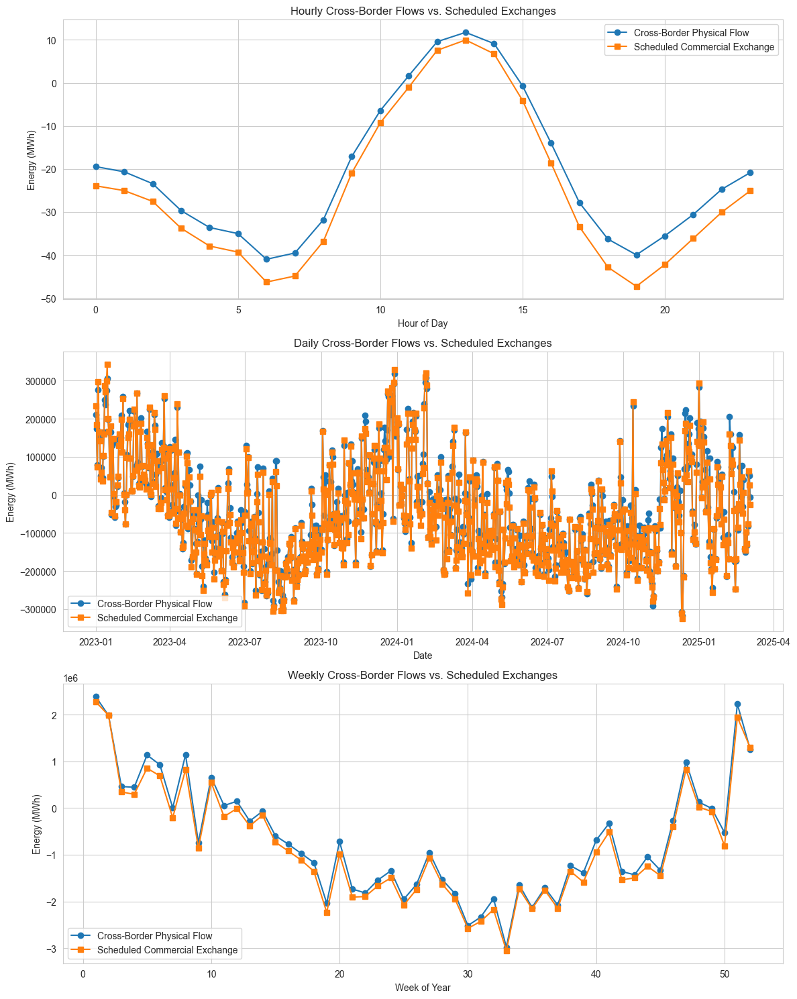

Hourly Cross-Border Physical Flows:
    hour_of_day  energy_mwh
0            0  -19.470906
1            1  -20.665470
2            2  -23.427464
3            3  -29.688763
4            4  -33.616581
Daily Cross-Border Physical Flows:
          date  energy_mwh
0  2023-01-01   210556.25
1  2023-01-02   173821.50
2  2023-01-03    78799.25
3  2023-01-04   275596.00
4  2023-01-05   149351.75
Weekly Cross-Border Physical Flows:
    week_of_year  energy_mwh
0             1  2386423.00
1             2  1982271.50
2             3   461019.50
3             4   444549.25
4             5  1135498.75
Hourly Scheduled Exchanges:
    hour_of_day  energy_mwh
0            0  -23.929373
1            1  -25.037848
2            2  -27.544667
3            3  -33.784117
4            4  -37.920193
Daily Scheduled Exchanges:
          date  energy_mwh
0  2023-01-01   234661.98
1  2023-01-02   184254.87
2  2023-01-03    73723.13
3  2023-01-04   297669.80
4  2023-01-05   164372.99
Weekly Scheduled Exchanges:
 

In [193]:
# Ensure datetime conversion
df_cross_border_quarterhourly['start_date'] = pd.to_datetime(df_cross_border_quarterhourly['start_date'])
df_scheduled_exchanges_quarterhourly['start_date'] = pd.to_datetime(df_scheduled_exchanges_quarterhourly['start_date'])

df_scheduled_exchanges_quarterhourly['date'] = df_scheduled_exchanges_quarterhourly['start_date'].dt.date
df_cross_border_quarterhourly['date'] = df_cross_border_quarterhourly['start_date'].dt.date

df_scheduled_exchanges_quarterhourly['date'] = pd.to_datetime(df_scheduled_exchanges_quarterhourly['date'])
df_cross_border_quarterhourly['date'] = pd.to_datetime(df_cross_border_quarterhourly['date'])

# Extract hour, date, and week
df_cross_border_quarterhourly['hour_of_day'] = df_cross_border_quarterhourly['start_date'].dt.hour
df_cross_border_quarterhourly['week_of_year'] = df_cross_border_quarterhourly['start_date'].dt.isocalendar().week

df_scheduled_exchanges_quarterhourly['hour_of_day'] = df_scheduled_exchanges_quarterhourly['start_date'].dt.hour
df_scheduled_exchanges_quarterhourly['week_of_year'] = df_scheduled_exchanges_quarterhourly['start_date'].dt.isocalendar().week

# Aggregate to hourly, daily, and weekly levels
cross_border_hourly = df_cross_border_quarterhourly.groupby('hour_of_day')['energy_mwh'].mean().reset_index()
cross_border_daily = df_cross_border_quarterhourly.groupby(df_cross_border_quarterhourly['date'].dt.date)['energy_mwh'].sum().reset_index()
cross_border_weekly = df_cross_border_quarterhourly.groupby('week_of_year')['energy_mwh'].sum().reset_index()

scheduled_hourly = df_scheduled_exchanges_quarterhourly.groupby('hour_of_day')['energy_mwh'].mean().reset_index()
scheduled_daily = df_scheduled_exchanges_quarterhourly.groupby(df_scheduled_exchanges_quarterhourly['date'].dt.date)['energy_mwh'].sum().reset_index()
scheduled_weekly = df_scheduled_exchanges_quarterhourly.groupby('week_of_year')['energy_mwh'].sum().reset_index()

# --- PLOTTING ---
fig, axes = plt.subplots(3, 1, figsize=(12, 15))

# Hourly comparison
axes[0].plot(cross_border_hourly['hour_of_day'], cross_border_hourly['energy_mwh'], label='Cross-Border Physical Flow', marker='o')
axes[0].plot(scheduled_hourly['hour_of_day'], scheduled_hourly['energy_mwh'], label='Scheduled Commercial Exchange', marker='s')
axes[0].set_title('Hourly Cross-Border Flows vs. Scheduled Exchanges')
axes[0].set_xlabel('Hour of Day')
axes[0].set_ylabel('Energy (MWh)')
axes[0].legend()

# Daily comparison
axes[1].plot(cross_border_daily['date'], cross_border_daily['energy_mwh'], label='Cross-Border Physical Flow', marker='o')
axes[1].plot(scheduled_daily['date'], scheduled_daily['energy_mwh'], label='Scheduled Commercial Exchange', marker='s')
axes[1].set_title('Daily Cross-Border Flows vs. Scheduled Exchanges')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Energy (MWh)')
axes[1].legend()

# Weekly comparison
axes[2].plot(cross_border_weekly['week_of_year'], cross_border_weekly['energy_mwh'], label='Cross-Border Physical Flow', marker='o')
axes[2].plot(scheduled_weekly['week_of_year'], scheduled_weekly['energy_mwh'], label='Scheduled Commercial Exchange', marker='s')
axes[2].set_title('Weekly Cross-Border Flows vs. Scheduled Exchanges')
axes[2].set_xlabel('Week of Year')
axes[2].set_ylabel('Energy (MWh)')
axes[2].legend()

plt.tight_layout()
plt.show()

# Print preview of aggregated data
print("Hourly Cross-Border Physical Flows:\n", cross_border_hourly.head())
print("Daily Cross-Border Physical Flows:\n", cross_border_daily.head())
print("Weekly Cross-Border Physical Flows:\n", cross_border_weekly.head())

print("Hourly Scheduled Exchanges:\n", scheduled_hourly.head())
print("Daily Scheduled Exchanges:\n", scheduled_daily.head())
print("Weekly Scheduled Exchanges:\n", scheduled_weekly.head())


## 2. Correlation & Feature Relationships 


### 2.1 What features have the strongest correlation with electricity prices?

In [194]:
# df["duration_hours"] = \
consum_duration = (df_actual_consum_quarterhourly["end_date"] - df_actual_consum_quarterhourly["start_date"]).dt.total_seconds() / 3600
consum_duration.unique()

array([  0.25, -23.75])

In [195]:
print(df_actual_consum_quarterhourly, '\n')
print(df_actual_gen_quarterhourly, '\n')
print(df_auto_freq_restore_quarterhourly,'\n')
print(df_balancing_energy_monthly, '\n')
print(df_tso_costs_monthly,'\n')
print(df_cross_border_quarterhourly,'\n')
print(df_day_ahead_price_hourly,'\n')
print(df_exported_balancing_quarterhourly,'\n')

                start_date            end_date      consumption_type  \
0      2023-01-01 00:00:00 2023-01-01 00:15:00       total_grid_load   
1      2023-01-01 00:15:00 2023-01-01 00:30:00       total_grid_load   
2      2023-01-01 00:30:00 2023-01-01 00:45:00       total_grid_load   
3      2023-01-01 00:45:00 2023-01-01 01:00:00       total_grid_load   
4      2023-01-01 01:00:00 2023-01-01 01:15:00       total_grid_load   
...                    ...                 ...                   ...   
228667 2025-03-04 22:45:00 2025-03-04 23:00:00  hydro_pumped_storage   
228668 2025-03-04 23:00:00 2025-03-04 23:15:00  hydro_pumped_storage   
228669 2025-03-04 23:15:00 2025-03-04 23:30:00  hydro_pumped_storage   
228670 2025-03-04 23:30:00 2025-03-04 23:45:00  hydro_pumped_storage   
228671 2025-03-04 23:45:00 2025-03-05 00:00:00  hydro_pumped_storage   

        consumption_mwh  hour_of_day       date  week_of_year  
0               9673.00            0 2023-01-01            52  
1      

In [196]:

print(df_forecasted_consum_quarterhourly,'\n')
print(df_forecasted_gen_quarterhourly,'\n')
print(df_freq_containm_quarterhourly,'\n')
print(df_gen_forecast_quarterhourly,'\n')
print(df_imported_balancing_quarterhourly,'\n')
print(df_installed_gen_yearly,'\n')
print(df_manual_freq_quarterhourly,'\n')
print(df_scheduled_exchanges_quarterhourly)


                start_date            end_date             category  \
0      2023-01-01 00:00:00 2023-01-01 00:15:00  total_grid_load_mwh   
1      2023-01-01 00:15:00 2023-01-01 00:30:00  total_grid_load_mwh   
2      2023-01-01 00:30:00 2023-01-01 00:45:00  total_grid_load_mwh   
3      2023-01-01 00:45:00 2023-01-01 01:00:00  total_grid_load_mwh   
4      2023-01-01 01:00:00 2023-01-01 01:15:00  total_grid_load_mwh   
...                    ...                 ...                  ...   
152443 2025-03-04 22:45:00 2025-03-04 23:00:00    residual_load_mwh   
152444 2025-03-04 23:00:00 2025-03-04 23:15:00    residual_load_mwh   
152445 2025-03-04 23:15:00 2025-03-04 23:30:00    residual_load_mwh   
152446 2025-03-04 23:30:00 2025-03-04 23:45:00    residual_load_mwh   
152447 2025-03-04 23:45:00 2025-03-05 00:00:00    residual_load_mwh   

        forecasted_consum_mwh  hour_of_day       date  week_of_year  
0                    10652.25            0 2023-01-01            52  
1      

In [197]:
datasets = {
    "df_actual_consum_quarterhourly": df_actual_consum_quarterhourly,
    "df_actual_gen_quarterhourly": df_actual_gen_quarterhourly,
    "df_auto_freq_restore_quarterhourly": df_auto_freq_restore_quarterhourly,
    "df_balancing_energy_monthly": df_balancing_energy_monthly,
    "df_tso_costs_monthly": df_tso_costs_monthly,
    "df_cross_border_quarterhourly": df_cross_border_quarterhourly,
    "df_day_ahead_price_hourly": df_day_ahead_price_hourly,
    "df_forecasted_consum_quarterhourly": df_forecasted_consum_quarterhourly,
    "df_forecasted_gen_quarterhourly": df_forecasted_gen_quarterhourly, # •••
    "df_freq_containm_quarterhourly": df_freq_containm_quarterhourly,
    "df_gen_forecast_quarterhourly": df_gen_forecast_quarterhourly, # •••
    "df_imported_balancing_quarterhourly": df_imported_balancing_quarterhourly,
    "df_installed_gen_yearly": df_installed_gen_yearly,
    "df_manual_freq_quarterhourly": df_manual_freq_quarterhourly,
    "df_scheduled_exchanges_quarterhourly": df_scheduled_exchanges_quarterhourly,
    "df_exported_balancing_quarterhourly": df_exported_balancing_quarterhourly
}

for name, df in datasets.items():
    print(f"{name} columns:\n{df.columns}\n")


df_actual_consum_quarterhourly columns:
Index(['start_date', 'end_date', 'consumption_type', 'consumption_mwh',
       'hour_of_day', 'date', 'week_of_year'],
      dtype='object')

df_actual_gen_quarterhourly columns:
Index(['start_date', 'end_date', 'energy_source', 'actual_generation_mwh',
       'date', 'hour_of_day', 'week_of_year'],
      dtype='object')

df_auto_freq_restore_quarterhourly columns:
Index(['start_time', 'end_time', 'category', 'value'], dtype='object')

df_balancing_energy_monthly columns:
Index(['start_time', 'end_time', 'category', 'value'], dtype='object')

df_tso_costs_monthly columns:
Index(['start_date', 'end_date', 'category', 'value'], dtype='object')

df_cross_border_quarterhourly columns:
Index(['start_date', 'end_date', 'country', 'flow_direction', 'energy_mwh',
       'net_export_mwh', 'date', 'hour_of_day', 'week_of_year'],
      dtype='object')

df_day_ahead_price_hourly columns:
Index(['start_date', 'end_date', 'region_type', 'region_name', 'price_e

In [198]:
df_day_ahead_price_hourly.head(2)

,start_date,end_date,region_type,region_name,price_eur_mwh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,-5.17,0,2023-01-01,52
1,2023-01-01 01:00:00,2023-01-01 02:00:00,bidding_zone,germany/luxembourg,-1.07,1,2023-01-01,52


In [199]:
df_forecasted_consum_quarterhourly.columns

Index(['start_date', 'end_date', 'category', 'forecasted_consum_mwh',
       'hour_of_day', 'date', 'week_of_year'],
      dtype='object')

In [200]:
df_actual_consum_quarterhourly.rename(columns={'consumption_type': 'actual_consum_category'}, inplace=True)
df_actual_consum_quarterhourly.rename(columns={'consumption_mwh': 'actual_consum_mwh'}, inplace=True)
df_forecasted_consum_quarterhourly.rename(columns={'category': 'forecasted_consum_category'}, inplace=True)

df_actual_gen_quarterhourly.rename(columns={'energy_source': 'actual_gen_category'}, inplace=True)
df_actual_gen_quarterhourly.rename(columns={'actual_generation_mwh': 'actual_gen_mwh'}, inplace=True)
df_forecasted_gen_quarterhourly.rename(columns={'category': 'forecasted_gen_category'}, inplace=True)
df_forecasted_gen_quarterhourly.rename(columns={'forecasted_generation_mwh': 'forecasted_gen_mwh'}, inplace=True)

In [201]:

# df_merged = df_merged.merge(df_tso_costs_monthly[['year_month', 'balancing_services_€', 'network_security_of_the_tsos_€', 'countertrading_€']], on='year_month', how='left')
# df_merged = df_merged.merge(df_balancing_energy_monthly[['year_month', 'category', 'value']], on='year_month', how='left')


In [202]:
df_actual_consum_quarterhourly.head(2)

,start_date,end_date,actual_consum_category,actual_consum_mwh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load,9673.0,0,2023-01-01,52
1,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load,9593.5,0,2023-01-01,52


In [203]:
df_forecasted_consum_quarterhourly.head(2)

,start_date,end_date,forecasted_consum_category,forecasted_consum_mwh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 00:15:00,total_grid_load_mwh,10652.25,0,2023-01-01,52
1,2023-01-01 00:15:00,2023-01-01 00:30:00,total_grid_load_mwh,10538.00,0,2023-01-01,52


In [204]:
df_hourly = df_actual_consum_quarterhourly.groupby(['start_date', 'hour_of_day', 'date','actual_consum_category'])['actual_consum_mwh'].sum().reset_index()
df_hourly.head(4)

,start_date,hour_of_day,date,actual_consum_category,actual_consum_mwh
0,2023-01-01 00:00:00,0,2023-01-01,hydro_pumped_storage,494.0
1,2023-01-01 00:00:00,0,2023-01-01,residual_load,1842.5
2,2023-01-01 00:00:00,0,2023-01-01,total_grid_load,9673.0
3,2023-01-01 00:15:00,0,2023-01-01,hydro_pumped_storage,502.5


In [205]:
df_hourly['actual_consum_category'].unique()

array(['hydro_pumped_storage', 'residual_load', 'total_grid_load'],
      dtype=object)

# 1 df_actual_consum_hourly

In [206]:
df_actual_consum_hourly = df_actual_consum_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'actual_consum_category']
)['actual_consum_mwh'].sum().reset_index()


df_actual_consum_hourly_unstacked = df_actual_consum_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'actual_consum_category']
)['actual_consum_mwh'].unstack(fill_value=np.nan).reset_index()


# Pivot to wide format (each category becomes a separate column)
df_actual_consum_hourly_pivot = df_actual_consum_hourly.pivot_table(
    index=['start_date', 'hour_of_day', 'date'], 
    columns='actual_consum_category', 
    values='actual_consum_mwh', 
    aggfunc='sum',
).reset_index()

# Rename columns for clarity
df_actual_consum_hourly_pivot.columns.name = None  # Remove category name
df_actual_consum_hourly_pivot = df_actual_consum_hourly_pivot.rename_axis(None, axis=1)

# df_actual_consum_hourly_pivot.rename(columns={'hydro_pumped_storage': 'actualconsum_hydro_pumped_storage'}, inplace=True)

# df_actual_consum_hourly_pivot.isnull().mean() * 100
df_actual_consum_hourly_unstacked.isnull().mean() * 100

actual_consum_category
start_date              0.0
hour_of_day             0.0
date                    0.0
hydro_pumped_storage    0.0
residual_load           0.0
total_grid_load         0.0
dtype: float64

# 2. df_forecasted_consum_hourly 

In [207]:
# Aggregate forecasted consumption to hourly level
df_forecasted_consum_hourly = df_forecasted_consum_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'forecasted_consum_category']
)['forecasted_consum_mwh'].sum().reset_index()

# Use unstack instead of pivot_table
df_forecasted_consum_hourly_unstacked = df_forecasted_consum_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'forecasted_consum_category']
)['forecasted_consum_mwh'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_forecasted_consum_hourly_unstacked.isnull().mean() * 100


forecasted_consum_category
start_date             0.0
hour_of_day            0.0
date                   0.0
residual_load_mwh      0.0
total_grid_load_mwh    0.0
dtype: float64

In [208]:


# Aggregate actual generation to hourly level
df_actual_gen_hourly = df_actual_gen_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'actual_gen_category']
)['actual_gen_mwh'].sum().reset_index()

# Use unstack instead of pivot_table
df_actual_gen_hourly_unstacked = df_actual_gen_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'actual_gen_category']
)['actual_gen_mwh'].unstack(fill_value=np.nan).reset_index()

# Rename columns if necessary
# df_actual_gen_hourly_unstacked.rename(columns={'hydro_pumped_storage': 'actualgen_hydro_pumped_storage'}, inplace=True)

# Display first 2 rows
df_actual_gen_hourly_unstacked.isnull().mean() * 100


actual_gen_category
start_date              0.0
hour_of_day             0.0
date                    0.0
biomass                 0.0
fossil_gas              0.0
hard_coal               0.0
hydro_pumped_storage    0.0
hydropower              0.0
lignite                 0.0
nuclear                 0.0
other_conventional      0.0
other_renewable         0.0
photovoltaics           0.0
wind_offshore           0.0
wind_onshore            0.0
dtype: float64

In [209]:


# Aggregate forecasted generation to hourly level
df_forecasted_gen_hourly = df_forecasted_gen_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'forecasted_gen_category']
)['forecasted_gen_mwh'].sum().reset_index()

# Use unstack instead of pivot_table
df_forecasted_gen_hourly_unstacked = df_forecasted_gen_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'forecasted_gen_category']
)['forecasted_gen_mwh'].unstack(fill_value=np.nan).reset_index()

# Check percentage of missing values
df_forecasted_gen_hourly_unstacked.isnull().mean() * 100


forecasted_gen_category
start_date                    0.0
hour_of_day                   0.0
date                          0.0
other_mwh                     0.0
photovoltaics_and_wind_mwh    0.0
photovoltaics_mwh             0.0
total_mwh                     0.0
wind_offshore_mwh             0.0
wind_onshore_mwh              0.0
dtype: float64

In [210]:
import numpy as np  # Ensure numpy is imported for np.nan

# Aggregate cross-border physical flows to hourly level
df_cross_border_hourly = df_cross_border_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'country', 'flow_direction']
)['energy_mwh'].sum().reset_index()

# Create flow category
df_cross_border_hourly['flow_category'] = df_cross_border_hourly['country'] + '_' + df_cross_border_hourly['flow_direction']

# Use unstack instead of pivot_table
df_cross_border_hourly_unstacked = df_cross_border_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'flow_category']
)['energy_mwh'].unstack(fill_value=np.nan).reset_index()

# Check percentage of missing values
df_cross_border_hourly_unstacked.isnull().mean() * 100


flow_category
start_date               0.0
hour_of_day              0.0
date                     0.0
austria_export           0.0
austria_import           0.0
belgium_export           0.0
belgium_import           0.0
czech_republic_export    0.0
czech_republic_import    0.0
denmark_export           0.0
denmark_import           0.0
france_export            0.0
france_import            0.0
luxembourg_export        0.0
luxembourg_import        0.0
netherlands_export       0.0
netherlands_import       0.0
norway_export            0.0
norway_import            0.0
poland_export            0.0
poland_import            0.0
sweden_export            0.0
sweden_import            0.0
switzerland_export       0.0
switzerland_import       0.0
dtype: float64

In [211]:
# df_cross_border_hourly_pivot.head(2).T

In [212]:

# Aggregate scheduled exchanges to hourly level
df_scheduled_exchanges_hourly = df_scheduled_exchanges_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'country', 'flow_direction']
)['energy_mwh'].sum().reset_index()

# Create exchange category
df_scheduled_exchanges_hourly['exchange_category'] = df_scheduled_exchanges_hourly['country'] + '_' + df_scheduled_exchanges_hourly['flow_direction']

# Use unstack instead of pivot_table
df_scheduled_exchanges_hourly_unstacked = df_scheduled_exchanges_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'exchange_category']
)['energy_mwh'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_scheduled_exchanges_hourly_unstacked.isnull().mean() * 100


exchange_category
start_date               0.0
hour_of_day              0.0
date                     0.0
austria_export           0.0
austria_import           0.0
belgium_export           0.0
belgium_import           0.0
czech_republic_export    0.0
czech_republic_import    0.0
denmark_export           0.0
denmark_import           0.0
france_export            0.0
france_import            0.0
luxembourg_export        0.0
luxembourg_import        0.0
netherlands_export       0.0
netherlands_import       0.0
norway_export            0.0
norway_import            0.0
poland_export            0.0
poland_import            0.0
sweden_export            0.0
sweden_import            0.0
switzerland_export       0.0
switzerland_import       0.0
dtype: float64

In [213]:
# df_scheduled_exchanges_hourly_pivot.head(2).T

In [214]:
df_day_ahead_price_hourly.rename(columns={'price_eur_mwh': 'day_ahead_price_€/MWh'}, inplace=True)
df_auto_freq_restore_quarterhourly.rename(columns={'start_time': 'start_date'}, inplace=True)
df_auto_freq_restore_quarterhourly.rename(columns={'end_time': 'end_date'}, inplace=True)

df_balancing_energy_monthly.rename(columns={'start_time': 'start_date'}, inplace=True)
df_balancing_energy_monthly.rename(columns={'end_time': 'end_date'}, inplace=True)

df_gen_forecast_quarterhourly['hour_of_day'] =  df_gen_forecast_quarterhourly['start_date'].dt.hour
df_gen_forecast_quarterhourly['date'] =         df_gen_forecast_quarterhourly['start_date'].dt.date
df_gen_forecast_quarterhourly['week_of_year'] = df_gen_forecast_quarterhourly['start_date'].dt.isocalendar().week
df_gen_forecast_quarterhourly['date'] = pd.to_datetime(df_gen_forecast_quarterhourly['date'])

df_freq_containm_quarterhourly['hour_of_day'] =  df_freq_containm_quarterhourly['start_date'].dt.hour
df_freq_containm_quarterhourly['date'] =         df_freq_containm_quarterhourly['start_date'].dt.date
df_freq_containm_quarterhourly['week_of_year'] = df_freq_containm_quarterhourly['start_date'].dt.isocalendar().week
df_freq_containm_quarterhourly['date'] = pd.to_datetime(df_freq_containm_quarterhourly['date'])

# df_tso_costs_monthly['hour_of_day'] =  df_tso_costs_monthly['start_date'].dt.hour
df_tso_costs_monthly['date'] =         df_tso_costs_monthly['start_date'].dt.date
df_tso_costs_monthly['week_of_year'] = df_tso_costs_monthly['start_date'].dt.isocalendar().week
df_tso_costs_monthly['date'] = pd.to_datetime(df_tso_costs_monthly['date'])

# df_balancing_energy_monthly['hour_of_day'] =  df_balancing_energy_monthly['start_date'].dt.hour
df_balancing_energy_monthly['date'] =         df_balancing_energy_monthly['start_date'].dt.date
df_balancing_energy_monthly['week_of_year'] = df_balancing_energy_monthly['start_date'].dt.isocalendar().week
df_balancing_energy_monthly['date'] = pd.to_datetime(df_balancing_energy_monthly['date'])

df_auto_freq_restore_quarterhourly['hour_of_day'] =  df_auto_freq_restore_quarterhourly['start_date'].dt.hour
df_auto_freq_restore_quarterhourly['date'] =         df_auto_freq_restore_quarterhourly['start_date'].dt.date
df_auto_freq_restore_quarterhourly['week_of_year'] = df_auto_freq_restore_quarterhourly['start_date'].dt.isocalendar().week
df_auto_freq_restore_quarterhourly['date'] = pd.to_datetime(df_auto_freq_restore_quarterhourly['date'])

df_manual_freq_quarterhourly['hour_of_day'] =  df_manual_freq_quarterhourly['start_date'].dt.hour
df_manual_freq_quarterhourly['date'] =         df_manual_freq_quarterhourly['start_date'].dt.date
df_manual_freq_quarterhourly['week_of_year'] = df_manual_freq_quarterhourly['start_date'].dt.isocalendar().week
df_manual_freq_quarterhourly['date'] = pd.to_datetime(df_manual_freq_quarterhourly['date'])

df_imported_balancing_quarterhourly['hour_of_day'] =  df_imported_balancing_quarterhourly['start_date'].dt.hour
df_imported_balancing_quarterhourly['date'] =         df_imported_balancing_quarterhourly['start_date'].dt.date
df_imported_balancing_quarterhourly['week_of_year'] = df_imported_balancing_quarterhourly['start_date'].dt.isocalendar().week
df_imported_balancing_quarterhourly['date'] = pd.to_datetime(df_imported_balancing_quarterhourly['date'])

df_exported_balancing_quarterhourly['hour_of_day'] =  df_exported_balancing_quarterhourly['start_date'].dt.hour
df_exported_balancing_quarterhourly['date'] =         df_exported_balancing_quarterhourly['start_date'].dt.date
df_exported_balancing_quarterhourly['week_of_year'] = df_exported_balancing_quarterhourly['start_date'].dt.isocalendar().week
df_exported_balancing_quarterhourly['date'] = pd.to_datetime(df_exported_balancing_quarterhourly['date'])



In [215]:
df_installed_gen_yearly['date'] =         df_installed_gen_yearly['start_date'].dt.date
df_installed_gen_yearly['date'] = pd.to_datetime(df_installed_gen_yearly['date'])


In [216]:
# Ensure start_date is a datetime object
df_balancing_energy_monthly['start_date'] = pd.to_datetime(df_balancing_energy_monthly['start_date'])
df_tso_costs_monthly['start_date'] = pd.to_datetime(df_tso_costs_monthly['start_date'])

In [217]:
# Step 1: Expand yearly data to hourly granularity
hourly_installed_gen = df_installed_gen_yearly.loc[df_installed_gen_yearly.index.repeat(24 * 365)].reset_index(drop=True)

# Step 2: Assign an hourly timestamp to each entry
hourly_installed_gen['hour_of_day'] = np.tile(np.arange(24), len(hourly_installed_gen) // 24)

# Step 3: Aggregate non-datetime columns (avoid summing `start_date`, `end_date`)
hourly_installed_gen = hourly_installed_gen.groupby(['start_date', 'end_date', 'hour_of_day', 'category'], as_index=False).agg({
    'value': 'sum'  # Only summing numerical values
})

# Step 4: Use `unstack()` without duplicate issues
df_installed_gen_hourly_unstacked = hourly_installed_gen.set_index(
    ['start_date', 'end_date', 'hour_of_day', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Check missing values
df_installed_gen_hourly_unstacked.isnull().mean() * 100


category
start_date                 0.0
end_date                   0.0
hour_of_day                0.0
biomass_mw                 0.0
fossil_gas_mw              0.0
hard_coal_mw               0.0
hydro_pumped_storage_mw    0.0
hydropower_mw              0.0
lignite_mw                 0.0
nuclear_mw                 0.0
other_conventional_mw      0.0
other_renewable_mw         0.0
photovoltaics_mw           0.0
wind_offshore_mw           0.0
wind_onshore_mw            0.0
dtype: float64

In [218]:
# Use unstack instead of pivot_table
df_installed_gen_yearly_unstacked = df_installed_gen_yearly.set_index(
    ['start_date', 'end_date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_installed_gen_yearly_unstacked.isnull().mean() *100


category
start_date                  0.000000
end_date                    0.000000
biomass_mw                  0.000000
fossil_gas_mw               0.000000
hard_coal_mw                0.000000
hydro_pumped_storage_mw     0.000000
hydropower_mw               0.000000
lignite_mw                  0.000000
nuclear_mw                 66.666667
other_conventional_mw       0.000000
other_renewable_mw          0.000000
photovoltaics_mw            0.000000
wind_offshore_mw            0.000000
wind_onshore_mw             0.000000
dtype: float64

In [219]:
df_balancing_energy_monthly.isnull().mean() * 100

start_date       0.000000
end_date         0.000000
category         0.000000
value           75.016071
date             0.000000
week_of_year     0.000000
dtype: float64

In [220]:
# Ensure 'start_date' is datetime
df_balancing_energy_monthly['start_date'] = pd.to_datetime(df_balancing_energy_monthly['start_date'])

# Expand monthly data to hourly granularity
hourly_balancing = df_balancing_energy_monthly.loc[df_balancing_energy_monthly.index.repeat(24)].reset_index(drop=True)
hourly_balancing['hour_of_day'] = np.tile(np.arange(24), len(df_balancing_energy_monthly))

# Aggregate to ensure unique values before unstacking
df_balancing_energy_hourly = hourly_balancing.groupby(['start_date', 'end_date', 'hour_of_day', 'category'])['value'].sum().reset_index()

# Unstack to wide format
df_balancing_energy_hourly_unstacked = df_balancing_energy_hourly.set_index(
    ['start_date', 'end_date', 'hour_of_day', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Check missing values
df_balancing_energy_hourly_unstacked.isnull().mean() * 100


category
start_date             0.0
end_date               0.0
hour_of_day            0.0
bal_net_income_eur     0.0
bal_price_€/mwh        0.0
bal_volume_down_mwh    0.0
bal_volume_up_mwh      0.0
dtype: float64

In [221]:
# Aggregate auto frequency restoration values to hourly level
df_auto_freq_restore_hourly = df_auto_freq_restore_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].sum().reset_index()

# Use unstack instead of pivot_table
df_auto_freq_restore_hourly_unstacked = df_auto_freq_restore_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_auto_freq_restore_hourly_unstacked.isnull().mean() * 100


category
start_date                    0.0
hour_of_day                   0.0
date                          0.0
activated_energy_down_mwh     0.0
activated_energy_up_mwh       0.0
activated_price_down_€/mwh    0.0
activated_price_up_€/mwh      0.0
procured_price_down_€/mwh     0.0
procured_price_up_€/mwh       0.0
procured_reserve_down_mw      0.0
procured_reserve_up_mw        0.0
dtype: float64

In [222]:
# Aggregate manual frequency restoration values to hourly level
df_manual_freq_hourly = df_manual_freq_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].sum().reset_index()

# Use unstack instead of pivot_table
df_manual_freq_hourly_unstacked = df_manual_freq_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_manual_freq_hourly_unstacked.isnull().mean() * 100


category
start_date                      0.0
hour_of_day                     0.0
date                            0.0
activation_price_down_€/mwh     0.0
activation_price_up_€/mwh       0.0
procurement_price_down_€/mwh    0.0
procurement_price_up_€/mwh      0.0
volume_activated_down_mwh       0.0
volume_activated_up_mwh         0.0
volume_procured_down_mw         0.0
volume_procured_up_mw           0.0
dtype: float64

In [223]:
# Aggregate imported balancing values to hourly level
df_imported_balancing_hourly = df_imported_balancing_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].sum().reset_index()

# Use unstack instead of pivot_table
df_imported_balancing_hourly_unstacked = df_imported_balancing_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_imported_balancing_hourly_unstacked.isnull().mean() * 100


category
start_date     0.0
hour_of_day    0.0
date           0.0
austria_mwh    0.0
dtype: float64

In [224]:
import numpy as np  # Ensure numpy is imported for np.nan

# Aggregate exported balancing values to hourly level
df_exported_balancing_hourly = df_exported_balancing_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].sum().reset_index()

# Use unstack instead of pivot_table
df_exported_balancing_hourly_unstacked = df_exported_balancing_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_exported_balancing_hourly_unstacked.isnull().mean() * 100


category
start_date     0.0
hour_of_day    0.0
date           0.0
austria_mwh    0.0
dtype: float64

In [225]:

hourly_tso = df_tso_costs_monthly.loc[df_tso_costs_monthly.index.repeat(24)].reset_index(drop=True)
hourly_tso['hour_of_day'] = list(range(24)) * (len(hourly_tso) // 24)

# Use unstack instead of pivot_table
df_tso_costs_hourly_unstacked = hourly_tso.set_index(
    ['start_date', 'end_date', 'hour_of_day', 'date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_tso_costs_hourly_unstacked.isnull().mean() * 100


category
start_date                         0.000000
end_date                           0.000000
hour_of_day                        0.000000
date                               0.000000
balancing_services_€              14.814815
countertrading_€                  11.111111
network_security_of_the_tsos_€    11.111111
dtype: float64

In [226]:
# Aggregate frequency containment values to hourly level
df_freq_containm_hourly = df_freq_containm_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].sum().reset_index()

# Use unstack instead of pivot_table
df_freq_containm_hourly_unstacked = df_freq_containm_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_freq_containm_hourly_unstacked.isnull().mean() * 100


category
start_date                0.0
hour_of_day               0.0
date                      0.0
month                     0.0
procurement_price_€/mw    0.0
volume_procured_mw        0.0
year                      0.0
dtype: float64

In [227]:
# Aggregate generation forecast values to hourly level
df_gen_forecast_hourly = df_gen_forecast_quarterhourly.groupby(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].sum().reset_index()

# Use unstack instead of pivot_table
df_gen_forecast_hourly_unstacked = df_gen_forecast_hourly.set_index(
    ['start_date', 'hour_of_day', 'date', 'category']
)['value'].unstack(fill_value=np.nan).reset_index()

# Display first 2 rows
df_gen_forecast_hourly_unstacked.isnull().mean() * 100


category
start_date                    0.0
hour_of_day                   0.0
date                          0.0
photovoltaics_and_wind_mwh    0.0
photovoltaics_mwh             0.0
wind_offshore_mwh             0.0
wind_onshore_mwh              0.0
dtype: float64

In [228]:
# Extract column names for each dataframe
df_columns = {name: set(df.columns) for name, df in datasets.items()}
print(df_columns)

{'df_actual_consum_quarterhourly': {'actual_consum_category', 'actual_consum_mwh', 'week_of_year', 'start_date', 'end_date', 'hour_of_day', 'date'}, 'df_actual_gen_quarterhourly': {'week_of_year', 'start_date', 'end_date', 'actual_gen_category', 'hour_of_day', 'date', 'actual_gen_mwh'}, 'df_auto_freq_restore_quarterhourly': {'value', 'week_of_year', 'start_date', 'end_date', 'category', 'hour_of_day', 'date'}, 'df_balancing_energy_monthly': {'value', 'week_of_year', 'start_date', 'end_date', 'category', 'date'}, 'df_tso_costs_monthly': {'value', 'week_of_year', 'start_date', 'end_date', 'category', 'date'}, 'df_cross_border_quarterhourly': {'week_of_year', 'start_date', 'country', 'end_date', 'energy_mwh', 'flow_direction', 'hour_of_day', 'date', 'net_export_mwh'}, 'df_day_ahead_price_hourly': {'week_of_year', 'start_date', 'day_ahead_price_€/MWh', 'region_name', 'end_date', 'hour_of_day', 'region_type', 'date'}, 'df_forecasted_consum_quarterhourly': {'week_of_year', 'start_date', 'end

In [229]:
from collections import Counter

# Count occurrences of each column name across all dataframes
column_counts = Counter(col for cols in df_columns.values() for col in cols)

# List of columns appearing in multiple datasets
clashing_columns = {col for col, count in column_counts.items() if count > 1}

print("Potential Clashing Columns:", clashing_columns)


Potential Clashing Columns: {'value', 'week_of_year', 'start_date', 'country', 'end_date', 'category', 'energy_mwh', 'hour_of_day', 'flow_direction', 'date', 'net_export_mwh'}


In [230]:
# Define renaming prefixes
scheduled_prefix = "_scheduled"
cross_border_prefix = "_cross_border"

# Rename columns for scheduled exchanges (excluding merge keys)
df_scheduled_exchanges_hourly_unstacked = df_scheduled_exchanges_hourly_unstacked.rename(
    columns={col: col + scheduled_prefix for col in df_scheduled_exchanges_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)

# Rename columns for cross-border flows (excluding merge keys)
df_cross_border_hourly_unstacked = df_cross_border_hourly_unstacked.rename(
    columns={col: col + cross_border_prefix for col in df_cross_border_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)


In [231]:
# Define suffix for actual consumption dataset
actual_consum_suffix = "_actual_consum"

# Rename columns in df_actual_consum_hourly_pivot (excluding merge keys)
df_actual_consum_hourly_unstacked = df_actual_consum_hourly_unstacked.rename(
    columns={col: col + actual_consum_suffix for col in df_actual_consum_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)

In [232]:
# Define suffixes
actual_gen_suffix = "_actual_gen"
forecasted_consum_suffix = "_forecasted_consum"

# Rename columns in df_actual_gen_hourly_pivot (excluding merge keys)
df_actual_gen_hourly_unstacked = df_actual_gen_hourly_unstacked.rename(
    columns={col: col + actual_gen_suffix for col in df_actual_gen_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)

# Rename columns in df_forecasted_consum_hourly_pivot (excluding merge keys)
df_forecasted_consum_hourly_unstacked = df_forecasted_consum_hourly_unstacked.rename(
    columns={col: col + forecasted_consum_suffix for col in df_forecasted_consum_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)


In [233]:
# Define suffixes
afrr_suffix = "_autofreq"
mfrr_suffix = "_manualfreq"

# Rename columns in df_auto_freq_restore_hourly_pivot (excluding merge keys)
df_auto_freq_restore_hourly_unstacked = df_auto_freq_restore_hourly_unstacked.rename(
    columns={col: col.replace("_€/mwh", afrr_suffix + "_€/mwh").replace("_mwh", afrr_suffix + "_mwh").replace("_mw", afrr_suffix + "_mw") 
             for col in df_auto_freq_restore_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)

# Rename columns in df_manual_freq_hourly_pivot (excluding merge keys)
df_manual_freq_hourly_unstacked = df_manual_freq_hourly_unstacked.rename(
    columns={col: col.replace("_€/mwh", mfrr_suffix + "_€/mwh").replace("_mwh", mfrr_suffix + "_mwh").replace("_mw", mfrr_suffix + "_mw") 
             for col in df_manual_freq_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)


In [234]:
# Define suffixes
imported_suffix = "_imported_bal_mwh"
exported_suffix = "_exported_bal_mwh"

# Rename columns in df_imported_balancing_hourly_pivot (excluding merge keys)
df_imported_balancing_hourly_unstacked = df_imported_balancing_hourly_unstacked.rename(
    columns={col: col.replace("austria_mwh", "austria" + imported_suffix) 
             for col in df_imported_balancing_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)

# Rename columns in df_exported_balancing_hourly_pivot (excluding merge keys)
df_exported_balancing_hourly_unstacked = df_exported_balancing_hourly_unstacked.rename(
    columns={col: col.replace("austria_mwh", "austria" + exported_suffix) 
             for col in df_exported_balancing_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)



In [235]:
df_balancing_energy_hourly_unstacked = df_balancing_energy_hourly_unstacked.rename(
    columns={col: col + "_bal_energy" 
             for col in df_balancing_energy_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day','end_date']}
)

df_tso_costs_hourly_unstacked = df_tso_costs_hourly_unstacked.rename(
    columns={col: col + "_tso_costs" 
             for col in df_tso_costs_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day','end_date',]}
)

df_installed_gen_yearly_unstacked = df_installed_gen_yearly_unstacked.rename(
    columns={col: col + "_installed_gen" 
             for col in df_installed_gen_yearly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'end_date']}
)

df_freq_containm_hourly_unstacked = df_freq_containm_hourly_unstacked.rename(
    columns={col: col + "_freq_containm" 
             for col in df_freq_containm_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)

df_gen_forecast_hourly_unstacked = df_gen_forecast_hourly_unstacked.rename(
    columns={col: col + "_gen_forecast" 
             for col in df_gen_forecast_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)



In [236]:
df_forecasted_gen_hourly_unstacked = df_forecasted_gen_hourly_unstacked.rename(
    columns={col: col + "_forecasted_gen" 
             for col in df_forecasted_gen_hourly_unstacked.columns 
             if col not in ['start_date', 'hour_of_day', 'date']}
)

In [237]:
print(df_balancing_energy_hourly_unstacked.columns, '\n')
print(df_tso_costs_hourly_unstacked.columns, '\n')
print(df_installed_gen_yearly_unstacked.columns, '\n')
print(df_freq_containm_hourly_unstacked.columns, '\n')
print(df_gen_forecast_hourly_unstacked.columns, '\n')


Index(['start_date', 'end_date', 'hour_of_day',
       'bal_net_income_eur_bal_energy', 'bal_price_€/mwh_bal_energy',
       'bal_volume_down_mwh_bal_energy', 'bal_volume_up_mwh_bal_energy'],
      dtype='object', name='category') 

Index(['start_date', 'end_date', 'hour_of_day', 'date_tso_costs',
       'balancing_services_€_tso_costs', 'countertrading_€_tso_costs',
       'network_security_of_the_tsos_€_tso_costs'],
      dtype='object', name='category') 

Index(['start_date', 'end_date', 'biomass_mw_installed_gen',
       'fossil_gas_mw_installed_gen', 'hard_coal_mw_installed_gen',
       'hydro_pumped_storage_mw_installed_gen', 'hydropower_mw_installed_gen',
       'lignite_mw_installed_gen', 'nuclear_mw_installed_gen',
       'other_conventional_mw_installed_gen',
       'other_renewable_mw_installed_gen', 'photovoltaics_mw_installed_gen',
       'wind_offshore_mw_installed_gen', 'wind_onshore_mw_installed_gen'],
      dtype='object', name='category') 

Index(['start_date', 'hour_

In [238]:
# df_tso = df_tso_costs_monthly.pivot_table(
#     index=['start_date', 'end_date'],
#     columns='category',
#     values='value',
#     aggfunc='sum',
#     dropna=False,
#     fill_value=np.nan  # Keeps missing values instead of treating them as 0
# ).reset_index()

# df_tso.isnull().mean() * 100

In [239]:
# df_balancing_energy_monthly_unstacked['start_date'] = pd.to_datetime(df_balancing_energy_monthly_unstacked['start_date']).dt.date
# df_tso_costs_monthly_unstacked['start_date'] = pd.to_datetime(df_tso_costs_monthly_unstacked['start_date']).dt.date
# df_balancing_energy_monthly_unstacked['end_date'] = pd.to_datetime(df_balancing_energy_monthly_unstacked['end_date']).dt.date
# df_tso_costs_monthly_unstacked['end_date'] = pd.to_datetime(df_tso_costs_monthly_unstacked['end_date']).dt.date

# df_tso_costs_monthly_unstacked['start_date'] = pd.to_datetime(df_tso_costs_monthly_unstacked['start_date'])
# df_balancing_energy_monthly_unstacked['start_date'] = pd.to_datetime(df_balancing_energy_monthly_unstacked['start_date'])
# df_tso_costs_monthly_unstacked['end_date'] = pd.to_datetime(df_tso_costs_monthly_unstacked['end_date'])
# df_balancing_energy_monthly_unstacked['end_date'] = pd.to_datetime(df_balancing_energy_monthly_unstacked['end_date'])

# df_tso_costs_monthly_unstacked.info()

In [240]:
df_merged = df_day_ahead_price_hourly.merge(df_actual_consum_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')
df_merged = df_merged.merge(df_forecasted_consum_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')
df_merged = df_merged.merge(df_actual_gen_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')
df_merged = df_merged.merge(df_forecasted_gen_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')

df_merged = df_merged.merge(df_cross_border_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')
df_merged = df_merged.merge(df_scheduled_exchanges_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')

df_merged = df_merged.merge(df_auto_freq_restore_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')
df_merged = df_merged.merge(df_manual_freq_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')

df_merged = df_merged.merge(df_imported_balancing_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')
df_merged = df_merged.merge(df_exported_balancing_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')

df_merged = df_merged.merge(df_freq_containm_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')
df_merged = df_merged.merge(df_gen_forecast_hourly_unstacked, on=['start_date', 'hour_of_day', 'date'], how='left')

# Merge Monthly Data on `start_date`
# df_merged = df_merged.merge(df_balancing_energy_hourly_unstacked, on=['start_date','end_date'], how='left')
# df_merged = df_merged.merge(df_tso_costs_hourly_unstacked, on=['start_date','end_date'], how='left')

# # Merge Installed Generation (Yearly Data) on `start_date`
# df_merged = df_merged.merge(df_installed_gen_yearly_unstacked, on=['start_date', 'end_date'], how='left')

df_merged.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304896 entries, 0 to 304895
Columns: 101 entries, start_date to wind_onshore_mwh_gen_forecast
dtypes: UInt32(1), datetime64[ns](3), float64(94), int32(1), object(2)
memory usage: 232.9+ MB


In [ ]:
df_merged[['start_date', 'date','hour_of_day']]

,start_date,date,hour_of_day
0,2023-01-01 00:00:00,2023-01-01,0
1,2023-01-01 01:00:00,2023-01-01,1
2,2023-01-01 02:00:00,2023-01-01,2
3,2023-01-01 03:00:00,2023-01-01,3
4,2023-01-01 04:00:00,2023-01-01,4
...,...,...,...
304891,2025-03-04 19:00:00,2025-03-04,19
304892,2025-03-04 20:00:00,2025-03-04,20
304893,2025-03-04 21:00:00,2025-03-04,21
304894,2025-03-04 22:00:00,2025-03-04,22


In [ ]:
df_balancing_energy_hourly_unstacked['bal_volume_down_mwh_bal_energy'].unique()

array([0.])

In [ ]:
# df_installed_gen_yearly_unstacked['']
# df_merged.head().T
# df_balancing_energy_hourly_unstacked[['start_date', 'end_date','hour_of_day']]
df_balancing_energy_hourly_unstacked['bal_net_income_eur_bal_energy'].unique()

,0,1,2,3,4,5,6,7,8,9,...,1829174,1829175,1829176,1829177,1829178,1829179,1829180,1829181,1829182,1829183
category,,,,,,,,,,,,,,,,,,,,,
start_date,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,...,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00,2025-03-04 23:45:00
end_date,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,2023-01-01 00:15:00,...,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00,2025-03-05 00:00:00
hour_of_day,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
bal_net_income_eur_bal_energy,31476878.85,31476878.85,31476878.85,31476878.85,31476878.85,31476878.85,31476878.85,31476878.85,31476878.85,31476878.85,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
bal_price_€/mwh_bal_energy,185.56,185.56,185.56,185.56,185.56,185.56,185.56,185.56,185.56,185.56,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
bal_volume_down_mwh_bal_energy,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
bal_volume_up_mwh_bal_energy,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# df = df_merged.merge(df_balancing_energy_hourly_unstacked, on=['start_date','end_date','hour_of_day'], how='left')
df.isnull().mean() * 100
# df_merged = df_merged.merge(df_tso_costs_hourly_unstacked, on=['start_date','end_date'], how='left')

start_date                          0.000000
end_date                            0.000000
region_type                         6.250000
region_name                         0.000000
day_ahead_price_€/MWh               0.495907
                                     ...    
wind_onshore_mwh_gen_forecast       0.000000
bal_net_income_eur_bal_energy     100.000000
bal_price_€/mwh_bal_energy        100.000000
bal_volume_down_mwh_bal_energy    100.000000
bal_volume_up_mwh_bal_energy      100.000000
Length: 105, dtype: float64

In [ ]:
df_merged.columns.to_list()

In [ ]:
# Load datasets into variables
# actual_consum_df = cleaned_dfs['Actual_consumption_202301010000_202503050000_Quarterhour.csv']
# actual_gen_df = cleaned_dfs['Actual_generation_202301010000_202503050000_Quarterhour.csv']
# forecast_consum_df = cleaned_dfs['Forecasted_consumption_202301010000_202503050000_Quarterhour.csv']
# forecast_gen_df = cleaned_dfs['Forecasted_generation_Day-Ahead_202301010000_202503050000_Hour_Quarterhour.csv']
price_df = cleaned_dfs['Day-ahead_prices_202301010000_202503050000_Hour.csv']
# cross_border_df = cleaned_dfs['Cross-border_physical_flows_202301010000_202503050000_Quarterhour.csv']
# scheduled_exchanges_df = cleaned_dfs['Scheduled_commercial_exchanges_202301010000_202503050000_Quarterhour.csv']
balancing_df = cleaned_dfs['Balancing_energy_202301010000_202503050000_Quarterhour_Month.csv']
tso_df = cleaned_dfs['Costs_of_TSOs__without_costs_of_DSOs__202301010000_202503050000_Month.csv']
installed_df = cleaned_dfs['Installed_generation_capacity_202301010000_202503050000_Year.csv']



In [ ]:
installed_df['nuclear_mw'].describe()

count       1.0
mean     4056.0
std         NaN
min      4056.0
25%      4056.0
50%      4056.0
75%      4056.0
max      4056.0
Name: nuclear_mw, dtype: float64

nuclear_mw does not change over time, meaning it does not contribute to electricity price variations.
Correlation cannot be computed because there's no variation in the data.

In [ ]:
print(balancing_df.columns)
print(tso_df.columns)
print(installed_df.columns)
print(price_df.columns)


Index(['start_time', 'end_time', 'bal_volume_up_mwh', 'bal_volume_down_mwh',
       'bal_price_€/mwh', 'bal_net_income_eur'],
      dtype='object')
Index(['start_date', 'end_date', 'balancing_services_€',
       'network_security_of_the_tsos_€', 'countertrading_€'],
      dtype='object')
Index(['start_date', 'end_date', 'biomass_mw', 'hydropower_mw',
       'wind_offshore_mw', 'wind_onshore_mw', 'photovoltaics_mw',
       'other_renewable_mw', 'nuclear_mw', 'lignite_mw', 'hard_coal_mw',
       'fossil_gas_mw', 'hydro_pumped_storage_mw', 'other_conventional_mw'],
      dtype='object')
Index(['start_date', 'end_date', 'germany/luxembourg_€/mwh',
       '∅_de/lu_neighbours_€/mwh', 'belgium_€/mwh', 'denmark_1_€/mwh',
       'denmark_2_€/mwh', 'france_€/mwh', 'netherlands_€/mwh',
       'norway_2_€/mwh', 'austria_€/mwh', 'poland_€/mwh', 'sweden_4_€/mwh',
       'switzerland_€/mwh', 'czech_republic_€/mwh', 'de/at/lu_€/mwh',
       'northern_italy_€/mwh', 'slovenia_€/mwh', 'hungary_€/mwh'],
 

In [ ]:
print(balancing_df.shape)
print(tso_df.shape)
print(installed_df.shape)
print(price_df.shape)

(76224, 6)
(27, 5)
(3, 14)
(19056, 19)


In [ ]:
installed_df.isnull().mean() * 100


start_date                  0.000000
end_date                    0.000000
biomass_mw                  0.000000
hydropower_mw               0.000000
wind_offshore_mw            0.000000
wind_onshore_mw             0.000000
photovoltaics_mw            0.000000
other_renewable_mw          0.000000
nuclear_mw                 66.666667
lignite_mw                  0.000000
hard_coal_mw                0.000000
fossil_gas_mw               0.000000
hydro_pumped_storage_mw     0.000000
other_conventional_mw       0.000000
dtype: float64

In [ ]:
tso_df.isnull().mean() * 100

start_date                         0.000000
end_date                           0.000000
balancing_services_€              14.814815
network_security_of_the_tsos_€    11.111111
countertrading_€                  11.111111
dtype: float64

In [ ]:
balancing_df.isnull().mean() * 100

start_time               0.000000
end_time                 0.000000
bal_volume_up_mwh      100.000000
bal_volume_down_mwh    100.000000
bal_price_€/mwh          0.094458
bal_net_income_eur      99.969826
dtype: float64

In [ ]:
# # Convert to datetime
# balancing_df["start_date"] = pd.to_datetime(balancing_df["start_time"])
# tso_df["start_date"] = pd.to_datetime(tso_df["start_date"])
# installed_df["start_date"] = pd.to_datetime(installed_df["start_date"])
# price_df["start_date"] = pd.to_datetime(price_df["start_date"])

# # Extract date column for merging
# balancing_df["date"] = balancing_df["start_time"]
# tso_df["date"] = tso_df["start_date"]
# installed_df["year"] = installed_df["start_date"].dt.year  # Keep only the year
# price_df["date"] = price_df["start_date"]

In [ ]:
# print(balancing_df["date"].duplicated().sum())  # Count duplicates
# print(balancing_df["date"].value_counts().head(10))  # View the most common timestamps


In [ ]:
# # Aggregate duplicate timestamps before resampling
# # balancing_df = balancing_df.groupby("date", as_index=False).mean()  # Take mean of duplicates
# installed_df["year"] = pd.to_datetime(installed_df["start_date"]).dt.year
# balancing_df["year"] = pd.to_datetime(balancing_df["start_date"]).dt.year

# tso_df["year"] = pd.to_datetime(tso_df["start_date"]).dt.year
# df_merged["year"] = pd.to_datetime(df_merged["start_date"]).dt.year
# price_df["year"] = pd.to_datetime(price_df["start_date"]).dt.year

# # # Resample to hourly, forward-fill values to match hourly granularity
# # balancing_df = balancing_df.set_index("date").resample("H").ffill().reset_index()
# # tso_df = tso_df.set_index("date").resample("H").ffill().reset_index()


# tso_df.head()

In [ ]:
# df = price_df.merge(balancing_df, on=["date","start_date","end_date"], how="left") 
df.head()

,start_date,end_date,category,value,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 00:15:00,austria_mwh,57.50,0,2023-01-01,52
1,2023-01-01 00:15:00,2023-01-01 00:30:00,austria_mwh,23.25,0,2023-01-01,52
2,2023-01-01 00:30:00,2023-01-01 00:45:00,austria_mwh,28.75,0,2023-01-01,52
3,2023-01-01 00:45:00,2023-01-01 01:00:00,austria_mwh,22.25,0,2023-01-01,52
4,2023-01-01 01:00:00,2023-01-01 01:15:00,austria_mwh,10.50,1,2023-01-01,52


In [ ]:
# Merge hourly price data with resampled balancing and tso data
# df = price_df \
#     .merge(balancing_df, on=["date"], how="left") \
#     .merge(tso_df, on=["date"], how="left") \
#     .merge(installed_df, on=["year"], how="left")  # Merge yearly data only on `year`

In [ ]:
price_df = cleaned_dfs['Day-ahead_prices_202301010000_202503050000_Hour.csv']
balancing_df = cleaned_dfs['Balancing_energy_202301010000_202503050000_Quarterhour_Month.csv']
tso_df = cleaned_dfs['Costs_of_TSOs__without_costs_of_DSOs__202301010000_202503050000_Month.csv']
installed_df = cleaned_dfs['Installed_generation_capacity_202301010000_202503050000_Year.csv']

balancing_df.rename(columns={'start_time': 'start_date'}, inplace=True)
balancing_df.rename(columns={'end_time': 'end_date'}, inplace=True)

# Convert time columns to datetime
price_df['start_date'] = pd.to_datetime(price_df['start_date'])
balancing_df['start_date'] = pd.to_datetime(balancing_df['start_date'])
tso_df['start_date'] = pd.to_datetime(tso_df['start_date'])
installed_df['start_date'] = pd.to_datetime(installed_df['start_date'])

price_df['hour_of_day'] = price_df['start_date'].dt.hour

# Extract hour for grouping
balancing_df['hour_of_day'] = balancing_df['start_date'].dt.hour

# Aggregate to hourly
balancing_hourly = balancing_df.groupby(['start_date', 'hour_of_day']).agg({
    'bal_volume_up_mwh': 'sum',
    'bal_volume_down_mwh': 'sum',
    'bal_price_€/mwh': 'mean',  # Prices are usually averaged
    'bal_net_income_eur': 'sum',
}).reset_index()

# Expand monthly TSO costs across all hours
tso_hourly = tso_df.loc[tso_df.index.repeat(24 * 30)].reset_index(drop=True)
tso_hourly['hour_of_day'] = list(range(24)) * (len(tso_hourly) // 24)

# Expand yearly installed capacity across all hours
installed_hourly = installed_df.loc[installed_df.index.repeat(24 * 365)].reset_index(drop=True)
installed_hourly['hour_of_day'] = list(range(24)) * (len(installed_hourly) // 24)


balancing_hourly = balancing_hourly.rename(
    columns={col: col + "_bal_energy" 
             for col in balancing_hourly.columns 
             if col not in ['start_date', 'hour_of_day','end_date']}
)

tso_hourly = tso_hourly.rename(
    columns={col: col + "_tso_costs" 
             for col in tso_hourly.columns 
             if col not in ['start_date', 'hour_of_day','end_date',]}
)

installed_hourly = installed_hourly.rename(
    columns={col: col + "_installed_gen" 
             for col in installed_hourly.columns 
             if col not in ['start_date', 'hour_of_day', 'end_date']}
)

# Merge price data
df_price_bal_tso = price_df.copy()

# Merge balancing data
df_price_bal_tso = df_price_bal_tso.merge(balancing_hourly, on=['start_date', 'hour_of_day'], how='left')

# Merge TSO costs
df_price_bal_tso = df_price_bal_tso.merge(tso_hourly, on=['start_date', 'hour_of_day'], how='left')

# # # Merge installed capacity
df_price_bal_tso = df_price_bal_tso.merge(installed_hourly, on=['start_date', 'hour_of_day'], how='left')

df_price_bal_tso.head().T


,0,1,2,3,4
start_date,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00,2023-01-01 00:00:00
end_date_x,2023-01-01 01:00:00,2023-01-01 01:00:00,2023-01-01 01:00:00,2023-01-01 01:00:00,2023-01-01 01:00:00
germany/luxembourg_€/mwh,-5.17,-5.17,-5.17,-5.17,-5.17
∅_de/lu_neighbours_€/mwh,13.85,13.85,13.85,13.85,13.85
belgium_€/mwh,-4.39,-4.39,-4.39,-4.39,-4.39
denmark_1_€/mwh,2.01,2.01,2.01,2.01,2.01
denmark_2_€/mwh,2.01,2.01,2.01,2.01,2.01
france_€/mwh,0.0,0.0,0.0,0.0,0.0
netherlands_€/mwh,-3.61,-3.61,-3.61,-3.61,-3.61
norway_2_€/mwh,119.32,119.32,119.32,119.32,119.32


In [ ]:
clean_price_bal_tso_df = df_price_bal_tso.drop_duplicates()


In [ ]:
df_merged.head().T

,0,1,2,3,4
start_date,2023-01-01 00:00:00,2023-01-01 01:00:00,2023-01-01 02:00:00,2023-01-01 03:00:00,2023-01-01 04:00:00
end_date,2023-01-01 01:00:00,2023-01-01 02:00:00,2023-01-01 03:00:00,2023-01-01 04:00:00,2023-01-01 05:00:00
region_type,bidding_zone,bidding_zone,bidding_zone,bidding_zone,bidding_zone
region_name,germany/luxembourg,germany/luxembourg,germany/luxembourg,germany/luxembourg,germany/luxembourg
day_ahead_price_€/MWh,-5.17,-1.07,-1.47,-5.08,-4.49
...,...,...,...,...,...
year_freq_containm,2023.0,2023.0,2023.0,2023.0,2023.0
photovoltaics_and_wind_mwh_gen_forecast,8419.5,7748.25,8486.0,8318.25,7695.25
photovoltaics_mwh_gen_forecast,0.0,0.0,0.0,0.0,0.0
wind_offshore_mwh_gen_forecast,608.75,535.25,731.0,740.5,749.5


In [ ]:
# clean_price_bal_tso_df.isnull().mean() * 100
balancing_df.shape
# installed_df.shape

(3, 14)

In [ ]:
# df_price_bal_tso.isnull().mean() * 100
df_price_bal_tso.duplicated().sum(), df_price_bal_tso.shape, clean_price_bal_tso_df.duplicated().sum()

(np.int64(33543), (52599, 41), np.int64(0))

In [ ]:
df_merged_clean = df_merged.drop(columns=['day_ahead_price_€/MWh'])
# df_merged_clean.columns

In [ ]:
df_merged_clean.head(1)

,start_date,end_date,region_type,region_name,hour_of_day,date,week_of_year,hydro_pumped_storage_actual_consum,residual_load_actual_consum,total_grid_load_actual_consum,...,austria_imported_bal_mwh,austria_exported_bal_mwh,month_freq_containm,procurement_price_€/mw_freq_containm,volume_procured_mw_freq_containm,year_freq_containm,photovoltaics_and_wind_mwh_gen_forecast,photovoltaics_mwh_gen_forecast,wind_offshore_mwh_gen_forecast,wind_onshore_mwh_gen_forecast
0,2023-01-01,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,0,2023-01-01,52,494.0,1842.5,9673.0,...,0.25,57.5,1.0,8.71,0.0,2023.0,8419.5,0.0,608.75,7810.75


In [ ]:
cols_to_drop = [
    'de/at/lu_€/mwh', 
    'bal_volume_up_mwh_bal_energy',
    'bal_volume_down_mwh_bal_energy',
    'bal_net_income_eur_bal_energy',
    'nuclear_mw_installed_gen'
]
df_price_bal_tso_clean = df_price_bal_tso.drop(columns=cols_to_drop)

In [ ]:



# # Select only numeric columns
# numeric_cols = df_price_bal_tso_clean.select_dtypes(include=['float64', 'int64']).columns

# # Compute correlation matrix
# correlation_matrix = df_price_bal_tso_clean[numeric_cols].corr()

# # Select correlation of electricity prices with other features
# price_corr = correlation_matrix.filter(like='€/mwh').drop(
#     index=['germany/luxembourg_€/mwh', '∅_de/lu_neighbours_€/mwh', 'belgium_€/mwh', 'denmark_1_€/mwh',  'denmark_2_€/mwh', 
#             'france_€/mwh', 'netherlands_€/mwh', 'norway_2_€/mwh', 'austria_€/mwh', 'poland_€/mwh', 
#             'sweden_4_€/mwh', 'switzerland_€/mwh', 'czech_republic_€/mwh', 'northern_italy_€/mwh', 'slovenia_€/mwh', 
#             'hungary_€/mwh'], errors='ignore')

# # Get the top correlations
# top_correlations = price_corr.abs().mean(axis=1).sort_values(ascending=False)

# # Display top correlated features
# print(top_correlations.head(10))


In [ ]:
# price_corr.T

In [ ]:
# df_price_bal_tso.isnull().mean() * 100

In [ ]:
# df_merged_clean = df_merged.drop(columns=['day_ahead_price_€/MWh'])
df_price_bal_tso_clean_copy = df_price_bal_tso_clean.copy()
df_price_bal_tso_clean_copy = df_price_bal_tso_clean_copy.drop(columns=['end_date_y', 'end_date_x'])


df_final_merged = df_merged_clean.merge(df_price_bal_tso_clean_copy, on=['start_date', 'hour_of_day'], how='left')


df_final_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 841648 entries, 0 to 841647
Columns: 132 entries, start_date to other_conventional_mw_installed_gen
dtypes: UInt32(1), datetime64[ns](4), float64(124), int32(1), object(2)
memory usage: 842.0+ MB


In [ ]:
df_final_merged.columns.to_list()

['start_date',
 'end_date_x',
 'region_type',
 'region_name',
 'hour_of_day',
 'date',
 'week_of_year',
 'hydro_pumped_storage_actual_consum',
 'residual_load_actual_consum',
 'total_grid_load_actual_consum',
 'residual_load_mwh_forecasted_consum',
 'total_grid_load_mwh_forecasted_consum',
 'biomass_actual_gen',
 'fossil_gas_actual_gen',
 'hard_coal_actual_gen',
 'hydro_pumped_storage_actual_gen',
 'hydropower_actual_gen',
 'lignite_actual_gen',
 'nuclear_actual_gen',
 'other_conventional_actual_gen',
 'other_renewable_actual_gen',
 'photovoltaics_actual_gen',
 'wind_offshore_actual_gen',
 'wind_onshore_actual_gen',
 'other_mwh_forecasted_gen',
 'photovoltaics_and_wind_mwh_forecasted_gen',
 'photovoltaics_mwh_forecasted_gen',
 'total_mwh_forecasted_gen',
 'wind_offshore_mwh_forecasted_gen',
 'wind_onshore_mwh_forecasted_gen',
 'austria_export_cross_border',
 'austria_import_cross_border',
 'belgium_export_cross_border',
 'belgium_import_cross_border',
 'czech_republic_export_cross_bord

In [ ]:
df_final_merged['network_security_of_the_tsos_€_tso_costs'].unique()


array([3.98275876e+08,            nan, 3.36263255e+08, 2.99891586e+08,
       2.17050507e+08, 1.27817685e+08, 7.57272949e+07, 2.16196422e+08,
       1.13904132e+08, 1.35954700e+08, 2.85795787e+08, 1.78856008e+08,
       2.15485530e+08, 2.13025541e+08, 1.52679942e+08, 6.72639783e+07,
       8.66767966e+07, 1.79803507e+08, 9.17695885e+07, 4.46602655e+07,
       7.61152709e+07, 1.78659696e+08, 1.64937017e+08, 2.15754932e+08,
       3.26709148e+08])

In [ ]:
def optimize_dataframe_memory(df):
    df = df.copy()
    print(f"Original memory usage: {df.memory_usage().sum() / 1024 ** 2:.2f} MB")
    
    # Downcasting integers
    int_cols = df.select_dtypes(include=['int64', 'int32']).columns
    df[int_cols] = df[int_cols].apply(pd.to_numeric, downcast='integer')
    
    # Downcasting floats
    float_cols = df.select_dtypes(include=['float64']).columns
    df[float_cols] = df[float_cols].apply(pd.to_numeric, downcast='float')
    
    # Converting object columns to category if there are fewer unique values than 50% of total rows
    object_cols = df.select_dtypes(include=['object']).columns
    for col in object_cols:
        num_unique_values = df[col].nunique()
        num_total_values = len(df[col])
        if num_unique_values / num_total_values < 0.5:
            df[col] = df[col].astype('category')
    
    print(f"Optimized memory usage: {df.memory_usage().sum() / 1024 ** 2:.2f} MB")
    return df

def display_dataframe_info(df):
    # Print the shape of the dataframe
    print('Shape:', df.shape)
    
    # Print the column names with their data types
    dtypes_list = [f"{col}:{dtype}" for col, dtype in zip(df.columns, df.dtypes)]
    print('Dtypes:', dtypes_list)
    
    # Print the column names with the percentage of missing values
    missings_list = [f"{col}:{missing:.2f}%" for col, missing in zip(df.columns, df.isnull().mean()*100)]
    print('Missings (%):', missings_list)
    
    # Calculate total missing percentage
    total_missing_percentage = (df.isnull().sum().sum() / df.size) * 100
    print(f'Total missings (%): {total_missing_percentage:.2f}%')

    
    # Print total duplicates
    print('total duplicates:', df.duplicated(keep=False).sum())
    
    # Print the total memory consumed by the dataframe
    memory_usage = df.memory_usage().sum() / 1024**2  # Convert bytes to megabytes (MB)
    print(f"Total memory usage: {memory_usage:.2f} MB")
    
    # Display the first 2 rows of the dataframe
    return df.head(2)

def detect_mixed_and_abnormal_types(df, threshold=0.01):
    """
    Detects mixed data types and abnormal values in a DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame to analyze.
    - threshold (float): Proportion of rows with abnormal types or values for flagging a column (default: 0.01).

    Returns:
    - pd.DataFrame: A summary of detected issues in the dataset.
    """
    results = []

    for col in df.columns:
        # Identify mixed types
        mixed_types = df[col].apply(lambda x: type(x)).nunique() > 1

        # Check for abnormal types (non-numeric in numeric columns, etc.)
        if pd.api.types.is_numeric_dtype(df[col]):
            abnormal_types = df[col].apply(lambda x: not isinstance(x, (int, float)) and not pd.isna(x)).sum()
        elif pd.api.types.is_string_dtype(df[col]) or pd.api.types.is_categorical_dtype(df[col]):
            abnormal_types = df[col].astype(str).apply(lambda x: not isinstance(x, str)).sum()
        else:
            abnormal_types = 0

        abnormal_types_percent = abnormal_types / len(df)

        # Detect abnormal values (extreme outliers)
        if pd.api.types.is_numeric_dtype(df[col]):
            q1 = df[col].quantile(0.25)
            q3 = df[col].quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            abnormal_values = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
            abnormal_values_percent = abnormal_values / len(df)
        else:
            abnormal_values = 0
            abnormal_values_percent = 0

        # Append results
        results.append({
            "Column": col,
            "Mixed Types": mixed_types,
            "Abnormal Types Count": abnormal_types,
            "Abnormal Types (%)": abnormal_types_percent * 100,
            "Abnormal Values Count": abnormal_values,
            "Abnormal Values (%)": abnormal_values_percent * 100,
        })

    # Create a summary DataFrame
    results_df = pd.DataFrame(results)
    flagged_columns = results_df[
        (results_df["Mixed Types"]) |
        (results_df["Abnormal Types (%)"] > threshold * 100) |
        (results_df["Abnormal Values (%)"] > threshold * 100)
    ]
    
    return results_df, flagged_columns

In [ ]:
# df_final_merged.duplicated().sum()
df_final_merged.shape

(841648, 132)

In [ ]:
print(df_merged_clean[['start_date', 'hour_of_day']].duplicated().sum())
print(df_price_bal_tso_clean_copy[['start_date', 'hour_of_day']].duplicated().sum())
df_merged_clean.duplicated().sum()

285842
33545


np.int64(32)

- both is >0, our merge may be causing a many-to-many issue.
- caused by merging the balance_df, tso_df, and installed_df

---


In [ ]:
df_optimize_merged = optimize_dataframe_memory(df_final_merged)
display_dataframe_info(df_optimize_merged)

Original memory usage: 841.99 MB
Optimized memory usage: 439.86 MB
Shape: (841648, 132)
Dtypes: ['start_date:datetime64[ns]', 'end_date_x:datetime64[ns]', 'region_type:category', 'region_name:category', 'hour_of_day:int8', 'date:datetime64[ns]', 'week_of_year:UInt32', 'hydro_pumped_storage_actual_consum:float32', 'residual_load_actual_consum:float32', 'total_grid_load_actual_consum:float32', 'residual_load_mwh_forecasted_consum:float32', 'total_grid_load_mwh_forecasted_consum:float32', 'biomass_actual_gen:float32', 'fossil_gas_actual_gen:float32', 'hard_coal_actual_gen:float32', 'hydro_pumped_storage_actual_gen:float32', 'hydropower_actual_gen:float32', 'lignite_actual_gen:float32', 'nuclear_actual_gen:float32', 'other_conventional_actual_gen:float32', 'other_renewable_actual_gen:float32', 'photovoltaics_actual_gen:float32', 'wind_offshore_actual_gen:float32', 'wind_onshore_actual_gen:float32', 'other_mwh_forecasted_gen:float32', 'photovoltaics_and_wind_mwh_forecasted_gen:float32', 'ph

,start_date,end_date_x,region_type,region_name,hour_of_day,date,week_of_year,hydro_pumped_storage_actual_consum,residual_load_actual_consum,total_grid_load_actual_consum,...,hydropower_mw_installed_gen,wind_offshore_mw_installed_gen,wind_onshore_mw_installed_gen,photovoltaics_mw_installed_gen,other_renewable_mw_installed_gen,lignite_mw_installed_gen,hard_coal_mw_installed_gen,fossil_gas_mw_installed_gen,hydro_pumped_storage_mw_installed_gen,other_conventional_mw_installed_gen
0,2023-01-01,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,0,2023-01-01,52,494.0,1842.5,9673.0,...,5049.0,8129.0,57590.0,63066.0,440.0,17692.0,18559.0,31808.0,9379.0,8958.0
1,2023-01-01,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,0,2023-01-01,52,494.0,1842.5,9673.0,...,5049.0,8129.0,57590.0,63066.0,440.0,17692.0,18559.0,31808.0,9379.0,8958.0


**Perfect! The merge is fully completed with all 16 datasets!**  

The **column names follow the structured naming convention** we established:  
**Suffixes** reflect the original dataset for easy traceability.  
**Country-specific** columns (cross-border, balancing, etc.) are clearly labeled.  
**Forecasted & actual values** are properly distinguished.  


---
---

Now we can address the question meant for this section!

In [ ]:
df_final_merged[['start_date', 'end_date_x','end_date_y','date']]

,start_date,end_date_x,end_date_y,date
0,2023-01-01 00:00:00,2023-01-01 01:00:00,2024-01-01,2023-01-01
1,2023-01-01 00:00:00,2023-01-01 01:00:00,2024-01-01,2023-01-01
2,2023-01-01 00:00:00,2023-01-01 01:00:00,2024-01-01,2023-01-01
3,2023-01-01 00:00:00,2023-01-01 01:00:00,2024-01-01,2023-01-01
4,2023-01-01 00:00:00,2023-01-01 01:00:00,2024-01-01,2023-01-01
...,...,...,...,...
841643,2025-03-04 19:00:00,2025-03-04 20:00:00,NaT,2025-03-04
841644,2025-03-04 20:00:00,2025-03-04 21:00:00,NaT,2025-03-04
841645,2025-03-04 21:00:00,2025-03-04 22:00:00,NaT,2025-03-04
841646,2025-03-04 22:00:00,2025-03-04 23:00:00,NaT,2025-03-04


In [ ]:
installed_df['nuclear_mw'].unique()

# volume_activated_down_manualfreq_manualfreq_mwh         NaN
# volume_activated_up_manualfreq_manualfreq_mwh           NaN
# volume_procured_mw_freq_containm                        NaN


# volume_activated_+_mwh	0.0	NaN	NaN	NaN	NaN	NaN	NaN	NaN

# volume_activated_-_mwh	0.0	NaN	NaN	NaN	NaN	NaN	NaN	NaN
# activation_price_+_€/mwh	0.0	NaN	NaN	NaN	NaN	NaN	NaN	NaN
# activation_price_-_€/mwh	0.0	NaN	NaN	NaN	NaN	NaN	NaN	NaN


array([4056.,   nan])

In [ ]:
cols_to_drop = [
'activated_price_down_autofreq_€/mwh','activated_price_up_autofreq_€/mwh','activation_price_down_manualfreq_€/mwh',
'activation_price_down_manualfreq_€/mwh','activation_price_up_manualfreq_€/mwh',
'volume_activated_down_manualfreq_manualfreq_mwh','volume_activated_up_manualfreq_manualfreq_mwh',
'volume_procured_mw_freq_containm'
]

df_optimize_merged = df_optimize_merged.drop(columns=cols_to_drop)

In [ ]:
# # Select only numeric columns
# numeric_cols = df_optimize_merged.select_dtypes(include=['number']).columns

# # Compute correlation matrix
# correlation_matrix = df_optimize_merged[numeric_cols].corr()

# # Select correlation of electricity prices with other features
# price_corr = correlation_matrix.filter(like='€/mwh').drop(
#     index=['germany/luxembourg_€/mwh', '∅_de/lu_neighbours_€/mwh', 'belgium_€/mwh', 'denmark_1_€/mwh',  'denmark_2_€/mwh', 
#             'france_€/mwh', 'netherlands_€/mwh', 'norway_2_€/mwh', 'austria_€/mwh', 'poland_€/mwh', 
#             'sweden_4_€/mwh', 'switzerland_€/mwh', 'czech_republic_€/mwh', 'northern_italy_€/mwh', 'slovenia_€/mwh', 
#             'hungary_€/mwh'], errors='ignore')

# # Get the top correlations
# top_correlations = price_corr.mean(axis=1).sort_values(ascending=False)

# # Display top correlated features
# print(top_correlations.head(5))

residual_load_actual_consum            0.526503
other_mwh_forecasted_gen               0.517610
residual_load_mwh_forecasted_consum    0.515833
lignite_actual_gen                     0.497448
luxembourg_export_scheduled            0.489917
dtype: float64


In [ ]:
numeric_cols = df_optimize_merged.select_dtypes(include=['number']).columns

correlation_matrix = df_optimize_merged[numeric_cols].corr()

# Select correlation of electricity prices with other features
price_corr = correlation_matrix.filter(like='€/mwh').drop(
    index=[
        'germany/luxembourg_€/mwh', '∅_de/lu_neighbours_€/mwh', 'belgium_€/mwh', 'denmark_1_€/mwh', 
        'denmark_2_€/mwh', 'france_€/mwh', 'netherlands_€/mwh', 'norway_2_€/mwh', 'austria_€/mwh', 
        'poland_€/mwh', 'sweden_4_€/mwh', 'switzerland_€/mwh', 'czech_republic_€/mwh', 'northern_italy_€/mwh', 
        'slovenia_€/mwh', 'hungary_€/mwh'
    ], errors='ignore'
)

# Compute the mean correlation across all price-related columns
avg_price_correlation = price_corr.mean(axis=1).sort_values(ascending=False)

# Get the top 5 positive and top 5 negative correlations
top_positive = avg_price_correlation.tail(10)  # 10 highest correlations
top_negative = avg_price_correlation.head(10)  # 10 lowest (most negative) correlations

# Display results
print("\nTop 10 Positively Correlated Features with Electricity Prices:")
print(top_positive)

print("\nTop 10 Negatively Correlated Features with Electricity Prices:")
print(top_negative)



Top 10 Positively Correlated Features with Electricity Prices:
wind_onshore_mwh_gen_forecast               -0.391986
photovoltaics_and_wind_mwh_forecasted_gen   -0.405569
photovoltaics_and_wind_mwh_gen_forecast     -0.409672
norway_import_cross_border                  -0.420519
norway_import_scheduled                     -0.422694
sweden_export_scheduled                     -0.435279
denmark_export_scheduled                    -0.436317
sweden_export_cross_border                  -0.436375
norway_export_cross_border                  -0.455435
norway_export_scheduled                     -0.455586
dtype: float64

Top 10 Negatively Correlated Features with Electricity Prices:
residual_load_actual_consum              0.526503
other_mwh_forecasted_gen                 0.517610
residual_load_mwh_forecasted_consum      0.515833
lignite_actual_gen                       0.497448
luxembourg_export_scheduled              0.489917
fossil_gas_actual_gen                    0.442908
hard_coal_actual_

/var/folders/l6/vts3rj213910_pfyglhvktx00000gn/T/ipykernel_20258/4164232529.py:6: UserWarning:


The palette list has fewer values (10) than needed (20) and will cycle, which may produce an uninterpretable plot.



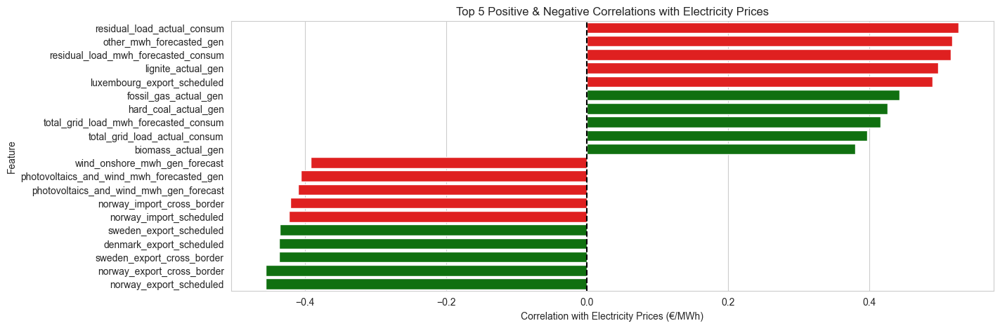

residual_load_actual_consum                  0.526503
other_mwh_forecasted_gen                     0.517610
residual_load_mwh_forecasted_consum          0.515833
lignite_actual_gen                           0.497448
luxembourg_export_scheduled                  0.489917
fossil_gas_actual_gen                        0.442908
hard_coal_actual_gen                         0.425687
total_grid_load_mwh_forecasted_consum        0.415816
total_grid_load_actual_consum                0.396558
biomass_actual_gen                           0.379789
wind_onshore_mwh_gen_forecast               -0.391986
photovoltaics_and_wind_mwh_forecasted_gen   -0.405569
photovoltaics_and_wind_mwh_gen_forecast     -0.409672
norway_import_cross_border                  -0.420519
norway_import_scheduled                     -0.422694
sweden_export_scheduled                     -0.435279
denmark_export_scheduled                    -0.436317
sweden_export_cross_border                  -0.436375
norway_export_cross_border  

In [ ]:
#  Combine results
top_features = pd.concat([top_negative, top_positive])

# Plot
plt.figure(figsize=(14, 5))
sns.barplot(x=top_features.values, y=top_features.index, palette=['red']*5 + ['green']*5)

plt.axvline(x=0, color='black', linestyle='dashed')
plt.xlabel("Correlation with Electricity Prices (€/MWh)")
plt.ylabel("Feature")
plt.title("Top 5 Positive & Negative Correlations with Electricity Prices")
plt.show()

top_features

In [ ]:
price_corr.T

,hour_of_day,week_of_year,hydro_pumped_storage_actual_consum,residual_load_actual_consum,total_grid_load_actual_consum,residual_load_mwh_forecasted_consum,total_grid_load_mwh_forecasted_consum,biomass_actual_gen,fossil_gas_actual_gen,hard_coal_actual_gen,...,hydropower_mw_installed_gen,wind_offshore_mw_installed_gen,wind_onshore_mw_installed_gen,photovoltaics_mw_installed_gen,other_renewable_mw_installed_gen,lignite_mw_installed_gen,hard_coal_mw_installed_gen,fossil_gas_mw_installed_gen,hydro_pumped_storage_mw_installed_gen,other_conventional_mw_installed_gen
procured_price_down_autofreq_€/mwh,-0.194391,0.657055,0.291925,-0.259614,-0.359672,-0.231807,-0.157050,-0.110614,-0.405778,-0.169776,...,-0.661897,-0.732133,-0.804190,-0.908277,0.359211,0.316998,0.608505,-0.997750,-0.554416,-0.473158
procured_price_up_autofreq_€/mwh,0.176384,0.097991,0.009582,0.132898,0.085141,0.169891,0.163044,0.118545,0.034585,0.107576,...,-0.661897,-0.732133,-0.804190,-0.908277,0.359211,0.316998,0.608505,-0.997750,-0.554416,-0.473158
procurement_price_down_manualfreq_€/mwh,-0.091222,0.463755,0.307861,-0.204359,-0.234553,-0.167950,-0.071704,-0.076497,-0.311614,-0.141104,...,-0.661897,-0.732133,-0.804190,-0.908277,0.359211,0.316998,0.608505,-0.997750,-0.554416,-0.473158
procurement_price_up_manualfreq_€/mwh,0.214853,0.032872,-0.034654,0.199587,0.158117,0.232104,0.235442,0.245038,0.094962,0.246808,...,-0.661897,-0.732133,-0.804190,-0.908277,0.359211,0.316998,0.608505,-0.997750,-0.554416,-0.473158
germany/luxembourg_€/mwh,0.689798,0.072923,-0.294513,0.924301,0.650544,0.938136,0.652204,0.518058,0.762108,0.622607,...,0.841092,0.890025,0.935709,0.987904,-0.091343,-0.563416,-0.801696,0.978270,0.306686,0.695290
∅_de/lu_neighbours_€/mwh,0.667519,-0.005574,-0.334190,0.910192,0.695842,0.910935,0.686717,0.584417,0.798937,0.696540,...,0.941874,0.970251,0.991345,0.997324,0.136965,-0.736162,-0.916401,0.905721,0.082748,0.840221
belgium_€/mwh,0.695188,0.030684,-0.303018,0.910344,0.695699,0.912039,0.687288,0.570091,0.779634,0.685469,...,0.995401,0.999998,0.993392,0.949279,0.374713,-0.879148,-0.986400,0.774793,-0.163116,0.947198
denmark_1_€/mwh,0.637767,0.039761,-0.275973,0.877851,0.575055,0.911142,0.585897,0.476339,0.723240,0.601472,...,-0.309946,-0.215334,-0.103982,0.100495,-0.986436,0.656311,0.374917,0.448614,0.998469,-0.518940
denmark_2_€/mwh,0.602919,-0.005696,-0.272776,0.835164,0.544389,0.877942,0.549413,0.420045,0.711788,0.559454,...,-0.301973,-0.207149,-0.095649,0.108824,-0.985027,0.649970,0.367140,0.456083,0.998897,-0.511763
france_€/mwh,0.667882,0.036606,-0.280506,0.872790,0.687746,0.870205,0.683189,0.583550,0.763011,0.720661,...,0.981488,0.958011,0.919622,0.820499,0.623132,-0.978431,-0.992378,0.562770,-0.437217,0.999287


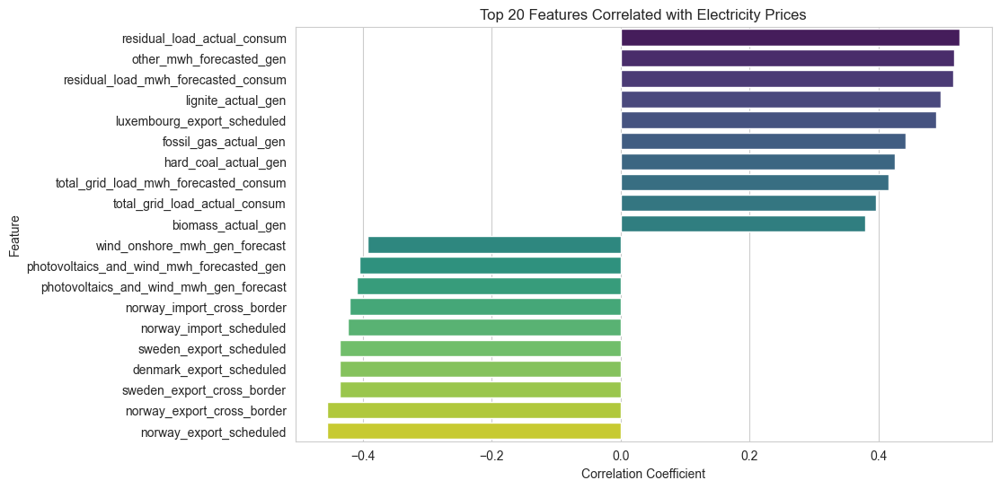

In [ ]:
# Select top 20 correlated features
# top_features = top_features.abs().sort_values(ascending=False)[0:20]

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=top_features.values, y=top_features.index, palette="viridis")
plt.xlabel("Correlation Coefficient")
plt.ylabel("Feature")
plt.title("Top 20 Features Correlated with Electricity Prices")
plt.show()


In [ ]:
# Get the top 5 positive and top 5 negative correlations
top_positive = avg_price_correlation.tail(10).index.tolist()  # 5 highest correlations
top_negative = avg_price_correlation.head(10).index.tolist()  # 5 lowest (most negative) correlations

# Combine selected columns
selected_columns = top_negative + top_positive
print("Selected Columns:", selected_columns)

# Filter the original dataframe
df_selected = df_optimize_merged[selected_columns]

df_selected.info()

Selected Columns: ['residual_load_actual_consum', 'other_mwh_forecasted_gen', 'residual_load_mwh_forecasted_consum', 'lignite_actual_gen', 'luxembourg_export_scheduled', 'fossil_gas_actual_gen', 'hard_coal_actual_gen', 'total_grid_load_mwh_forecasted_consum', 'total_grid_load_actual_consum', 'biomass_actual_gen', 'wind_onshore_mwh_gen_forecast', 'photovoltaics_and_wind_mwh_forecasted_gen', 'photovoltaics_and_wind_mwh_gen_forecast', 'norway_import_cross_border', 'norway_import_scheduled', 'sweden_export_scheduled', 'denmark_export_scheduled', 'sweden_export_cross_border', 'norway_export_cross_border', 'norway_export_scheduled']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 841648 entries, 0 to 841647
Data columns (total 20 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   residual_load_actual_consum                841648 non-null  float32
 1   other_mwh_forecasted_gen      

In [ ]:
# df_optimize_merged[top_features]
top_features

residual_load_actual_consum                  0.526503
other_mwh_forecasted_gen                     0.517610
residual_load_mwh_forecasted_consum          0.515833
lignite_actual_gen                           0.497448
luxembourg_export_scheduled                  0.489917
fossil_gas_actual_gen                        0.442908
hard_coal_actual_gen                         0.425687
total_grid_load_mwh_forecasted_consum        0.415816
total_grid_load_actual_consum                0.396558
biomass_actual_gen                           0.379789
wind_onshore_mwh_gen_forecast               -0.391986
photovoltaics_and_wind_mwh_forecasted_gen   -0.405569
photovoltaics_and_wind_mwh_gen_forecast     -0.409672
norway_import_cross_border                  -0.420519
norway_import_scheduled                     -0.422694
sweden_export_scheduled                     -0.435279
denmark_export_scheduled                    -0.436317
sweden_export_cross_border                  -0.436375
norway_export_cross_border  

In [ ]:
# df_optimize_merged.columns.tolist()

In [ ]:
# def analyze_feature_correlation(df, feature):
#     """
#     Analyze the correlation of a feature with electricity prices using:
#     1. Comparison with actual generation
#     2. Seasonality check
#     3. Cross-check with renewable generation
    
#     Parameters:
#         df (DataFrame): Merged dataset
#         feature (str): Feature to analyze
    
#     Returns:
#         None (Displays plots and correlation results)
#     """
    
#     print(f"\n--- Analyzing Feature: {feature} ---\n")
    
#     # Identify price columns dynamically
#     price_columns = [col for col in df.columns if col.endswith('_€/mwh')]
    
#     # Compute correlation with each country's electricity price
#     for price_col in price_columns:
#         correlation = df[[feature, price_col]].corr().iloc[0, 1]
#         print(f"Correlation with {price_col}: {correlation:.3f}")
    
#     ## 1. Compare with actual generation ##
#     actual_gen_features = ['lignite_actual_gen', 'fossil_gas_actual_gen', 'hard_coal_actual_gen']
#     print("\n**Correlation with Actual Generation Features:**")
#     for gen_feature in actual_gen_features:
#         if gen_feature in df.columns:
#             gen_corr = df[[gen_feature, feature]].corr().iloc[0, 1]
#             print(f"  {gen_feature}: {gen_corr:.3f}")
    
#     ## 2. Seasonality Check ##
#     df['month'] = pd.to_datetime(df['date']).dt.month
#     df['season'] = df['month'].map({
#         12: 'Winter', 1: 'Winter', 2: 'Winter',
#         3: 'Spring', 4: 'Spring', 5: 'Spring',
#         6: 'Summer', 7: 'Summer', 8: 'Summer',
#         9: 'Autumn', 10: 'Autumn', 11: 'Autumn'
#     })

#     print("\n**Seasonal Correlations:**")
#     for season in ['Winter', 'Spring', 'Summer', 'Autumn']:
#         season_corr = df[df['season'] == season][[feature]].corr().iloc[0, 0]
#         print(f"  {season}: {season_corr:.3f}")
    
#     ## 3. Cross-check with Renewable Generation ##
#     renewables = ['photovoltaics_actual_gen', 'wind_onshore_actual_gen', 'wind_offshore_actual_gen']
#     print("\n**Correlation with Renewable Generation Features:**")
#     for ren_feature in renewables:
#         if ren_feature in df.columns:
#             ren_corr = df[[ren_feature, feature]].corr().iloc[0, 1]
#             print(f"  {ren_feature}: {ren_corr:.3f}")
            
#     # Scatterplots for each price column
#     for price_col in price_columns:
#         plt.figure(figsize=(14, 5))
#         sns.scatterplot(x=df[feature], y=df[price_col], alpha=0.5)
#         plt.title(f"{feature} vs {price_col}")
#         plt.xlabel(feature)
#         plt.ylabel(price_col)
#         plt.show()
    
#     # Boxplot to visualize seasonality
#     plt.figure(figsize=(14, 5))
#     sns.boxplot(x=df['season'], y=df[feature])
#     plt.title(f"Seasonality of {feature}")
#     plt.xlabel("Season")
#     plt.ylabel(feature)
#     plt.show()        

# Get the top 5 features most correlated with at least one price column
# price_columns = [col for col in df_optimize_clean.columns if col.endswith('_€/mwh')]
# correlation_matrix = df_optimize_clean[price_columns].corr()
# top_5_features = correlation_matrix.abs().mean(axis=1).sort_values(ascending=False)[0:5].index

# print("Analyzing Top 5 Price-correlated Features....")
# # Run the function on each of the top 5 features
# for feature in top_5_features:
#     analyze_feature_correlation(df_optimize_clean, feature)
# top_5_features

Index(['hard_coal_mw_installed_gen', 'hydropower_mw_installed_gen',
       'wind_offshore_mw_installed_gen', 'other_conventional_mw_installed_gen',
       'biomass_mw_installed_gen'],
      dtype='object')

In [ ]:
# def analyze_feature_correlation(df, feature, target='day_ahead_price_€/MWh'):
#     """
#     Analyze the correlation of a feature with electricity prices using:
#     1. Comparison with actual generation
#     2. Seasonality check (including printed correlations)
#     3. Cross-check with renewable generation

#     Parameters:
#         df (DataFrame): Merged dataset
#         feature (str): Feature to analyze
#         target (str): Electricity price column (default: 'day_ahead_price_€/MWh')

#     Returns:
#         None (Displays plots and correlation results)
#     """
    
#     print(f"\n--- Analyzing Feature: {feature} ---\n")
    
#     # Compute overall correlation
#     correlation = df[[feature, target]].corr().iloc[0, 1]
#     print(f"Overall Correlation with {target}: {correlation:.3f}\n")
    
#     ## 1. Compare with actual generation ##
#     actual_gen_features = ['lignite_actual_gen', 'fossil_gas_actual_gen', 'hard_coal_actual_gen']
#     print("\n**Correlation with Actual Generation Features:**")
#     for gen_feature in actual_gen_features:
#         if gen_feature in df.columns:
#             gen_corr = df[[gen_feature, target]].corr().iloc[0, 1]
#             print(f"  {gen_feature}: {gen_corr:.3f}")
    
#     ## 2. Seasonality Check ##
#     df['season'] = df['month_freq_containm'].map({
#         12: 'Winter', 1: 'Winter', 2: 'Winter',
#         3: 'Spring', 4: 'Spring', 5: 'Spring',
#         6: 'Summer', 7: 'Summer', 8: 'Summer',
#         9: 'Autumn', 10: 'Autumn', 11: 'Autumn'
#     })

#     print("\n**Seasonal Correlations:**")
#     for season in ['Winter', 'Spring', 'Summer', 'Autumn']:
#         season_corr = df[df['season'] == season][[feature, target]].corr().iloc[0, 1]
#         print(f"  {season}: {season_corr:.3f}")
    
#     ## 3. Cross-check with Renewable Generation ##
#     renewables = ['photovoltaics_actual_gen', 'wind_onshore_actual_gen', 'wind_offshore_actual_gen']
#     print("\n**Correlation with Renewable Generation Features:**")
#     for ren_feature in renewables:
#         if ren_feature in df.columns:
#             ren_corr = df[[ren_feature, target]].corr().iloc[0, 1]
#             print(f"  {ren_feature}: {ren_corr:.3f}")
            
#         # Scatterplot of feature vs price
#     plt.figure(figsize=(14, 5))
#     sns.scatterplot(x=df[feature], y=df[target], alpha=0.5)
#     plt.title(f"{feature} vs {target} (Correlation: {correlation:.3f})")
#     plt.xlabel(feature)
#     plt.ylabel(target)
#     plt.show()
    
#     # Boxplot to visualize seasonality
#     plt.figure(figsize=(14, 5))
#     sns.boxplot(x=df['season'], y=df[feature])
#     plt.title(f"Seasonality of {feature}")
#     plt.xlabel("Season")
#     plt.ylabel(feature)
#     plt.show()        

# # Get the top 10 features most correlated with electricity prices
# top_5_features = correlation_matrix['day_ahead_price_€/MWh'].abs().sort_values(ascending=False)[1:6].index

# print("Analyzing Top 5 Price-correlated Features....")
# # Run the function on each of the top 10 features
# for feature in top_5_features:
#     analyze_feature_correlation(df_merged, feature)
    

In [ ]:
datasets.keys()

dict_keys(['df_actual_consum_quarterhourly', 'df_actual_gen_quarterhourly', 'df_auto_freq_restore_quarterhourly', 'df_balancing_energy_monthly', 'df_tso_costs_monthly', 'df_cross_border_quarterhourly', 'df_day_ahead_price_hourly', 'df_forecasted_consum_quarterhourly', 'df_forecasted_gen_quarterhourly', 'df_freq_containm_quarterhourly', 'df_gen_forecast_quarterhourly', 'df_imported_balancing_quarterhourly', 'df_installed_gen_yearly', 'df_manual_freq_quarterhourly', 'df_scheduled_exchanges_quarterhourly', 'df_exported_balancing_quarterhourly'])

In [ ]:
df_merged['month_freq_containm'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 20., 11., 12.])

### 2.2 How do electricity prices correlate between different countries?

**Approach**

1. Calculate the correlation matrix of day-ahead electricity prices across different countries.
2. Visualize the correlation matrix using a heatmap to identify patterns.
3. Highlight strong correlations (e.g., >0.7) and weak correlations (e.g., <0.3).
4. Investigate cross-border factors that might influence price relationships.


In [ ]:
df_merged.columns.tolist()

['start_date',
 'end_date',
 'region_type',
 'region_name',
 'day_ahead_price_€/MWh',
 'hour_of_day',
 'date',
 'week_of_year',
 'hydro_pumped_storage_actual_consum',
 'residual_load_actual_consum',
 'total_grid_load_actual_consum',
 'residual_load_mwh_forecasted_consum',
 'total_grid_load_mwh_forecasted_consum',
 'biomass_actual_gen',
 'fossil_gas_actual_gen',
 'hard_coal_actual_gen',
 'hydro_pumped_storage_actual_gen',
 'hydropower_actual_gen',
 'lignite_actual_gen',
 'nuclear_actual_gen',
 'other_conventional_actual_gen',
 'other_renewable_actual_gen',
 'photovoltaics_actual_gen',
 'wind_offshore_actual_gen',
 'wind_onshore_actual_gen',
 'other_mwh_forecasted_gen',
 'photovoltaics_and_wind_mwh_forecasted_gen',
 'photovoltaics_mwh_forecasted_gen',
 'total_mwh_forecasted_gen',
 'wind_offshore_mwh_forecasted_gen',
 'wind_onshore_mwh_forecasted_gen',
 'austria_export_cross_border',
 'austria_import_cross_border',
 'belgium_export_cross_border',
 'belgium_import_cross_border',
 'czech_re

In [ ]:
df_merged[['start_date','end_date','region_name', 'region_type','day_ahead_price_€/MWh']].sample(2)

,start_date,end_date,region_name,region_type,day_ahead_price_€/MWh
285166,2025-02-04 22:00:00,2025-02-04 23:00:00,slovenia,country,132.02
45898,2023-11-21 10:00:00,2023-11-21 11:00:00,belgium,country,135.00


In [ ]:
df_merged[df_merged['region_type'] == 'country'].head(2)

,start_date,end_date,region_type,region_name,day_ahead_price_€/MWh,hour_of_day,date,week_of_year,hydro_pumped_storage_actual_consum,residual_load_actual_consum,...,austria_imported_bal_mwh,austria_exported_bal_mwh,month_freq_containm,procurement_price_€/mw_freq_containm,volume_procured_mw_freq_containm,year_freq_containm,photovoltaics_and_wind_mwh_gen_forecast,photovoltaics_mwh_gen_forecast,wind_offshore_mwh_gen_forecast,wind_onshore_mwh_gen_forecast
38112,2023-01-01 00:00:00,2023-01-01 01:00:00,country,belgium,-4.39,0,2023-01-01,52,494.0,1842.5,...,0.25,57.5,1.0,8.71,0.0,2023.0,8419.50,0.0,608.75,7810.75
38113,2023-01-01 01:00:00,2023-01-01 02:00:00,country,belgium,-1.75,1,2023-01-01,52,301.0,1325.5,...,0.00,10.5,1.0,8.71,0.0,2023.0,7748.25,0.0,535.25,7213.00


In [ ]:
# Ensure unique prices per country and timestamp using mean
df_region_grouped = df_merged.groupby(["start_date", "region_name"], as_index=False).agg({"day_ahead_price_€/MWh": "mean"})

# Pivot to wide format (countries as columns, timestamps as index)
df_region_pivot = df_region_grouped.pivot(index="start_date", columns="region_name", values="day_ahead_price_€/MWh")

df_region_pivot.head(2)

region_name,austria,belgium,czech_republic,denmark_1,denmark_2,france,germany/luxembourg,hungary,netherlands,northern_italy,norway_2,poland,slovenia,sweden_4,switzerland,∅_de/lu_neighbours
start_date,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,12.06,-4.39,4.84,2.01,2.01,0.0,-5.17,19.76,-3.61,195.90,119.32,18.09,13.31,2.01,0.03,13.85
2023-01-01 01:00:00,-0.10,-1.75,-0.35,1.38,1.38,-0.1,-1.07,0.19,-1.46,191.09,108.83,5.75,-0.07,1.38,-7.25,9.79


<Axes: title={'center': 'Daily Avg Electricity Prices per Regions'}, xlabel='start_date'>

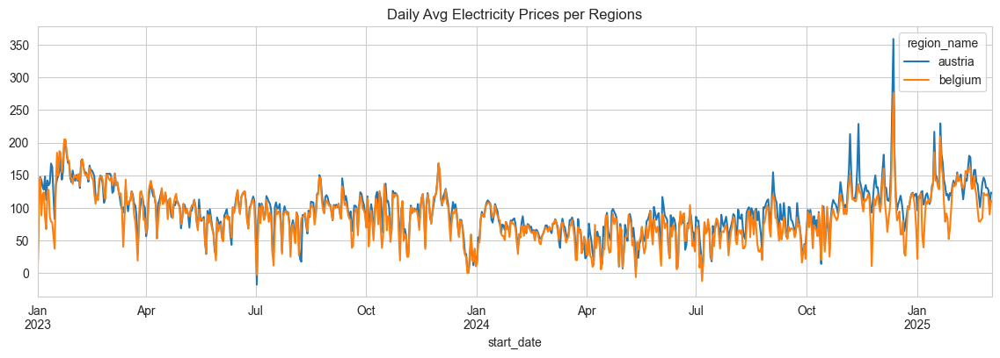

In [ ]:
df_region_pivot[['austria','belgium']].resample("D").mean().plot(figsize=(14,4), title="Daily Avg Electricity Prices per Regions")


/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



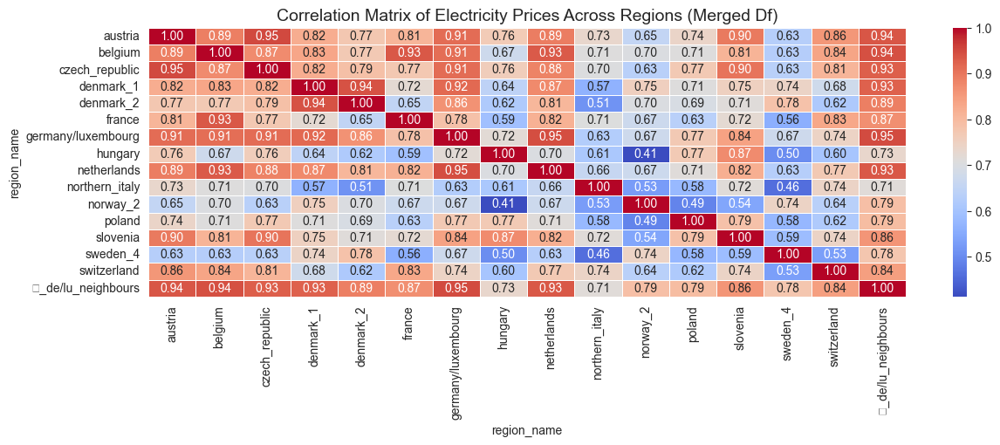

Correlation Matrix of Electricity Prices Across Regions(Merged Df)


region_name,austria,belgium,czech_republic,denmark_1,denmark_2,france,germany/luxembourg,hungary,netherlands,northern_italy,norway_2,poland,slovenia,sweden_4,switzerland,∅_de/lu_neighbours
region_name,,,,,,,,,,,,,,,,
austria,1.000000,0.889379,0.951232,0.821605,0.774970,0.807828,0.911751,0.764325,0.890239,0.732001,0.651919,0.739829,0.895088,0.628759,0.857375,0.935828
belgium,0.889379,1.000000,0.873240,0.834521,0.768778,0.934095,0.910100,0.672535,0.932996,0.706637,0.700356,0.706575,0.809663,0.627446,0.836931,0.944445
czech_republic,0.951232,0.873240,1.000000,0.822054,0.788043,0.772841,0.912762,0.757174,0.883676,0.703536,0.633870,0.770020,0.902557,0.634707,0.807340,0.928700
denmark_1,0.821605,0.834521,0.822054,1.000000,0.941304,0.722906,0.916312,0.642291,0.873893,0.565742,0.754226,0.707003,0.750980,0.741126,0.675249,0.926298
denmark_2,0.774970,0.768778,0.788043,0.941304,1.000000,0.650443,0.863246,0.617382,0.805120,0.512411,0.700612,0.694058,0.712158,0.783051,0.615612,0.889409
france,0.807828,0.934095,0.772841,0.722906,0.650443,1.000000,0.784889,0.593258,0.815990,0.705555,0.671483,0.633244,0.724070,0.557879,0.832483,0.868977
germany/luxembourg,0.911751,0.910100,0.912762,0.916312,0.863246,0.784889,1.000000,0.719156,0.946904,0.625501,0.673585,0.768376,0.840812,0.672613,0.744260,0.947580
hungary,0.764325,0.672535,0.757174,0.642291,0.617382,0.593258,0.719156,1.000000,0.699923,0.611525,0.412809,0.766716,0.873125,0.503640,0.603977,0.731753
netherlands,0.890239,0.932996,0.883676,0.873893,0.805120,0.815990,0.946904,0.699923,1.000000,0.658509,0.671390,0.712226,0.820695,0.630491,0.769876,0.934432


In [ ]:
price_region_corr_matrix = df_region_pivot.corr()

# Set figure size for better visibility
plt.figure(figsize=(14, 4))

# Create a heatmap
sns.heatmap(price_region_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add title
plt.title("Correlation Matrix of Electricity Prices Across Regions (Merged Df)", fontsize=14)

# Show the plot
plt.show()

print("Correlation Matrix of Electricity Prices Across Regions(Merged Df)")

price_region_corr_matrix

In [ ]:
# Filter only country-level prices
df_countries = df_merged[df_merged['region_type'] == 'country'].copy()

# Select relevant columns
df_countries = df_countries[['start_date', 'region_name', 'day_ahead_price_€/MWh']]

# Ensure unique prices per country and timestamp using mean (in case of duplicates)
df_country_grouped = df_countries.groupby(["start_date", "region_name"], as_index=False).agg({"day_ahead_price_€/MWh": "mean"})

# Pivot to wide format (countries as columns, timestamps as index)
df_country_pivot = df_country_grouped.pivot(index="start_date", columns="region_name", values="day_ahead_price_€/MWh")

# Reset index for clarity
df_country_pivot.reset_index(inplace=True)

# Display the transformed dataframe
df_country_pivot.head(2)


region_name,start_date,austria,belgium,czech_republic,france,hungary,netherlands,poland,slovenia,switzerland
0,2023-01-01 00:00:00,12.06,-4.39,4.84,0.0,19.76,-3.61,18.09,13.31,0.03
1,2023-01-01 01:00:00,-0.10,-1.75,-0.35,-0.1,0.19,-1.46,5.75,-0.07,-7.25


In [ ]:
# df_country_pivot.info()

In [ ]:
import re

# Identify all cross-border columns
cross_border_columns = [col for col in df_merged.columns if '_export_cross_border' in col or '_import_cross_border' in col]

# Extract potential country names
extracted_countries = set(re.sub(r'(_export_cross_border|_import_cross_border)', '', col) for col in cross_border_columns)

print("Potential countries in dataset:", extracted_countries)


Potential countries in dataset: {'netherlands', 'denmark', 'switzerland', 'belgium', 'austria', 'sweden', 'czech_republic', 'norway', 'france', 'luxembourg', 'poland'}


In [ ]:
df_day_ahead_price_hourly.sample(4)

,start_date,end_date,region_type,region_name,day_ahead_price_€/MWh,hour_of_day,date,week_of_year
137528,2023-06-22 09:00:00,2023-06-22 10:00:00,NaN,norway_2,125.80,9,2023-06-22,25
172349,2023-02-05 05:00:00,2023-02-05 06:00:00,country,poland,114.02,5,2023-02-05,5
184053,2024-06-06 22:00:00,2024-06-06 23:00:00,country,poland,133.67,22,2024-06-06,23
152877,2023-01-18 21:00:00,2023-01-18 22:00:00,country,austria,134.75,21,2023-01-18,3


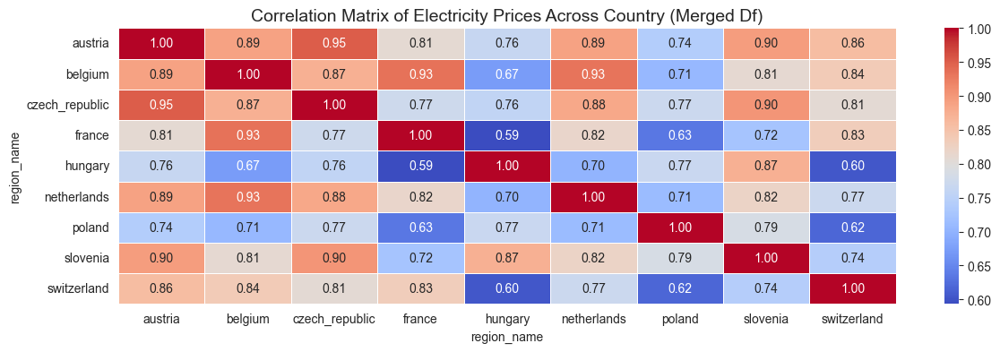

region_name,austria,belgium,czech_republic,france,hungary,netherlands,poland,slovenia,switzerland
region_name,,,,,,,,,
austria,1.000000,0.889379,0.951232,0.807828,0.764325,0.890239,0.739829,0.895088,0.857375
belgium,0.889379,1.000000,0.873240,0.934095,0.672535,0.932996,0.706575,0.809663,0.836931
czech_republic,0.951232,0.873240,1.000000,0.772841,0.757174,0.883676,0.770020,0.902557,0.807340
france,0.807828,0.934095,0.772841,1.000000,0.593258,0.815990,0.633244,0.724070,0.832483
hungary,0.764325,0.672535,0.757174,0.593258,1.000000,0.699923,0.766716,0.873125,0.603977
netherlands,0.890239,0.932996,0.883676,0.815990,0.699923,1.000000,0.712226,0.820695,0.769876
poland,0.739829,0.706575,0.770020,0.633244,0.766716,0.712226,1.000000,0.786481,0.617131
slovenia,0.895088,0.809663,0.902557,0.724070,0.873125,0.820695,0.786481,1.000000,0.741544
switzerland,0.857375,0.836931,0.807340,0.832483,0.603977,0.769876,0.617131,0.741544,1.000000


In [ ]:


price_country_corr_matrix = df_country_pivot.drop(columns=['start_date']).corr()

# Set figure size for better visibility
plt.figure(figsize=(14, 4))

# Create a heatmap
sns.heatmap(price_country_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add title
plt.title("Correlation Matrix of Electricity Prices Across Country (Merged Df)", fontsize=14)

# Show the plot
plt.show()

price_country_corr_matrix


In [ ]:
# # Load datasets into variables
# actual_consum_df = cleaned_dfs['Actual_consumption_202301010000_202503050000_Quarterhour.csv']
# actual_gen_df = cleaned_dfs['Actual_generation_202301010000_202503050000_Quarterhour.csv']
# forecast_consum_df = cleaned_dfs['Forecasted_consumption_202301010000_202503050000_Quarterhour.csv']
# forecast_gen_df = cleaned_dfs['Forecasted_generation_Day-Ahead_202301010000_202503050000_Hour_Quarterhour.csv']
# price_df = cleaned_dfs['Day-ahead_prices_202301010000_202503050000_Hour.csv']
# cross_border_df = cleaned_dfs['Cross-border_physical_flows_202301010000_202503050000_Quarterhour.csv']
# scheduled_exchanges_df = cleaned_dfs['Scheduled_commercial_exchanges_202301010000_202503050000_Quarterhour.csv']
# balancing_df = cleaned_dfs['Balancing_energy_202301010000_202503050000_Quarterhour_Month.csv']


In [ ]:
price_df = cleaned_dfs['Day-ahead_prices_202301010000_202503050000_Hour.csv']
price_df.head(2)

,start_date,end_date,germany/luxembourg_€/mwh,∅_de/lu_neighbours_€/mwh,belgium_€/mwh,denmark_1_€/mwh,denmark_2_€/mwh,france_€/mwh,netherlands_€/mwh,norway_2_€/mwh,austria_€/mwh,poland_€/mwh,sweden_4_€/mwh,switzerland_€/mwh,czech_republic_€/mwh,de/at/lu_€/mwh,northern_italy_€/mwh,slovenia_€/mwh,hungary_€/mwh,hour_of_day
0,2023-01-01 00:00:00,2023-01-01 01:00:00,-5.17,13.85,-4.39,2.01,2.01,0.0,-3.61,119.32,12.06,18.09,2.01,0.03,4.84,NaN,195.90,13.31,19.76,0
1,2023-01-01 01:00:00,2023-01-01 02:00:00,-1.07,9.79,-1.75,1.38,1.38,-0.1,-1.46,108.83,-0.10,5.75,1.38,-7.25,-0.35,NaN,191.09,-0.07,0.19,1


/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



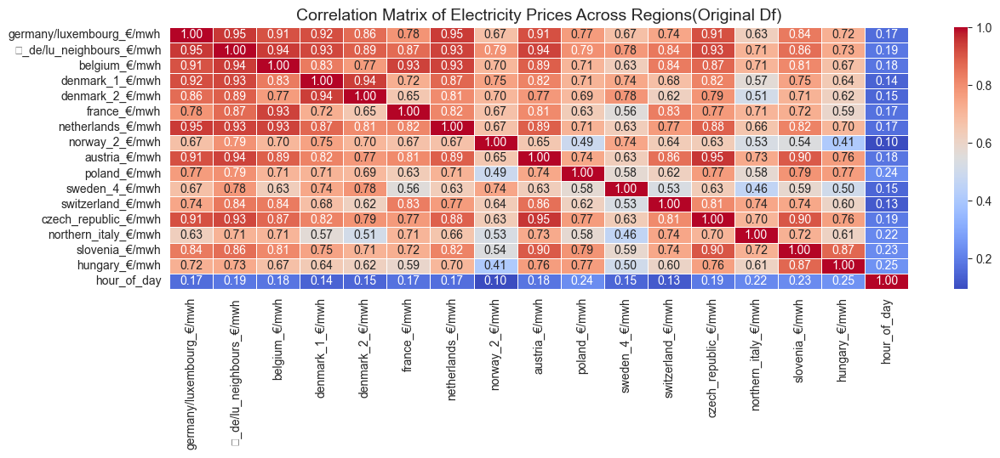

Correlation Matrix of Electricity Prices Across Regions(Original Df):


,germany/luxembourg_€/mwh,∅_de/lu_neighbours_€/mwh,belgium_€/mwh,denmark_1_€/mwh,denmark_2_€/mwh,france_€/mwh,netherlands_€/mwh,norway_2_€/mwh,austria_€/mwh,poland_€/mwh,sweden_4_€/mwh,switzerland_€/mwh,czech_republic_€/mwh,northern_italy_€/mwh,slovenia_€/mwh,hungary_€/mwh,hour_of_day
germany/luxembourg_€/mwh,1.000000,0.947588,0.910114,0.916323,0.863247,0.784921,0.946912,0.673607,0.911766,0.768401,0.672600,0.744303,0.912776,0.625463,0.840837,0.719190,0.166178
∅_de/lu_neighbours_€/mwh,0.947588,1.000000,0.944453,0.926304,0.889404,0.868993,0.934442,0.789049,0.935839,0.793690,0.776106,0.844494,0.928712,0.713872,0.859810,0.731787,0.187206
belgium_€/mwh,0.910114,0.944453,1.000000,0.834544,0.768787,0.934105,0.933008,0.700374,0.889398,0.706609,0.627433,0.836958,0.873261,0.706582,0.809693,0.672575,0.182934
denmark_1_€/mwh,0.916323,0.926304,0.834544,1.000000,0.941302,0.722944,0.873910,0.754236,0.821629,0.707030,0.741099,0.675293,0.822078,0.565709,0.751012,0.642329,0.142856
denmark_2_€/mwh,0.863247,0.889404,0.768787,0.941302,1.000000,0.650469,0.805126,0.700623,0.774978,0.694069,0.783027,0.615633,0.788049,0.512396,0.712173,0.617405,0.149047
france_€/mwh,0.784921,0.868993,0.934105,0.722944,0.650469,1.000000,0.816018,0.671501,0.807856,0.633283,0.557870,0.832502,0.772875,0.705506,0.724108,0.593304,0.173667
netherlands_€/mwh,0.946912,0.934442,0.933008,0.873910,0.805126,0.816018,1.000000,0.671413,0.890258,0.712260,0.630481,0.769916,0.883695,0.658464,0.820724,0.699959,0.169226
norway_2_€/mwh,0.673607,0.789049,0.700374,0.754236,0.700623,0.671501,0.671413,1.000000,0.651947,0.489828,0.744597,0.635214,0.633900,0.527329,0.543425,0.412859,0.095878
austria_€/mwh,0.911766,0.935839,0.889398,0.821629,0.774978,0.807856,0.890258,0.651947,1.000000,0.739861,0.628756,0.857401,0.951241,0.731951,0.895105,0.764354,0.180691
poland_€/mwh,0.768401,0.793690,0.706609,0.707030,0.694069,0.633283,0.712260,0.489828,0.739861,1.000000,0.575336,0.617189,0.770047,0.578446,0.786507,0.766740,0.235789


In [ ]:
# price_df_corr_matrix = price_df.select_dtypes(exclude='object').corr
price_df_corr_matrix = price_df.drop(columns=["start_date","end_date","de/at/lu_€/mwh"]).corr()

# Set figure size for better visibility
plt.figure(figsize=(14, 4))

# Create a heatmap
sns.heatmap(price_df_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add title
plt.title("Correlation Matrix of Electricity Prices Across Regions(Original Df)", fontsize=14)

# Show the plot
plt.show()

print("Correlation Matrix of Electricity Prices Across Regions(Original Df):")
price_df_corr_matrix

In [ ]:
df_day_ahead_price_hourly.head(2)

,start_date,end_date,region_type,region_name,day_ahead_price_€/MWh,hour_of_day,date,week_of_year
0,2023-01-01 00:00:00,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,-5.17,0,2023-01-01,52
1,2023-01-01 01:00:00,2023-01-01 02:00:00,bidding_zone,germany/luxembourg,-1.07,1,2023-01-01,52


In [ ]:
df_merged[['start_date','end_date','region_type','region_name','day_ahead_price_€/MWh']].head(2)

,start_date,end_date,region_type,region_name,day_ahead_price_€/MWh
0,2023-01-01 00:00:00,2023-01-01 01:00:00,bidding_zone,germany/luxembourg,-5.17
1,2023-01-01 01:00:00,2023-01-01 02:00:00,bidding_zone,germany/luxembourg,-1.07


In [ ]:
price_df.head(2)

,start_date,end_date,germany/luxembourg_€/mwh,∅_de/lu_neighbours_€/mwh,belgium_€/mwh,denmark_1_€/mwh,denmark_2_€/mwh,france_€/mwh,netherlands_€/mwh,norway_2_€/mwh,austria_€/mwh,poland_€/mwh,sweden_4_€/mwh,switzerland_€/mwh,czech_republic_€/mwh,de/at/lu_€/mwh,northern_italy_€/mwh,slovenia_€/mwh,hungary_€/mwh,hour_of_day
0,2023-01-01 00:00:00,2023-01-01 01:00:00,-5.17,13.85,-4.39,2.01,2.01,0.0,-3.61,119.32,12.06,18.09,2.01,0.03,4.84,NaN,195.90,13.31,19.76,0
1,2023-01-01 01:00:00,2023-01-01 02:00:00,-1.07,9.79,-1.75,1.38,1.38,-0.1,-1.46,108.83,-0.10,5.75,1.38,-7.25,-0.35,NaN,191.09,-0.07,0.19,1


In [ ]:
# Select key columns (adjust column names if needed)
# price_df = cleaned_dfs['Day-ahead_prices_202301010000_202503050000_Hour.csv']
# price_df["datetime"] = pd.to_datetime(price_df["start_date"])
# price_df.set_index("datetime", inplace=True)

# Aggregate prices for analysis
price_hourly = price_df.resample("H").mean()
price_daily = price_df.resample("D").mean()
price_weekly = price_df.resample("W").mean()


TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'

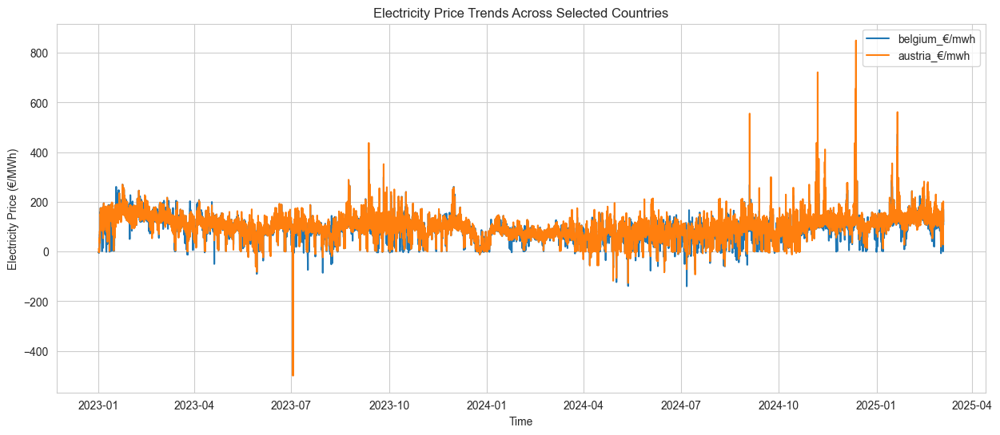


Summary Statistics of Electricity Prices (€/MWh):
       belgium_€/mwh  austria_€/mwh
count   19056.000000   19056.000000
mean       86.579974      95.326213
std        47.241271      49.015047
min      -140.000000    -500.000000
25%        60.000000      70.700000
50%        88.085000      94.890000
75%       114.690000     121.290000
max       565.460000     850.000000


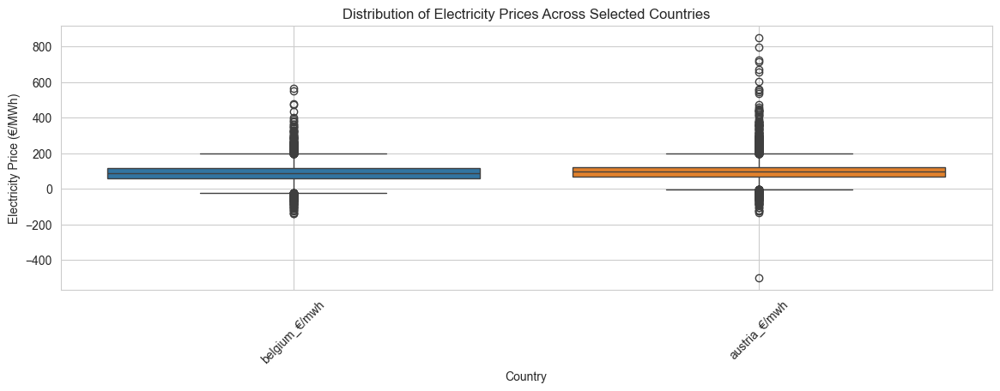

In [ ]:
# Select key countries for analysis
# selected_countries = [
#     "germany/luxembourg_€/mwh", "france_€/mwh", "netherlands_€/mwh", 
#     "belgium_€/mwh", "austria_€/mwh", "switzerland_€/mwh", "poland_€/mwh"
# ]

selected_countries = ["belgium_€/mwh", "austria_€/mwh", ]

# Plot time series of electricity prices
plt.figure(figsize=(15, 6))
for country in selected_countries:
    plt.plot(price_df.index, price_df[country], label=country)

plt.xlabel("Time")
plt.ylabel("Electricity price_eur_mwh")
plt.title("Electricity Price Trends Across Selected Countries")
plt.legend()
plt.grid(True)
plt.show()

# Compute summary statistics
price_summary = price_df[selected_countries].describe()
print("\nSummary Statistics of Electricity Prices (€/MWh):")
print(price_summary)

# Box plot for price distributions
plt.figure(figsize=(14, 4))
sns.boxplot(data=price_df[selected_countries])
plt.xticks(rotation=45)
plt.xlabel("Country")
plt.ylabel("Electricity price_eur_mwh")
plt.title("Distribution of Electricity Prices Across Selected Countries")
plt.grid(True)
plt.show()


/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



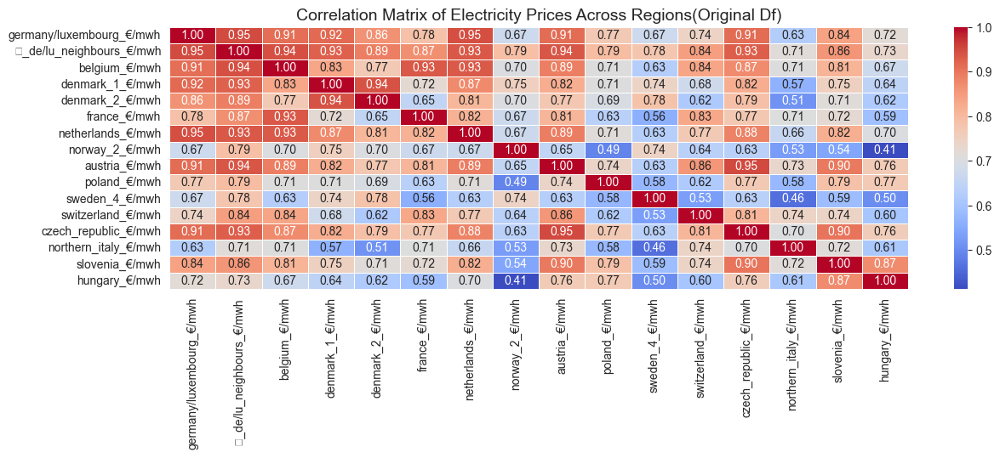

Correlation Matrix of Electricity Prices Across Regions(Original Df):


,germany/luxembourg_€/mwh,∅_de/lu_neighbours_€/mwh,belgium_€/mwh,denmark_1_€/mwh,denmark_2_€/mwh,france_€/mwh,netherlands_€/mwh,norway_2_€/mwh,austria_€/mwh,poland_€/mwh,sweden_4_€/mwh,switzerland_€/mwh,czech_republic_€/mwh,northern_italy_€/mwh,slovenia_€/mwh,hungary_€/mwh
germany/luxembourg_€/mwh,1.000000,0.947588,0.910114,0.916323,0.863247,0.784921,0.946912,0.673607,0.911766,0.768401,0.672600,0.744303,0.912776,0.625463,0.840837,0.719190
∅_de/lu_neighbours_€/mwh,0.947588,1.000000,0.944453,0.926304,0.889404,0.868993,0.934442,0.789049,0.935839,0.793690,0.776106,0.844494,0.928712,0.713872,0.859810,0.731787
belgium_€/mwh,0.910114,0.944453,1.000000,0.834544,0.768787,0.934105,0.933008,0.700374,0.889398,0.706609,0.627433,0.836958,0.873261,0.706582,0.809693,0.672575
denmark_1_€/mwh,0.916323,0.926304,0.834544,1.000000,0.941302,0.722944,0.873910,0.754236,0.821629,0.707030,0.741099,0.675293,0.822078,0.565709,0.751012,0.642329
denmark_2_€/mwh,0.863247,0.889404,0.768787,0.941302,1.000000,0.650469,0.805126,0.700623,0.774978,0.694069,0.783027,0.615633,0.788049,0.512396,0.712173,0.617405
france_€/mwh,0.784921,0.868993,0.934105,0.722944,0.650469,1.000000,0.816018,0.671501,0.807856,0.633283,0.557870,0.832502,0.772875,0.705506,0.724108,0.593304
netherlands_€/mwh,0.946912,0.934442,0.933008,0.873910,0.805126,0.816018,1.000000,0.671413,0.890258,0.712260,0.630481,0.769916,0.883695,0.658464,0.820724,0.699959
norway_2_€/mwh,0.673607,0.789049,0.700374,0.754236,0.700623,0.671501,0.671413,1.000000,0.651947,0.489828,0.744597,0.635214,0.633900,0.527329,0.543425,0.412859
austria_€/mwh,0.911766,0.935839,0.889398,0.821629,0.774978,0.807856,0.890258,0.651947,1.000000,0.739861,0.628756,0.857401,0.951241,0.731951,0.895105,0.764354
poland_€/mwh,0.768401,0.793690,0.706609,0.707030,0.694069,0.633283,0.712260,0.489828,0.739861,1.000000,0.575336,0.617189,0.770047,0.578446,0.786507,0.766740


In [ ]:
# price_df_corr_matrix = price_df.select_dtypes(exclude='object').corr
price_df_corr_matrix = price_df.drop(columns=["start_date","end_date","de/at/lu_€/mwh"]).corr()

# Set figure size for better visibility
plt.figure(figsize=(14, 4))

# Create a heatmap
sns.heatmap(price_df_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add title
plt.title("Correlation Matrix of Electricity Prices Across Regions(Original Df)", fontsize=14)

# Show the plot
plt.show()

print("Correlation Matrix of Electricity Prices Across Regions(Original Df):")
price_df_corr_matrix

In [ ]:
price_df.columns

Index(['start_date', 'end_date', 'germany/luxembourg_€/mwh',
       '∅_de/lu_neighbours_€/mwh', 'belgium_€/mwh', 'denmark_1_€/mwh',
       'denmark_2_€/mwh', 'france_€/mwh', 'netherlands_€/mwh',
       'norway_2_€/mwh', 'austria_€/mwh', 'poland_€/mwh', 'sweden_4_€/mwh',
       'switzerland_€/mwh', 'czech_republic_€/mwh', 'de/at/lu_€/mwh',
       'northern_italy_€/mwh', 'slovenia_€/mwh', 'hungary_€/mwh',
       'hour_of_day'],
      dtype='object')

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



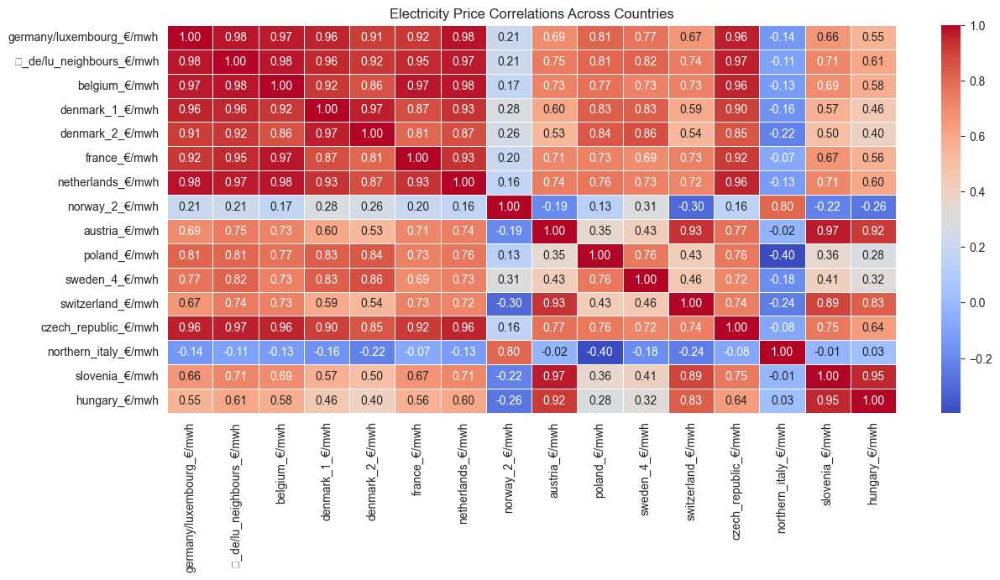

In [ ]:
# Select only price columns
price_cols = [
    'germany/luxembourg_€/mwh', '∅_de/lu_neighbours_€/mwh', 'belgium_€/mwh', 'denmark_1_€/mwh', 'denmark_2_€/mwh', 
    'france_€/mwh', 'netherlands_€/mwh', 'norway_2_€/mwh', 'austria_€/mwh', 'poland_€/mwh', 
    'sweden_4_€/mwh', 'switzerland_€/mwh', 'czech_republic_€/mwh', 'northern_italy_€/mwh', 'slovenia_€/mwh', 
    'hungary_€/mwh'
]

# Filter the dataframe to only price columns
df_prices = df_optimize_merged[price_cols]

# Compute the correlation matrix
price_corr_matrix = df_prices.corr()

# Plot the heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(price_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Electricity Price Correlations Across Countries")
plt.show()


In [ ]:
# Define groups
bidding_zone_cols = [
    'germany/luxembourg_€/mwh', 'denmark_1_€/mwh', 'denmark_2_€/mwh', 
    'northern_italy_€/mwh', 'sweden_4_€/mwh'
]

country_cols = [
    'france_€/mwh', 'netherlands_€/mwh', 'norway_2_€/mwh', 'austria_€/mwh', 
    'poland_€/mwh', 'switzerland_€/mwh', 'czech_republic_€/mwh', 
    'slovenia_€/mwh', 'hungary_€/mwh'
]

regional_cols = ['∅_de/lu_neighbours_€/mwh']

# Compute correlation matrices
cor_bidding_zones = df_optimize_merged[bidding_zone_cols].corr()
cor_countries = df_optimize_merged[country_cols].corr()
cor_regions = df_optimize_merged[regional_cols + bidding_zone_cols + country_cols].corr()

# Display top correlations
print("Bidding Zone Correlations:\n", cor_bidding_zones)
print("\nCountry-Level Price Correlations:\n", cor_countries)
print("\nRegional vs. Individual Market Correlations:\n", cor_regions)


Bidding Zone Correlations:
                           germany/luxembourg_€/mwh  denmark_1_€/mwh  \
germany/luxembourg_€/mwh                  1.000000         0.957451   
denmark_1_€/mwh                           0.957451         1.000000   
denmark_2_€/mwh                           0.911878         0.966893   
northern_italy_€/mwh                     -0.142428        -0.163924   
sweden_4_€/mwh                            0.765505         0.827047   

                          denmark_2_€/mwh  northern_italy_€/mwh  \
germany/luxembourg_€/mwh         0.911878             -0.142428   
denmark_1_€/mwh                  0.966893             -0.163924   
denmark_2_€/mwh                  1.000000             -0.218633   
northern_italy_€/mwh            -0.218633              1.000000   
sweden_4_€/mwh                   0.863898             -0.183660   

                          sweden_4_€/mwh  
germany/luxembourg_€/mwh        0.765505  
denmark_1_€/mwh                 0.827047  
denmark_2_€/m

In [ ]:
# df_optimize_merged.columns.tolist()

### 2.3 What is the relationship between forecasted vs. actual electricity generation and consumption?

In [ ]:
df_merged.columns.to_list()

['start_date',
 'end_date',
 'region_type',
 'region_name',
 'day_ahead_price_€/MWh',
 'hour_of_day',
 'date',
 'week_of_year',
 'hydro_pumped_storage_actual_consum',
 'residual_load_actual_consum',
 'total_grid_load_actual_consum',
 'residual_load_mwh_forecasted_consum',
 'total_grid_load_mwh_forecasted_consum',
 'biomass_actual_gen',
 'fossil_gas_actual_gen',
 'hard_coal_actual_gen',
 'hydro_pumped_storage_actual_gen',
 'hydropower_actual_gen',
 'lignite_actual_gen',
 'nuclear_actual_gen',
 'other_conventional_actual_gen',
 'other_renewable_actual_gen',
 'photovoltaics_actual_gen',
 'wind_offshore_actual_gen',
 'wind_onshore_actual_gen',
 'other_mwh_forecasted_gen',
 'photovoltaics_and_wind_mwh_forecasted_gen',
 'photovoltaics_mwh_forecasted_gen',
 'total_mwh_forecasted_gen',
 'wind_offshore_mwh_forecasted_gen',
 'wind_onshore_mwh_forecasted_gen',
 'austria_export_cross_border',
 'austria_import_cross_border',
 'belgium_export_cross_border',
 'belgium_import_cross_border',
 'czech_re

In [ ]:
# Selecting relevant columns
df_analysis = df_optimize_merged[[
    'date', 'region_name', 'start_date', 
    'total_grid_load_actual_consum', 'total_grid_load_mwh_forecasted_consum',  
    'total_mwh_forecasted_gen', 'biomass_actual_gen', 'fossil_gas_actual_gen', 
    'hard_coal_actual_gen', 'hydro_pumped_storage_actual_gen', 'hydropower_actual_gen', 
    'lignite_actual_gen', 'nuclear_actual_gen', 'other_conventional_actual_gen', 
    'other_renewable_actual_gen', 'photovoltaics_actual_gen', 'wind_offshore_actual_gen', 
    'wind_onshore_actual_gen'
]].copy()

df_analysis.head()


,date,region_name,start_date,total_grid_load_actual_consum,total_grid_load_mwh_forecasted_consum,total_mwh_forecasted_gen,biomass_actual_gen,fossil_gas_actual_gen,hard_coal_actual_gen,hydro_pumped_storage_actual_gen,hydropower_actual_gen,lignite_actual_gen,nuclear_actual_gen,other_conventional_actual_gen,other_renewable_actual_gen,photovoltaics_actual_gen,wind_offshore_actual_gen,wind_onshore_actual_gen
0,2023-01-01,germany/luxembourg,2023-01-01,9673.0,10652.25,56012.0,1006.25,453.75,517.0,31.75,319.75,962.75,615.25,307.25,32.25,0.5,684.25,7145.75
1,2023-01-01,germany/luxembourg,2023-01-01,9673.0,10652.25,56012.0,1006.25,453.75,517.0,31.75,319.75,962.75,615.25,307.25,32.25,0.5,684.25,7145.75
2,2023-01-01,germany/luxembourg,2023-01-01,9673.0,10652.25,56012.0,1006.25,453.75,517.0,31.75,319.75,962.75,615.25,307.25,32.25,0.5,684.25,7145.75
3,2023-01-01,germany/luxembourg,2023-01-01,9673.0,10652.25,56012.0,1006.25,453.75,517.0,31.75,319.75,962.75,615.25,307.25,32.25,0.5,684.25,7145.75
4,2023-01-01,germany/luxembourg,2023-01-01,9673.0,10652.25,56012.0,1006.25,453.75,517.0,31.75,319.75,962.75,615.25,307.25,32.25,0.5,684.25,7145.75


In [ ]:
# Compute forecast errors for consumption
df_analysis.loc[:, 'consumption_error'] = df_analysis['total_grid_load_actual_consum'] - df_analysis['total_grid_load_mwh_forecasted_consum']
df_analysis.loc[:, 'consumption_absolute_error'] = df_analysis['consumption_error'].abs()

# Compute actual total generation
df_analysis.loc[:, 'actual_total_generation'] = df_analysis.loc[:, [
    'biomass_actual_gen', 'fossil_gas_actual_gen', 'hard_coal_actual_gen',
    'hydro_pumped_storage_actual_gen', 'hydropower_actual_gen', 'lignite_actual_gen',
    'nuclear_actual_gen', 'other_conventional_actual_gen', 'other_renewable_actual_gen',
    'photovoltaics_actual_gen', 'wind_offshore_actual_gen', 'wind_onshore_actual_gen'
]].sum(axis=1)

# Compute forecast errors for generation
df_analysis.loc[:, 'generation_error'] = df_analysis['actual_total_generation'] - df_analysis['total_mwh_forecasted_gen']
df_analysis.loc[:, 'generation_absolute_error'] = df_analysis['generation_error'].abs()

# Fix MAPE (replace 0s in actual values to avoid division by zero)
df_analysis.loc[df_analysis['total_grid_load_actual_consum'] == 0, 'total_grid_load_actual_consum'] = np.nan
df_analysis.loc[df_analysis['actual_total_generation'] == 0, 'actual_total_generation'] = np.nan

df_analysis.loc[:, 'consumption_percentage_error'] = (df_analysis['consumption_absolute_error'] / df_analysis['total_grid_load_actual_consum']) * 100
df_analysis.loc[:, 'generation_percentage_error'] = (df_analysis['generation_absolute_error'] / df_analysis['actual_total_generation']) * 100


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Function to compute MAE, RMSE, MAPE safely
def compute_metrics(actual, forecast):
    mask = ~actual.isna() & ~forecast.isna()  # Ignore NaN values
    mae = mean_absolute_error(actual[mask], forecast[mask])
    rmse = np.sqrt(mean_squared_error(actual[mask], forecast[mask]))
    mape = np.mean(np.abs((actual[mask] - forecast[mask]) / actual[mask])) * 100
    return mae, rmse, mape

# Compute metrics for consumption
mae_consum, rmse_consum, mape_consum = compute_metrics(
    df_analysis['total_grid_load_actual_consum'], df_analysis['total_grid_load_mwh_forecasted_consum']
)

# Compute metrics for generation
mae_gen, rmse_gen, mape_gen = compute_metrics(
    df_analysis['actual_total_generation'], df_analysis['total_mwh_forecasted_gen']
)

# Display results
print(f"📊 Forecast Accuracy Metrics:\n")
print(f"⚡ Generation Forecast:  MAE={mae_gen:.2f}, RMSE={rmse_gen:.2f}, MAPE={mape_gen:.2f}%")
print(f"⚡ Consumption Forecast: MAE={mae_consum:.2f}, RMSE={rmse_consum:.2f}, MAPE={mape_consum:.2f}%")


📊 Forecast Accuracy Metrics:

⚡ Generation Forecast:  MAE=40129.88, RMSE=40597.51, MAPE=315.82%
⚡ Consumption Forecast: MAE=506.12, RMSE=633.28, MAPE=4.53%


In [ ]:
# Compute correlation between forecasted and actual values
corr_gen = df_analysis[['total_mwh_forecasted_gen', 'actual_total_generation']].corr().iloc[0,1]
corr_consum = df_analysis[['total_grid_load_mwh_forecasted_consum', 'total_grid_load_actual_consum']].corr().iloc[0,1]

print(f"📈 Correlation Between Forecasted and Actual Values:")
print(f"⚡ Generation:  {corr_gen:.3f}")
print(f"⚡ Consumption: {corr_consum:.3f}")


📈 Correlation Between Forecasted and Actual Values:
⚡ Generation:  0.867
⚡ Consumption: 0.953


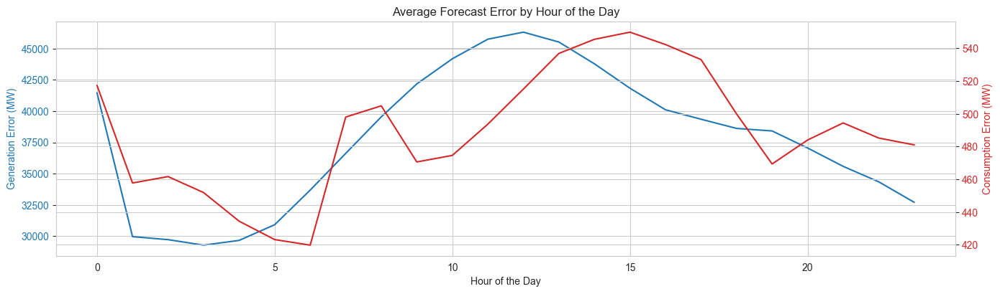

In [ ]:
# Extract time components
df_analysis['hour'] =  df_analysis['start_date'].dt.hour
df_analysis['day'] =   df_analysis['start_date'].dt.dayofweek
df_analysis['month'] = df_analysis['start_date'].dt.month


#  Group by hour to analyze daily trends
df_hourly = df_analysis.groupby('hour').agg({
    'generation_absolute_error': 'mean',
    'consumption_absolute_error': 'mean'
}).reset_index()

# Create dual-axis plot
fig, ax1 = plt.subplots(figsize=(14, 4))

# Left y-axis (Generation Error)
ax1.set_xlabel("Hour of the Day")
ax1.set_ylabel("Generation Error (MW)", color='tab:blue')
ax1.plot(df_hourly['hour'], df_hourly['generation_absolute_error'], label="Generation Error", color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Right y-axis (Consumption Error)
ax2 = ax1.twinx()
ax2.set_ylabel("Consumption Error (MW)", color='tab:red')
ax2.plot(df_hourly['hour'], df_hourly['consumption_absolute_error'], label="Consumption Error", color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')

fig.tight_layout()
plt.title("Average Forecast Error by Hour of the Day")
plt.show()


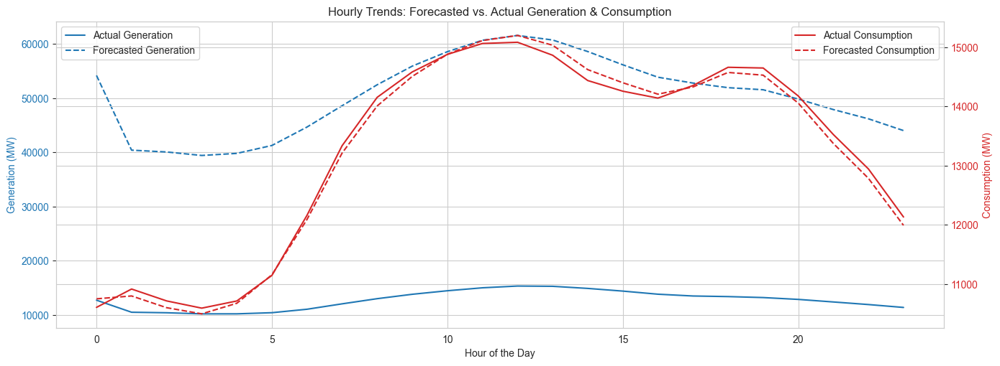

In [ ]:
# Group by hour of the day to observe daily patterns
df_hourly = df_analysis.groupby('hour').agg({
    'total_mwh_forecasted_gen': 'mean',
    'actual_total_generation': 'mean',
    'total_grid_load_mwh_forecasted_consum': 'mean',
    'total_grid_load_actual_consum': 'mean'
}).reset_index()

# Create dual-axis plot
fig, ax1 = plt.subplots(figsize=(14, 5))

# Left y-axis (Generation)
ax1.set_xlabel("Hour of the Day")
ax1.set_ylabel("Generation (MW)", color='tab:blue')
ax1.plot(df_hourly['hour'], df_hourly['actual_total_generation'], label="Actual Generation", color='tab:blue', linestyle='-')
ax1.plot(df_hourly['hour'], df_hourly['total_mwh_forecasted_gen'], label="Forecasted Generation", color='tab:blue', linestyle='dashed')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Right y-axis (Consumption)
ax2 = ax1.twinx()
ax2.set_ylabel("Consumption (MW)", color='tab:red')
ax2.plot(df_hourly['hour'], df_hourly['total_grid_load_actual_consum'], label="Actual Consumption", color='tab:red', linestyle='-')
ax2.plot(df_hourly['hour'], df_hourly['total_grid_load_mwh_forecasted_consum'], label="Forecasted Consumption", color='tab:red', linestyle='dashed')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Titles & Legends
fig.tight_layout()
plt.title("Hourly Trends: Forecasted vs. Actual Generation & Consumption")
ax1.legend(loc="upper left", bbox_to_anchor=(0, 1))
ax2.legend(loc="upper right", bbox_to_anchor=(1, 1))

plt.show()


In [ ]:
# Define actual vs. forecasted column pairs
forecast_pairs = {
    'Total Grid Load': ('total_grid_load_actual_consum', 'total_grid_load_mwh_forecasted_consum'),
    'Residual Load': ('residual_load_actual_consum', 'residual_load_mwh_forecasted_consum'),
    'Total Generation': (['biomass_actual_gen', 'fossil_gas_actual_gen', 'hard_coal_actual_gen',
                          'hydro_pumped_storage_actual_gen', 'hydropower_actual_gen', 'lignite_actual_gen',
                          'nuclear_actual_gen', 'other_conventional_actual_gen', 'other_renewable_actual_gen',
                          'photovoltaics_actual_gen', 'wind_offshore_actual_gen', 'wind_onshore_actual_gen'],
                         'total_mwh_forecasted_gen'),
    'Renewable Generation': (['photovoltaics_actual_gen', 'wind_offshore_actual_gen', 'wind_onshore_actual_gen'],
                             'photovoltaics_and_wind_mwh_forecasted_gen'),
    'Wind Offshore': ('wind_offshore_actual_gen', 'wind_offshore_mwh_forecasted_gen'),
    'Wind Onshore': ('wind_onshore_actual_gen', 'wind_onshore_mwh_forecasted_gen'),
    'Solar (Photovoltaics)': ('photovoltaics_actual_gen', 'photovoltaics_mwh_forecasted_gen')
}

df = df_optimize_merged.copy()

# Compute correlation and error metrics
results = []
for key, (actual_col, forecast_col) in forecast_pairs.items():
    if isinstance(actual_col, list):  # If actual values are multiple columns (e.g., total generation)
        df['actual_sum'] = df[actual_col].sum(axis=1)
        actual_col = 'actual_sum'

    df['error'] = df[forecast_col] - df[actual_col]
    df['absolute_error'] = df['error'].abs()
    df['percentage_error'] = df['absolute_error'] / df[actual_col].replace(0, np.nan) * 100

    correlation = df[[actual_col, forecast_col]].corr().iloc[0, 1]
    mae = df['absolute_error'].mean()
    mape = df['percentage_error'].mean()

    results.append({'Metric': key, 'Correlation': correlation, 'MAE': mae, 'MAPE': mape})

# Convert results to DataFrame
forecast_evaluation = pd.DataFrame(results)
print(forecast_evaluation)


                  Metric  Correlation           MAE        MAPE
0        Total Grid Load     0.951141    507.205597    4.527412
1          Residual Load     0.967368    825.429016   27.102823
2       Total Generation     0.865695  40130.664062  315.816162
3   Renewable Generation     0.958671    825.509338   11.689972
4          Wind Offshore     0.880697    187.347351   33.970726
5           Wind Onshore     0.980679    701.693298   12.891038
6  Solar (Photovoltaics)     0.995494     46.346767   81.845894


### 2.4 How do balancing reserves and TSO costs impact electricity prices?

In [ ]:
# df_tso_costs_monthly_pivot.isnull().mean() * 100
# df_tso_costs_mo
# df_merged.isnull().mean() * 100

In [ ]:
# Selecting relevant columns
balancing_tso_columns = [
    # 'day_ahead_price_€/MWh',
    'activated_energy_up_autofreq_autofreq_mwh',
    'activated_energy_down_autofreq_autofreq_mwh',
    'procured_reserve_up_autofreq_mw',
    'procured_reserve_down_autofreq_mw',
    'procured_price_up_autofreq_€/mwh',
    'procured_price_down_autofreq_€/mwh',
    'balancing_services_€_tso_costs',
    'countertrading_€_tso_costs',
    'network_security_of_the_tsos_€_tso_costs'
]

bal_tso_price_df = df_optimize_merged[balancing_tso_columns + price_cols].copy()
bal_tso_price_df.isnull().mean() * 100

activated_energy_up_autofreq_autofreq_mwh       0.000000
activated_energy_down_autofreq_autofreq_mwh     0.000000
procured_reserve_up_autofreq_mw                 0.000000
procured_reserve_down_autofreq_mw               0.000000
procured_price_up_autofreq_€/mwh                0.000000
procured_price_down_autofreq_€/mwh              0.000000
balancing_services_€_tso_costs                 57.169743
countertrading_€_tso_costs                     57.112712
network_security_of_the_tsos_€_tso_costs       57.112712
dtype: float64

In [ ]:
print(price_cols)

[]


In [ ]:
# Select only numeric columns
numeric_cols = bal_tso_price_df.select_dtypes(include=['number']).columns

# Compute correlation matrix
correlation_matrix = bal_tso_price_df[numeric_cols].corr()
# correlation_matrix = bal_tso_price_df.select_dtypes(include=['number']).columns.corr

# Select correlation of electricity prices with other features
bal_tso_price_corr = correlation_matrix.filter(price_cols).drop(
    index=price_cols, errors='ignore')

# Get the top correlations
top_bal_tso_price_corr = bal_tso_price_corr.abs().mean(axis=1).sort_values(ascending=False)

# Display top correlated features
print(top_bal_tso_price_corr.head(20))

activated_energy_up_autofreq_autofreq_mwh     NaN
activated_energy_down_autofreq_autofreq_mwh   NaN
procured_reserve_up_autofreq_mw               NaN
procured_reserve_down_autofreq_mw             NaN
procured_price_up_autofreq_€/mwh              NaN
procured_price_down_autofreq_€/mwh            NaN
balancing_services_€_tso_costs                NaN
countertrading_€_tso_costs                    NaN
network_security_of_the_tsos_€_tso_costs      NaN
dtype: float64


In [ ]:
bal_tso_price_corr

""
activated_energy_up_autofreq_autofreq_mwh
activated_energy_down_autofreq_autofreq_mwh
procured_reserve_up_autofreq_mw
procured_reserve_down_autofreq_mw
procured_price_up_autofreq_€/mwh
procured_price_down_autofreq_€/mwh
balancing_services_€_tso_costs
countertrading_€_tso_costs
network_security_of_the_tsos_€_tso_costs


In [ ]:
import pandas as pd
import statsmodels.api as sm

# Selecting relevant columns
price_columns = ['germany/luxembourg_€/mwh', 'france_€/mwh', 'netherlands_€/mwh', 'belgium_€/mwh']
reserve_columns = ['procured_reserve_down_autofreq_mw', 'procured_reserve_up_autofreq_mw', 
                   'volume_procured_down_manualfreq_mw', 'volume_procured_up_manualfreq_mw', 
                   ]
tso_cost_columns = ['balancing_services_€_tso_costs', 'network_security_of_the_tsos_€_tso_costs', 
                    'countertrading_€_tso_costs']

# Compute correlation matrix
# correlation_df = df_optimize_merged[price_columns + reserve_columns + tso_cost_columns].corr()
# correlation_df

In [ ]:
# Regression Analysis (Germany/Luxembourg Price as Example)
X = df_optimize_merged[reserve_columns + tso_cost_columns]  # Independent variables
y = df_optimize_merged['germany/luxembourg_€/mwh']  # Dependent variable (Electricity Price)

X = sm.add_constant(X)  # Add intercept for regression
model = sm.OLS(y, X, missing='drop').fit()

print(model.summary())  # Display regression results

                               OLS Regression Results                               
Dep. Variable:     germany/luxembourg_€/mwh   R-squared:                       0.864
Model:                                  OLS   Adj. R-squared:                  0.864
Method:                       Least Squares   F-statistic:                 3.261e+05
Date:                      Mon, 24 Mar 2025   Prob (F-statistic):               0.00
Time:                              23:35:39   Log-Likelihood:            -1.1220e+06
No. Observations:                    360480   AIC:                         2.244e+06
Df Residuals:                        360472   BIC:                         2.244e+06
Df Model:                                 7                                         
Covariance Type:                  nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
# Independent variables (same for all regressions)
X = df_optimize_merged[reserve_columns + tso_cost_columns]
X = sm.add_constant(X)  # Add intercept

# Run regression for each electricity price column
results = {}
for price_col in price_columns:
    y = df_optimize_merged[price_col]  # Dependent variable
    model = sm.OLS(y, X, missing='drop').fit()  # Fit model
    results[price_col] = model.summary()  # Store results

# Display summary for all price regions
for region, summary in results.items():
    print(f"### Regression Results for {region} ###")
    print(summary)
    print("\n" + "="*80 + "\n")


### Regression Results for germany/luxembourg_€/mwh ###
                               OLS Regression Results                               
Dep. Variable:     germany/luxembourg_€/mwh   R-squared:                       0.864
Model:                                  OLS   Adj. R-squared:                  0.864
Method:                       Least Squares   F-statistic:                 3.261e+05
Date:                      Mon, 24 Mar 2025   Prob (F-statistic):               0.00
Time:                              23:35:39   Log-Likelihood:            -1.1220e+06
No. Observations:                    360480   AIC:                         2.244e+06
Df Residuals:                        360472   BIC:                         2.244e+06
Df Model:                                 7                                         
Covariance Type:                  nonrobust                                         
                                               coef    std err          t      P>|t|      [0.0

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Define the independent variables (excluding target variable)
# X = df_merged[['balancing_reserves', 'TSO_costs', 'other_predictors']]  # Replace with actual column names


X.replace([np.inf, -np.inf], np.nan, inplace=True)  # Replace inf with NaN
X = X.dropna()  # Drop rows where NaN appears


# Compute VIF for each variable
vif_data = pd.DataFrame()
vif_data['Variable'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


                                   Variable          VIF
0                                     const   345.571758
1         procured_reserve_down_autofreq_mw  3375.462165
2           procured_reserve_up_autofreq_mw  2112.501451
3        volume_procured_down_manualfreq_mw  1160.963473
4          volume_procured_up_manualfreq_mw  2146.986949
5            balancing_services_€_tso_costs     6.050911
6  network_security_of_the_tsos_€_tso_costs    40.648525
7                countertrading_€_tso_costs    32.131058


In [ ]:
from statsmodels.stats.diagnostic import het_breuschpagan
import statsmodels.api as sm

from statsmodels.stats.stattools import durbin_watson

# Get residuals from the existing regression model
residuals = model.resid  # Replace 'model' with your regression model object

# Perform Durbin-Watson test
dw_stat = durbin_watson(residuals)
print(f"Durbin-Watson Statistic: {dw_stat}")


# Perform Breusch-Pagan test
_, pval, _, _ = het_breuschpagan(residuals, model.model.exog)

if pval < 0.05:
    print("Heteroscedasticity detected! Consider using robust standard errors.")
else:
    print("No heteroscedasticity detected.")


Durbin-Watson Statistic: 0.06479946489303898
Heteroscedasticity detected! Consider using robust standard errors.


## 3. Price & Consumption Impact Analysis

### 3.1 How do scheduled commercial exchanges influence price fluctuations?

In [ ]:
# df_optimize_merged.columns.to_list()

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



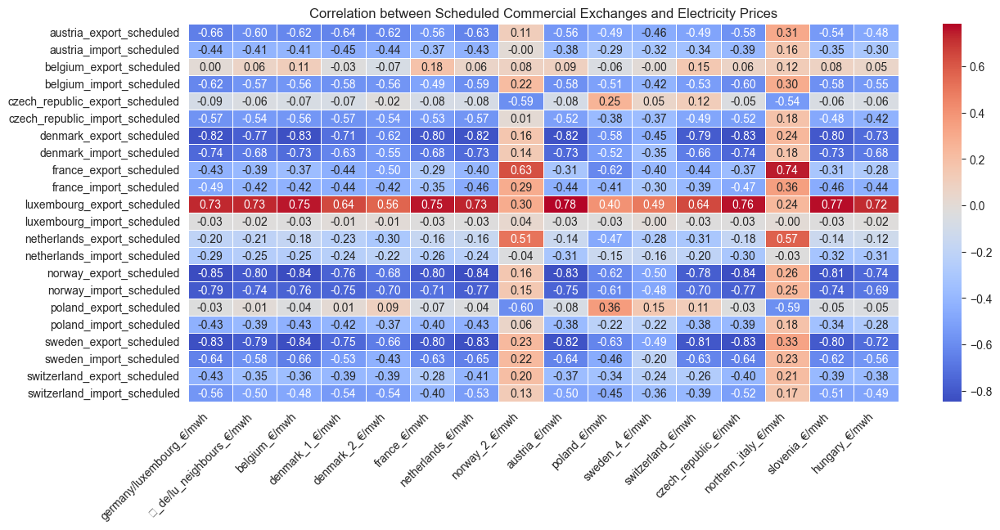

germany/luxembourg_€/mwh  norway_export_scheduled     0.848829
belgium_€/mwh             norway_export_scheduled     0.842808
czech_republic_€/mwh      norway_export_scheduled     0.840540
netherlands_€/mwh         norway_export_scheduled     0.840367
belgium_€/mwh             sweden_export_scheduled     0.838367
                          denmark_export_scheduled    0.832930
netherlands_€/mwh         sweden_export_scheduled     0.831949
czech_republic_€/mwh      denmark_export_scheduled    0.830917
germany/luxembourg_€/mwh  sweden_export_scheduled     0.830538
austria_€/mwh             norway_export_scheduled     0.830294
czech_republic_€/mwh      sweden_export_scheduled     0.829999
austria_€/mwh             denmark_export_scheduled    0.824295
netherlands_€/mwh         denmark_export_scheduled    0.821081
germany/luxembourg_€/mwh  denmark_export_scheduled    0.820311
austria_€/mwh             sweden_export_scheduled     0.818473
slovenia_€/mwh            norway_export_scheduled     0

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define scheduled commercial exchange columns
scheduled_cols = [
    'austria_export_scheduled', 'austria_import_scheduled',
    'belgium_export_scheduled', 'belgium_import_scheduled',
    'czech_republic_export_scheduled', 'czech_republic_import_scheduled',
    'denmark_export_scheduled', 'denmark_import_scheduled',
    'france_export_scheduled', 'france_import_scheduled',
    'luxembourg_export_scheduled', 'luxembourg_import_scheduled',
    'netherlands_export_scheduled', 'netherlands_import_scheduled',
    'norway_export_scheduled', 'norway_import_scheduled',
    'poland_export_scheduled', 'poland_import_scheduled',
    'sweden_export_scheduled', 'sweden_import_scheduled',
    'switzerland_export_scheduled', 'switzerland_import_scheduled'
]

# Define electricity price columns
price_cols = [
    'germany/luxembourg_€/mwh', '∅_de/lu_neighbours_€/mwh',
    'belgium_€/mwh', 'denmark_1_€/mwh', 'denmark_2_€/mwh',
    'france_€/mwh', 'netherlands_€/mwh', 'norway_2_€/mwh',
    'austria_€/mwh', 'poland_€/mwh', 'sweden_4_€/mwh',
    'switzerland_€/mwh', 'czech_republic_€/mwh',
    'northern_italy_€/mwh', 'slovenia_€/mwh', 'hungary_€/mwh'
]

# Subset the dataframe
df_corr = df_optimize_merged[scheduled_cols + price_cols]

# Drop rows with missing values
df_corr = df_corr.dropna()

# Compute correlation matrix
corr_matrix = df_corr.corr()

# Extract correlations between scheduled commercial exchanges and electricity prices
corr_scheduled_prices = corr_matrix.loc[scheduled_cols, price_cols]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(corr_scheduled_prices, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation between Scheduled Commercial Exchanges and Electricity Prices")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()

# Display the top correlations
corr_scheduled_prices.abs().unstack().sort_values(ascending=False).head(20)


In [ ]:
# import statsmodels.api as sm
# from statsmodels.stats.outliers_influence import variance_inflation_factor
# import numpy as np

# # Define scheduled commercial exchange columns (independent variables)
# scheduled_cols = [
#     'austria_export_scheduled', 'austria_import_scheduled',
#     'belgium_export_scheduled', 'belgium_import_scheduled',
#     'czech_republic_export_scheduled', 'czech_republic_import_scheduled',
#     'denmark_export_scheduled', 'denmark_import_scheduled',
#     'france_export_scheduled', 'france_import_scheduled',
#     'luxembourg_export_scheduled', 'luxembourg_import_scheduled',
#     'netherlands_export_scheduled', 'netherlands_import_scheduled',
#     'norway_export_scheduled', 'norway_import_scheduled',
#     'poland_export_scheduled', 'poland_import_scheduled',
#     'sweden_export_scheduled', 'sweden_import_scheduled',
#     'switzerland_export_scheduled', 'switzerland_import_scheduled'
# ]

# # Define electricity price columns (dependent variables)
# price_cols = [
#     'germany/luxembourg_€/mwh', '∅_de/lu_neighbours_€/mwh',
#     'belgium_€/mwh', 'denmark_1_€/mwh', 'denmark_2_€/mwh',
#     'france_€/mwh', 'netherlands_€/mwh', 'norway_2_€/mwh',
#     'austria_€/mwh', 'poland_€/mwh', 'sweden_4_€/mwh',
#     'switzerland_€/mwh', 'czech_republic_€/mwh',
#     'northern_italy_€/mwh', 'slovenia_€/mwh', 'hungary_€/mwh'
# ]

# # Subset the dataset
# df_reg = df_optimize_merged[scheduled_cols + price_cols].dropna()

# # Run separate regressions for each electricity price column
# results = {}

# for price_col in price_cols:
#     # Define X (independent variables) and Y (dependent variable)
#     X = df_reg[scheduled_cols]
#     y = df_reg[price_col]
    
#     # Add constant term for intercept
#     X = sm.add_constant(X)

#     # Check for multicollinearity using VIF
#     vif_data = pd.DataFrame()
#     vif_data["Variable"] = X.columns
#     vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

#     print(f"\n--- VIF for {price_col} ---")
#     print(vif_data)

#     # Fit the regression model
#     model = sm.OLS(y, X).fit()
    
#     # Store results
#     results[price_col] = model

#     # Print summary
#     print(f"\n--- Regression Results for {price_col} ---")
#     print(model.summary())

#     # Check for heteroscedasticity using Breusch-Pagan test
#     _, pval, _, _ = sm.stats.diagnostic.het_breuschpagan(model.resid, model.model.exog)
#     print(f"Breusch-Pagan Test p-value: {pval:.4f}")
#     if pval < 0.05:
#         print("⚠️ Heteroscedasticity detected! Consider using robust standard errors.\n")


In [ ]:
# # Subset the dataset and drop NaN values
# df_reg = df_optimize_merged[scheduled_cols + price_cols].dropna()

# # Run separate regressions for each electricity price column
# results = {}

# for price_col in price_cols:
#     # Define X (independent variables) and Y (dependent variable)
#     X = df_reg[scheduled_cols]
#     y = df_reg[price_col]
    
#     # Add constant term for intercept
#     X = sm.add_constant(X)

#     # Check for multicollinearity using VIF
#     vif_data = pd.DataFrame()
#     vif_data["Variable"] = X.columns
#     vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

#     print(f"\n--- VIF for {price_col} ---")
#     print(vif_data)

#     # Fit the regression model
#     model = sm.OLS(y, X).fit()

#     # Check for heteroscedasticity using Breusch-Pagan test
#     _, pval, _, _ = sm.stats.diagnostic.het_breuschpagan(model.resid, model.model.exog)

#     # If heteroscedasticity is detected, use robust standard errors
#     if pval < 0.05:
#         print(f"⚠️ Heteroscedasticity detected in {price_col}. Using robust standard errors.\n")
#         model = sm.OLS(y, X).fit(cov_type='HC3')  # HC3 robust standard errors

#     # Store results
#     results[price_col] = model

#     # Print summary
#     print(f"\n--- Regression Results for {price_col} ---")
#     print(model.summary())

# # access individual results: results['germany/luxembourg_€/mwh']


### 3.2 What is the impact of cross-border physical flows on electricity prices?


/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.

/Users/okpo/Desktop/Onward/dynamic_rhythm_env/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8709 (\N{EMPTY SET}) missing from font(s) Arial.



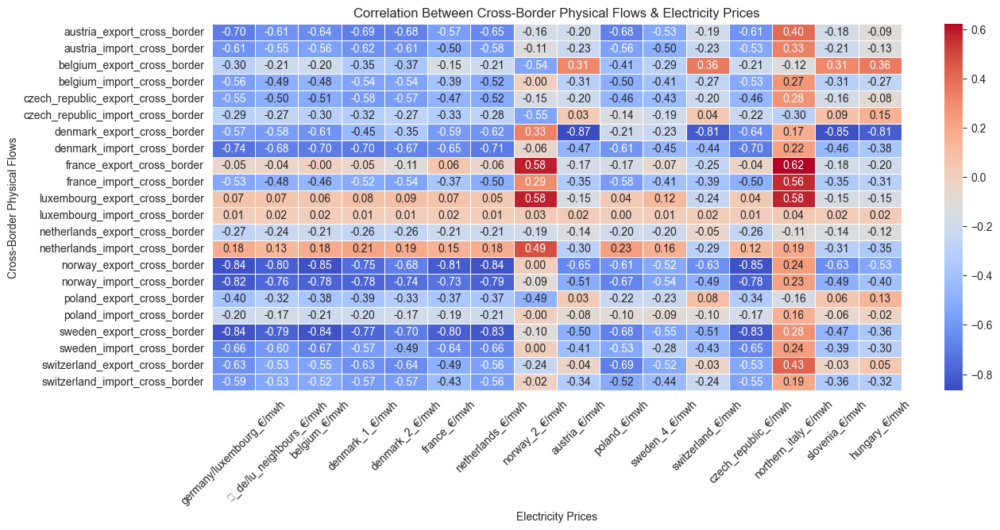

In [ ]:
# Select relevant columns
cross_border_cols = [
    'austria_export_cross_border', 'austria_import_cross_border',
    'belgium_export_cross_border', 'belgium_import_cross_border',
    'czech_republic_export_cross_border', 'czech_republic_import_cross_border',
    'denmark_export_cross_border', 'denmark_import_cross_border',
    'france_export_cross_border', 'france_import_cross_border',
    'luxembourg_export_cross_border', 'luxembourg_import_cross_border',
    'netherlands_export_cross_border', 'netherlands_import_cross_border',
    'norway_export_cross_border', 'norway_import_cross_border',
    'poland_export_cross_border', 'poland_import_cross_border',
    'sweden_export_cross_border', 'sweden_import_cross_border',
    'switzerland_export_cross_border', 'switzerland_import_cross_border'
]

# Subset the dataframe
df_corr = df_optimize_merged[cross_border_cols + price_cols].corr()

# Extract correlations between physical flows and electricity prices
df_corr_selected = df_corr.loc[cross_border_cols, price_cols]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(df_corr_selected, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)
plt.title("Correlation Between Cross-Border Physical Flows & Electricity Prices")
plt.xlabel("Electricity Prices")
plt.ylabel("Cross-Border Physical Flows")
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Save as Parquet
df_optimize_merged.to_parquet('../datasets/processed/df_optimized_merged.parquet', compression='snappy')